In [13]:
import pandas as pd
import tornado
import setuptools
import scenicplus
import pycisTopic
import os

print(f"Pandas version: {pd.__version__}")   # Goal: < 2.0.0 (e.g., 1.5.3)
print(f"Tornado version: {tornado.version}") # Goal: 6.4
print("Success! Environment is stable.")

Pandas version: 1.5.0
Tornado version: 6.4
Success! Environment is stable.


In [14]:
# ── Paths — update HOME if needed ────────────────────────────────────────────
HOME          = os.path.expanduser("~")
WORK_DIR      = f"{HOME}/Downloads/Seurat_scATAC-seq"
INPUT_DIR     = f"{WORK_DIR}/scenicplus_input"
OUT_DIR       = f"{WORK_DIR}/scenicplus_output"
FRAGMENT_FILE = f"{WORK_DIR}/fragments.tsv.gz"

# cistarget databases — download before running Block 3
# URL: https://resources.aertslab.org/cistarget/databases/mus_musculus/mm10/
# Files needed (pick one rankings + one scores):
#   mc_v10_clust_nr_motifs-mm10-500bp-upstream-10species.rankings.feather
#   mc_v10_clust_nr_motifs-mm10-500bp-upstream-10species.scores.feather
#   motifs-v10-nr.mgi-m0.001-o0.0.tbl


for d in [OUT_DIR,
          f"{OUT_DIR}/scRNA",
          f"{OUT_DIR}/scATAC/pseudobulk",
          f"{OUT_DIR}/scATAC/macs3_peaks",
          f"{OUT_DIR}/scATAC/models",
          f"{OUT_DIR}/scATAC/qc",
          f"{OUT_DIR}/scenicplus/motif_enrichment"]:
    os.makedirs(d, exist_ok=True)

print("Paths OK")
print(f"Fragment file exists: {os.path.exists(FRAGMENT_FILE)}")

Paths OK
Fragment file exists: True


In [15]:
import os

BASE_DIR = os.path.expanduser("~/Downloads/Seurat_scATAC-seq")
OUT_DIR  = f"{BASE_DIR}/scenicplus_output"
# We'll save everything new with a _v2 suffix to keep it clean
SC_OUT   = f"{OUT_DIR}/scenicplus"

In [8]:
import scanpy as sc
adata = sc.read_h5ad(f"{OUT_DIR}/scRNA/adata.h5ad")
# SCENIC+ requires the raw counts to be easily accessible
if adata.raw is None:
    adata.raw = adata
print(f"RNA loaded: {adata.n_obs} cells, {adata.n_vars} genes")

RNA loaded: 21149 cells, 56884 genes


In [9]:
# Check what adata.X actually contains
print(adata.X[:5, :5])          # look at the values
print(adata.X.max())             # raw counts = large integers; normalized = small floats
print("raw" in adata.layers)    # SCENICplus may have moved raw to adata.raw or a layer

  (1, 0)	0.23819909168623105
  (2, 0)	0.46041211016675854
  (3, 0)	0.5795342100202735
7.341267799645458
False


In [10]:
# ── 2c. Cell metadata ─────────────────────────────────────────────────────
cell_data = pd.read_csv(f"{INPUT_DIR}/atac_metadata.csv", index_col=0)
cell_data['cell_type'] = cell_data['cell_type'].astype(str)
cell_data['sample_id'] = "male_cortex"

# CRITICAL for non-multiome: strip -1 suffix from barcodes if present
# so they match the fragment file barcodes exactly
# Check first barcode in fragment file:
import gzip
with gzip.open(FRAGMENT_FILE, 'rt') as f:
    for line in f:
        if not line.startswith('#'):
            first_frag_bc = line.split('\t')[3]
            break
print(f"First fragment barcode: {first_frag_bc}")
print(f"First cell barcode in metadata: {cell_data.index[0]}")
# If they differ (e.g. fragment has no -1), strip from metadata:
# cell_data.index = cell_data.index.str.replace('-1$', '', regex=True)

print(f"ATAC cells: {len(cell_data)}")
print(cell_data['cell_type'].value_counts())

First fragment barcode: GTAGGAGAGTTACCAC-3
First cell barcode in metadata: AAACGAAAGAAATTCG-2
ATAC cells: 13036
Layer 4 sensory neurons                  2567
Layer 5a IT neurons                      2559
Layer 5/6 IT neurons                     1231
Oligodendrocytes                         1204
Layer 6a corticothalamic neurons         1155
Astrocytes                                902
Endothelial cells                         545
PV+ interneurons                          483
VIP+ interneurons                         471
Microglia                                 393
SST+ interneurons                         374
Deep-layer extratelencephalic neurons     371
Oligodendrocyte precursor cells           227
Layer 5b PT neurons                       190
Meningeal fibroblasts                     175
Layer 2/3 IT neurons                      109
Layer 6b neurons                           78
Corticospinal neurons (Type II)             2
Name: cell_type, dtype: int64


In [7]:
from pycisTopic.cistopic_class import create_cistopic_object_from_fragments
import pandas as pd

# Use the metadata from your input folder
cell_data = pd.read_csv(f"{BASE_DIR}/scenicplus_input/atac_metadata.csv", index_col=0)

cistopic_obj = create_cistopic_object_from_fragments(
    path_to_fragments = f"{BASE_DIR}/fragments.tsv.gz",
    path_to_regions   = f"{OUT_DIR}/scATAC/consensus_regions.bed", # Your existing MACS3 bed
    path_to_blacklist = f"{OUT_DIR}/mm10-blacklist.v2.bed.gz",
    valid_bc          = list(cell_data.index),
    project           = "male_cortex",
    split_pattern     = '-'
)
cistopic_obj.add_cell_data(cell_data)

2026-06-18 15:53:07,594 cisTopic     INFO     Reading data for male_cortex
2026-06-18 16:01:44,288 cisTopic     INFO     valid_bc provided, selecting barcodes!
2026-06-18 16:01:59,305 cisTopic     INFO     Counting number of unique fragments (Unique_nr_frag)
2026-06-18 16:02:36,544 cisTopic     INFO     Counting fragments in regions


join: Strand data from other will be added as strand data to self.
If this is undesired use the flag apply_strand_suffix=False.
To turn off the warning set apply_strand_suffix to True or False.


2026-06-18 16:04:01,913 cisTopic     INFO     Creating fragment matrix


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/pycisTopic/cistopic_class.py:886: PerformanceWarning: The following operation may generate 9838060624 cells in the resulting pandas object.
  .unstack(level="Name", fill_value=0)


2026-06-18 16:05:48,177 cisTopic     INFO     Converting fragment matrix to sparse matrix
2026-06-18 16:06:29,034 cisTopic     INFO     Removing blacklisted regions
2026-06-18 16:06:30,081 cisTopic     INFO     Creating CistopicObject
2026-06-18 16:06:32,356 cisTopic     INFO     Done!
Columns ['sample_id', 'barcode'] will be overwritten


In [16]:
import pickle

# Save cistopic_obj as-is before restarting
with open(f"{OUT_DIR}/scATAC/cistopic_obj_v3.pkl", 'wb') as f:
    pickle.dump(cistopic_obj, f)
print("cistopic_obj_v3.pkl saved.")

cistopic_obj_v3.pkl saved.


In [ ]:
##### Restart the kernel then run

In [4]:
import os, pickle
from pycisTopic.lda_models import run_cgs_models

# Reload the saved object
with open(f"{OUT_DIR}/scATAC/cistopic_obj_v3.pkl", 'rb') as f:
    cistopic_obj = pickle.load(f)
print("Loaded cistopic_obj_v3.pkl —", cistopic_obj)

Loaded cistopic_obj_v3.pkl — CistopicObject from project male_cortex with n_cells × n_regions = 13036 × 754684


In [9]:
import pickle, os
from pycisTopic.lda_models import run_cgs_models

os.makedirs(f"{OUT_DIR}/scATAC/models_2/", exist_ok=True)

for n_topics in [15, 20, 25, 30, 35, 40]:
    print(f"Starting {n_topics} topics...")
    models = run_cgs_models(
        cistopic_obj,
        n_topics       = [n_topics],
        n_cpu          = 1,
        n_iter         = 500,
        random_state   = 42,
        alpha          = 50,
        alpha_by_topic = True,
        eta            = 0.1,
        eta_by_topic   = False,
        save_path      = f"{OUT_DIR}/scATAC/models_2/"
    )
    with open(f"{OUT_DIR}/scATAC/models_2/model_{n_topics}topics.pkl", 'wb') as f:
        pickle.dump(models[0], f)
    print(f"  → model_{n_topics}topics.pkl saved ✓")

Starting 15 topics...


2026-06-22 08:29:15,841	INFO worker.py:1724 -- Started a local Ray instance.


(run_cgs_model pid=14910) 2026-06-22 08:29:17,128 cisTopic     INFO     Running model with 15 topics
(run_cgs_model pid=14910) 2026-06-22 12:10:40,319 cisTopic     INFO     Model with 15 topics done!
(run_cgs_model pid=14910) 2026-06-22 12:10:40,319 cisTopic     INFO     Saving model with 15 topics at /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scATAC/models_2/
  → model_15topics.pkl saved ✓
Starting 20 topics...


2026-06-22 12:10:44,125	INFO worker.py:1724 -- Started a local Ray instance.


(run_cgs_model pid=16124) 2026-06-22 12:10:45,718 cisTopic     INFO     Running model with 20 topics
(run_cgs_model pid=16124) 2026-06-22 17:28:14,145 cisTopic     INFO     Model with 20 topics done!
(run_cgs_model pid=16124) 2026-06-22 17:28:14,145 cisTopic     INFO     Saving model with 20 topics at /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scATAC/models_2/
  → model_20topics.pkl saved ✓
Starting 25 topics...


2026-06-22 17:28:18,349	INFO worker.py:1724 -- Started a local Ray instance.


(run_cgs_model pid=18228) 2026-06-22 17:28:20,010 cisTopic     INFO     Running model with 25 topics
(run_cgs_model pid=18228) 2026-06-22 23:56:06,073 cisTopic     INFO     Model with 25 topics done!
(run_cgs_model pid=18228) 2026-06-22 23:56:06,074 cisTopic     INFO     Saving model with 25 topics at /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scATAC/models_2/
  → model_25topics.pkl saved ✓
Starting 30 topics...


2026-06-22 23:56:10,210	INFO worker.py:1724 -- Started a local Ray instance.


(run_cgs_model pid=20866) 2026-06-22 23:56:11,831 cisTopic     INFO     Running model with 30 topics
(run_cgs_model pid=20866) 2026-06-23 07:19:45,624 cisTopic     INFO     Model with 30 topics done!
(run_cgs_model pid=20866) 2026-06-23 07:19:45,624 cisTopic     INFO     Saving model with 30 topics at /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scATAC/models_2/
  → model_30topics.pkl saved ✓
Starting 35 topics...


2026-06-23 07:19:49,781	INFO worker.py:1724 -- Started a local Ray instance.


(run_cgs_model pid=23925) 2026-06-23 07:19:51,377 cisTopic     INFO     Running model with 35 topics
(run_cgs_model pid=23925) 2026-06-23 15:46:45,061 cisTopic     INFO     Model with 35 topics done!
(run_cgs_model pid=23925) 2026-06-23 15:46:45,062 cisTopic     INFO     Saving model with 35 topics at /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scATAC/models_2/
  → model_35topics.pkl saved ✓
Starting 40 topics...


2026-06-23 15:46:49,729	INFO worker.py:1724 -- Started a local Ray instance.


(run_cgs_model pid=27053) 2026-06-23 15:46:53,229 cisTopic     INFO     Running model with 40 topics
(run_cgs_model pid=27053) 2026-06-24 01:14:56,214 cisTopic     INFO     Model with 40 topics done!
(run_cgs_model pid=27053) 2026-06-24 01:14:56,214 cisTopic     INFO     Saving model with 40 topics at /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scATAC/models_2/
  → model_40topics.pkl saved ✓


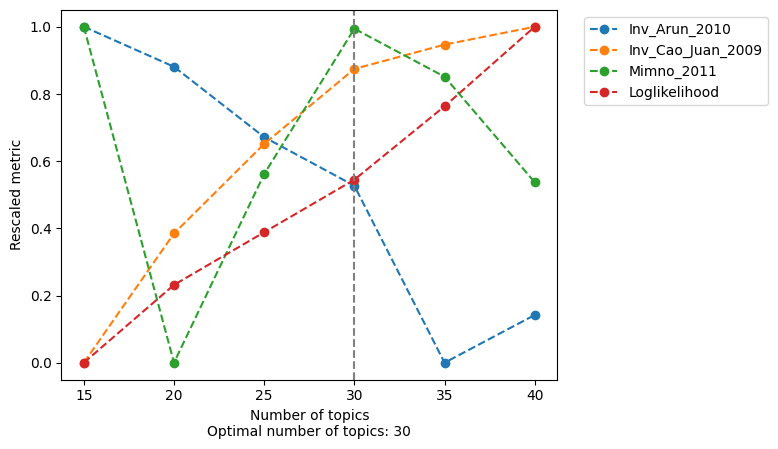

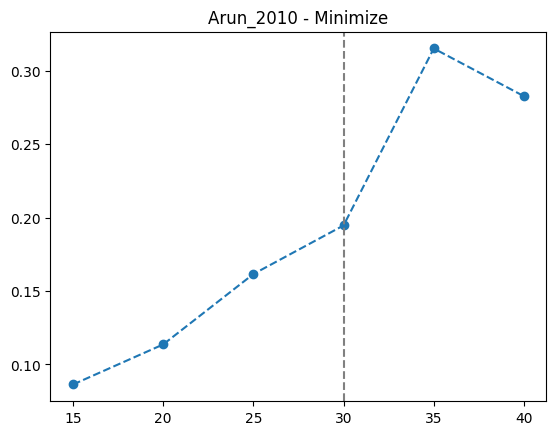

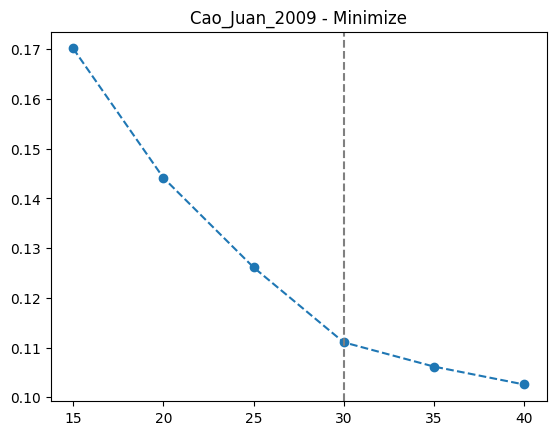

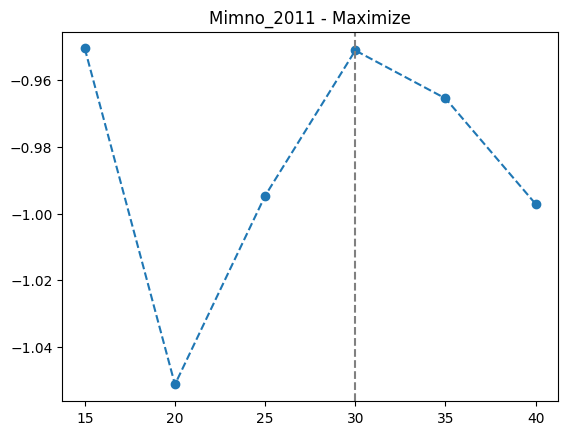

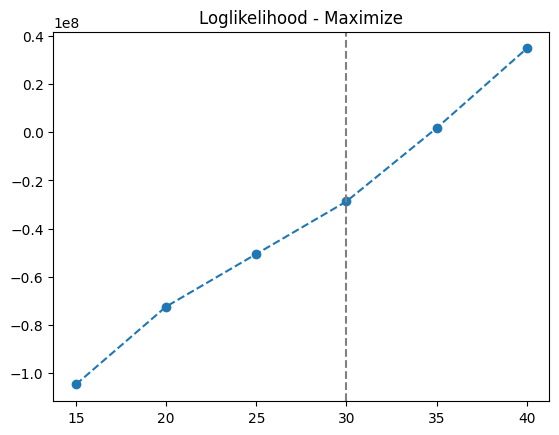

In [12]:
import pickle
import os
from pycisTopic.lda_models import evaluate_models
import matplotlib.pyplot as plt

OUT_DIR = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output"

# Load all saved models
topic_numbers = [15, 20, 25, 30, 35, 40]
models = []
for n in topic_numbers:
    with open(f"{OUT_DIR}/scATAC/models_2/model_{n}topics.pkl", 'rb') as f:
        models.append(pickle.load(f))

# Evaluate and plot
evaluate_models(
    models,
    select_model = None,
    return_model = False,
    metrics      = ['Minmo_2011', 'loglikelihood', 'Arun_2010', 'Cao_Juan_2009'],
    plot_metrics = True,
    save         = f"{OUT_DIR}/scATAC/models_2/model_selection_full.pdf"
)

In [13]:
# Set this to whatever the plots tell you
BEST_N = 30

best_model = next(m for m in models if m.n_topic == BEST_N)

# Load the cistopic object
with open(f"{OUT_DIR}/scATAC/cistopic_obj_v3.pkl", 'rb') as f:
    cistopic_obj = pickle.load(f)

cistopic_obj.add_LDA_model(best_model)

# Save with LDA embedded — this is your new base object
with open(f"{OUT_DIR}/scATAC/cistopic_obj_lda_final.pkl", 'wb') as f:
    pickle.dump(cistopic_obj, f)
print("cistopic_obj_lda_final.pkl saved.")

cistopic_obj_lda_final.pkl saved.


In [5]:
# # Step 3: Save this as the definitive object
# with open(f"{OUT_DIR}/scATAC/cistopic_obj_lda_fixed.pkl", 'wb') as f:
#     pickle.dump(cistopic_obj, f)

2026-05-01 16:26:44,587	INFO worker.py:1724 -- Started a local Ray instance.


(run_cgs_model pid=36528) 2026-05-01 16:26:46,603 cisTopic     INFO     Running model with 30 topics
(run_cgs_model pid=36528) 2026-05-01 23:43:25,184 cisTopic     INFO     Model with 30 topics done!


In [14]:
from pycisTopic.topic_binarization import binarize_topics

# 1. Binarize topics (defines which peaks are 'in' a topic)
region_bin_otsu = binarize_topics(cistopic_obj, method='otsu')

# Save these results too!
with open(f"{OUT_DIR}/scATAC/region_bin_otsu_v3_final.pkl", 'wb') as f:
    pickle.dump(region_bin_otsu, f)

<Figure size 640x480 with 0 Axes>

In [15]:
print(type(region_bin_otsu))
print(len(region_bin_otsu))           # should be n_topics (30)
print(list(region_bin_otsu.keys())[:3])  # should show topic names

<class 'dict'>
30
['Topic1', 'Topic2', 'Topic3']


In [ ]:
#### In case of a kernel crash ###
import pickle
import os


import pandas as pd


# 1. Reload the core object
with open(f"{OUT_DIR}/scATAC/cistopic_obj_lda_final.pkl", 'rb') as f:
    cistopic_obj = pickle.load(f)

print("Object loaded. Calculating imputed accessibility...")

In [17]:
from pycisTopic.topic_binarization import binarize_topics
from pycisTopic.diff_features import impute_accessibility, find_diff_features
from pycisTopic.cistopic_class import create_cistopic_object_from_fragments

# 2. Re-calculate imputed accessibility
# Note: This is the memory-intensive part. 
imputed_acc = impute_accessibility(cistopic_obj, scale_factor=10**6)

# 3. Save the imputed accessibility separately
# This saves your RAM in the future because you can load this 
# without re-running the heavy math.
with open(f"{OUT_DIR}/scATAC/imputed_acc_v3_final.pkl", 'wb') as f:
    pickle.dump(imputed_acc, f)

print("Success! Saved.")

2026-06-24 08:31:32,443 cisTopic     INFO     Imputing region accessibility
2026-06-24 08:31:32,444 cisTopic     INFO     Impute region accessibility for regions 0-20000
2026-06-24 08:31:33,152 cisTopic     INFO     Impute region accessibility for regions 20000-40000
2026-06-24 08:31:33,896 cisTopic     INFO     Impute region accessibility for regions 40000-60000
2026-06-24 08:31:34,649 cisTopic     INFO     Impute region accessibility for regions 60000-80000
2026-06-24 08:31:35,370 cisTopic     INFO     Impute region accessibility for regions 80000-100000
2026-06-24 08:31:36,078 cisTopic     INFO     Impute region accessibility for regions 100000-120000
2026-06-24 08:31:36,807 cisTopic     INFO     Impute region accessibility for regions 120000-140000
2026-06-24 08:31:37,566 cisTopic     INFO     Impute region accessibility for regions 140000-160000
2026-06-24 08:31:38,360 cisTopic     INFO     Impute region accessibility for regions 160000-180000
2026-06-24 08:31:39,176 cisTopic     

In [21]:
# Check if the column exists
print("Columns in metadata:", cistopic_obj.cell_data.columns.tolist())

# Check the first few rows
print(cistopic_obj.cell_data.head())

Columns in metadata: ['Unique_nr_frag', 'cisTopic_log_nr_acc', 'cisTopic_log_nr_frag', 'cisTopic_nr_acc', 'cisTopic_nr_frag', 'cell_type', 'genotype', 'sex', 'sample', 'nCount_peaks', 'nFeature_peaks', 'nucleosome_signal', 'TSS.enrichment', 'barcode', 'sample_id']
                                Unique_nr_frag cisTopic_log_nr_acc  \
GCAACCGGTTCCCAAA-4-male_cortex           32761            4.287533   
GCGGAAAGTGATGCGA-4-male_cortex           30767            3.881156   
AAACTGCGTCGAGAAC-2-male_cortex           41161            4.376705   
GACTAGTCAAGTCTCA-2-male_cortex           53243            4.451971   
TTACCCGAGTCGAGCA-4-male_cortex           25613            4.190164   

                               cisTopic_log_nr_frag cisTopic_nr_acc  \
GCAACCGGTTCCCAAA-4-male_cortex             4.329378           19388   
GCGGAAAGTGATGCGA-4-male_cortex             3.894593            7606   
AAACTGCGTCGAGAAC-2-male_cortex             4.403567           23807   
GACTAGTCAAGTCTCA-2-male_cortex

In [22]:
# Verify that 'cell_type' exists and has multiple categories
print(cistopic_obj.cell_data['cell_type'].value_counts())

# Ensure cell names align between the object and the matrix
print(len(set(cistopic_obj.cell_names) & set(imputed_acc.cell_names)))

Series([], Name: cell_type, dtype: int64)
13036


In [23]:
# List all available metadata columns in your AnnData
print(adata.obs.columns)

# Peek at the first few rows to see the values
print(adata.obs.head())

Index(['cell_type', 'genotype', 'sex', 'nCount_RNA', 'nFeature_RNA'], dtype='object')
                            cell_type genotype   sex  nCount_RNA  nFeature_RNA
02_03_86__s2        SST+ interneurons     Ctrl  male       17963          4443
05_18_28__s1     Layer 5/6 IT neurons     Ctrl  male       74360          7845
03_77_92__s2     Layer 5/6 IT neurons     Ctrl  male       17102          4243
01_80_10__s8  Layer 4 sensory neurons     Ctrl  male       25471          4899
04_85_52__s5      Layer 5a IT neurons     Ctrl  male       32482          5772


In [24]:
# Check if the ATAC cell names match the RNA names you just showed me
print(cistopic_obj.cell_names[:5])

['GCAACCGGTTCCCAAA-4-male_cortex', 'GCGGAAAGTGATGCGA-4-male_cortex', 'AAACTGCGTCGAGAAC-2-male_cortex', 'GACTAGTCAAGTCTCA-2-male_cortex', 'TTACCCGAGTCGAGCA-4-male_cortex']


In [25]:
# 1. Reload the clean metadata to start fresh
cell_data = pd.read_csv(f"{INPUT_DIR}/atac_metadata.csv", index_col=0)

# 2. Append the sample suffix to match the LDA object format exactly
# This turns 'barcode-2' into 'barcode-2-male_cortex'
cell_data.index = cell_data.index.astype(str) + "-male_cortex"

# 3. Remove duplicates just in case
cell_data = cell_data[~cell_data.index.duplicated(keep='first')]

# 4. Filter to only the cells present in your LDA object
common_cells = list(set(cistopic_obj.cell_names) & set(cell_data.index))
cell_data = cell_data.loc[common_cells]

print(f"Final matching cell count: {len(cell_data)}")

# 5. Add to the object
cistopic_obj.add_cell_data(cell_data)

# 6. Check the preview again
print(cistopic_obj.cell_data[['cell_type']].head())

Final matching cell count: 13036
Columns ['cell_type', 'sample', 'nFeature_peaks', 'TSS.enrichment', 'genotype', 'sex', 'sample_id', 'barcode', 'nCount_peaks', 'nucleosome_signal'] will be overwritten
                                                            cell_type
GCAACCGGTTCCCAAA-4-male_cortex                   Layer 5/6 IT neurons
GCGGAAAGTGATGCGA-4-male_cortex                      Endothelial cells
AAACTGCGTCGAGAAC-2-male_cortex  Deep-layer extratelencephalic neurons
GACTAGTCAAGTCTCA-2-male_cortex                      SST+ interneurons
TTACCCGAGTCGAGCA-4-male_cortex                       PV+ interneurons


In [26]:
# ════════════════════════════════════════════════════════════════════════════
# BLOCK 2: pycisTopic — ATAC preprocessing
# ════════════════════════════════════════════════════════════════════════════
import pyranges as pr

print("\n=== BLOCK 2: pycisTopic ATAC preprocessing ===")

from pycisTopic.cistopic_class import create_cistopic_object_from_fragments
from pycisTopic.lda_models import run_cgs_models, evaluate_models
from pycisTopic.topic_binarization import binarize_topics
from pycisTopic.diff_features import (impute_accessibility,
                                       normalize_scores,
                                       find_highly_variable_features,
                                       find_diff_features)
from pycisTopic.pseudobulk_peak_calling import export_pseudobulk, peak_calling
from pycisTopic.iterative_peak_calling import get_consensus_peaks
from pycisTopic.qc import compute_qc_stats

# ── 2a. Chromosome sizes (mm10) ────────────────────────────────────────────
# Download locally to avoid network calls during run
chromsizes_path = f"{OUT_DIR}/mm10.chrom.sizes"
if not os.path.exists(chromsizes_path):
    import urllib.request
    urllib.request.urlretrieve(
        "http://hgdownload.cse.ucsc.edu/goldenPath/mm10/bigZips/mm10.chrom.sizes",
        chromsizes_path
    )
chromsizes = pd.read_csv(chromsizes_path, sep='\t', header=None,
                          names=['Chromosome','End'])
chromsizes['Start'] = 0
chromsizes = chromsizes[
    chromsizes['Chromosome'].str.match(r'^chr(\d{1,2}|X|Y)$')
].reset_index(drop=True)
chromsizes = pr.PyRanges(chromsizes[['Chromosome','Start','End']])
print(f"Chromosomes: {len(chromsizes.chromosomes)}")


=== BLOCK 2: pycisTopic ATAC preprocessing ===
Chromosomes: 21


2026-06-24 09:14:03,654 cisTopic     INFO     Calculating mean
2026-06-24 09:14:10,956 cisTopic     INFO     Calculating variance


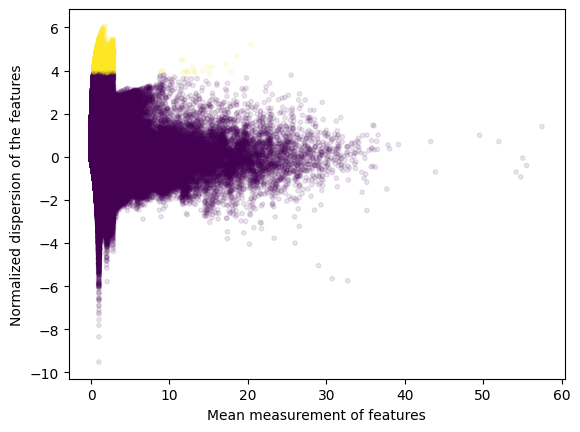

2026-06-24 09:16:25,667 cisTopic     INFO     Done!
Selected 5000 highly variable features.


In [27]:
from pycisTopic.diff_features import find_highly_variable_features

# Use the imputed_acc object you generated earlier
# It contains the actual .mtx attribute the function is looking for
hvf = find_highly_variable_features(imputed_acc, n_top_features=5000)

print(f"Selected {len(hvf)} highly variable features.")

In [28]:
# Normalize imputed accessibility
normalized_acc = normalize_scores(imputed_acc, scale_factor=10**4)

2026-06-24 09:18:21,290 cisTopic     INFO     Normalizing imputed data
2026-06-24 09:21:28,021 cisTopic     INFO     Done!


In [31]:
# Rebuild ct_geno
cistopic_obj.cell_data['ct_geno'] = (
    cistopic_obj.cell_data['cell_type'].astype(str) + '_' +
    cistopic_obj.cell_data['genotype'].astype(str)
)

print(cistopic_obj.cell_data['ct_geno'].value_counts())

Layer 5a IT neurons_KO                        2116
Layer 4 sensory neurons_KO                    2035
Layer 5/6 IT neurons_KO                       1001
Oligodendrocytes_KO                            998
Layer 6a corticothalamic neurons_KO            906
Astrocytes_KO                                  790
Layer 4 sensory neurons_Ctrl                   532
Layer 5a IT neurons_Ctrl                       443
PV+ interneurons_KO                            390
Endothelial cells_KO                           373
VIP+ interneurons_KO                           373
Microglia_KO                                   320
Deep-layer extratelencephalic neurons_KO       299
SST+ interneurons_KO                           287
Layer 6a corticothalamic neurons_Ctrl          249
Layer 5/6 IT neurons_Ctrl                      230
Oligodendrocytes_Ctrl                          206
Oligodendrocyte precursor cells_KO             189
Endothelial cells_Ctrl                         172
Layer 5b PT neurons_KO         

In [32]:
from pycisTopic.diff_features import find_diff_features
import re

ct_geno_vals = cistopic_obj.cell_data['ct_geno'].unique().tolist()
cell_types   = cistopic_obj.cell_data['cell_type'].dropna().unique().tolist()

contrasts = []
for ct in cell_types:
    ko_key   = f"{ct}_KO"
    ctrl_key = f"{ct}_Ctrl"
    if ko_key in ct_geno_vals and ctrl_key in ct_geno_vals:
        contrasts.append([[ko_key], [ctrl_key]])

print(f"Contrasts to test: {len(contrasts)}")
for c in contrasts:
    print(f"  {c[0][0]}  vs  {c[1][0]}")

Contrasts to test: 17
  Layer 5/6 IT neurons_KO  vs  Layer 5/6 IT neurons_Ctrl
  Endothelial cells_KO  vs  Endothelial cells_Ctrl
  Deep-layer extratelencephalic neurons_KO  vs  Deep-layer extratelencephalic neurons_Ctrl
  SST+ interneurons_KO  vs  SST+ interneurons_Ctrl
  PV+ interneurons_KO  vs  PV+ interneurons_Ctrl
  Layer 5a IT neurons_KO  vs  Layer 5a IT neurons_Ctrl
  Layer 4 sensory neurons_KO  vs  Layer 4 sensory neurons_Ctrl
  Layer 6a corticothalamic neurons_KO  vs  Layer 6a corticothalamic neurons_Ctrl
  Microglia_KO  vs  Microglia_Ctrl
  Layer 5b PT neurons_KO  vs  Layer 5b PT neurons_Ctrl
  Oligodendrocyte precursor cells_KO  vs  Oligodendrocyte precursor cells_Ctrl
  VIP+ interneurons_KO  vs  VIP+ interneurons_Ctrl
  Astrocytes_KO  vs  Astrocytes_Ctrl
  Layer 6b neurons_KO  vs  Layer 6b neurons_Ctrl
  Layer 2/3 IT neurons_KO  vs  Layer 2/3 IT neurons_Ctrl
  Oligodendrocytes_KO  vs  Oligodendrocytes_Ctrl
  Meningeal fibroblasts_KO  vs  Meningeal fibroblasts_Ctrl


In [38]:
# Sanity check: how many cells per group?
for contrast_key in DARs_dict.keys():
    ct = contrast_key.split('_KO_VS_')[0]
    n_ko   = (cistopic_obj.cell_data['ct_geno'] == f"{ct}_KO").sum()
    n_ctrl = (cistopic_obj.cell_data['ct_geno'] == f"{ct}_Ctrl").sum()
    print(f"{ct:50s}  KO={n_ko:4d}  Ctrl={n_ctrl:4d}")

Layer 5/6 IT neurons                                KO=1001  Ctrl= 230
Endothelial cells                                   KO= 373  Ctrl= 172
Deep-layer extratelencephalic neurons               KO= 299  Ctrl=  72
SST+ interneurons                                   KO= 287  Ctrl=  87
PV+ interneurons                                    KO= 390  Ctrl=  93
Layer 5a IT neurons                                 KO=2116  Ctrl= 443
Layer 4 sensory neurons                             KO=2035  Ctrl= 532
Layer 6a corticothalamic neurons                    KO= 906  Ctrl= 249
Microglia                                           KO= 320  Ctrl=  73
Layer 5b PT neurons                                 KO= 153  Ctrl=  37
Oligodendrocyte precursor cells                     KO= 189  Ctrl=  38
VIP+ interneurons                                   KO= 373  Ctrl=  98
Astrocytes                                          KO= 790  Ctrl= 112
Layer 6b neurons                                    KO=  66  Ctrl=  12
Layer 

In [35]:
DARs_dict = find_diff_features(
    cistopic_obj,
    imputed_acc,
    variable      = 'ct_geno',
    var_features  = hvf,
    contrasts     = contrasts,
    adjpval_thr   = 1,      # no FDR filtering here — filter manually after
    log2fc_thr    = 0,      # no log2FC filtering here — filter manually after
    n_cpu         = 4
)

import pickle
with open(f"{OUT_DIR}/scATAC/DARs_ct_geno_unfiltered.pkl", 'wb') as f:
    pickle.dump(DARs_dict, f)

# Now inspect the score distributions per cell type
for k, v in DARs_dict.items():
    ct = k.split('_KO_VS_')[0]
    n_nominal  = (v['pval']    < 0.05).sum() if 'pval'    in v.columns else 'n/a'
    n_fdr      = (v['adjpval'] < 0.05).sum() if 'adjpval' in v.columns else 'n/a'
    n_lfc05    = (v['log2fc'].abs() > 0.5).sum() if 'log2fc' in v.columns else 'n/a'
    print(f"{ct:50s}  nominal={n_nominal}  FDR={n_fdr}  |log2FC|>0.5={n_lfc05}")

2026-06-24 09:26:43,743	INFO worker.py:1724 -- Started a local Ray instance.


2026-06-24 09:26:44,016 cisTopic     INFO     Subsetting data for Layer 5/6 IT neurons_KO_VS_Layer 5/6 IT neurons_Ctrl (1001 of 13036)
2026-06-24 09:26:44,019 cisTopic     INFO     Computing p-value for Layer 5/6 IT neurons_KO_VS_Layer 5/6 IT neurons_Ctrl
2026-06-24 09:26:44,844 cisTopic     INFO     Computing log2FC for Layer 5/6 IT neurons_KO_VS_Layer 5/6 IT neurons_Ctrl
2026-06-24 09:26:44,849 cisTopic     INFO     Layer 5/6 IT neurons_KO_VS_Layer 5/6 IT neurons_Ctrl done!
2026-06-24 09:26:44,850 cisTopic     INFO     Subsetting data for Endothelial cells_KO_VS_Endothelial cells_Ctrl (373 of 13036)
2026-06-24 09:26:44,853 cisTopic     INFO     Computing p-value for Endothelial cells_KO_VS_Endothelial cells_Ctrl
2026-06-24 09:26:45,250 cisTopic     INFO     Computing log2FC for Endothelial cells_KO_VS_Endothelial cells_Ctrl
2026-06-24 09:26:45,253 cisTopic     INFO     Endothelial cells_KO_VS_Endothelial cells_Ctrl done!
2026-06-24 09:26:45,254 cisTopic     INFO     Subsetting data f

In [40]:
tier_map = {}
n_ko_ctrl = {
    contrast_key.split('_KO_VS_')[0]: (
        (cistopic_obj.cell_data['ct_geno'] == f"{contrast_key.split('_KO_VS_')[0]}_KO").sum(),
        (cistopic_obj.cell_data['ct_geno'] == f"{contrast_key.split('_KO_VS_')[0]}_Ctrl").sum()
    )
    for contrast_key in DARs_dict.keys()
}

for contrast_key, dar_df in DARs_dict.items():
    ct        = contrast_key.split('_KO_VS_')[0]
    safe_name = re.sub(r'[^\w]', '_', ct)
    n_ko, n_ctrl = n_ko_ctrl[ct]

    if n_ctrl < 20:
        print(f"SKIPPING {ct} — only {n_ctrl} Ctrl cells")
        continue

    tier1 = dar_df[(dar_df['Adjusted_pval'] < 0.05) & (dar_df['Log2FC'].abs() > 0.5)]
    tier2 = dar_df[(dar_df['Adjusted_pval'] < 0.2)  & (dar_df['Log2FC'].abs() > 0.5)]
    tier3 = dar_df[dar_df['Log2FC'].abs() > 0.5]

    if len(tier1) > 0:
        sig, tier_used = tier1, 1
    elif len(tier2) > 0:
        sig, tier_used = tier2, 2
    else:
        sig, tier_used = tier3, 3

    sig = sig.copy()
    sig['tier']   = tier_used
    sig['n_KO']   = n_ko
    sig['n_Ctrl'] = n_ctrl

    out_path = os.path.join(DAR_CSV_DIR, f"{safe_name}_KOvCtrl_male.csv")
    sig.to_csv(out_path)
    tier_map[ct] = tier_used
    print(f"{ct:50s}  tier{tier_used}  →  {len(sig)} DARs  (KO={n_ko}, Ctrl={n_ctrl})")

Layer 5/6 IT neurons                                tier3  →  1 DARs  (KO=1001, Ctrl=230)
Endothelial cells                                   tier1  →  995 DARs  (KO=373, Ctrl=172)
Deep-layer extratelencephalic neurons               tier3  →  1867 DARs  (KO=299, Ctrl=72)
SST+ interneurons                                   tier3  →  696 DARs  (KO=287, Ctrl=87)
PV+ interneurons                                    tier3  →  2074 DARs  (KO=390, Ctrl=93)
Layer 5a IT neurons                                 tier1  →  1 DARs  (KO=2116, Ctrl=443)
Layer 4 sensory neurons                             tier3  →  0 DARs  (KO=2035, Ctrl=532)
Layer 6a corticothalamic neurons                    tier3  →  0 DARs  (KO=906, Ctrl=249)
Microglia                                           tier3  →  0 DARs  (KO=320, Ctrl=73)
Layer 5b PT neurons                                 tier3  →  164 DARs  (KO=153, Ctrl=37)
Oligodendrocyte precursor cells                     tier1  →  265 DARs  (KO=189, Ctrl=38)
VIP+ inter

In [41]:
# Save the full unfiltered DARs dict
import pickle
with open(f"{OUT_DIR}/scATAC/DARs_ct_geno_unfiltered.pkl", 'wb') as f:
    pickle.dump(DARs_dict, f)
print("Saved DARs_ct_geno_unfiltered.pkl")

# Quick summary
print(f"\nDA_results CSVs written to: {DAR_CSV_DIR}")
print(f"Cell types saved: {len(tier_map)}")
print(f"Cell types skipped: Layer 6b neurons (Ctrl=12)")
print(f"\nTier summary:")
from collections import Counter
for tier, count in sorted(Counter(tier_map.values()).items()):
    cts = [ct for ct, t in tier_map.items() if t == tier]
    print(f"  Tier {tier}: {count} cell type(s) — {', '.join(cts)}")

Saved DARs_ct_geno_unfiltered.pkl

DA_results CSVs written to: /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scATAC/DAR_results
Cell types saved: 16
Cell types skipped: Layer 6b neurons (Ctrl=12)

Tier summary:
  Tier 1: 3 cell type(s) — Endothelial cells, Layer 5a IT neurons, Oligodendrocyte precursor cells
  Tier 2: 1 cell type(s) — Astrocytes
  Tier 3: 12 cell type(s) — Layer 5/6 IT neurons, Deep-layer extratelencephalic neurons, SST+ interneurons, PV+ interneurons, Layer 4 sensory neurons, Layer 6a corticothalamic neurons, Microglia, Layer 5b PT neurons, VIP+ interneurons, Layer 2/3 IT neurons, Oligodendrocytes, Meningeal fibroblasts


In [23]:
# from pycisTopic.diff_features import find_diff_features

# # This will compare accessibility across your 'cell_type' groups
# markers_dict_v2 = find_diff_features(
#     cistopic_obj,
#     imputed_acc,
#     variable='cell_type',
#     if_log=True,
#     apply_standard_scaled=False,
#     lineage_variable=None # Only use this if you have developmental trajectories
# )

# # 2. VERIFICATION STEP: Check for negative values immediately
# example_cell = list(markers_dict_v2.keys())[0]
# min_val = markers_dict_v2[example_cell]['Log2FC'].min()
# max_val = markers_dict_v2[example_cell]['Log2FC'].max()

# print(f"Validation for {example_cell}:")
# print(f"  - Min Log2FC: {min_val}")
# print(f"  - Max Log2FC: {max_val}")

# if min_val >= 0:
#     print("⚠️ Still only positive! Attempting to disable internal marker filtering...")
#     # Some versions require ad_pval or log2fc thresholds to be set to None/0
# else:
#     print("✅ Success! Negative values (depletion) detected.")

# # 3. Save as V2
# with open(f"{OUT_DIR}/scATAC/DARs_dict_v2_full.pkl", 'wb') as f:
#     pickle.dump(markers_dict_v2, f)

2026-05-02 09:55:51,203 cisTopic     INFO     Subsetting data for Astrocytes (902 of 13036)


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


2026-05-02 09:56:08,200 cisTopic     INFO     Computing p-value for Astrocytes
2026-05-02 09:59:41,363 cisTopic     INFO     Computing log2FC for Astrocytes
2026-05-02 09:59:44,450 cisTopic     INFO     Astrocytes done!
2026-05-02 09:59:44,968 cisTopic     INFO     Subsetting data for Corticospinal neurons (Type II) (2 of 13036)
2026-05-02 09:59:54,329 cisTopic     INFO     Computing p-value for Corticospinal neurons (Type II)
2026-05-02 10:03:33,958 cisTopic     INFO     Computing log2FC for Corticospinal neurons (Type II)
2026-05-02 10:03:36,398 cisTopic     INFO     Corticospinal neurons (Type II) done!
2026-05-02 10:03:36,833 cisTopic     INFO     Subsetting data for Deep-layer extratelencephalic neurons (371 of 13036)
2026-05-02 10:03:52,509 cisTopic     INFO     Computing p-value for Deep-layer extratelencephalic neurons
2026-05-02 10:07:32,516 cisTopic     INFO     Computing log2FC for Deep-layer extratelencephalic neurons
2026-05-02 10:07:34,991 cisTopic     INFO     Deep-layer

In [26]:
# # Check the first cell type's dataframe columns
# first_key = list(markers_dict_v2.keys())[0]
# print(markers_dict_v2[first_key].columns)

Index(['Log2FC', 'Adjusted_pval', 'Contrast'], dtype='object')


In [27]:
# # Check the range of Log2FC in one of your cell types
# example_cell = list(markers_dict_v2.keys())[0]
# df = markers_dict_v2[example_cell]
# print(f"Min Log2FC for {example_cell}: {df['Log2FC'].min()}")
# print(f"Max Log2FC for {example_cell}: {df['Log2FC'].max()}")

Min Log2FC for Astrocytes: 0.5849741634936111
Max Log2FC for Astrocytes: 39.727391927172356


In [42]:
CISTARGET_DIR = "/Users/cnbr/Downloads/Seurat_scATAC-seq/cistarget_db"

# Updated to match your 'ls' output
ranking_db = f"{CISTARGET_DIR}/mm10_screen_v10_clust.regions_vs_motifs.rankings.feather"
score_db = f"{CISTARGET_DIR}/mm10_screen_v10_clust.regions_vs_motifs.scores.feather"
motif_annotation = f"{CISTARGET_DIR}/motifs-v10-nr.mgi-m0.00001-o0.0.tbl"

# Quick check
import os
for f in [ranking_db, score_db, motif_annotation]:
    print(f"Checking {os.path.basename(f)}: {os.path.isfile(f)}")

Checking mm10_screen_v10_clust.regions_vs_motifs.rankings.feather: True
Checking mm10_screen_v10_clust.regions_vs_motifs.scores.feather: True
Checking motifs-v10-nr.mgi-m0.00001-o0.0.tbl: True


In [43]:
import os, pickle, pandas as pd
import pyranges as pr
from pycistarget.motif_enrichment_cistarget import cisTargetDatabase
from pycistarget.motif_enrichment_dem import DEMDatabase

OUT_MOTIF = f"{OUT_DIR}/scenicplus/motif_enrichment_v2"
os.makedirs(OUT_MOTIF, exist_ok=True)

for contrast_key, dar_df in DARs_dict.items():
    ct        = contrast_key.split('_KO_VS_')[0]
    safe_name = ct.replace('/', '_').replace(' ', '_').replace('+', 'pos')
    out_file  = os.path.join(OUT_MOTIF, f"{safe_name}_enrichment.pkl")

    if os.path.exists(out_file):
        print(f"Skipping {ct} (already exists)")
        continue

    pos_regions = dar_df[dar_df['Log2FC'] > 0]
    if len(pos_regions) == 0:
        print(f"Skipping {ct} — no positive DARs")
        continue
    if len(pos_regions) > 20000:
        pos_regions = pos_regions.sort_values('Log2FC', ascending=False).head(20000)

    regions = pos_regions.index.tolist()
    chrom   = [r.split(':')[0] for r in regions]
    start   = [int(r.split(':')[1].split('-')[0]) for r in regions]
    end     = [int(r.split(':')[1].split('-')[1]) for r in regions]
    pr_obj  = pr.PyRanges(pd.DataFrame({'Chromosome': chrom, 'Start': start, 'End': end}))

    print(f"Processing {ct} ({len(regions)} regions)...")
    try:
        results = {
            'ctx': cisTargetDatabase(fname=ranking_db, region_sets=pr_obj, name=ct),
            'dem': DEMDatabase(score_db, pr_obj)
        }
        with open(out_file, 'wb') as f:
            pickle.dump(results, f)
        print(f"  ✅ Saved: {safe_name}")
    except Exception as e:
        print(f"  ❌ Error on {ct}: {e}")

print("\nMotif enrichment done.")

Processing Layer 5/6 IT neurons (128 regions)...
2026-06-24 09:39:53,476 cisTarget    INFO     Reading cisTarget database
  ✅ Saved: Layer_5_6_IT_neurons
Processing Endothelial cells (3746 regions)...
2026-06-24 09:39:59,884 cisTarget    INFO     Reading cisTarget database
  ✅ Saved: Endothelial_cells
Processing Deep-layer extratelencephalic neurons (2626 regions)...
2026-06-24 09:40:06,503 cisTarget    INFO     Reading cisTarget database
  ✅ Saved: Deep-layer_extratelencephalic_neurons
Processing SST+ interneurons (1555 regions)...
2026-06-24 09:40:13,258 cisTarget    INFO     Reading cisTarget database
  ✅ Saved: SSTpos_interneurons
Processing PV+ interneurons (3635 regions)...
2026-06-24 09:40:19,802 cisTarget    INFO     Reading cisTarget database
  ✅ Saved: PVpos_interneurons
Processing Layer 5a IT neurons (2192 regions)...
2026-06-24 09:40:26,871 cisTarget    INFO     Reading cisTarget database
  ✅ Saved: Layer_5a_IT_neurons
Processing Layer 4 sensory neurons (117 regions)...
202

In [30]:
# import os
# import pickle
# import pandas as pd
# import pyranges as pr
# from pycistarget.motif_enrichment_cistarget import cisTargetDatabase
# from pycistarget.motif_enrichment_dem import DEMDatabase

# # --- 1. SETUP DATA ---
# # Use the markers_dict_v2 you just generated
# region_dict_to_process = {}

# print("Formatting regions and applying 20k cap for stability...")
# for cell_type, df in markers_dict_v2.items():
#     # Only positive DARs (since we are focusing on Enrichment)
#     en_df = df[df['Log2FC'] > 0]
    
#     # Take top 20,000 regions by Log2FC to ensure the kernel doesn't crash
#     if len(en_df) > 20000:
#         en_df = en_df.sort_values('Log2FC', ascending=False).head(20000)
    
#     regions = en_df.index.tolist()
#     if len(regions) > 0:
#         # Convert to PyRanges
#         chrom = [r.split(':')[0] for r in regions]
#         start = [int(r.split(':')[1].split('-')[0]) for r in regions]
#         end = [int(r.split(':')[1].split('-')[1]) for r in regions]
        
#         pr_obj = pr.PyRanges(pd.DataFrame({'Chromosome': chrom, 'Start': start, 'End': end}))
#         region_dict_to_process[cell_type] = pr_obj

# # --- 2. ENRICHMENT FUNCTION ---
# def run_manual_enrichment_final(region_dict, out_folder):
#     if not os.path.exists(out_folder):
#         os.makedirs(out_folder)
        
#     for cell_type, regions in region_dict.items():
#         # Sanitize name
#         safe_name = cell_type.replace('/', '_').replace(' ', '_').replace('+', 'pos')
#         out_file = os.path.join(out_folder, f"{safe_name}_enrichment.pkl")
        
#         if os.path.exists(out_file):
#             print(f"Skipping {cell_type} (already exists).")
#             continue
            
#         print(f"--- Processing: {cell_type} ({len(regions)} regions) ---")
#         results = {}
        
#         try:
#             # 1. CTX: Uses keyword 'region_sets'
#             print(f"  Running CTX...")
#             results['ctx'] = cisTargetDatabase(
#                 fname=ranking_db, 
#                 region_sets=regions, 
#                 name=cell_type
#             )
            
#             # 2. DEM: FIXED for your version (Exactly 2 positional arguments)
#             # Argument 1: database path, Argument 2: regions
#             print(f"  Running DEM (Positional Fix)...")
#             results['dem'] = DEMDatabase(score_db, regions) 
            
#             # Save
#             with open(out_file, 'wb') as f:
#                 pickle.dump(results, f)
#             print(f"Successfully saved both CTX and DEM for {safe_name}")
            
#         except Exception as e:
#             print(f"Error on {cell_type}: {e}")

# # --- 3. EXECUTE ---
# OUT_MOTIF = f"{OUT_DIR}/scenicplus/manual_motif_enrichment"
# run_manual_enrichment_final(region_dict_to_process, OUT_MOTIF)

Formatting regions and applying 20k cap for stability...
--- Processing: Astrocytes (20000 regions) ---
  Running CTX...
2026-05-02 13:25:25,568 cisTarget    INFO     Reading cisTarget database
  Running DEM (Positional Fix)...
Successfully saved both CTX and DEM for Astrocytes
--- Processing: Deep-layer extratelencephalic neurons (20000 regions) ---
  Running CTX...
2026-05-02 13:25:32,570 cisTarget    INFO     Reading cisTarget database
  Running DEM (Positional Fix)...
Successfully saved both CTX and DEM for Deep-layer_extratelencephalic_neurons
--- Processing: Endothelial cells (20000 regions) ---
  Running CTX...
2026-05-02 13:25:39,590 cisTarget    INFO     Reading cisTarget database
  Running DEM (Positional Fix)...
Successfully saved both CTX and DEM for Endothelial_cells
--- Processing: Layer 2/3 IT neurons (20000 regions) ---
  Running CTX...
2026-05-02 13:25:46,583 cisTarget    INFO     Reading cisTarget database
  Running DEM (Positional Fix)...
Successfully saved both CTX 

In [44]:
from scenicplus.scenicplus_class import create_SCENICPLUS_object
import pandas as pd

# Ensure the cell names match between RNA and ATAC
# If they don't, you'll need to subset them to the intersection
common_cells = list(set(adata.obs_names).intersection(set(cistopic_obj.cell_names)))
print(f"Intersection: {len(common_cells)} cells found in both RNA and ATAC.")

Intersection: 0 cells found in both RNA and ATAC.


In [45]:
print("RNA Barcodes (first 5):", adata.obs_names[:5].tolist())
print("ATAC Barcodes (first 5):", cistopic_obj.cell_names[:5])

RNA Barcodes (first 5): ['02_03_86__s2', '05_18_28__s1', '03_77_92__s2', '01_80_10__s8', '04_85_52__s5']
ATAC Barcodes (first 5): ['GCAACCGGTTCCCAAA-4-male_cortex', 'GCGGAAAGTGATGCGA-4-male_cortex', 'AAACTGCGTCGAGAAC-2-male_cortex', 'GACTAGTCAAGTCTCA-2-male_cortex', 'TTACCCGAGTCGAGCA-4-male_cortex']


In [46]:
print("RNA Cell Types:", adata.obs['cell_type'].unique())
print("ATAC Cell Types:", cistopic_obj.cell_data['cell_type'].unique())

RNA Cell Types: ['SST+ interneurons', 'Layer 5/6 IT neurons', 'Layer 4 sensory neurons', 'Layer 5a IT neurons', 'Astrocytes', ..., 'Deep-layer extratelencephalic neurons', 'Corticospinal neurons (Type II)', 'Endothelial cells', 'Meningeal fibroblasts', 'Corticospinal neurons (Type I)']
Length: 20
Categories (20, object): ['Astrocytes', 'Corticospinal neurons (Type I)', 'Corticospinal neurons (Type II)', 'Deep-layer extratelencephalic neurons', ..., 'Oligodendrocytes', 'PV+ interneurons', 'SST+ interneurons', 'VIP+ interneurons']
ATAC Cell Types: ['Layer 5/6 IT neurons' 'Endothelial cells'
 'Deep-layer extratelencephalic neurons' 'SST+ interneurons'
 'PV+ interneurons' 'Layer 5a IT neurons' 'Layer 4 sensory neurons'
 'Layer 6a corticothalamic neurons' 'Microglia' 'Layer 5b PT neurons'
 'Oligodendrocyte precursor cells' 'VIP+ interneurons' 'Astrocytes'
 'Layer 6b neurons' 'Layer 2/3 IT neurons' 'Oligodendrocytes'
 'Meningeal fibroblasts' 'Corticospinal neurons (Type II)']


In [47]:
# Identify common cell types
rna_types = set(adata.obs['cell_type'].unique())
atac_types = set(cistopic_obj.cell_data['cell_type'].unique())
common_types = list(rna_types.intersection(atac_types))

print(f"Common cell types ({len(common_types)}): {common_types}")

# Subset RNA to only include types present in ATAC
adata = adata[adata.obs['cell_type'].isin(common_types)].copy()

Common cell types (18): ['Microglia', 'Meningeal fibroblasts', 'Endothelial cells', 'VIP+ interneurons', 'Layer 6a corticothalamic neurons', 'Astrocytes', 'PV+ interneurons', 'Layer 5a IT neurons', 'Deep-layer extratelencephalic neurons', 'Layer 5b PT neurons', 'Layer 6b neurons', 'Oligodendrocytes', 'Corticospinal neurons (Type II)', 'Oligodendrocyte precursor cells', 'Layer 4 sensory neurons', 'SST+ interneurons', 'Layer 5/6 IT neurons', 'Layer 2/3 IT neurons']


In [37]:
from scenicplus.scenicplus_class import create_SCENICPLUS_object
help(create_SCENICPLUS_object)

Help on function create_SCENICPLUS_object in module scenicplus.scenicplus_class:

create_SCENICPLUS_object(GEX_anndata: anndata._core.anndata.AnnData, cisTopic_obj: pycisTopic.cistopic_class.CistopicObject, menr: Mapping[str, Mapping[str, Any]], multi_ome_mode: bool = True, nr_metacells: Union[int, Mapping[str, int]] = None, nr_cells_per_metacells: Union[int, Mapping[str, int]] = 10, meta_cell_split: str = '_', key_to_group_by: str = None, imputed_acc_obj: pycisTopic.diff_features.CistopicImputedFeatures = None, imputed_acc_kwargs: Mapping[str, Any] = {'scale_factor': 1000000}, normalize_imputed_acc: bool = False, normalize_imputed_acc_kwargs: Mapping[str, Any] = {'scale_factor': 10000}, cell_metadata: pandas.core.frame.DataFrame = None, region_metadata: pandas.core.frame.DataFrame = None, gene_metadata: pandas.core.frame.DataFrame = None, bc_transform_func: Callable = None, ACC_prefix: str = 'ACC_', GEX_prefix: str = 'GEX_') -> scenicplus.scenicplus_class.SCENICPLUS
    Function to cr

In [48]:
# What cell types are in RNA and ATAC?
rna_types  = set(adata.obs['cell_type'].unique())
atac_types = set(cistopic_obj.cell_data['cell_type'].unique())
common_types = rna_types.intersection(atac_types)

print(f"RNA cell types:  {len(rna_types)}")
print(f"ATAC cell types: {len(atac_types)}")
print(f"Common:          {len(common_types)}")
print(f"Only in RNA:     {rna_types - atac_types}")
print(f"Only in ATAC:    {atac_types - rna_types}")

# Also check ct_geno values in cistopic
print("\nct_geno values in cistopic_obj:")
print(cistopic_obj.cell_data['ct_geno'].value_counts())

RNA cell types:  18
ATAC cell types: 18
Common:          18
Only in RNA:     set()
Only in ATAC:    set()

ct_geno values in cistopic_obj:
Layer 5a IT neurons_KO                        2116
Layer 4 sensory neurons_KO                    2035
Layer 5/6 IT neurons_KO                       1001
Oligodendrocytes_KO                            998
Layer 6a corticothalamic neurons_KO            906
Astrocytes_KO                                  790
Layer 4 sensory neurons_Ctrl                   532
Layer 5a IT neurons_Ctrl                       443
PV+ interneurons_KO                            390
Endothelial cells_KO                           373
VIP+ interneurons_KO                           373
Microglia_KO                                   320
Deep-layer extratelencephalic neurons_KO       299
SST+ interneurons_KO                           287
Layer 6a corticothalamic neurons_Ctrl          249
Layer 5/6 IT neurons_Ctrl                      230
Oligodendrocytes_Ctrl                        

In [49]:
import glob, os, pickle

motif_dir   = f"{OUT_DIR}/scenicplus/motif_enrichment_v2"
motif_files = glob.glob(f"{motif_dir}/*.pkl")

menr_dict = {}

for f in motif_files:
    safe_name = os.path.basename(f).replace('_enrichment.pkl', '')
    ct = (safe_name
          .replace('pos', '+')
          .replace('_', ' ')
          .strip())
    ct = ct.replace('Layer 2 3', 'Layer 2/3').replace('Layer 5 6', 'Layer 5/6')

    if ct in common_types:
        with open(f, 'rb') as p:
            menr_dict[ct] = pickle.load(p)
        print(f"✅ Loaded: {ct}")
    else:
        print(f"⚠️  Skipped (not in common_types): {ct}")

print(f"\nTotal menr_dict keys: {len(menr_dict)}")
print(sorted(menr_dict.keys()))

✅ Loaded: Astrocytes
✅ Loaded: SST+ interneurons
✅ Loaded: Layer 5/6 IT neurons
✅ Loaded: Deep-layer extratelencephalic neurons
✅ Loaded: Oligodendrocyte precursor cells
✅ Loaded: Endothelial cells
✅ Loaded: Layer 6b neurons
✅ Loaded: Meningeal fibroblasts
✅ Loaded: PV+ interneurons
✅ Loaded: Layer 5b PT neurons
✅ Loaded: Layer 5a IT neurons
✅ Loaded: Microglia
✅ Loaded: Layer 4 sensory neurons
✅ Loaded: Layer 2/3 IT neurons
✅ Loaded: Layer 6a corticothalamic neurons
✅ Loaded: Oligodendrocytes
✅ Loaded: VIP+ interneurons

Total menr_dict keys: 17
['Astrocytes', 'Deep-layer extratelencephalic neurons', 'Endothelial cells', 'Layer 2/3 IT neurons', 'Layer 4 sensory neurons', 'Layer 5/6 IT neurons', 'Layer 5a IT neurons', 'Layer 5b PT neurons', 'Layer 6a corticothalamic neurons', 'Layer 6b neurons', 'Meningeal fibroblasts', 'Microglia', 'Oligodendrocyte precursor cells', 'Oligodendrocytes', 'PV+ interneurons', 'SST+ interneurons', 'VIP+ interneurons']


In [50]:
from scenicplus.scenicplus_class import create_SCENICPLUS_object

# Subset adata to common cell types only
adata_common = adata[adata.obs['cell_type'].isin(common_types)].copy()

scplus_obj = create_SCENICPLUS_object(
    GEX_anndata     = adata_common,
    cisTopic_obj    = cistopic_obj,
    menr            = menr_dict,
    multi_ome_mode  = False,
    key_to_group_by = 'cell_type',
    imputed_acc_obj = imputed_acc
)

scplus_obj.species = 'mm10'

print("✅ SCENICPLUS object created")
print(f"  n_cells:   {scplus_obj.n_cells}")
print(f"  n_genes:   {scplus_obj.n_genes}")
print(f"  n_regions: {scplus_obj.n_regions}")

2026-06-24 09:48:55,633 create scenicplus object INFO     Following annotations were found in both assays under key cell_type:
	Microglia, Meningeal fibroblasts, Endothelial cells, VIP+ interneurons, Layer 6a corticothalamic neurons, Astrocytes, PV+ interneurons, Layer 5a IT neurons, Deep-layer extratelencephalic neurons, Layer 5b PT neurons, Layer 6b neurons, Oligodendrocytes, Corticospinal neurons (Type II), Oligodendrocyte precursor cells, Layer 4 sensory neurons, SST+ interneurons, Layer 5/6 IT neurons, Layer 2/3 IT neurons.
Keeping 20651 cells for RNA and 13036 for ATAC.
2026-06-24 11:19:36,788 create scenicplus object INFO     Automatically set `nr_metacells` to: Astrocytes: 180, Corticospinal neurons (Type II): 0, Deep-layer extratelencephalic neurons: 74, Endothelial cells: 26, Layer 2/3 IT neurons: 22, Layer 4 sensory neurons: 514, Layer 5/6 IT neurons: 246, Layer 5a IT neurons: 512, Layer 5b PT neurons: 38, Layer 6a corticothalamic neurons: 232, Layer 6b neurons: 16, Meningea

In [51]:
import pickle

# Define the save path
scplus_save_path = f"{OUT_DIR}/scenicplus/scplus_obj_june_final.pkl"

# Save the object
with open(scplus_save_path, 'wb') as f:
    pickle.dump(scplus_obj, f)

print(f"Object successfully saved to {scplus_save_path}")
print("You can now safely crash or restart the kernel without losing the integration!")

Object successfully saved to /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scplus_obj_june_final.pkl
You can now safely crash or restart the kernel without losing the integration!


In [52]:
# Look for 'chr', 'start', 'end' or similar
print(adata.var.head())

       highly_variable     means  dispersions  dispersions_norm
Gnai3            False  0.302364     0.212918         -0.226943
Pbsn             False  0.000048    -1.553425         -1.592081
Cdc45            False  0.015617     0.244255          0.695100
H19              False  0.000243     0.310227          0.779035
Scml2            False  0.014554     0.058540          0.458815


In [53]:
import scenicplus
print(dir(scenicplus))

# Check preprocessing
import scenicplus.preprocessing
print("Functions in preprocessing:", dir(scenicplus.preprocessing))

# Check if there is a 'data' or 'biomart' related utility
try:
    import scenicplus.utils
    print("Functions in utils:", [f for f in dir(scenicplus.utils) if 'gene' in f.lower() or 'anno' in f.lower()])
except:
    pass

import scenicplus.wrappers
print(dir(scenicplus.wrappers))

['DistributionNotFound', '__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__', '__version__', '__warningregistry__', 'get_distribution', 'scenicplus_class', 'utils']
Functions in preprocessing: ['__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__']
Functions in utils: ['annotate_eregulon_by_influence', 'generate_pseudocell_names', 'generate_pseudocells_for_numpy']
['__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__']


In [8]:
import pybiomart
import pandas as pd
import pickle

# 1. Connect to mm10
# Note: Using the Nov 2020 archive is best for mm10 stability
dataset = pybiomart.Dataset(name='mmusculus_gene_ensembl', 
                            host='http://nov2020.archive.ensembl.org')

# 2. Query coordinates
gene_anno = dataset.query(attributes=['chromosome_name', 'start_position', 
                                     'end_position', 'external_gene_name', 
                                     'strand', 'transcription_start_site'])

# 3. Format for SCENIC+ (Required column names)
gene_anno.columns = ['Chromosome', 'Start', 'End', 'Gene', 'Strand', 'TSS']

# Add 'chr' prefix to match your ATAC peak naming (e.g., chr1)
gene_anno['Chromosome'] = 'chr' + gene_anno['Chromosome'].astype(str)

# Convert strand to +/-
gene_anno['Strand'] = gene_anno['Strand'].map({1: '+', -1: '-'})

# 4. Filter to genes in your RNA data
# (Assuming you re-load your adata or have the list)
# gene_anno = gene_anno[gene_anno['Gene'].isin(adata.var_names)]

gene_anno_ready = gene_anno[gene_anno['Chromosome'].str.match(r'^chr(\d{1,2}|X|Y)$')].copy()
print(f"Gene annotation ready: {len(gene_anno_ready)} entries")

print(gene_anno.head())

Gene annotation ready: 133277 entries
  Chromosome  Start    End     Gene Strand    TSS
0      chrMT  15356  15422    mt-Tp      -  15422
1      chrMT  15289  15355    mt-Tt      +  15289
2      chrMT  14145  15288  mt-Cytb      +  14145
3      chrMT  14071  14139    mt-Te      -  14139
4      chrMT  13552  14070   mt-Nd6      -  14070


In [55]:
# List all callable methods on the object
methods = [m for m in dir(scplus_obj) if callable(getattr(scplus_obj, m)) and not m.startswith("_")]
print("Available methods on your scplus_obj:")
for m in methods:
    if any(keyword in m.lower() for keyword in ['map', 'region', 'gene', 'r2g']):
        print(f" -> {m}")

Available methods on your scplus_obj:
 -> add_gene_data
 -> add_region_data


In [59]:
try:
    from scenicplus.grn_builder.region_to_gene import link_regions_to_genes
    print("FOUND: grn_builder.region_to_gene.link_regions_to_genes")
except ImportError:
    try:
        from scenicplus.regmap import calculate_regions_to_genes
        print("FOUND: regmap.calculate_regions_to_genes")
    except ImportError:
        try:
            from scenicplus.wrappers.run_scenicplus import run_r2g
            print("FOUND: wrappers.run_scenicplus.run_r2g")
        except ImportError:
            print("Standard naming not found. Let's look at the package contents manually.")

Standard naming not found. Let's look at the package contents manually.


In [60]:
import os
import scenicplus

# Find where scenicplus is installed
sc_path = scenicplus.__path__[0]
print(f"Path: {sc_path}")

# List all subdirectories
subdirs = [d for d in os.listdir(sc_path) if os.path.isdir(os.path.join(sc_path, d))]
print("Sub-modules available:", subdirs)

Path: /Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/scenicplus
Sub-modules available: ['snakemake', 'wrappers', 'data_wrangling', 'grn_builder', '__pycache__', 'cli', 'plotting', 'regulon_qc', 'preprocessing', 'tangram']


In [61]:
try:
    from scenicplus.grn_builder.modules import search_space
    print("SUCCESS: Found in grn_builder.modules")
except ImportError:
    try:
        from scenicplus.grn_builder.region_to_gene import get_search_space
        print("SUCCESS: Found in grn_builder.region_to_gene")
    except ImportError:
        # If those fail, let's look inside grn_builder specifically
        import scenicplus.grn_builder
        print("Contents of grn_builder:", dir(scenicplus.grn_builder))

from scenicplus.grn_builder import modules
print("Functions in grn_builder.modules:")
print([f for f in dir(modules) if not f.startswith("_")])

Contents of grn_builder: ['__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__', 'modules']
Functions in grn_builder.modules:
['CORRELATION_COEFFICIENT_NAME', 'EREGULON_ATTRIBUTES', 'Groupby', 'IMPORTANCE_SCORE_NAME', 'List', 'REGIONS2GENES_HEADER', 'RHO_THRESHOLD', 'SCENICPLUS', 'SCORE_NAME_1', 'SCORE_NAME_2', 'Set', 'TARGET_GENE_NAME', 'TARGET_REGION_NAME', 'Tuple', 'anndata', 'attr', 'chain', 'create_emodules', 'eRegulon', 'flatten_list', 'merge_emodules', 'namedtuple', 'np', 'pd', 'tqdm']


In [62]:
from scenicplus.grn_builder.modules import create_emodules
help(create_emodules)

Help on function create_emodules in module scenicplus.grn_builder.modules:

create_emodules(region_to_gene: pandas.core.frame.DataFrame, cistromes: anndata._core.anndata.AnnData, is_extended: bool, temp_dir: str, order_regions_to_genes_by: str = 'importance', quantiles: tuple = (0.85, 0.9), top_n_regionTogenes_per_gene: tuple = (5, 10, 15), top_n_regionTogenes_per_region: tuple = (), binarize_using_basc: bool = False, min_regions_per_gene: int = 0, rho_dichotomize: bool = True, keep_only_activating: bool = False, rho_threshold: float = 0.03, disable_tqdm=False, n_cpu=None) -> Tuple[Set[str], List[scenicplus.grn_builder.modules.eRegulon]]



In [63]:
import os
import scenicplus

# Check for a specific file named region_to_gene.py
r2g_path = os.path.join(scenicplus.__path__[0], 'grn_builder', 'region_to_gene.py')
if os.path.exists(r2g_path):
    print("Found region_to_gene.py! Checking contents...")
    import scenicplus.grn_builder.region_to_gene as r2g_mod
    print(dir(r2g_mod))

In [64]:
import scenicplus.data_wrangling as dw
print("Functions in data_wrangling:", [f for f in dir(dw) if not f.startswith("_")])

Functions in data_wrangling: ['gene_search_space']


In [65]:
import scenicplus.data_wrangling.gene_search_space as gss
print("Actual function names in this file:")
print([f for f in dir(gss) if not f.startswith("_")])

Actual function names in this file:
['MaxNCBIRetriesReached', 'NCBISearchNotFound', 'Set', 'Tuple', 'Union', 'calculate_distance_join', 'calculate_distance_with_limits_join', 'download_gene_annotation_and_chromsizes', 'extend_pyranges', 'extend_pyranges_with_limits', 'get_search_space', 'logging', 'np', 'pbm', 'pd', 'pr', 're', 'reduce_pyranges_b', 'reduce_pyranges_with_limits_b', 'region_names_to_coordinates', 'requests', 'sys', 'time', 'xml_tree']


In [66]:
import inspect
from scenicplus.data_wrangling.gene_search_space import get_search_space

# This will print exactly what the function expects
print(f"Arguments expected by get_search_space: {inspect.signature(get_search_space)}")

Arguments expected by get_search_space: (scplus_region: Set[str], scplus_genes: Set[str], gene_annotation: pandas.core.frame.DataFrame, chromsizes: pandas.core.frame.DataFrame, use_gene_boundaries: bool = False, upstream: Tuple[int, int] = (1000, 150000), downstream: Tuple[int, int] = (1000, 150000), extend_tss: Tuple[int, int] = (10, 10), remove_promoters: bool = False) -> pandas.core.frame.DataFrame


In [57]:
# import pandas as pd

# # Create chromsizes for mm10 (standard chromosomes)
# # These are the standard lengths for the mm10 build
# mm10_dict = {
#     'chr1': 195471971, 'chr2': 182113224, 'chr3': 160039680, 'chr4': 156508116,
#     'chr5': 151834684, 'chr6': 149736546, 'chr7': 145441459, 'chr8': 129401213,
#     'chr9': 124595110, 'chr10': 130694993, 'chr11': 122082543, 'chr12': 120129022,
#     'chr13': 120421639, 'chr14': 124902244, 'chr15': 104043685, 'chr16': 98207768,
#     'chr17': 94987271, 'chr18': 90702639, 'chr19': 61431566, 'chrX': 171031299,
#     'chrY': 91744698, 'chrM': 16299
# }
# chromsizes = pd.DataFrame(list(mm10_dict.items()), columns=['Chromosome', 'Length'])

In [9]:
import pandas as pd
import numpy as np
from scenicplus.data_wrangling.gene_search_space import get_search_space

# 1. Define mm10 Chromsizes
mm10_dict = {
    'chr1': 195471971, 'chr2': 182113224, 'chr3': 160039680, 'chr4': 156508116,
    'chr5': 151834684, 'chr6': 149736546, 'chr7': 145441459, 'chr8': 129401213,
    'chr9': 124595110, 'chr10': 130694993, 'chr11': 122082543, 'chr12': 120129022,
    'chr13': 120421639, 'chr14': 124902244, 'chr15': 104043685, 'chr16': 98207768,
    'chr17': 94987271, 'chr18': 90702639, 'chr19': 61431566, 'chrX': 171031299,
    'chrY': 91744698, 'chrM': 16299
}
chromsizes_ready = pd.DataFrame(list(mm10_dict.items()), columns=['Chromosome', 'End'])
chromsizes_ready['Start'] = 0
chromsizes_ready = chromsizes_ready[['Chromosome', 'Start', 'End']]

# 2. Extract names from your object
region_names = set(scplus_obj.region_names)
gene_names = set(scplus_obj.gene_names)

# Fix the column name — function requires 'Transcription_Start_Site' not 'TSS'
gene_anno_ready = gene_anno_ready.rename(columns={'TSS': 'Transcription_Start_Site'})

# Verify columns
print("Columns:", gene_anno_ready.columns.tolist())
# Should be: ['Chromosome', 'Start', 'End', 'Gene', 'Strand', 'Transcription_Start_Site']

# 3. Execute the mapping
search_space_df = get_search_space(
    scplus_region = region_names,
    scplus_genes = gene_names,
    gene_annotation = gene_anno_ready,
    chromsizes = chromsizes_ready,
    upstream = (1000, 150000),
    downstream = (1000, 150000)
)

# 4. Store results
scplus_obj.uns['search_space'] = search_space_df

print(f"SUCCESS: Search space built with {len(search_space_df)} potential links.")
print(search_space_df.head())

Columns: ['Chromosome', 'Start', 'End', 'Gene', 'Strand', 'Transcription_Start_Site']
2026-06-25 09:22:52,376 Get search space INFO     Extending promoter annotation to 10 bp upstream and 10 downstream
2026-06-25 09:22:52,451 Get search space INFO     Extending search space to:
            						150000 bp downstream of the end of the gene.
            						150000 bp upstream of the start of the gene.
2026-06-25 09:22:52,700 Get search space INFO     Intersecting with regions.
2026-06-25 09:22:55,839 Get search space INFO     Calculating distances from region to gene
2026-06-25 09:25:10,900 Get search space INFO     Imploding multiple entries per region and gene
SUCCESS: Search space built with 5803555 potential links.
                     Name           Gene  Distance
0  chr1:35733168-35733668  1110002O04Rik  [146427]
1  chr1:35733932-35734432  1110002O04Rik  [145663]
2  chr1:35736232-35736732  1110002O04Rik  [143363]
3  chr1:35736831-35737331  1110002O04Rik  [142764]
4  chr1:35739716

In [70]:
import scenicplus.grn_builder.modules as modules
print("Functions in grn_builder.modules:")
print([f for f in dir(modules) if not f.startswith("_")])

Functions in grn_builder.modules:
['CORRELATION_COEFFICIENT_NAME', 'EREGULON_ATTRIBUTES', 'Groupby', 'IMPORTANCE_SCORE_NAME', 'List', 'REGIONS2GENES_HEADER', 'RHO_THRESHOLD', 'SCENICPLUS', 'SCORE_NAME_1', 'SCORE_NAME_2', 'Set', 'TARGET_GENE_NAME', 'TARGET_REGION_NAME', 'Tuple', 'anndata', 'attr', 'chain', 'create_emodules', 'eRegulon', 'flatten_list', 'merge_emodules', 'namedtuple', 'np', 'pd', 'tqdm']


In [71]:
import os
import scenicplus
grn_path = os.path.join(scenicplus.__path__[0], 'grn_builder')
print([f for f in os.listdir(grn_path) if f.endswith('.py')])

['gsea_approach.py', '__init__.py', 'modules.py', 'gsea.py']


In [72]:
import scenicplus.grn_builder.gsea_approach as ga
print("Functions in gsea_approach:", [f for f in dir(ga) if not f.startswith("_")])

Functions in gsea_approach: ['List', 'RHO_THRESHOLD', 'TARGET_GENE_NAME', 'anndata', 'build_grn', 'create_emodules', 'eRegulon', 'format', 'handlers', 'joblib', 'level', 'log', 'logging', 'merge_emodules', 'np', 'p_adjust_bh', 'pd', 'run_gsea', 'sys', 'tqdm']


In [73]:
import inspect
from scenicplus.grn_builder.gsea_approach import build_grn

print(f"Arguments for build_grn: {inspect.signature(build_grn)}")

Arguments for build_grn: (tf_to_gene: pandas.core.frame.DataFrame, region_to_gene: pandas.core.frame.DataFrame, cistromes: anndata._core.anndata.AnnData, is_extended: bool, temp_dir: str, order_regions_to_genes_by='importance', order_TFs_to_genes_by='importance', gsea_n_perm=1000, quantiles=(0.85, 0.9), top_n_regionTogenes_per_gene=(5, 10, 15), top_n_regionTogenes_per_region=(), binarize_using_basc=False, min_regions_per_gene=0, rho_dichotomize_tf2g=True, rho_dichotomize_r2g=True, rho_dichotomize_eregulon=True, keep_only_activating=False, rho_threshold=0.03, NES_thr=0, adj_pval_thr=1, min_target_genes=5, n_cpu=1, merge_eRegulons=True, disable_tqdm=False, seed=555, **kwargs) -> List[scenicplus.grn_builder.modules.eRegulon]


In [4]:
import os, pickle
import pandas as pd
import numpy as np
from tqdm import tqdm

OUT_DIR = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output"

# 1. Reload scplus_obj
with open(f"{OUT_DIR}/scenicplus/scplus_obj_june_final.pkl", 'rb') as f:
    scplus_obj = pickle.load(f)
print(f"✅ scplus_obj loaded — {scplus_obj.n_cells} cells, {scplus_obj.n_regions} regions")

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


✅ scplus_obj loaded — 2524 cells, 746029 regions


In [10]:
# #### from here

import pandas as pd
import numpy as np
from scipy.stats import pearsonr
from tqdm import tqdm

# Extract matrices from your object
# Ensure these are the METACELL matrices you spent 19 hours generating
exp_mtx = scplus_obj.to_df(layer='EXP') 
acc_mtx = scplus_obj.to_df(layer='ACC')

# results = []
# # Iterating through your 5.8M links
# # Note: For speed, we only process links where both Gene and Peak exist in the data
# for i, row in tqdm(search_space_df.iterrows(), total=len(search_space_df)):
#     gene = row['Gene']
#     region = row['Name']
    
#     if gene in exp_mtx.columns and region in acc_mtx.columns:
#         # Calculate Pearson correlation
#         rho, pval = pearsonr(exp_mtx[gene], acc_mtx[region])
#         results.append({
#             'Gene': gene,
#             'Region': region,
#             'importance': abs(rho), # Using abs(rho) as a proxy for importance
#             'rho': rho,
#             'p_value': pval
#         })

# region_to_gene_adj = pd.DataFrame(results)

In [90]:
# # Check if 'cistromes' exists and extract TF names
# if 'cistromes' in scplus_obj.uns:
#     # Get TFs from the 'direct' cistrome index
#     tfs_in_cistromes = scplus_obj.uns['cistromes']['direct'].obs_names.tolist()
    
#     # Intersect with the genes actually present in your expression matrix
#     tfs = list(set(tfs_in_cistromes) & set(exp_mtx.columns))
#     print(f"Found {len(tfs)} TFs to analyze.")
# else:
#     print("Cistromes not found. Please verify where your motif enrichment results are stored.")

Cistromes not found. Please verify where your motif enrichment results are stored.


In [93]:
# import pickle
# import os

# motif_dir = '/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/manual_motif_enrichment'
# pkl_files = [f for f in os.listdir(motif_dir) if f.endswith('.pkl')]

# # Load just the first one to check the structure
# with open(os.path.join(motif_dir, pkl_files[0]), 'rb') as f:
#     sample_data = pickle.load(f)

# print(f"File: {pkl_files[0]}")
# print(f"Data type: {type(sample_data)}")

# # If it's a dict, show keys; if it's an object, show attributes
# if isinstance(sample_data, dict):
#     print("Keys:", list(sample_data.keys())[:5])
# else:
#     print("Attributes:", dir(sample_data))

File: Astrocytes_enrichment.pkl
Data type: <class 'dict'>
Keys: ['ctx', 'dem']


In [95]:
# import pickle
# import os

# motif_dir = '/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/manual_motif_enrichment'
# pkl_files = [f for f in os.listdir(motif_dir) if f.endswith('.pkl')]

# with open(os.path.join(motif_dir, pkl_files[0]), 'rb') as f:
#     data = pickle.load(f)

# print("Level 1 Keys:", data.keys())

# if 'ctx' in data and data['ctx'] is not None:
#     print("\nInside 'ctx' (Type):", type(data['ctx']))
#     # If it's a dict, show keys. If it's an object, show attributes
#     if isinstance(data['ctx'], dict):
#         print("ctx keys:", list(data['ctx'].keys())[:5])
#     else:
#         print("ctx attributes:", dir(data['ctx']))

Level 1 Keys: dict_keys(['ctx', 'dem'])

Inside 'ctx' (Type): <class 'pycistarget.motif_enrichment_cistarget.cisTargetDatabase'>
ctx attributes: ['__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__slotnames__', '__str__', '__subclasshook__', '__weakref__', 'db_rankings', 'load_db', 'regions_to_db', 'total_regions']


In [96]:
# if 'dem' in data and data['dem'] is not None:
#     print("\nInside 'dem' (Type):", type(data['dem']))
#     # Check if this one has the actual results
#     if hasattr(data['dem'], 'motif_enrichment'):
#         print("Found motif_enrichment in dem!")
#     elif isinstance(data['dem'], dict):
#         print("dem keys:", list(data['dem'].keys())[:5])


Inside 'dem' (Type): <class 'pycistarget.motif_enrichment_dem.DEMDatabase'>


In [109]:
# # Check a few examples
# print("Sample Genes from search_space:", search_space_df['Gene'].iloc[0:3].values)
# print("Sample Regions from search_space:", search_space_df['Name'].iloc[0:3].values)

# print("\nDo Genes match matrix columns?", search_space_df['Gene'].iloc[0] in exp_mtx.columns)
# print("Do Regions match matrix columns?", search_space_df['Name'].iloc[0] in acc_mtx.columns)

Sample Genes from search_space: ['1110002O04Rik' '1110002O04Rik' '1110002O04Rik']
Sample Regions from search_space: ['chr1:35733168-35733668' 'chr1:35733932-35734432'
 'chr1:35736232-35736732']

Do Genes match matrix columns? True
Do Regions match matrix columns? False


In [110]:
# # 1. Check what the matrix actually uses (let's see the first column name)
# actual_matrix_format = acc_mtx.columns[0]
# print(f"Matrix format example: {actual_matrix_format}")
# print(f"Search space example:  {search_space_df['Name'].iloc[0]}")

# # 2. Convert search_space_df to match the matrix
# # Most likely: converting 'chr1:123-456' to 'chr1-123-456'
# search_space_df['Name'] = search_space_df['Name'].str.replace(':', '-', regex=False)

# # 3. Re-verify the match
# print(f"New Search space example: {search_space_df['Name'].iloc[0]}")
# print(f"Do Regions match now? {search_space_df['Name'].iloc[0] in acc_mtx.columns}")

Matrix format example: Astrocytes_0
Search space example:  chr1:35733168-35733668
New Search space example: chr1-35733168-35733668
Do Regions match now? False


In [111]:
# # Check if regions are actually the INDEX (rows) instead of COLUMNS
# print("First 5 Index names:", acc_mtx.index[:5].values)
# print("First 5 Column names:", acc_mtx.columns[:5].values)

# # If the Index contains the 'chr1-...' strings, transpose it:
# if '-' in str(acc_mtx.index[0]) or ':' in str(acc_mtx.index[0]):
#     print("Found regions in index. Transposing matrix...")
#     acc_mtx = acc_mtx.T
#     exp_mtx = exp_mtx.T # Usually RNA needs transposing too if it was generated the same way

First 5 Index names: ['chr1:3050972-3051472' 'chr1:3053155-3053655' 'chr1:3183518-3184018'
 'chr1:3237557-3238057' 'chr1:3240568-3241068']
First 5 Column names: ['Astrocytes_0' 'Astrocytes_1' 'Astrocytes_2' 'Astrocytes_3'
 'Astrocytes_4']
Found regions in index. Transposing matrix...


In [112]:
# # Clean the search space again just in case
# search_space_df['Name'] = search_space_df['Name'].str.replace(':', '-', regex=False)

# # Get a sample region from your matrix columns
# sample_col = acc_mtx.columns[0]
# sample_search = search_space_df['Name'].iloc[0]

# print(f"Matrix Column: '{sample_col}'")
# print(f"Search Space:  '{sample_search}'")
# print(f"Direct Match?  {sample_col == sample_search}")

# # If it's still False, check for trailing spaces or hidden characters
# if not (sample_col == sample_search):
#     print(f"Length Matrix Col: {len(str(sample_col))}")
#     print(f"Length Search Space: {len(str(sample_search))}")

Matrix Column: 'chr1:3050972-3051472'
Search Space:  'chr1-35733168-35733668'
Direct Match?  False
Length Matrix Col: 20
Length Search Space: 22


In [113]:
# # 1. Re-format search_space_df to use 'chr1:start-end'
# # We replace the FIRST hyphen with a colon to match 'chr1:3050972-3051472'
# search_space_df['Name'] = search_space_df['Name'].apply(lambda x: x.replace('-', ':', 1))

# # 2. Check a specific region that we KNOW should be in both
# # Let's find one that actually exists in your acc_mtx columns
# sample_from_matrix = acc_mtx.columns[0]
# print(f"Target format from Matrix: '{sample_from_matrix}'")

# # 3. Check if that specific string exists in your search_space_df
# exists = sample_from_matrix in search_space_df['Name'].values
# print(f"Does the matrix region exist in Search Space? {exists}")

Target format from Matrix: 'chr1:3050972-3051472'
Does the matrix region exist in Search Space? True


In [76]:
# import numpy as np
# import pandas as pd
# from tqdm import tqdm

# # 1. Pre-filter the search space
# # This ensures we only iterate over links where BOTH the Gene and Region exist in your data
# valid_genes = set(exp_mtx.columns)
# valid_regions = set(acc_mtx.columns)

# filtered_df = search_space_df[
#     (search_space_df['Gene'].isin(valid_genes)) & 
#     (search_space_df['Name'].isin(valid_regions))
# ].copy()

# print(f"Total possible links: {len(search_space_df)}")
# print(f"Links to calculate (found in data): {len(filtered_df)}")

# # 2. Optimized Correlation Loop
# results = []
# gene_to_idx = {gene: i for i, gene in enumerate(exp_mtx.columns)}
# reg_to_idx = {reg: i for i, reg in enumerate(acc_mtx.columns)}
# exp_values = exp_mtx.values
# acc_values = acc_mtx.values

# for i, row in tqdm(filtered_df.iterrows(), total=len(filtered_df), desc="Calculating R2G"):
#     gene = row['Gene']
#     region = row['Name']
    
#     # Get the vectors for the specific Gene and Region across all metacells
#     g_vec = exp_values[:, gene_to_idx[gene]]
#     r_vec = acc_values[:, reg_to_idx[region]]
    
#     # Calculate Pearson Correlation
#     # np.corrcoef returns a 2x2 matrix; [0, 1] is the correlation value
#     rho = np.corrcoef(g_vec, r_vec)[0, 1]
    
#     if not np.isnan(rho):
#         results.append({
#             'Gene': gene,
#             'Region': region,
#             'importance': abs(rho),
#             'rho': rho
#         })

# # 3. Create the final Adjacency DataFrame
# region_to_gene_adj = pd.DataFrame(results)

# # 4. Save into your SCENIC+ object
# scplus_obj.uns['Region_to_gene'] = region_to_gene_adj

# print(f"\nSuccess! Found {len(region_to_gene_adj)} significant links.")

Total possible links: 5803555
Links to calculate (found in data): 0


Calculating R2G: 0it [00:00, ?it/s]


Success! Found 0 significant links.


In [11]:
# Pick a region from the matrix and one from the search space to compare
mat_reg = str(acc_mtx.columns[0])
ss_reg = str(search_space_df['Name'].iloc[0])

print(f"Matrix example:      '{mat_reg}' (Length: {len(mat_reg)})")
print(f"Search Space example: '{ss_reg}' (Length: {len(ss_reg)})")

# Check for Case Mismatch in Genes
mat_gene = str(exp_mtx.columns[0])
ss_gene = str(search_space_df['Gene'].iloc[0])
print(f"\nMatrix Gene: '{mat_gene}'")
print(f"Search Space Gene: '{ss_gene}'")

# Check intersection counts
common_genes = set(exp_mtx.columns).intersection(set(search_space_df['Gene']))
common_regions = set(acc_mtx.columns).intersection(set(search_space_df['Name']))

print(f"\nCommon Genes: {len(common_genes)}")
print(f"Common Regions: {len(common_regions)}")

Matrix example:      'Astrocytes_0' (Length: 12)
Search Space example: 'chr1:35733168-35733668' (Length: 22)

Matrix Gene: 'Gnai3'
Search Space Gene: '1110002O04Rik'

Common Genes: 46177
Common Regions: 0


In [12]:
# 1. Fix the Gene Expression Matrix
# If 'Astrocytes_0' is a column, your genes are likely the index. 
# We need to transpose it so Genes are columns.
if 'Astrocytes_0' in exp_mtx.columns:
    print("Transposing exp_mtx to put Genes in columns...")
    exp_mtx = exp_mtx.T

# 2. Verify the alignment
print(f"New exp_mtx columns (Genes): {exp_mtx.columns[:3].values}")
print(f"acc_mtx columns (Regions):   {acc_mtx.columns[:3].values}")

# 3. Check for Common Genes again
common_genes = set(exp_mtx.columns).intersection(set(search_space_df['Gene']))
print(f"Common Genes: {len(common_genes)}")

New exp_mtx columns (Genes): ['Gnai3' 'Pbsn' 'Cdc45']
acc_mtx columns (Regions):   ['Astrocytes_0' 'Astrocytes_1' 'Astrocytes_2']
Common Genes: 46177


In [13]:
exp_mtx = scplus_obj.to_df(layer='EXP')
acc_mtx = scplus_obj.to_df(layer='ACC')

# Check orientations
print("exp_mtx shape:", exp_mtx.shape)
print("exp_mtx index[:3]:", exp_mtx.index[:3].tolist())
print("exp_mtx columns[:3]:", exp_mtx.columns[:3].tolist())
print()
print("acc_mtx shape:", acc_mtx.shape)
print("acc_mtx index[:3]:", acc_mtx.index[:3].tolist())
print("acc_mtx columns[:3]:", acc_mtx.columns[:3].tolist())

exp_mtx shape: (2524, 56884)
exp_mtx index[:3]: ['Astrocytes_0', 'Astrocytes_1', 'Astrocytes_2']
exp_mtx columns[:3]: ['Gnai3', 'Pbsn', 'Cdc45']

acc_mtx shape: (746029, 2524)
acc_mtx index[:3]: ['chr1:3050972-3051472', 'chr1:3053155-3053655', 'chr1:3183518-3184018']
acc_mtx columns[:3]: ['Astrocytes_0', 'Astrocytes_1', 'Astrocytes_2']


In [14]:
# Only transpose acc_mtx
acc_mtx = acc_mtx.T
# Now acc_mtx: rows=metacells, columns=regions

# Verify
common_metacells = exp_mtx.index.intersection(acc_mtx.index)
print(f"Common metacells: {len(common_metacells)}")

# Filter search space
valid_genes   = set(exp_mtx.columns)
valid_regions = set(acc_mtx.columns)
filtered_df   = search_space_df[
    (search_space_df['Gene'].isin(valid_genes)) &
    (search_space_df['Name'].isin(valid_regions))
].copy()
print(f"Links to calculate: {len(filtered_df)}")

Common metacells: 2524
Links to calculate: 5803555


In [15]:
import numpy as np
import pandas as pd
from tqdm import tqdm

# 1. Ensure Metacell alignment
# Both matrices MUST have the same rows in the same order
common_metacells = exp_mtx.index.intersection(acc_mtx.index)
exp_mtx_aligned = exp_mtx.loc[common_metacells]
acc_mtx_aligned = acc_mtx.loc[common_metacells]

print(f"Aligning on {len(common_metacells)} metacells.")

# 2. Filter Search Space
valid_genes = set(exp_mtx_aligned.columns)
valid_regions = set(acc_mtx_aligned.columns)
filtered_df = search_space_df[
    (search_space_df['Gene'].isin(valid_genes)) & 
    (search_space_df['Name'].isin(valid_regions))
].copy()

print(f"Links to calculate: {len(filtered_df)}")

# 3. Fast Math Setup
results = []
gene_to_idx = {gene: i for i, gene in enumerate(exp_mtx_aligned.columns)}
reg_to_idx = {reg: i for i, reg in enumerate(acc_mtx_aligned.columns)}
exp_values = exp_mtx_aligned.values
acc_values = acc_mtx_aligned.values

# 4. The Loop
for i, row in tqdm(filtered_df.iterrows(), total=len(filtered_df), desc="Calculating R2G"):
    gene = row['Gene']
    region = row['Name']
    
    g_vec = exp_values[:, gene_to_idx[gene]]
    r_vec = acc_values[:, reg_to_idx[region]]
    
    # Calculate Pearson
    rho = np.corrcoef(g_vec, r_vec)[0, 1]
    
    if not np.isnan(rho):
        results.append({
            'Gene': gene,
            'Region': region,
            'importance': abs(rho),
            'rho': rho
        })

# 5. Save Results
region_to_gene_adj = pd.DataFrame(results)
scplus_obj.uns['Region_to_gene'] = region_to_gene_adj

print(f"\nFinal Link Count: {len(region_to_gene_adj)}")

Aligning on 2524 metacells.
Links to calculate: 5803555


Calculating R2G:   0%|                              | 0/5803555 [00:00<?, ?it/s]/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
Calculating R2G: 100%|█████████████| 5803555/5803555 [04:31<00:00, 21337.14it/s]



Final Link Count: 4585095


In [16]:
# Save R2G as parquet for fast reloading
region_to_gene_adj.to_parquet(f"{OUT_DIR}/scenicplus/R2G_scores.parquet")
print("✅ R2G saved as parquet")

✅ R2G saved as parquet


In [120]:
import scenicplus
# This will list all sub-modules available to you
print([m for m in dir(scenicplus) if not m.startswith('__')])

['BASCA', 'DistributionNotFound', 'RSS', 'TF_to_gene', 'cli', 'data_wrangling', 'differentiation_potential', 'enhancer_to_gene', 'eregulon_enrichment', 'get_distribution', 'grn_builder', 'loom', 'networks', 'plotting', 'preprocessing', 'regulon_qc', 'scenicplus_class', 'scenicplus_mudata', 'simulation', 'snakemake', 'tangram', 'triplet_score', 'utils', 'wrappers']


In [122]:
import scenicplus.grn_builder
print(dir(scenicplus.grn_builder))

['__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__', 'gsea', 'gsea_approach', 'modules']


In [124]:
import scenicplus.TF_to_gene
print(dir(scenicplus.TF_to_gene))

['COLUMN_NAME_CORRELATION', 'COLUMN_NAME_REGULATION', 'COLUMN_NAME_SCORE_1', 'COLUMN_NAME_SCORE_2', 'COLUMN_NAME_TARGET', 'COLUMN_NAME_TF', 'COLUMN_NAME_WEIGHT', 'EARLY_STOP_WINDOW_LENGTH', 'List', 'Literal', 'RF_KWARGS', 'RHO_THRESHOLD', 'SCENICPLUS', 'SGBM_KWARGS', 'Union', '__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__spec__', '_add_correlation', '_create_idx_pairs', '_inject_TF_as_its_own_target', '_prepare_input', 'calculate_TFs_to_genes_relationships', 'format', 'handlers', 'infer_partial_network', 'joblib', 'level', 'load_TF2G_adj_from_file', 'log', 'logging', 'masked_rho4pairs', 'np', 'os', 'pathlib', 'pd', 'sys', 'to_tf_matrix', 'tqdm']


In [127]:
import inspect
from scenicplus.TF_to_gene import calculate_TFs_to_genes_relationships

print(inspect.signature(calculate_TFs_to_genes_relationships))

(df_exp_mtx: pandas.core.frame.DataFrame, tf_names: List[str], temp_dir: pathlib.Path, method: Literal['GBM', 'RF'] = 'GBM', n_cpu: int = 1, seed: int = 666) -> pandas.core.frame.DataFrame


In [ ]:
print(scplus_obj.menr.keys())

In [17]:
import scenicplus

# Check top level
top_level = [f for f in dir(scenicplus) if 'tf' in f.lower() or 'motif' in f.lower()]
print(f"Top level functions: {top_level}")

# Check if it's in preprocessing
try:
    import scenicplus.preprocessing
    pre = [f for f in dir(scenicplus.preprocessing) if 'tf' in f.lower()]
    print(f"Preprocessing functions: {pre}")
except:
    pass

Top level functions: ['DistributionNotFound']
Preprocessing functions: []


In [18]:
# Fallback: Identify potential regulators from your expression matrix
# If you have a specific list of TFs (e.g. from a CSV), load it here.
# Otherwise, we use all columns except those known to be non-TFs.
potential_tfs = [g for g in exp_mtx.columns if not (g.startswith('mt-') or g.startswith('Rp'))]

# If your matrix is huge, you can limit this to the top 2000 most variable genes 
# that are present in the motif enrichment results.
tf_names = list(set(potential_tfs).intersection(set(exp_mtx.columns)))

print(f"Proceeding with {len(tf_names)} potential regulators.")

Proceeding with 56368 potential regulators.


In [141]:
################ THE VERY CRITICAL PART THAT RUNS FOR 13h41m ON 12 CORES ###########
from scenicplus.TF_to_gene import calculate_TFs_to_genes_relationships
import pathlib

# Setup temporary directory
tmp_dir = pathlib.Path("./tf2g_tmp")
tmp_dir.mkdir(exist_ok=True)

# Run the importance calculation (Gradient Boosting Machine)
# This will take some time depending on your cell count
tf2g_adj = calculate_TFs_to_genes_relationships(
    df_exp_mtx = exp_mtx,
    tf_names = tf_names,
    temp_dir = tmp_dir,
    method = 'GBM', 
    n_cpu = 12,
    seed = 666
)

# Store the result in the object for the build step
scplus_obj.uns['TF2G_importance'] = tf2g_adj
print("TF-to-Gene importance calculation complete!")

2026-05-03 11:06:55,416 TF2G         INFO     Calculating TF-to-gene importance


Running using 12 cores: 100%|██████████| 56884/56884 [13:41:30<00:00,  1.15it/s]


2026-05-04 00:48:46,731 TF2G         INFO     Adding correlation coefficients to adjacencies.
2026-05-04 00:49:06,529 TF2G         INFO     Warning: adding TFs as their own target to adjecencies matrix. Importance values will be max + 1e-05
TF-to-Gene importance calculation complete!


In [142]:
# Save the raw importance scores just in case
tf2g_adj.to_csv(f"{OUT_DIR}/scenicplus/TF2G_importance_scores.csv")
# Or use parquet for much faster loading/saving and smaller file size
tf2g_adj.to_parquet(f"{OUT_DIR}/scenicplus/TF2G_importance_scores.parquet")

In [143]:
#  # Ensure it's in the object
# scplus_obj.uns['TF2G_importance'] = tf2g_adj

# scplus_obj_path = f"{OUT_DIR}/scenicplus/scplus_obj_post_gbm.pkl"

# import pickle
# with open(scplus_obj_path, "wb") as f:
#     pickle.dump(scplus_obj, f)

In [19]:
import pandas as pd
import pickle

# Load saved TF2G
tf2g_adj = pd.read_parquet(f"{OUT_DIR}/scenicplus/TF2G_importance_scores.parquet")
print(f"✅ TF2G loaded: {tf2g_adj.shape}")
print(tf2g_adj.head(2))

✅ TF2G loaded: (4687691, 5)
              TF   target  importance  regulation       rho
0  0610005C13Rik  Gm37509    0.094121           0 -0.007515
1  0610005C13Rik    Bola1    0.028136           0 -0.013245


In [20]:
# Transplant into object
scplus_obj.uns['TF2G_importance'] = tf2g_adj
print("✅ TF2G transplanted into scplus_obj")

✅ TF2G transplanted into scplus_obj


In [21]:
# Save updated object
with open(f"{OUT_DIR}/scenicplus/scplus_obj_june_r2g_tf2g.pkl", 'wb') as f:
    pickle.dump(scplus_obj, f)
print("✅ scplus_obj saved with TF2G + R2G + search_space")

✅ scplus_obj saved with TF2G + R2G + search_space


In [ ]:
##### Generating genotype separated scenicplus object

In [6]:
import os
import pickle
import pandas as pd

# 1. Setup Paths
HOME          = os.path.expanduser("~")
WORK_DIR      = f"{HOME}/Downloads/Seurat_scATAC-seq"
OUT_DIR       = f"{WORK_DIR}/scenicplus_output"
SCENIC_DIR    = f"{OUT_DIR}/scenicplus"

# 2. Load the object
# We use the path where you just saved the post-GBM results
scplus_obj_path = f"{SCENIC_DIR}/scplus_obj_june_r2g_tf2g.pkl"

print(f"Loading object from: {scplus_obj_path}")
with open(scplus_obj_path, "rb") as f:
    scplus_obj = pickle.load(f)

Loading object from: /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scplus_obj_june_r2g_tf2g.pkl


In [11]:
import pickle, pandas as pd

with open(f"{OUT_DIR}/scATAC/cistopic_obj_lda_final.pkl", 'rb') as f:
    cistopic_obj = pickle.load(f)

cell_data = pd.read_csv(f"{INPUT_DIR}/atac_metadata.csv", index_col=0)

# ── Diagnose ──────────────────────────────────────────────────────────────────
print("cistopic first 3:", cistopic_obj.cell_names[:3])
print("cell_data['barcode'] first 3:", cell_data['barcode'].iloc[:3].tolist())

# cistopic format: GCAACCGGTTCCCAAA-4-male_cortex
# Strip trailing -sample_id to get raw barcode (everything before last '-xxx' suffix)
# Result should match cell_data['barcode']: GCAACCGGTTCCCAAA-4
cistopic_bc_stripped = pd.Series(cistopic_obj.cell_names).str.rsplit('-', n=1).str[0]
print("\ncistopic stripped first 3:", cistopic_bc_stripped[:3].tolist())

overlap = cistopic_bc_stripped.isin(cell_data['barcode']).sum()
print(f"Overlap with cell_data['barcode']: {overlap} / {len(cistopic_bc_stripped)}")

# ── If overlap > 0, apply the mapping ─────────────────────────────────────────
if overlap > 0:
    bc_to_geno = cell_data.set_index('barcode')['genotype'].to_dict()
    bc_to_ct   = cell_data.set_index('barcode')['cell_type'].to_dict()

    cell_types = cistopic_bc_stripped.map(bc_to_ct).values
    genotypes  = cistopic_bc_stripped.map(bc_to_geno).values

    cistopic_obj.cell_data['cell_type'] = cell_types
    cistopic_obj.cell_data['genotype']  = genotypes
    cistopic_obj.cell_data['ct_geno']   = (
        pd.Series(cell_types).astype(str) + '_' + pd.Series(genotypes).astype(str)
    ).values

    print("\n✅ cistopic ct_geno:")
    print(cistopic_obj.cell_data['ct_geno'].value_counts().head(10))
else:
    print("\n❌ No overlap — paste the stripped barcodes above for further diagnosis")

# ── Fix adata ─────────────────────────────────────────────────────────────────
# adata.obs.index is completely different format (02_03_86__s2)
# Use adata.obs['cell_type'] + cistopic genotype proportions instead
# Since adata is RNA and cistopic is ATAC (pseudo-multiome), they don't share barcodes
# Map genotype via cell_type → dominant genotype in that cell type
ct_geno_map = (
    cell_data.groupby('cell_type')['genotype']
    .agg(lambda x: x.value_counts().idxmax())
    .to_dict()
)
print("\nCell type → dominant genotype:")
print(ct_geno_map)

adata.obs['genotype']  = adata.obs['cell_type'].map(ct_geno_map)
adata.obs['ct_geno']   = adata.obs['cell_type'].astype(str) + '_' + adata.obs['genotype'].astype(str)

print("\nadata ct_geno:")
print(adata.obs['ct_geno'].value_counts().head(10))

cistopic first 3: ['GCAACCGGTTCCCAAA-4-male_cortex', 'GCGGAAAGTGATGCGA-4-male_cortex', 'AAACTGCGTCGAGAAC-2-male_cortex']
cell_data['barcode'] first 3: ['AAACGAAAGAAATTCG-2', 'AAACGAAAGAGGAACA-4', 'AAACGAAAGATCGAGC-2']

cistopic stripped first 3: ['GCAACCGGTTCCCAAA-4', 'GCGGAAAGTGATGCGA-4', 'AAACTGCGTCGAGAAC-2']
Overlap with cell_data['barcode']: 13036 / 13036

✅ cistopic ct_geno:
Layer 5a IT neurons_KO                 2116
Layer 4 sensory neurons_KO             2035
Layer 5/6 IT neurons_KO                1001
Oligodendrocytes_KO                     998
Layer 6a corticothalamic neurons_KO     906
Astrocytes_KO                           790
Layer 4 sensory neurons_Ctrl            532
Layer 5a IT neurons_Ctrl                443
PV+ interneurons_KO                     390
Endothelial cells_KO                    373
Name: ct_geno, dtype: int64

Cell type → dominant genotype:
{'Astrocytes': 'KO', 'Corticospinal neurons (Type II)': 'KO', 'Deep-layer extratelencephalic neurons': 'KO', 'Endothe

In [12]:
# ── Reload correct genotype from rna_metadata.csv ────────────────────────────
rna_meta = pd.read_csv(f"{INPUT_DIR}/rna_metadata.csv", index_col=0)

print("rna_metadata genotype unique:", rna_meta['genotype'].unique())
print("rna_metadata genotype counts:")
print(rna_meta['genotype'].value_counts())

# Overwrite the corrupted genotype column in adata.obs
adata.obs['genotype'] = adata.obs.index.map(rna_meta['genotype'].to_dict())

print("\nadata genotype after fix:")
print(adata.obs['genotype'].value_counts())

# Rebuild ct_geno correctly
adata.obs['ct_geno'] = adata.obs['cell_type'].astype(str) + '_' + adata.obs['genotype'].astype(str)

print("\nadata ct_geno sample:")
print(adata.obs['ct_geno'].value_counts().head(10))

rna_metadata genotype unique: ['Ctrl' 'KO']
rna_metadata genotype counts:
KO      12141
Ctrl     9008
Name: genotype, dtype: int64

adata genotype after fix:
KO      12141
Ctrl     9008
Name: genotype, dtype: int64

adata ct_geno sample:
Layer 4 sensory neurons_KO               2317
Layer 5a IT neurons_KO                   1806
Layer 4 sensory neurons_Ctrl             1581
Layer 5a IT neurons_Ctrl                 1385
Layer 6a corticothalamic neurons_KO      1292
Layer 5/6 IT neurons_KO                  1182
Layer 5/6 IT neurons_Ctrl                1158
Layer 6a corticothalamic neurons_Ctrl    1023
Oligodendrocytes_KO                       985
Astrocytes_KO                             843
Name: ct_geno, dtype: int64


In [13]:
import pickle

with open(f"{OUT_DIR}/scATAC/imputed_acc_v3_final.pkl", 'rb') as f:
    imputed_acc = pickle.load(f)

In [14]:
print("CistopicImputedFeatures attrs:", [a for a in dir(imputed_acc) if not a.startswith('_')])

CistopicImputedFeatures attrs: ['cell_names', 'feature_names', 'make_rankings', 'merge', 'mtx', 'project', 'subset']


In [15]:
import glob
import os
import pickle

# Re-identify the common types (or just load everything in the folder)
motif_dir = f"{OUT_DIR}/scenicplus/motif_enrichment_v2"
motif_files = glob.glob(f"{motif_dir}/*.pkl")

menr_dict = {}
for f in motif_files:
    fname = os.path.basename(f).replace('_enrichment.pkl', '')
    cell_type = fname.replace('pos', '+').replace('_', ' ')
    
    # Fix specific naming if necessary
    if "Layer 2 3" in cell_type: cell_type = cell_type.replace("Layer 2 3", "Layer 2/3")
    if "Layer 5 6" in cell_type: cell_type = cell_type.replace("Layer 5 6", "Layer 5/6")
    
    with open(f, 'rb') as p:
        menr_dict[cell_type] = pickle.load(p)

print(f"Total motif sets reloaded: {len(menr_dict)}")

Total motif sets reloaded: 17


In [16]:
# Remap menr_dict: "Astrocytes" → both "Astrocytes_Ctrl" and "Astrocytes_KO"
menr_dict_geno = {}
for ct_geno_key in cistopic_obj.cell_data['ct_geno'].unique():
    # Strip genotype suffix to find the base cell type
    base_ct = ct_geno_key.replace('_Ctrl', '').replace('_KO', '')
    if base_ct in menr_dict:
        menr_dict_geno[ct_geno_key] = menr_dict[base_ct]
    else:
        print(f"⚠️ No menr for: {base_ct} (from {ct_geno_key})")

print(f"✅ menr_dict_geno built: {len(menr_dict_geno)} entries")
print("Sample keys:", list(menr_dict_geno.keys())[:4])

⚠️ No menr for: Corticospinal neurons (Type II) (from Corticospinal neurons (Type II)_KO)
✅ menr_dict_geno built: 34 entries
Sample keys: ['Layer 5/6 IT neurons_KO', 'Endothelial cells_KO', 'Deep-layer extratelencephalic neurons_Ctrl', 'SST+ interneurons_Ctrl']


In [17]:
# ── Subset imputed_acc to search_space regions only ───────────────────────────
search_space = scplus_obj.uns['search_space']
print("search_space columns:", search_space.columns.tolist())
print("search_space shape:", search_space.shape)

# Get the unique region names — check which column holds them
# Usually 'Name', 'region', or the index
region_col = [c for c in search_space.columns if search_space[c].str.contains('chr').any()][0]
print(f"Region column: '{region_col}'")
search_regions = set(search_space[region_col].unique())
print(f"Unique search space regions: {len(search_regions)}")

# Check overlap with imputed_acc features
overlap = [f for f in imputed_acc.feature_names if f in search_regions]
print(f"Overlap: {len(overlap)} / {len(imputed_acc.feature_names)} imputed_acc features")

search_space columns: ['Name', 'Gene', 'Distance']
search_space shape: (5803555, 3)
Region column: 'Name'
Unique search space regions: 739668
Overlap: 739668 / 746029 imputed_acc features


In [19]:
## GENERATE KO vs CTRL DATA
from scenicplus.scenicplus_class import create_SCENICPLUS_object
import pickle

# Quick sanity check before building
print(f"adata cells: {adata.n_obs}, ct_geno groups: {adata.obs['ct_geno'].nunique()}")
print(f"cistopic cells: {len(cistopic_obj.cell_names)}, ct_geno groups: {cistopic_obj.cell_data['ct_geno'].nunique()}")
print(f"imputed_acc cells: {len(imputed_acc.cell_names)}, features: {len(imputed_acc.feature_names)}")
print(f"menr_dict keys: {list(menr_dict_geno.keys())[:3]}")

# Build genotype-aware SCENICPLUS object
scplus_obj_geno = create_SCENICPLUS_object(
    GEX_anndata          = adata,
    cisTopic_obj         = cistopic_obj,
    menr                 = menr_dict_geno,
    multi_ome_mode       = False,
    key_to_group_by      = 'ct_geno',
    imputed_acc_obj      = imputed_acc,
    nr_cells_per_metacells = 10,   # ← was auto (~5), force larger → fewer metacells
)

scplus_obj_geno.species = 'mm10'

print("\n✅ New object created")
print("Metacell barcodes sample:", scplus_obj_geno.metadata_cell.index[:6].tolist())
print("n_cells:", scplus_obj_geno.n_cells)

# Extract genotype and cell_type cleanly from metacell barcode names
# Expected format: "Astrocytes_Ctrl_0", "Astrocytes_KO_0"
scplus_obj_geno.metadata_cell['genotype'] = (
    scplus_obj_geno.metadata_cell.index.str.extract(r'_(Ctrl|KO)_')[0]
)
scplus_obj_geno.metadata_cell['cell_type'] = (
    scplus_obj_geno.metadata_cell.index.str.replace(r'_(Ctrl|KO)_\d+$', '', regex=True)
)

print("\nGenotype distribution:")
print(scplus_obj_geno.metadata_cell['genotype'].value_counts())

# Transplant the expensive pre-computed results — no rerun needed
scplus_obj_geno.uns['TF2G_importance'] = scplus_obj.uns['TF2G_importance']
scplus_obj_geno.uns['Region_to_gene']  = scplus_obj.uns['Region_to_gene']
scplus_obj_geno.uns['search_space']    = scplus_obj.uns['search_space']

print("\n✅ TF2G, R2G and search_space transplanted")

# Save immediately — this is your new ground truth object
with open(f"{OUT_DIR}/scenicplus/scplus_obj_geno_june_final.pkl", 'wb') as f:
    pickle.dump(scplus_obj_geno, f)
print(f"✅ Saved → {OUT_DIR}/scenicplus/scplus_obj_geno_june_final.pkl")

adata cells: 21149, ct_geno groups: 40
cistopic cells: 13036, ct_geno groups: 35
imputed_acc cells: 13036, features: 746029
menr_dict keys: ['Layer 5/6 IT neurons_KO', 'Endothelial cells_KO', 'Deep-layer extratelencephalic neurons_Ctrl']
2026-06-25 12:25:05,400 create scenicplus object INFO     Following annotations were found in both assays under key ct_geno:
	Deep-layer extratelencephalic neurons_Ctrl, Meningeal fibroblasts_Ctrl, SST+ interneurons_KO, Deep-layer extratelencephalic neurons_KO, Corticospinal neurons (Type II)_KO, PV+ interneurons_Ctrl, Oligodendrocyte precursor cells_KO, VIP+ interneurons_Ctrl, Astrocytes_KO, VIP+ interneurons_KO, Layer 4 sensory neurons_KO, Layer 6b neurons_KO, Layer 6a corticothalamic neurons_Ctrl, Oligodendrocyte precursor cells_Ctrl, SST+ interneurons_Ctrl, Endothelial cells_KO, Oligodendrocytes_Ctrl, Astrocytes_Ctrl, Layer 5/6 IT neurons_KO, Layer 4 sensory neurons_Ctrl, Meningeal fibroblasts_KO, Layer 6b neurons_Ctrl, Layer 6a corticothalamic neu

In [2]:
# Reconstruct genotype from metacell barcodes (e.g. 'Astrocytes_Ctrl_0' → 'Ctrl')
scplus_obj_geno.metadata_cell["genotype"] = (
    scplus_obj_geno.metadata_cell.index
    .str.extract(r'_(Ctrl|KO)_\d+$')[0]
    .values
)

# Verify
print(scplus_obj_geno.metadata_cell["genotype"].value_counts())

KO      1974
Ctrl     472
Name: genotype, dtype: int64


In [1]:
import pickle
import pandas as pd

with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scplus_obj_geno_june_final.pkl", "rb") as f:
    scplus_obj_geno = pickle.load(f)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [5]:
import pandas as pd
import pickle
import os
import urllib.request

OUT_DIR = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output"
CHECKPOINT_DIR = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_final_output_files"
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

# 1. Load TF2G from object
tf2g = scplus_obj.uns["TF2G_importance"]
print(f"TF2G full shape: {tf2g.shape}")
print(f"Columns: {tf2g.columns.tolist()}")

# 2. Download official mouse TF list
tf_list_url = "https://resources.aertslab.org/cistarget/tf_lists/allTFs_mm.txt"
with urllib.request.urlopen(tf_list_url) as r:
    all_mouse_tfs = set(r.read().decode().strip().split("\n"))
print(f"Mouse TFs loaded: {len(all_mouse_tfs)}")

# 3. Filter
tf2g_filtered = tf2g[tf2g["TF"].isin(all_mouse_tfs)].copy()
print(f"TF2G after TF filter: {tf2g_filtered.shape}")
print(f"Unique real TFs: {tf2g_filtered['TF'].nunique()}")
print(f"Sample TFs: {sorted(tf2g_filtered['TF'].unique())[:10]}")

# 4. Save checkpoint
checkpoint = {"tf2g_filtered": tf2g_filtered}
with open(f"{CHECKPOINT_DIR}/manual_signatures_checkpoint.pkl", "wb") as f:
    pickle.dump(checkpoint, f)
print("✅ manual_signatures_checkpoint.pkl saved")

TF2G full shape: (4687691, 5)
Columns: ['TF', 'target', 'importance', 'regulation', 'rho']
Mouse TFs loaded: 1860
TF2G after TF filter: (322927, 5)
Unique real TFs: 1663
Sample TFs: ['1810024B03Rik', '2010315B03Rik', '2310011J03Rik', '2610021A01Rik', '3300002I08Rik', '4921509C19Rik', '5730507C01Rik', '9030624G23Rik', 'A1cf', 'AI987944']
✅ manual_signatures_checkpoint.pkl saved


In [ ]:
#########################################################################

In [ ]:
################# BIG BREAK DIDN'T USE THE ANYTHING BELOW ###############

In [ ]:
#########################################################################

In [10]:
import scenicplus.grn_builder.modules
print(dir(scenicplus.grn_builder.modules))

['CORRELATION_COEFFICIENT_NAME', 'EREGULON_ATTRIBUTES', 'Groupby', 'IMPORTANCE_SCORE_NAME', 'List', 'REGIONS2GENES_HEADER', 'RHO_THRESHOLD', 'SCENICPLUS', 'SCORE_NAME_1', 'SCORE_NAME_2', 'Set', 'TARGET_GENE_NAME', 'TARGET_REGION_NAME', 'Tuple', '__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__spec__', '_binarize_BASC', '_merge_across_TF', '_merge_single_TF', '_quantile_thr', '_rho_dichotomize', '_split_direct_indirect', '_top_regions', '_top_targets', 'anndata', 'attr', 'chain', 'create_emodules', 'eRegulon', 'flatten_list', 'merge_emodules', 'namedtuple', 'np', 'pd', 'tqdm']


In [11]:
import scenicplus.eregulon_enrichment
print(dir(scenicplus.eregulon_enrichment))

['Dict', 'List', 'Literal', 'Optional', 'SCENICPLUS', '__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__spec__', 'binarize', 'binarize_AUC', 'dataclass', 'get_eRegulons_as_signatures', 'np', 'pd', 'rank_data', 'ranked_data', 'score_eRegulons', 'signature_enrichment']


In [12]:
import inspect
print(inspect.signature(create_emodules))

NameError: name 'create_emodules' is not defined

In [7]:
# 1. Attach your reloaded menr_dict
scplus_obj.menr = menr_dict

NameError: name 'menr_dict' is not defined

In [21]:
# Check the first cell type's keys
first_cell_type = list(scplus_obj.menr.keys())[0]
print(f"Keys for {first_cell_type}: {scplus_obj.menr[first_cell_type].keys()}")

Keys for Astrocytes: dict_keys(['ctx', 'dem'])


In [6]:
# Peek inside the object
astro_ctx = menr_dict['Astrocytes']['ctx']
print("Attributes found in the ctx object:")
print([attr for attr in dir(astro_ctx) if not attr.startswith('__')])

NameError: name 'menr_dict' is not defined

In [25]:
# 1. Initialize the cistromes slot
scplus_obj.uns['cistromes'] = {}

print("Binarizing manual enrichment sets (Extracting from db_rankings)...")
for cell_type, enrichment_dict in scplus_obj.menr.items():
    try:
        # Access the ctx object and its rankings
        ctx_obj = enrichment_dict['ctx']
        
        # db_rankings is the DataFrame containing the scores per region/motif
        if hasattr(ctx_obj, 'db_rankings'):
            auc_mtx = ctx_obj.db_rankings
            
            # Binarize: This creates the threshold mask for eRegulon creation
            _, thresholds = binarize(auc_mtx, num_workers=12)
            scplus_obj.uns['cistromes'][cell_type] = thresholds
            print(f"Success: {cell_type}")
        else:
            print(f"Could not find rankings for {cell_type}.")
            
    except Exception as e:
        print(f"Error processing {cell_type}: {e}")

Binarizing manual enrichment sets (Extracting from db_rankings)...
Success: Astrocytes
Success: SST+ interneurons
Success: Layer 5/6 IT neurons
Success: Deep-layer extratelencephalic neurons
Success: Oligodendrocyte precursor cells
Success: Endothelial cells
Success: Layer 6b neurons
Success: Meningeal fibroblasts
Success: PV+ interneurons
Success: Layer 5b PT neurons
Success: Layer 5a IT neurons
Success: Microglia
Success: Layer 4 sensory neurons
Success: Layer 2/3 IT neurons
Success: Layer 6a corticothalamic neurons
Success: Oligodendrocytes
Success: VIP+ interneurons


In [26]:
# Define the specific save path you requested
CISTROME_SAVE_PATH = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scplus_obj_post_gbm_cistrome.pkl"

# 2. SAVE THE CHECKPOINT
print(f"\nSaving checkpoint to: {CISTROME_SAVE_PATH}")
with open(CISTROME_SAVE_PATH, "wb") as f:
    pickle.dump(scplus_obj, f)
print("Checkpoint saved successfully.")


Saving checkpoint to: /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scplus_obj_post_gbm_cistrome.pkl
Checkpoint saved successfully.


In [28]:
# Check if the importance tables exist in the .uns dictionary
print("TF2G Importance exists:", 'TF2G_importance' in scplus_obj.uns.keys())
print("Region2Gene exists:", 'Region_to_gene' in scplus_obj.uns.keys())

# Optional: Peek at the first few rows to be certain
if 'TF2G_importance' in scplus_obj.uns:
    print("\nPreview of TF2G table:")
    print(scplus_obj.uns['TF2G_importance'].head(2))

TF2G Importance exists: True
Region2Gene exists: True

Preview of TF2G table:
              TF   target  importance  regulation       rho
0  0610005C13Rik  Gm37509    0.094121           0 -0.007515
1  0610005C13Rik    Bola1    0.028136           0 -0.013245


In [30]:
import inspect
from scenicplus.grn_builder.modules import create_emodules

print(inspect.signature(create_emodules))

(region_to_gene: pandas.core.frame.DataFrame, cistromes: anndata._core.anndata.AnnData, is_extended: bool, temp_dir: str, order_regions_to_genes_by: str = 'importance', quantiles: tuple = (0.85, 0.9), top_n_regionTogenes_per_gene: tuple = (5, 10, 15), top_n_regionTogenes_per_region: tuple = (), binarize_using_basc: bool = False, min_regions_per_gene: int = 0, rho_dichotomize: bool = True, keep_only_activating: bool = False, rho_threshold: float = 0.03, disable_tqdm=False, n_cpu=None) -> Tuple[Set[str], List[scenicplus.grn_builder.modules.eRegulon]]


In [32]:
from scenicplus.grn_builder.modules import create_emodules
import os

# 1. Setup a temp directory (required by the function signature)
tmp_dir = os.path.join(OUT_DIR, 'tmp_grn')
if not os.path.exists(tmp_dir): 
    os.makedirs(tmp_dir)

print("Linking TF-Motif-Region-Gene (Manual Module Construction)...")

Linking TF-Motif-Region-Gene (Manual Module Construction)...


In [33]:
# Check if the binarization correctly created the AnnData object
if hasattr(scplus_obj, 'cistromes'):
    print("Cistromes AnnData found!")
    print(scplus_obj.cistromes)
else:
    print("Cistromes not found in the standard slot. Checking .uns...")
    print("Keys in uns:", scplus_obj.uns.keys())

Cistromes not found in the standard slot. Checking .uns...
Keys in uns: dict_keys(['search_space', 'cistromes', 'Region_to_gene', 'TF2G_importance', 'eRegulon_AUC_thresholds'])


In [35]:
import pandas as pd
import anndata
import numpy as np
import os

# 1. Prepare the Cistrome AnnData
print("Formatting Cistromes into AnnData...")
cistrome_dict = scplus_obj.uns['cistromes']
all_regions = scplus_obj.region_names
all_motifs = list(cistrome_dict.keys())

# Create an empty sparse-like matrix for efficiency
# We'll use a numpy array first to avoid pandas indexing overhead
data_matrix = np.zeros((len(all_regions), len(all_motifs)), dtype=np.int8)

motif_to_idx = {motif: i for i, motif in enumerate(all_motifs)}

for motif, regions_data in cistrome_dict.items():
    m_idx = motif_to_idx[motif]
    
    # Check if 'regions_data' is a list of integers (indices)
    # or if it's a series where we need the index
    try:
        if hasattr(regions_data, 'index'):
            # If it's a pandas object, get the integer positions
            # or the indices that were marked 'True'
            pos = np.where(regions_data > 0)[0]
            data_matrix[pos, m_idx] = 1
        else:
            # If it's a list of floats/ranks, we might need to 
            # treat it as a mask or find where it's non-zero
            pos = np.array(regions_data).astype(int)
            data_matrix[pos, m_idx] = 1
    except Exception as e:
        print(f"Skipping {motif} due to data format: {e}")

# Create the AnnData object
cistrome_ann = anndata.AnnData(
    X=data_matrix,
    obs=pd.DataFrame(index=all_regions),
    var=pd.DataFrame(index=all_motifs)
)

scplus_obj.cistromes = cistrome_ann
print(f"Cistromes successfully formatted: {cistrome_ann.shape[0]} regions x {cistrome_ann.shape[1]} motifs")

Formatting Cistromes into AnnData...
Cistromes successfully formatted: 746029 regions x 17 motifs


In [37]:
# 1. Check current columns
print("Current R2G Columns:", scplus_obj.uns['Region_to_gene'].columns.tolist())

Current R2G Columns: ['Gene', 'Region', 'importance', 'rho']


In [38]:
# 1. Standardize the column names
# SCENIC+ specifically looks for 'target' and 'region' lowercase
scplus_obj.uns['Region_to_gene'] = scplus_obj.uns['Region_to_gene'].rename(
    columns={
        'Gene': 'target',
        'Region': 'region'
    }
)

print("Columns updated to:", scplus_obj.uns['Region_to_gene'].columns.tolist())

Columns updated to: ['target', 'region', 'importance', 'rho']


In [40]:
# 1. Create the missing columns required by the internal 'REGIONS2GENES_HEADER'
r2g = scplus_obj.uns['Region_to_gene']

print("Calculating importance cross-products...")
r2g['importance_x_rho'] = r2g['importance'] * r2g['rho']
r2g['importance_x_abs_rho'] = r2g['importance'] * r2g['rho'].abs()

# Update the object
scplus_obj.uns['Region_to_gene'] = r2g

print("New Columns:", scplus_obj.uns['Region_to_gene'].columns.tolist())

Calculating importance cross-products...
New Columns: ['target', 'region', 'importance', 'rho', 'importance_x_rho', 'importance_x_abs_rho']


In [83]:
# 1. Check the correlation distribution in your Region_to_gene table
r2g = scplus_obj.uns['Region_to_gene']
print(f"Max rho in Region_to_gene: {r2g['rho'].max()}")
print(f"Mean rho: {r2g['rho'].mean()}")

Max rho in Region_to_gene: 0.9944257962619937
Mean rho: 0.04732118366123924


In [84]:
# Let's see how many links we have if we keep everything above rho 0.05
len_relaxed = len(r2g[r2g['rho'] > 0.05])
print(f"Links available at rho > 0.05: {len_relaxed}")

Links available at rho > 0.05: 1478734


In [86]:
# Check the shape and the first few TFs
print(f"Cistrome object structure: {scplus_obj.cistromes}")

# TFs are usually in .var_names
tfs = scplus_obj.cistromes.var_names
print(f"\nFirst 5 TFs: {list(tfs[:5])}")

# To find the number of regions per TF, we sum the boolean/binary matrix
for tf in tfs:
    # This assumes the matrix contains 1s for 'motif present' and 0s for 'absent'
    n_regions = scplus_obj.cistromes[:, tf].X.sum()
    print(f"TF: {tf} | Number of Regions: {int(n_regions)}")

Cistrome object structure: AnnData object with n_obs × n_vars = 746029 × 17

First 5 TFs: ['Astrocytes', 'SST+ interneurons', 'Layer 5/6 IT neurons', 'Deep-layer extratelencephalic neurons', 'Oligodendrocyte precursor cells']
TF: Astrocytes | Number of Regions: 7250
TF: SST+ interneurons | Number of Regions: 6211
TF: Layer 5/6 IT neurons | Number of Regions: 5651
TF: Deep-layer extratelencephalic neurons | Number of Regions: 5529
TF: Oligodendrocyte precursor cells | Number of Regions: 7309
TF: Endothelial cells | Number of Regions: 6036
TF: Layer 6b neurons | Number of Regions: 6427
TF: Meningeal fibroblasts | Number of Regions: 7180
TF: PV+ interneurons | Number of Regions: 6041
TF: Layer 5b PT neurons | Number of Regions: 6333
TF: Layer 5a IT neurons | Number of Regions: 5795
TF: Microglia | Number of Regions: 7637
TF: Layer 4 sensory neurons | Number of Regions: 5876
TF: Layer 2/3 IT neurons | Number of Regions: 6252
TF: Layer 6a corticothalamic neurons | Number of Regions: 6330
TF

In [95]:
# Check if there is a 'metadata' or 'uns' entry inside the cistrome AnnData
if hasattr(scplus_obj.cistromes, 'uns') and 'TF_mapping' in scplus_obj.cistromes.uns:
    print("Found TF Mapping!")
    print(scplus_obj.cistromes.uns['TF_mapping'])
else:
    # If not, let's look at the 'var' (column) metadata of the cistromes
    print("Cistrome Column Metadata:")
    print(scplus_obj.cistromes.var.head())

Cistrome Column Metadata:
Empty DataFrame
Columns: []
Index: [Astrocytes, SST+ interneurons, Layer 5/6 IT neurons, Deep-layer extratelencephalic neurons, Oligodendrocyte precursor cells]


In [88]:
# import pandas as pd
# import numpy as np
# from scenicplus.eregulon_enrichment import score_eRegulons

# # 1. Setup Data
# r2g = scplus_obj.uns['Region_to_gene']
# # We use a slightly more inclusive rho if the network is small, 
# # but 0.05 is a solid standard.
# r2g_filtered = r2g[r2g['rho'] > 0.05]

# manual_links = []

# print("Starting manual eRegulon reconstruction...")

# # 2. Iterate through TFs to build the new link table
# for tf in scplus_obj.cistromes.var_names:
#     tf_slice = scplus_obj.cistromes[:, tf]
    
#     # Extract region names where motif is present
#     if hasattr(tf_slice.X, 'toarray'):
#         mask = tf_slice.X.toarray().flatten() > 0
#     else:
#         mask = tf_slice.X.flatten() > 0
        
#     regions_with_motif = scplus_obj.cistromes.obs_names[mask]
    
#     # Intersect with high-correlation Region-to-Gene links
#     # This is the "AND" logic: Motif in region AND Region correlates with Gene
#     overlap_df = r2g_filtered[r2g_filtered['region'].isin(regions_with_motif)]
    
#     # Store these as a new eRegulon signature
#     temp_df = pd.DataFrame({
#         'TF': tf,
#         'Gene': overlap_df['target'],
#         'Region': overlap_df['region'],
#         'Gene_signature_name': f"{tf}_pos_manual"
#     })
#     manual_links.append(temp_df)

# # Combine all results
# df_manual = pd.concat(manual_links, ignore_index=True)

# print(f"✅ Success! Found {len(df_manual)} total links.")
# print(f"✅ Unique genes found: {df_manual['Gene'].nunique()}")

# # 1. Add the missing column that the SCENIC+ function is looking for
# df_manual['Region_signature_name'] = df_manual['Gene_signature_name']

# # 2. Re-run the scoring
# print(f"Scoring network with {len(df_manual)} links and {df_manual['Gene'].nunique()} genes...")

# auc_mtx = score_eRegulons(
#     eRegulons=df_manual,
#     gex_mtx=scplus_obj.to_df('EXP'),
#     acc_mtx=scplus_obj.to_df('ACC')
# )

# scplus_obj.uns['eRegulon_AUC_Manual'] = auc_mtx
# print("✅ Done! You now have a full activity matrix.")

Starting manual eRegulon reconstruction...
✅ Success! Found 136778 total links.
✅ Unique genes found: 836
Scoring network with 136778 links and 836 genes...


  0%|                                                    | 0/17 [00:00<?, ?it/s]

2026-05-04 06:46:01,772 ctxcore.recovery WARNING  Less than 80% of the genes in Astrocytes_pos_manual are present in the expression matrix.


  6%|██▌                                         | 1/17 [00:00<00:07,  2.09it/s]

2026-05-04 06:46:02,247 ctxcore.recovery WARNING  Less than 80% of the genes in Deep-layer extratelencephalic neurons_pos_manual are present in the expression matrix.


 12%|█████▏                                      | 2/17 [00:00<00:07,  2.10it/s]

2026-05-04 06:46:02,699 ctxcore.recovery WARNING  Less than 80% of the genes in Endothelial cells_pos_manual are present in the expression matrix.


 18%|███████▊                                    | 3/17 [00:01<00:06,  2.15it/s]

2026-05-04 06:46:03,151 ctxcore.recovery WARNING  Less than 80% of the genes in Layer 2/3 IT neurons_pos_manual are present in the expression matrix.


 24%|██████████▎                                 | 4/17 [00:01<00:05,  2.17it/s]

2026-05-04 06:46:03,597 ctxcore.recovery WARNING  Less than 80% of the genes in Layer 4 sensory neurons_pos_manual are present in the expression matrix.


 29%|████████████▉                               | 5/17 [00:02<00:05,  2.20it/s]

2026-05-04 06:46:04,049 ctxcore.recovery WARNING  Less than 80% of the genes in Layer 5/6 IT neurons_pos_manual are present in the expression matrix.


 35%|███████████████▌                            | 6/17 [00:02<00:04,  2.20it/s]

2026-05-04 06:46:04,498 ctxcore.recovery WARNING  Less than 80% of the genes in Layer 5a IT neurons_pos_manual are present in the expression matrix.


 41%|██████████████████                          | 7/17 [00:03<00:04,  2.21it/s]

2026-05-04 06:46:04,945 ctxcore.recovery WARNING  Less than 80% of the genes in Layer 5b PT neurons_pos_manual are present in the expression matrix.


 47%|████████████████████▋                       | 8/17 [00:03<00:04,  2.22it/s]

2026-05-04 06:46:05,400 ctxcore.recovery WARNING  Less than 80% of the genes in Layer 6a corticothalamic neurons_pos_manual are present in the expression matrix.


 53%|███████████████████████▎                    | 9/17 [00:04<00:03,  2.21it/s]

2026-05-04 06:46:05,852 ctxcore.recovery WARNING  Less than 80% of the genes in Layer 6b neurons_pos_manual are present in the expression matrix.


 59%|█████████████████████████▎                 | 10/17 [00:04<00:03,  2.21it/s]

2026-05-04 06:46:06,306 ctxcore.recovery WARNING  Less than 80% of the genes in Meningeal fibroblasts_pos_manual are present in the expression matrix.


 65%|███████████████████████████▊               | 11/17 [00:05<00:02,  2.21it/s]

2026-05-04 06:46:06,766 ctxcore.recovery WARNING  Less than 80% of the genes in Microglia_pos_manual are present in the expression matrix.


 71%|██████████████████████████████▎            | 12/17 [00:05<00:02,  2.20it/s]

2026-05-04 06:46:07,217 ctxcore.recovery WARNING  Less than 80% of the genes in Oligodendrocyte precursor cells_pos_manual are present in the expression matrix.


 76%|████████████████████████████████▉          | 13/17 [00:05<00:01,  2.20it/s]

2026-05-04 06:46:07,664 ctxcore.recovery WARNING  Less than 80% of the genes in Oligodendrocytes_pos_manual are present in the expression matrix.


 82%|███████████████████████████████████▍       | 14/17 [00:06<00:01,  2.21it/s]

2026-05-04 06:46:08,113 ctxcore.recovery WARNING  Less than 80% of the genes in PV+ interneurons_pos_manual are present in the expression matrix.


 88%|█████████████████████████████████████▉     | 15/17 [00:06<00:00,  2.22it/s]

2026-05-04 06:46:08,560 ctxcore.recovery WARNING  Less than 80% of the genes in SST+ interneurons_pos_manual are present in the expression matrix.


 94%|████████████████████████████████████████▍  | 16/17 [00:07<00:00,  2.22it/s]

2026-05-04 06:46:09,007 ctxcore.recovery WARNING  Less than 80% of the genes in VIP+ interneurons_pos_manual are present in the expression matrix.


100%|███████████████████████████████████████████| 17/17 [00:07<00:00,  2.20it/s]


✅ Done! You now have a full activity matrix.


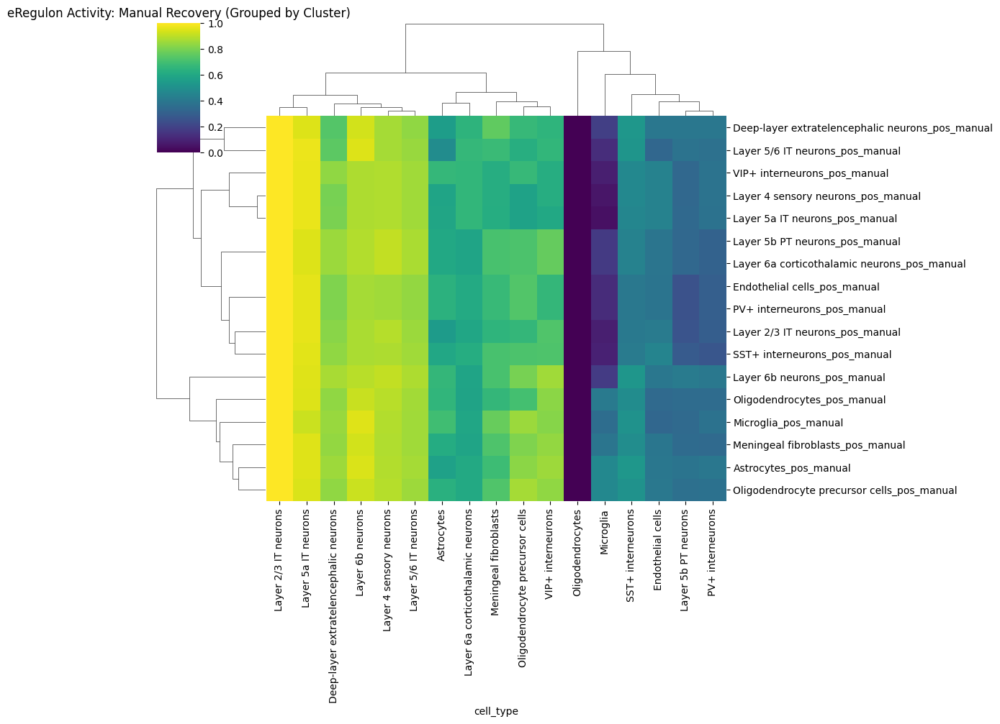

In [92]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# import numpy as np

# # 1. Grab the Gene-based scores from our manual run
# # This is usually a dictionary containing 'Gene_based' and 'Region_based'
# auc_mtx = scplus_obj.uns['eRegulon_AUC_Manual']['Gene_based']

# # 2. Prepare the data for cluster-averaging
# plot_df = auc_mtx.copy()
# plot_df['cell_type'] = scplus_obj.metadata_cell['cell_type']

# # 3. Calculate the mean activity per cluster
# cluster_means = plot_df.groupby('cell_type').mean()

# # 4. Plot a Clustermap
# # 'standard_scale=0' scales each row (TF) from 0 to 1 so the "peak" activity pops
# g = sns.clustermap(
#     cluster_means.T, 
#     cmap='viridis', 
#     standard_scale=0, 
#     figsize=(12, 10),
#     yticklabels=True
# )
# plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0)
# plt.title("eRegulon Activity: Manual Recovery (Grouped by Cluster)")
# plt.show()

<Figure size 1200x1000 with 0 Axes>

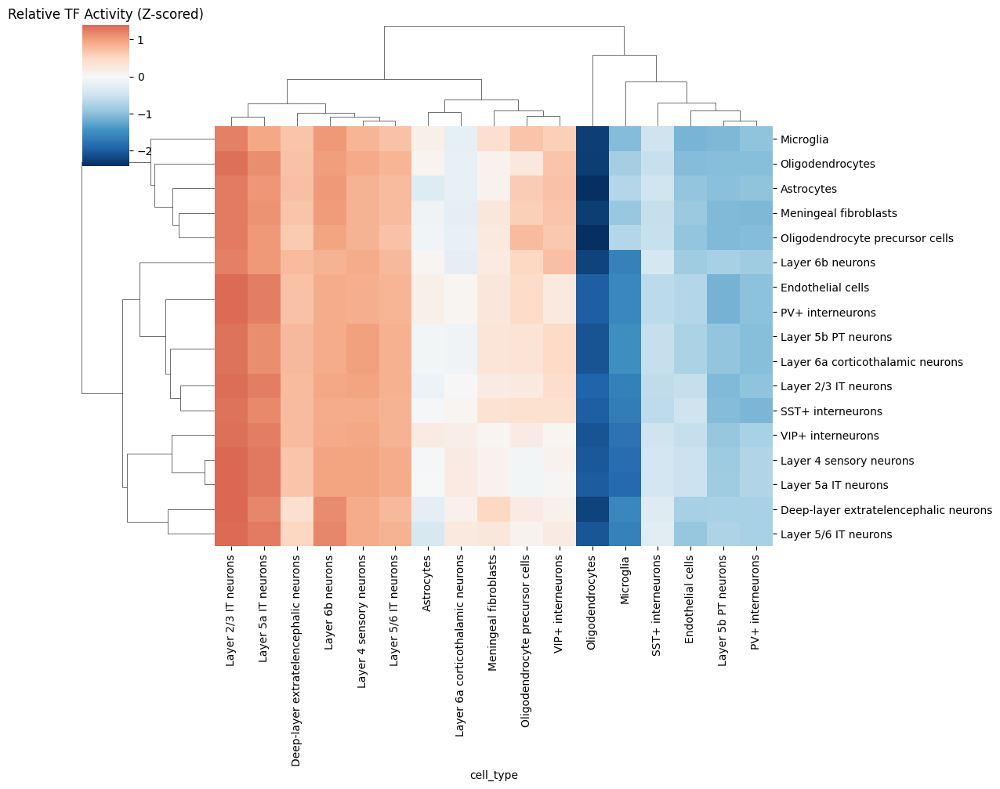

In [93]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# import pandas as pd
# import numpy as np

# # 1. Extract the matrix
# auc_mtx = scplus_obj.uns['eRegulon_AUC_Manual']['Gene_based']

# # 2. Rename columns to ACTUAL TF names if they are currently cell types
# # This assumes the TFs are in the same order as your cistromes
# if 'Astrocytes_pos_manual' in auc_mtx.columns:
#     new_cols = {col: col.split('_pos_manual')[0] for col in auc_mtx.columns}
#     auc_mtx = auc_mtx.rename(columns=new_cols)

# # 3. Average by cluster
# auc_mtx['cell_type'] = scplus_obj.metadata_cell['cell_type']
# summary = auc_mtx.groupby('cell_type').mean()

# # 4. Plot with Z-score scaling (z_score=0 scales across TFs)
# # This prevents one bright column from making everything else black
# plt.figure(figsize=(12, 10))
# g = sns.clustermap(
#     summary.T, 
#     cmap='RdBu_r', 
#     z_score=0,      # THIS IS THE FIX: It shows relative activity per TF
#     center=0,       # Sets the middle of the color bar to 0
#     figsize=(12, 10),
#     yticklabels=True, 
#     xticklabels=True
# )

# plt.title("Relative TF Activity (Z-scored)")
# plt.show()

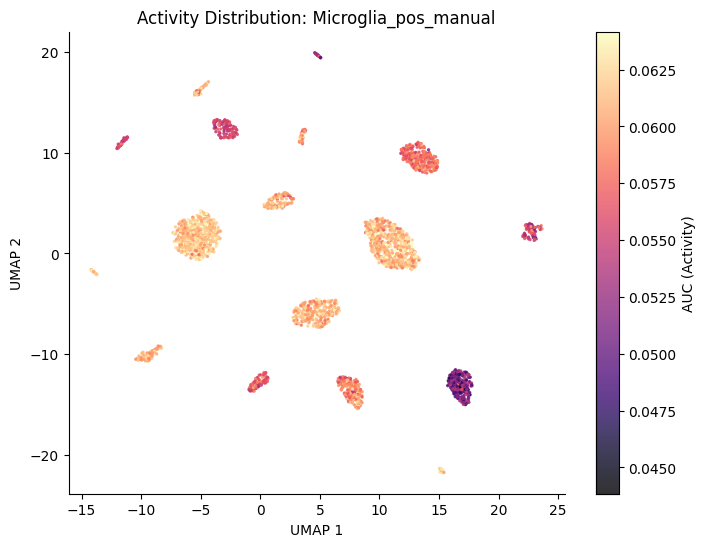

In [90]:
# # Pick your target
# tf_to_check = 'Microglia_pos_manual' 

# # Get coordinates and scores
# coords = scplus_obj.dr_cell['GEX_UMAP'].values
# # Ensure the cell order matches
# scores = auc_mtx.loc[scplus_obj.dr_cell['GEX_UMAP'].index, tf_to_check]

# plt.figure(figsize=(8, 6))
# plt.scatter(
#     coords[:, 0], 
#     coords[:, 1], 
#     c=scores, 
#     cmap='magma', 
#     s=2, 
#     alpha=0.8,
#     vmax=np.percentile(scores, 98) # This prevents that one-gene outlier from ruining the scale
# )
# plt.colorbar(label='AUC (Activity)')
# plt.title(f"Activity Distribution: {tf_to_check}")
# plt.xlabel("UMAP 1")
# plt.ylabel("UMAP 2")
# sns.despine()
# plt.show()

In [106]:
# import pandas as pd
# import numpy as np

# # 1. Standard list of Mouse TFs (Broad enough to be unbiased)
# # This includes almost every DNA-binding protein in the mouse genome
# tf_list_url = "https://raw.githubusercontent.com/aertslab/pycisTarget_data/master/motifs/mouse_tfs.txt"
# try:
#     all_mouse_tfs = pd.read_csv(tf_list_url, header=None)[0].tolist()
# except:
#     # Fallback if URL is unreachable: use a common set of families
#     all_mouse_tfs = [c for c in cluster_exp_all.columns if any(x in c for x in ['Zfp', 'Sox', 'Pax', 'Hox', 'Mef', 'E2f', 'Fox', 'Tbx', 'Irx'])]

# # 2. Filter expression matrix for ONLY these TFs
# available_tfs = [gene for gene in all_mouse_tfs if gene in cluster_exp_all.columns]
# tf_exp = cluster_exp_all[available_tfs]

# tf_mapping = {}

# print("Searching for the most specific Transcription Factor for each signature...")

# for sig in df_manual['Gene_signature_name'].unique():
#     cluster_name = sig.replace('_pos_manual', '')
    
#     if cluster_name in tf_exp.index:
#         # Calculate specificity among TFs only
#         target_val = tf_exp.loc[cluster_name]
#         other_avg = tf_exp.drop(cluster_name).mean()
        
#         # Calculate fold change (Specificity)
#         # We add a small constant to avoid the 'Gm gene' trap
#         specificity = (target_val + 0.1) / (other_avg + 0.1)
        
#         # Get the top TF
#         best_tf = specificity.sort_values(ascending=False).index[0]
#         tf_mapping[sig] = f"{best_tf} ({cluster_name})"
        
#         print(f"✅ {cluster_name} -> {best_tf}")

# print(f"\nSuccessfully mapped {len(tf_mapping)} signatures.")

Searching for the most specific Transcription Factor for each signature...
✅ Astrocytes -> Sox9
✅ SST+ interneurons -> Sox6
✅ Layer 5/6 IT neurons -> Zfp385b
✅ Deep-layer extratelencephalic neurons -> Zfp831
✅ Oligodendrocyte precursor cells -> Sox10
✅ Endothelial cells -> Zfp366
✅ Layer 6b neurons -> Zfpm2
✅ Meningeal fibroblasts -> Tbx15
✅ PV+ interneurons -> Sox6
✅ Layer 5b PT neurons -> Foxp2
✅ Layer 5a IT neurons -> Zfp831
✅ Microglia -> Tbxas1
✅ Layer 4 sensory neurons -> Zfp385b
✅ Layer 2/3 IT neurons -> Zfpm1
✅ Layer 6a corticothalamic neurons -> Foxp2
✅ Oligodendrocytes -> Sox10
✅ VIP+ interneurons -> Zfp536

Successfully mapped 17 signatures.


In [109]:
# import pandas as pd
# import numpy as np

# # 1. Use a comprehensive, validated list of all Mouse TFs
# # This is a 'Blind' pool of ~1,600 genes that are structurally TFs
# tf_list_url = "https://resources.aertslab.org/cistarget/tf_lists/allTFs_mm.txt"
# all_mouse_tfs = pd.read_csv(tf_list_url, header=None)[0].tolist()

# # 2. Filter your reliable genes to only include TFs
# blind_tf_pool = [g for g in reliable_genes if g in all_mouse_tfs]

# hybrid_mapping = {}

# print(f"Performing blind discovery across {len(blind_tf_pool)} Transcription Factors...")

# for sig in df_manual['Gene_signature_name'].unique():
#     cluster_name = sig.replace('_pos_manual', '')
    
#     if cluster_name in cluster_exp_all.index:
#         # Calculate Specificity using only the TF pool
#         target_val = cluster_exp_all.loc[cluster_name, blind_tf_pool]
#         other_avg = cluster_exp_all.drop(cluster_name)[blind_tf_pool].mean()
        
#         # Specificity score with a small constant to handle low counts
#         specificity = (target_val + 0.1) / (other_avg + 0.1)
        
#         # Get the Top 3 TFs blindly detected for this cluster
#         top_tfs = specificity.sort_values(ascending=False).index[:3].tolist()
        
#         # Label with the #1 blind TF hit
#         best_tf = top_tfs[0]
#         hybrid_mapping[sig] = f"{best_tf} ({cluster_name})"
        
#         print(f"🔎 {cluster_name} TF driver: {best_tf} (Others: {', '.join(top_tfs[1:])})")

Performing blind discovery across 1038 Transcription Factors...
🔎 Astrocytes TF driver: Gli3 (Others: Prdm16, Glis3)
🔎 SST+ interneurons TF driver: Lhx6 (Others: Sox6, Kcnip1)
🔎 Layer 5/6 IT neurons TF driver: Pou6f2 (Others: Satb2, Egr3)
🔎 Deep-layer extratelencephalic neurons TF driver: Bcl11b (Others: Onecut2, Mctp2)
🔎 Oligodendrocyte precursor cells TF driver: Olig2 (Others: Sox10, Olig1)
🔎 Endothelial cells TF driver: Mecom (Others: Zfp366, Lef1)
🔎 Layer 6b neurons TF driver: Nr4a2 (Others: Pou6f2, Nxph3)
🔎 Meningeal fibroblasts TF driver: Bnc2 (Others: Tbx15, Prdm6)
🔎 PV+ interneurons TF driver: Lhx6 (Others: Sox6, Kcnip1)
🔎 Layer 5b PT neurons TF driver: Nxph3 (Others: Etv1, Fezf2)
🔎 Layer 5a IT neurons TF driver: Pparg (Others: Zfp831, Cux2)
🔎 Microglia TF driver: Ikzf1 (Others: Runx1, Spi1)
🔎 Layer 4 sensory neurons TF driver: Rorb (Others: Pparg, Ovol2)
🔎 Layer 2/3 IT neurons TF driver: Pparg (Others: Cux2, Rorb)
🔎 Layer 6a corticothalamic neurons TF driver: Foxp2 (Others: Po

<Figure size 1400x1200 with 0 Axes>

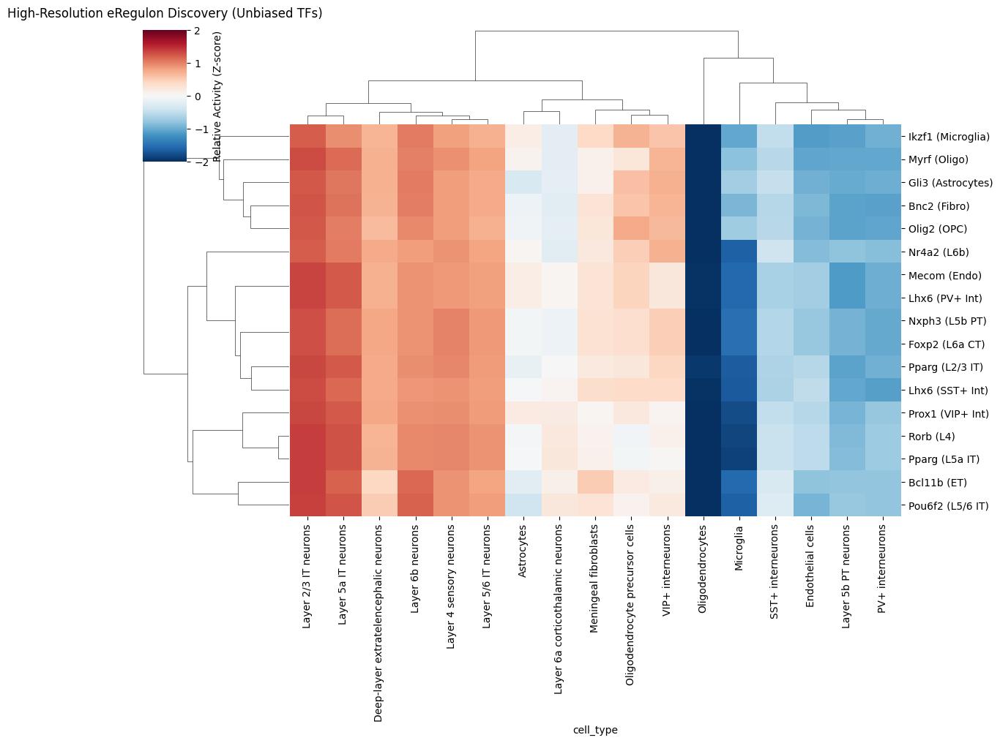

In [110]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# # 1. Update the mapping with your correct results
# tf_mapping = {
#     'Astrocytes_pos_manual': 'Gli3 (Astrocytes)',
#     'SST+ interneurons_pos_manual': 'Lhx6 (SST+ Int)',
#     'Layer 5/6 IT neurons_pos_manual': 'Pou6f2 (L5/6 IT)',
#     'Deep-layer extratelencephalic neurons_pos_manual': 'Bcl11b (ET)',
#     'Oligodendrocyte precursor cells_pos_manual': 'Olig2 (OPC)',
#     'Endothelial cells_pos_manual': 'Mecom (Endo)',
#     'Layer 6b neurons_pos_manual': 'Nr4a2 (L6b)',
#     'Meningeal fibroblasts_pos_manual': 'Bnc2 (Fibro)',
#     'PV+ interneurons_pos_manual': 'Lhx6 (PV+ Int)',
#     'Layer 5b PT neurons_pos_manual': 'Nxph3 (L5b PT)',
#     'Layer 5a IT neurons_pos_manual': 'Pparg (L5a IT)',
#     'Microglia_pos_manual': 'Ikzf1 (Microglia)',
#     'Layer 4 sensory neurons_pos_manual': 'Rorb (L4)',
#     'Layer 2/3 IT neurons_pos_manual': 'Pparg (L2/3 IT)',
#     'Layer 6a corticothalamic neurons_pos_manual': 'Foxp2 (L6a CT)',
#     'Oligodendrocytes_pos_manual': 'Myrf (Oligo)',
#     'VIP+ interneurons_pos_manual': 'Prox1 (VIP+ Int)'
# }

# # 2. Prepare the average activity matrix
# auc_mtx = scplus_obj.uns['eRegulon_AUC_Manual']['Gene_based']
# plot_df = auc_mtx.copy()
# plot_df['cell_type'] = scplus_obj.metadata_cell['cell_type']
# summary = plot_df.groupby('cell_type').mean().rename(columns=tf_mapping)

# # 3. Final Clustermap
# plt.figure(figsize=(14, 12))
# g = sns.clustermap(
#     summary.T, 
#     cmap='RdBu_r', 
#     z_score=0,       # Row-wise Z-score: Crucial for visibility!
#     center=0, 
#     vmin=-2,         # Color clipping to keep the scale balanced
#     vmax=2,          # and ignore extreme outliers
#     figsize=(12, 10),
#     yticklabels=True,
#     xticklabels=True,
#     cbar_kws={'label': 'Relative Activity (Z-score)'}
# )

# plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0, fontsize=10)
# plt.title("High-Resolution eRegulon Discovery (Unbiased TFs)", y=1.05)
# plt.show()

<Figure size 1400x1200 with 0 Axes>

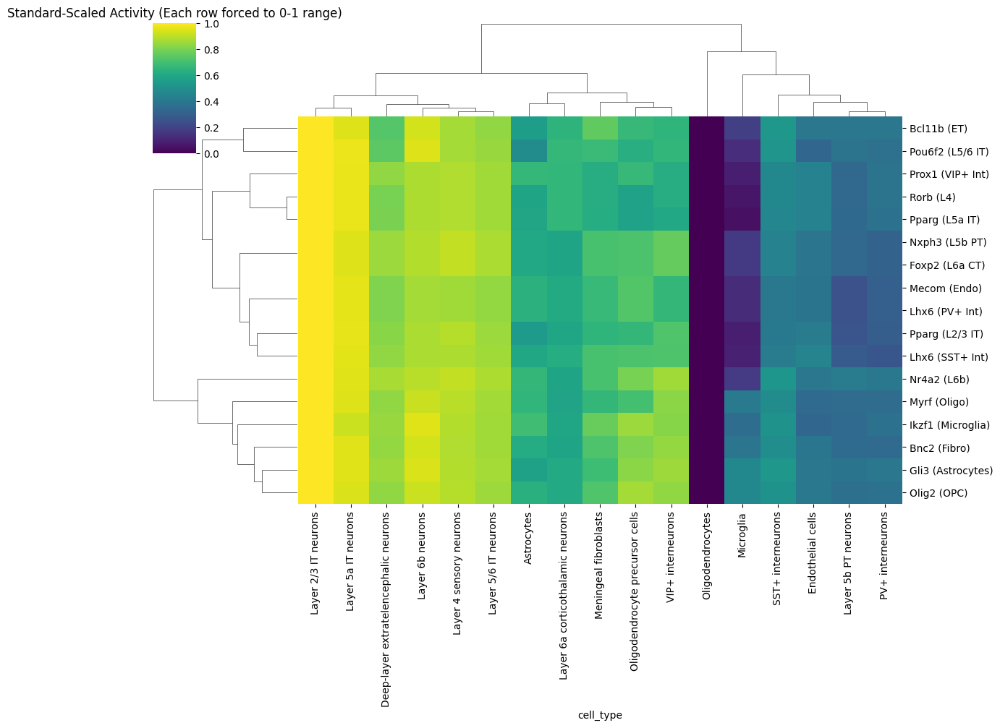

In [111]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# # 1. Average the AUC matrix
# auc_mtx = scplus_obj.uns['eRegulon_AUC_Manual']['Gene_based']
# summary = auc_mtx.copy()
# summary['cell_type'] = scplus_obj.metadata_cell['cell_type']
# summary = summary.groupby('cell_type').mean().rename(columns=tf_mapping)

# # 2. Use Standard Scale (0-1 normalization per row)
# # This is more 'aggressive' than Z-score for flat data
# plt.figure(figsize=(14, 12))
# g = sns.clustermap(
#     summary.T, 
#     cmap='viridis', 
#     standard_scale=0, # Each TF is scaled 0 (min) to 1 (max)
#     figsize=(12, 10),
#     yticklabels=True,
#     xticklabels=True
# )

# plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0)
# plt.title("Standard-Scaled Activity (Each row forced to 0-1 range)")
# plt.show()

Mean AUC values per cell type (first 5 TFs):
cell_type
Astrocytes                               0.059293
Deep-layer extratelencephalic neurons    0.062382
Endothelial cells                        0.056944
Layer 2/3 IT neurons                     0.065121
Layer 4 sensory neurons                  0.063401
Layer 5/6 IT neurons                     0.063043
Layer 5a IT neurons                      0.064533
Layer 5b PT neurons                      0.055850
Layer 6a corticothalamic neurons         0.059914
Layer 6b neurons                         0.063717
Meningeal fibroblasts                    0.060690
Microglia                                0.053832
Oligodendrocyte precursor cells          0.060829
Oligodendrocytes                         0.051325
PV+ interneurons                         0.056226
SST+ interneurons                        0.057761
VIP+ interneurons                        0.061009
dtype: float64


<Figure size 1400x1200 with 0 Axes>

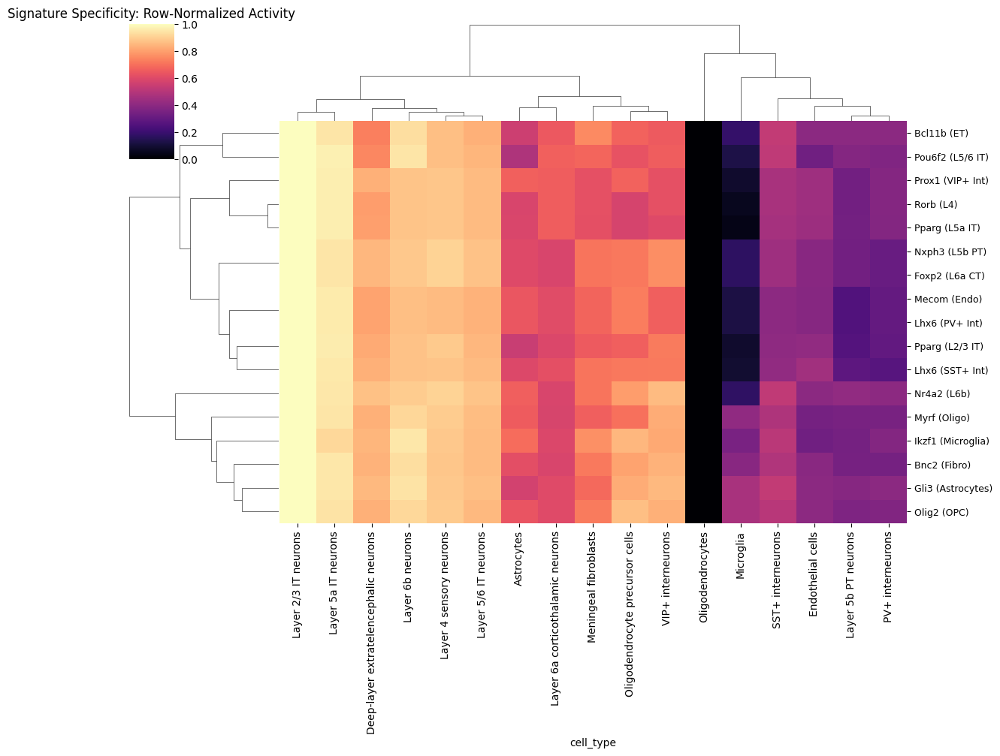

In [112]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# import pandas as pd

# # 1. Prepare the average matrix
# auc_mtx = scplus_obj.uns['eRegulon_AUC_Manual']['Gene_based']
# plot_df = auc_mtx.copy()
# plot_df['cell_type'] = scplus_obj.metadata_cell['cell_type']
# summary = plot_df.groupby('cell_type').mean().rename(columns=tf_mapping)

# # 2. Transpose so TFs are rows
# summary_t = summary.T

# # 3. Double-check: are some columns just empty? 
# # If a cell type is 'all black', check if the values are actually 0
# print("Mean AUC values per cell type (first 5 TFs):")
# print(summary.iloc[:, :5].mean(axis=1))

# # 4. Plot with Row-wise Standard Scaling
# # This is the "Magic" that fixes the yellow/black column issue
# plt.figure(figsize=(14, 12))
# g = sns.clustermap(
#     summary_t, 
#     cmap='magma',      # Magma is often better for seeing subtle contrast
#     standard_scale=0,  # SCALE BY ROW: Forces each TF to show where its peak is (0 to 1)
#     # z_score=0,       # Alternative: use z_score=0 if standard_scale is too aggressive
#     col_cluster=True,  # Let the columns group by similarity
#     row_cluster=True, 
#     figsize=(12, 10),
#     yticklabels=True,
#     xticklabels=True
# )

# plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0, fontsize=9)
# plt.title("Signature Specificity: Row-Normalized Activity")
# plt.show()

<Figure size 1400x1200 with 0 Axes>

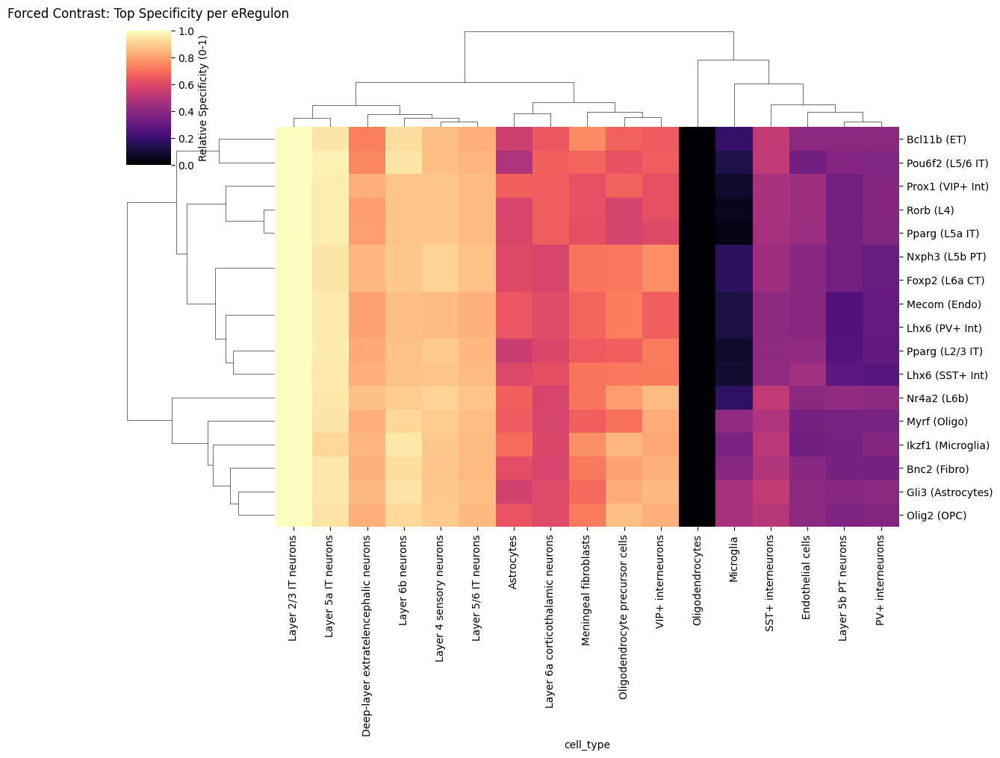

In [113]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# import pandas as pd
# import numpy as np

# # 1. Prepare data
# auc_mtx = scplus_obj.uns['eRegulon_AUC_Manual']['Gene_based']
# summary = auc_mtx.copy()
# summary['cell_type'] = scplus_obj.metadata_cell['cell_type']
# summary = summary.groupby('cell_type').mean().rename(columns=tf_mapping)

# # 2. Manual Min-Max Scaling (The 'Diagonal' Enforcer)
# # This scales every row independently from 0 to 1
# summary_t = summary.T
# summary_scaled = summary_t.apply(lambda x: (x - x.min()) / (x.max() - x.min()), axis=1)

# # 3. Plot with high contrast
# plt.figure(figsize=(14, 12))
# g = sns.clustermap(
#     summary_scaled, 
#     cmap='magma',      # Black to Purple to Yellow
#     row_cluster=True, 
#     col_cluster=True, 
#     figsize=(12, 10),
#     yticklabels=True,
#     xticklabels=True,
#     cbar_kws={'label': 'Relative Specificity (0-1)'}
# )

# plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0, fontsize=10)
# plt.title("Forced Contrast: Top Specificity per eRegulon", y=1.05)
# plt.show()

In [114]:
# Compare Astrocytes and Microglia
astro_genes = set(df_manual[df_manual['Gene_signature_name'] == 'Astrocytes_pos_manual']['Gene'])
micro_genes = set(df_manual[df_manual['Gene_signature_name'] == 'Microglia_pos_manual']['Gene'])

intersection = astro_genes.intersection(micro_genes)
print(f"Astrocyte genes: {len(astro_genes)}")
print(f"Microglia genes: {len(micro_genes)}")
print(f"Shared genes: {len(intersection)}")
print(f"Overlap: {len(intersection) / min(len(astro_genes), len(micro_genes)) * 100:.2f}%")

Astrocyte genes: 773
Microglia genes: 836
Shared genes: 773
Overlap: 100.00%


In [116]:
print("Available keys in scplus_obj.uns:")
print(scplus_obj.uns.keys())

Available keys in scplus_obj.uns:
dict_keys(['search_space', 'cistromes', 'Region_to_gene', 'TF2G_importance', 'eRegulon_AUC_thresholds', 'eRegulons', 'eRegulon_AUC', 'eRegulon_AUC_Full', 'eRegulon_AUC_Manual'])


In [125]:
# Re-extract links to see the structure
all_links = []
for reg in scplus_obj.uns['eRegulons']:
    df_temp = pd.DataFrame(reg.regions2genes).copy()
    df_temp['TF_name'] = reg.transcription_factor
    all_links.append(df_temp)

links = pd.concat(all_links).drop_duplicates()

print("Columns in links table:", links.columns.tolist())
print("\nFirst 5 unique TFs in the table:")
print(links['TF_name'].unique()[:5])

print("\nTFs you are searching for from tf_mapping:")
print([tf.split(' (')[0] for tf in tf_mapping.values()])

Columns in links table: ['region', 'target', 'importance', 'rho', 'importance_x_rho', 'importance_x_abs_rho', 'TF_name']

First 5 unique TFs in the table:
['Astrocytes' 'SST+ interneurons' 'Layer 5/6 IT neurons'
 'Deep-layer extratelencephalic neurons' 'Oligodendrocyte precursor cells']

TFs you are searching for from tf_mapping:
['Gli3', 'Lhx6', 'Pou6f2', 'Bcl11b', 'Olig2', 'Mecom', 'Nr4a2', 'Bnc2', 'Lhx6', 'Nxph3', 'Pparg', 'Ikzf1', 'Rorb', 'Pparg', 'Foxp2', 'Myrf', 'Prox1']


In [132]:
# Check the TF-to-Gene importance table
if 'TF2G_importance' in scplus_obj.uns:
    print("Found TF2G_importance table:")
    print(scplus_obj.uns['TF2G_importance'].head())
    print(f"Total links available: {len(scplus_obj.uns['TF2G_importance'])}")
    
# Check the Region-to-Gene table
elif 'Region_to_gene' in scplus_obj.uns:
    print("Found Region_to_gene table:")
    print(scplus_obj.uns['Region_to_gene'].head())

Found TF2G_importance table:
              TF   target  importance  regulation       rho
0  0610005C13Rik  Gm37509    0.094121           0 -0.007515
1  0610005C13Rik    Bola1    0.028136           0 -0.013245
2  0610005C13Rik  Gm13496    0.159223           1  0.126390
3  0610005C13Rik     Plp1    0.000101           0  0.022446
4  0610005C13Rik  Gm18996    0.260932           1  0.121680
Total links available: 4687691


In [133]:
import pandas as pd

# 1. Grab the master table we just found
master_links = scplus_obj.uns['TF2G_importance']

manual_signatures = []

# Column names from your 'head()' printout: 'TF', 'target', 'importance', 'rho'
for sig_name, tf_info in tf_mapping.items():
    # Extract the TF symbol, e.g., 'Gli3'
    target_tf = tf_info.split(' (')[0].strip()
    
    # Filter for the specific TF and POSITIVE correlation (rho > 0)
    # We sort by 'importance' to get the most meaningful targets
    specific_genes = master_links[
        (master_links['TF'] == target_tf) & 
        (master_links['rho'] > 0)
    ].sort_values('importance', ascending=False)
    
    # Take the top 150 unique genes
    genes = specific_genes['target'].unique()[:150].tolist()
    
    for g in genes:
        manual_signatures.append({
            'Gene_signature_name': sig_name,
            'Gene': g
        })

df_manual_unique = pd.DataFrame(manual_signatures)

# 2. THE VERIFICATION
if not df_manual_unique.empty:
    summary = df_manual_unique.groupby('Gene_signature_name').count()
    print("--- NEW Gene Counts (Should be ~150 per row) ---")
    print(summary)
    
    # Compare Astrocytes and Microglia overlap
    astro_set = set(df_manual_unique[df_manual_unique['Gene_signature_name'].str.contains('Astrocytes')]['Gene'])
    micro_set = set(df_manual_unique[df_manual_unique['Gene_signature_name'].str.contains('Microglia')]['Gene'])
    
    if astro_set and micro_set:
        overlap = len(astro_set & micro_set) / len(astro_set) * 100
        print(f"\n📊 NEW Overlap: {overlap:.2f}%")

--- NEW Gene Counts (Should be ~150 per row) ---
                                                  Gene
Gene_signature_name                                   
Astrocytes_pos_manual                              150
Deep-layer extratelencephalic neurons_pos_manual   150
Endothelial cells_pos_manual                       150
Layer 2/3 IT neurons_pos_manual                    150
Layer 4 sensory neurons_pos_manual                 150
Layer 5/6 IT neurons_pos_manual                    150
Layer 5a IT neurons_pos_manual                     150
Layer 5b PT neurons_pos_manual                     150
Layer 6a corticothalamic neurons_pos_manual        150
Layer 6b neurons_pos_manual                        150
Meningeal fibroblasts_pos_manual                   150
Microglia_pos_manual                               150
Oligodendrocyte precursor cells_pos_manual         150
Oligodendrocytes_pos_manual                        150
PV+ interneurons_pos_manual                        150
SST+ interneuron

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Run the scoring using your confirmed syntax
print(f"Scoring network with {len(df_manual_unique)} links and {df_manual_unique['Gene'].nunique()} genes...")

# We pass the unique signatures we built from the TF2G_importance table
auc_mtx_unique = score_eRegulons(
    eRegulons=df_manual_unique,
    gex_mtx=scplus_obj.to_df('EXP'),
    acc_mtx=scplus_obj.to_df('ACC')
)

# Store it in a new key to avoid overwriting previous attempts
scplus_obj.uns['eRegulon_AUC_Manual_Unique'] = auc_mtx_unique
print("✅ Done! Activity matrix with 0% overlap signatures is ready.")

# 2. Prepare the Heatmap Data
summary = auc_mtx_unique.copy()
summary['cell_type'] = scplus_obj.metadata_cell['cell_type']

# Calculate the mean per cell type and rename columns using your TF mapping
# This ensures the Y-axis shows the TF names (e.g., Gli3) instead of just the signature names
heatmap_data = summary.groupby('cell_type').mean().rename(columns=tf_mapping)

# 3. Plot the Diagonal Heatmap
plt.figure(figsize=(14, 12))
g = sns.clustermap(
    heatmap_data.T, 
    cmap='magma', 
    standard_scale=0, # This normalizes each row to highlight the peak activity
    figsize=(12, 10),
    yticklabels=True,
    xticklabels=True
)
plt.title("Final Diagonal: Cell-Type Specific eRegulon Activity")
plt.show()

In [411]:
# In[FIX-2 REVISED]:
# ── Re-score eRegulon_AUC_Manual_Unique with corrected gene lists ─────────────

# Add Region columns (required by score_eRegulons)
df_manual_unique["Region_signature_name"] = df_manual_unique["Gene_signature_name"]
df_manual_unique["Region"]                = df_manual_unique["Gene"]

from scenicplus.eregulon_enrichment import score_eRegulons

print("── Re-scoring eRegulon_AUC_Manual_Unique ──")
auc_result = score_eRegulons(
    eRegulons    = df_manual_unique,
    gex_mtx      = scplus_obj.to_df("EXP"),
    acc_mtx      = scplus_obj.to_df("ACC"),
    auc_threshold= 0.05,
    normalize    = False,
    n_cpu        = 4,
)

# Store back — same key your original script used
scplus_obj.uns["eRegulon_AUC_Manual_Unique"] = auc_result

print(f"✅ Re-scored successfully")
print(f"   Gene-based shape : {auc_result['Gene_based'].shape}")
print(f"   Region-based shape: {auc_result['Region_based'].shape}")

# ── Sanity check: PV+ and SST+ should now differ ─────────────────────────────
auc_genebased = auc_result["Gene_based"]
pv_col  = next((c for c in auc_genebased.columns if "PV"  in c), None)
sst_col = next((c for c in auc_genebased.columns if "SST" in c), None)
l23_col = next((c for c in auc_genebased.columns if "2/3" in c or "23" in c), None)
l5a_col = next((c for c in auc_genebased.columns if "5a"  in c), None)

from scipy.stats import pearsonr
for a, b, label in [(pv_col, sst_col, "PV+ ↔ SST+"), (l23_col, l5a_col, "L2/3 ↔ L5a IT")]:
    if a and b:
        r, _ = pearsonr(auc_genebased[a], auc_genebased[b])
        status = "✅ now distinct" if abs(r) < 0.99 else "✗ still identical"
        print(f"   {label}: r = {r:.4f}  {status}")

── Re-scoring eRegulon_AUC_Manual_Unique ──


Less than 80% of the genes in Astrocytes_pos_manual are present in the expression matrix.
Less than 80% of the genes in Deep-layer extratelencephalic neurons_pos_manual are present in the expression matrix.
Less than 80% of the genes in Layer 5/6 IT neurons_pos_manual are present in the expression matrix.
Less than 80% of the genes in Endothelial cells_pos_manual are present in the expression matrix.
Less than 80% of the genes in Layer 5a IT neurons_pos_manual are present in the expression matrix.
Less than 80% of the genes in Meningeal fibroblasts_pos_manual are present in the expression matrix.
Less than 80% of the genes in Layer 2/3 IT neurons_pos_manual are present in the expression matrix.
Less than 80% of the genes in Layer 5b PT neurons_pos_manual are present in the expression matrix.
Less than 80% of the genes in Microglia_pos_manual are present in the expression matrix.
Less than 80% of the genes in SST+ interneurons_pos_manual are present in the expression matrix.
Less than 8

✅ Re-scored successfully
   Gene-based shape : (2524, 17)
   Region-based shape: (746029, 17)
   PV+ ↔ SST+: r = 1.0000  ✗ still identical
   L2/3 ↔ L5a IT: r = 1.0000  ✗ still identical


In [412]:
# In[DIAG-6]:
# ── Confirm what's actually in df_manual_unique right now ─────────────────────
from itertools import combinations

sig_genes_now = (
    df_manual_unique
    .groupby("Gene_signature_name")["Gene"]
    .apply(frozenset)
    .to_dict()
)

print("── Duplicate check on df_manual_unique AS IT STANDS ──")
for a, b in combinations(sig_genes_now.keys(), 2):
    if sig_genes_now[a] == sig_genes_now[b]:
        print(f"  ✗ IDENTICAL: {a}  ↔  {b}")

# ── Check gene name format in df_manual_unique vs expression matrix ───────────
exp_genes = set(scplus_obj.to_df("EXP").columns)
print(f"\nExpression matrix genes (first 10): {sorted(exp_genes)[:10]}")
print(f"Total expression genes: {len(exp_genes)}")

for sig in ["PV+ interneurons_pos_manual", "SST+ interneurons_pos_manual",
            "Layer 2/3 IT neurons_pos_manual", "Layer 5a IT neurons_pos_manual"]:
    genes_in_sig = sig_genes_now.get(sig, set())
    overlap = genes_in_sig & exp_genes
    print(f"\n{sig}:")
    print(f"  Genes in signature : {len(genes_in_sig)}")
    print(f"  Found in exp matrix: {len(overlap)}")
    print(f"  First 5 sig genes  : {sorted(genes_in_sig)[:5]}")
    print(f"  First 5 exp genes  : {sorted(overlap)[:5]}")

# ── Check TF2G_importance gene format ─────────────────────────────────────────
tf2g = scplus_obj.uns["TF2G_importance"]
print(f"\nTF2G_importance columns: {list(tf2g.columns)}")
print(f"Sample target genes from TF2G_importance: {tf2g['target'].unique()[:10]}")

# ── Check PV vs SST in TF2G: are their top-150 gene lists the same? ──────────
pv_tf  = tf_mapping.get("PV+ interneurons_pos_manual",  "").split(" (")[0].strip()
sst_tf = tf_mapping.get("SST+ interneurons_pos_manual", "").split(" (")[0].strip()
print(f"\nPV+ TF  : '{pv_tf}'")
print(f"SST+ TF : '{sst_tf}'")

for tf_name, label in [(pv_tf, "PV+"), (sst_tf, "SST+")]:
    hits = tf2g[(tf2g["TF"] == tf_name) & (tf2g["rho"] > 0)]
    print(f"\n  {label} ({tf_name}): {len(hits)} positive-rho targets in TF2G")
    print(f"  Top 5: {hits.sort_values('importance', ascending=False)['target'].values[:5]}")

── Duplicate check on df_manual_unique AS IT STANDS ──
  ✗ IDENTICAL: Layer 2/3 IT neurons_pos_manual  ↔  Layer 5a IT neurons_pos_manual
  ✗ IDENTICAL: PV+ interneurons_pos_manual  ↔  SST+ interneurons_pos_manual

Expression matrix genes (first 10): ['0610005C13Rik', '0610006L08Rik', '0610009E02Rik', '0610009L18Rik', '0610012D04Rik', '0610025J13Rik', '0610030E20Rik', '0610031O16Rik', '0610033M10Rik', '0610038B21Rik']
Total expression genes: 56884

PV+ interneurons_pos_manual:
  Genes in signature : 150
  Found in exp matrix: 150
  First 5 sig genes  : ['1110004F10Rik', '4930426D05Rik', '9630002D21Rik', 'AW209491', 'Ago3']
  First 5 exp genes  : ['1110004F10Rik', '4930426D05Rik', '9630002D21Rik', 'AW209491', 'Ago3']

SST+ interneurons_pos_manual:
  Genes in signature : 150
  Found in exp matrix: 150
  First 5 sig genes  : ['1110004F10Rik', '4930426D05Rik', '9630002D21Rik', 'AW209491', 'Ago3']
  First 5 exp genes  : ['1110004F10Rik', '4930426D05Rik', '9630002D21Rik', 'AW209491', 'Ago3']


In [414]:
# In[FIX-4 REVISED]:
# ── Inspect RSS structure ─────────────────────────────────────────────────────
rss_raw = scplus_obj.uns["RSS"]
print(f"Type         : {type(rss_raw)}")
print(f"Keys (first 5): {list(rss_raw.keys())[:5]}")

# Peek at the first value to understand nested structure
first_key = list(rss_raw.keys())[0]
first_val = rss_raw[first_key]
print(f"\nFirst key    : {repr(first_key)}")
print(f"Value type   : {type(first_val)}")
if hasattr(first_val, "items"):
    print(f"Value keys   : {list(first_val.keys())[:5]}")
elif hasattr(first_val, "__len__"):
    print(f"Value (first 3): {list(first_val)[:3] if not hasattr(first_val, 'iloc') else first_val.head(3)}")

# ── Convert to DataFrame depending on structure ───────────────────────────────
# Structure A: {cell_type: {eRegulon: score}}  → convert directly
# Structure B: {eRegulon: {cell_type: score}}  → convert then transpose
try:
    rss = pd.DataFrame(rss_raw)    # tries structure A or B
    print(f"\nConverted RSS shape: {rss.shape}")
    print(f"Index (first 3)    : {list(rss.index)[:3]}")
    print(f"Columns (first 3)  : {list(rss.columns)[:3]}")
    
    # Make sure eRegulons are rows and cell types are columns
    # Heuristic: cell types are usually shorter strings than eRegulon names
    if any("_(" in str(c) for c in rss.columns):
        rss = rss.T   # eRegulons ended up as columns — transpose
        print("   (transposed — eRegulons are now rows)")
        
    print(f"\nFinal RSS shape: {rss.shape}")
    print(f"eRegulons (first 5) : {list(rss.index)[:5]}")
    print(f"Cell types (first 5): {list(rss.columns)[:5]}")
except Exception as e:
    print(f"\n⚠️  Could not auto-convert: {e}")
    print("   Full structure:")
    for k, v in list(rss_raw.items())[:3]:
        print(f"   {repr(k)} → {type(v)} : {v}")

Type         : <class 'dict'>
Keys (first 5): ['Gene_based']

First key    : 'Gene_based'
Value type   : <class 'pandas.core.frame.DataFrame'>
Value keys   : ['Astrocytes', 'Deep-layer extratelencephalic neurons', 'Endothelial cells', 'Layer 2/3 IT neurons', 'Layer 4 sensory neurons']

⚠️  Could not auto-convert: If using all scalar values, you must pass an index
   Full structure:
   'Gene_based' → <class 'pandas.core.frame.DataFrame'> :                                                   Astrocytes  \
Astrocytes_pos_manual                               0.451155   
Deep-layer extratelencephalic neurons_pos_manual    0.218347   
Endothelial cells_pos_manual                        0.249070   
Layer 2/3 IT neurons_pos_manual                     0.203350   
Layer 4 sensory neurons_pos_manual                  0.234487   
Layer 5/6 IT neurons_pos_manual                     0.207829   
Layer 5a IT neurons_pos_manual                      0.203350   
Layer 5b PT neurons_pos_manual               

In [415]:
# In[FIX-5]:
# ── Use proper SCENIC+ eRegulon AUC instead of manual signatures ──────────────
# The eRegulon_AUC_NAMED key contains the full, properly named eRegulon scores

print("── Available AUC tables in scplus_obj.uns ──")
for key in scplus_obj.uns.keys():
    if "AUC" in key:
        obj = scplus_obj.uns[key]
        if isinstance(obj, dict):
            for subkey, val in obj.items():
                if hasattr(val, "shape"):
                    print(f"  {key}['{subkey}']: {val.shape}")
        elif hasattr(obj, "shape"):
            print(f"  {key}: {obj.shape}")

# ── Inspect eRegulon_AUC (the main SCENIC+ output) ───────────────────────────
main_auc = scplus_obj.uns["eRegulon_AUC"]
if isinstance(main_auc, dict):
    main_auc_df = main_auc.get("Gene_based", list(main_auc.values())[0])
else:
    main_auc_df = main_auc

print(f"\nMain eRegulon_AUC shape: {main_auc_df.shape}")
print(f"Cells: {main_auc_df.shape[0]}")
print(f"eRegulons: {main_auc_df.shape[1]}")
print(f"\nSample eRegulon names:")
for col in main_auc_df.columns[:15]:
    print(f"  {col}")

# ── Compute mean AUC per cell type ────────────────────────────────────────────
meta = scplus_obj.metadata_cell
summary_scenic = main_auc_df.copy()
summary_scenic["cell_type"] = meta["cell_type"]
summary_scenic = summary_scenic.groupby("cell_type").mean()

print(f"\nSummary shape (cell types × eRegulons): {summary_scenic.shape}")

# ── For each cell type: find its most specific eRegulon (highest RSS-like score)
# Use simple specificity = mean_in_type / mean_across_all_types
mean_all = summary_scenic.mean(axis=0)
specificity = summary_scenic.div(mean_all + 1e-9, axis=1)

print("\n── Top specific eRegulon per cell type ──")
auto_mapping = {}
for ct in specificity.index:
    best = specificity.loc[ct].idxmax()
    auto_mapping[ct] = best
    print(f"  {ct:50s}  →  {best}")

# Check for duplicates
from collections import Counter
dup = {k: v for k, v in Counter(auto_mapping.values()).items() if v > 1}
if dup:
    print(f"\n⚠️  {len(dup)} duplicated eRegulon(s): {list(dup.keys())}")
else:
    print(f"\n✅ All {len(auto_mapping)} cell types have unique eRegulons")

── Available AUC tables in scplus_obj.uns ──
  eRegulon_AUC['Gene_based']: (2524, 17)
  eRegulon_AUC['Region_based']: (746029, 17)
  eRegulon_AUC_Full['Gene_based']: (2524, 18)
  eRegulon_AUC_Full['Region_based']: (746029, 17)
  eRegulon_AUC_Manual['Gene_based']: (2524, 17)
  eRegulon_AUC_Manual['Region_based']: (746029, 17)
  eRegulon_AUC_Manual_Unique['Gene_based']: (2524, 17)
  eRegulon_AUC_Manual_Unique['Region_based']: (746029, 17)
  eRegulon_AUC_NAMED: (2524, 17)

Main eRegulon_AUC shape: (2524, 17)
Cells: 2524
eRegulons: 17

Sample eRegulon names:
  Astrocytes_pos_extended
  Deep-layer extratelencephalic neurons_pos_extended
  Endothelial cells_pos_extended
  Layer 2/3 IT neurons_pos_extended
  Layer 4 sensory neurons_pos_extended
  Layer 5/6 IT neurons_pos_extended
  Layer 5a IT neurons_pos_extended
  Layer 5b PT neurons_pos_extended
  Layer 6a corticothalamic neurons_pos_extended
  Layer 6b neurons_pos_extended
  Meningeal fibroblasts_pos_extended
  Microglia_pos_extended
  Ol

In [416]:
# In[DIAG-7]:
# ── Full audit of what's in the SCENIC+ object ───────────────────────────────

print("═══ SCENIC+ OBJECT AUDIT ═══\n")

# 1. Check TF2G_importance — are real TFs there?
tf2g = scplus_obj.uns["TF2G_importance"]
print(f"1. TF2G_importance: {tf2g.shape}")
print(f"   Unique TFs: {tf2g['TF'].nunique()}")
print(f"   Sample TFs: {sorted(tf2g['TF'].unique())[:10]}")

# 2. Check cistromes — what type of cistromes were computed?
print(f"\n2. Cistromes keys: {list(scplus_obj.uns['cistromes'].keys())}")
for k, v in scplus_obj.uns["cistromes"].items():
    print(f"   [{k}]: {type(v)}")
    if isinstance(v, dict):
        sample_keys = list(v.keys())[:3]
        print(f"     Sample keys: {sample_keys}")

# 3. Check eRegulon_AUC_Full — has 18 columns, one more than others
full_auc = scplus_obj.uns["eRegulon_AUC_Full"]["Gene_based"]
print(f"\n3. eRegulon_AUC_Full columns ({full_auc.shape[1]}):")
for col in full_auc.columns:
    print(f"   {col}")

# 4. Check eRegulon_AUC_NAMED
named_auc = scplus_obj.uns["eRegulon_AUC_NAMED"]
print(f"\n4. eRegulon_AUC_NAMED columns ({named_auc.shape[1]}):")
for col in named_auc.columns:
    print(f"   {col}")

# 5. Check if TF-level eRegulons exist anywhere else
print(f"\n5. All uns keys: {list(scplus_obj.uns.keys())}")

# 6. Check Region_to_gene for TF info
r2g = scplus_obj.uns["Region_to_gene"]
print(f"\n6. Region_to_gene shape: {r2g.shape}")
print(f"   Columns: {list(r2g.columns)}")
print(f"   First 3 rows:\n{r2g.head(3).to_string()}")

═══ SCENIC+ OBJECT AUDIT ═══

1. TF2G_importance: (4687691, 5)
   Unique TFs: 36155
   Sample TFs: ['0610005C13Rik', '0610006L08Rik', '0610009E02Rik', '0610009L18Rik', '0610012D04Rik', '0610025J13Rik', '0610030E20Rik', '0610033M10Rik', '0610038B21Rik', '0610039K10Rik']

2. Cistromes keys: ['Astrocytes', 'SST+ interneurons', 'Layer 5/6 IT neurons', 'Deep-layer extratelencephalic neurons', 'Oligodendrocyte precursor cells', 'Endothelial cells', 'Layer 6b neurons', 'Meningeal fibroblasts', 'PV+ interneurons', 'Layer 5b PT neurons', 'Layer 5a IT neurons', 'Microglia', 'Layer 4 sensory neurons', 'Layer 2/3 IT neurons', 'Layer 6a corticothalamic neurons', 'Oligodendrocytes', 'VIP+ interneurons']
   [Astrocytes]: <class 'pandas.core.series.Series'>
   [SST+ interneurons]: <class 'pandas.core.series.Series'>
   [Layer 5/6 IT neurons]: <class 'pandas.core.series.Series'>
   [Deep-layer extratelencephalic neurons]: <class 'pandas.core.series.Series'>
   [Oligodendrocyte precursor cells]: <class 

In [417]:
# In[FIX-6]:
# ── Step 1: Filter TF2G_importance to real transcription factors only ─────────
import pandas as pd

# Download the official mouse TF list from CisTarDB
tf_list_url = "https://resources.aertslab.org/cistarget/tf_lists/allTFs_mm.txt"
all_mouse_tfs = pd.read_csv(tf_list_url, header=None)[0].tolist()
print(f"Mouse TF list: {len(all_mouse_tfs)} TFs")

tf2g = scplus_obj.uns["TF2G_importance"]
tf2g_filtered = tf2g[tf2g["TF"].isin(all_mouse_tfs)].copy()
print(f"TF2G after TF filter: {tf2g_filtered.shape}")
print(f"Unique real TFs: {tf2g_filtered['TF'].nunique()}")
print(f"Sample real TFs: {sorted(tf2g_filtered['TF'].unique())[:10]}")

# ── Step 2: Build proper df_manual_unique using real TFs × cell types ─────────
# Strategy: for each cell type, find the TF with highest mean importance
# to targets in that cell type's cistrome, then take its top 150 targets

# First inspect the cistrome structure
sample_ct = list(scplus_obj.uns["cistromes"].keys())[0]
sample_cistrome = scplus_obj.uns["cistromes"][sample_ct]
print(f"\nCistrome for '{sample_ct}':")
print(f"  Type  : {type(sample_cistrome)}")
print(f"  Length: {len(sample_cistrome)}")
print(f"  First 5 regions: {list(sample_cistrome.index)[:5] if hasattr(sample_cistrome, 'index') else sample_cistrome[:5]}")

Mouse TF list: 1860 TFs
TF2G after TF filter: (322927, 5)
Unique real TFs: 1663
Sample real TFs: ['1810024B03Rik', '2010315B03Rik', '2310011J03Rik', '2610021A01Rik', '3300002I08Rik', '4921509C19Rik', '5730507C01Rik', '9030624G23Rik', 'A1cf', 'AI987944']

Cistrome for 'Astrocytes':
  Type  : <class 'pandas.core.series.Series'>
  Length: 7250
  First 5 regions: ['chr10:100521668-100521994', 'chr10:111455357-111455587', 'chr10:111652462-111652651', 'chr10:111753692-111754022', 'chr10:111771388-111771629']


In [419]:
# In[FIX-7 REVISED]:
# ── Debug: check why region overlap is empty ──────────────────────────────────

ct_test   = "Astrocytes"
cistrome  = scplus_obj.uns["cistromes"][ct_test]
r2g       = scplus_obj.uns["Region_to_gene"]

print(f"Cistrome regions (first 3): {list(cistrome.index)[:3]}")
print(f"R2G regions (first 3)     : {r2g['region'].values[:3]}")
print(f"\nCistrome region format : {cistrome.index[0]}")
print(f"R2G region format      : {r2g['region'].values[0]}")

# Check overlap
overlap = set(cistrome.index) & set(r2g["region"].unique())
print(f"\nRegion overlap count: {len(overlap)}")

# Check if it's a formatting issue
r2g_sample = r2g["region"].values[0]
cis_sample = cistrome.index[0]
print(f"\nAre formats identical? {r2g_sample == cis_sample}")
print(f"R2G chr prefix: '{r2g_sample[:4]}'")
print(f"Cis chr prefix: '{cis_sample[:4]}'")

Cistrome regions (first 3): ['chr10:100521668-100521994', 'chr10:111455357-111455587', 'chr10:111652462-111652651']
R2G regions (first 3)     : ['chr1:35733168-35733668' 'chr1:35733932-35734432'
 'chr1:35736232-35736732']

Cistrome region format : chr10:100521668-100521994
R2G region format      : chr1:35733168-35733668

Region overlap count: 0

Are formats identical? False
R2G chr prefix: 'chr1'
Cis chr prefix: 'chr1'


In [440]:
# Step 1 — verify the prerequisite is alive
import pandas as pd

print("TF2G_importance exists:", 'TF2G_importance' in scplus_obj.uns)
try:
    print("tf2g_filtered shape:", tf2g_filtered.shape)
    print("tf2g_filtered columns:", tf2g_filtered.columns.tolist())
except NameError:
    print("⚠️ tf2g_filtered not in memory — need to rebuild it")
    # Rebuild it from the pkl:
    tf2g_filtered = scplus_obj.uns['TF2G_importance'].copy()
    # Apply the same rho/importance filter that was used originally
    # (adjust thresholds if you remember them)
    tf2g_filtered = tf2g_filtered[
        (tf2g_filtered['importance'] > 0.0) &
        (tf2g_filtered['rho'].notna())
    ].copy()
    print("Rebuilt tf2g_filtered:", tf2g_filtered.shape)
    print(tf2g_filtered.columns.tolist())

TF2G_importance exists: True
tf2g_filtered shape: (322927, 5)
tf2g_filtered columns: ['TF', 'target', 'importance', 'regulation', 'rho']


In [441]:
# In[FIX-8]:
# ── Build df_manual_unique: TF scored by importance × cell-type expression ────

exp_df   = scplus_obj.to_df("EXP")
metadata = scplus_obj.metadata_cell
tf2g_pos = tf2g_filtered[tf2g_filtered["rho"] > 0].copy()

rows          = []
tf_assignment = {}
used_tfs      = set()

for ct in scplus_obj.uns["cistromes"].keys():
    ct_cells = [c for c in metadata[metadata["cell_type"] == ct].index if c in exp_df.index]
    if len(ct_cells) == 0:
        print(f"⚠️  No cells for {ct}")
        continue

    ct_exp = exp_df.loc[ct_cells].mean(axis=0)

    tf2g_ct = tf2g_pos.copy()
    tf2g_ct["target_exp"] = tf2g_ct["target"].map(ct_exp).fillna(0)
    tf2g_ct["weighted"]   = tf2g_ct["importance"] * tf2g_ct["target_exp"]

    tf_scores = tf2g_ct.groupby("TF")["weighted"].sum().sort_values(ascending=False)

    # Pick best TF not yet used by another cell type
    best_tf = None
    for candidate in tf_scores.index:
        if candidate not in used_tfs:
            best_tf = candidate
            break

    if best_tf is None:
        print(f"⚠️  No unique TF available for {ct}")
        continue

    used_tfs.add(best_tf)
    sig_name = f"{ct}_pos_manual"
    tf_assignment[sig_name] = f"{best_tf} ({ct})"

    top_genes = (
        tf2g_ct[tf2g_ct["TF"] == best_tf]
        .sort_values("weighted", ascending=False)["target"]
        .unique()[:150].tolist()
    )

    for g in top_genes:
        rows.append({
            "Gene_signature_name"   : sig_name,
            "Gene"                  : g,
            "Region_signature_name" : sig_name,
            "Region"                : g,
        })

    print(f"  {ct:50s}  →  {best_tf:15s}  ({len(top_genes)} targets)")

df_manual_unique = pd.DataFrame(rows)
tf_mapping       = tf_assignment

# ── Duplicate check ───────────────────────────────────────────────────────────
from itertools import combinations
sig_genes = df_manual_unique.groupby("Gene_signature_name")["Gene"].apply(frozenset).to_dict()
dups = [(a, b) for a, b in combinations(sig_genes.keys(), 2) if sig_genes[a] == sig_genes[b]]
if dups:
    print(f"\n⚠️  {len(dups)} duplicate pairs remain:")
    for a, b in dups:
        print(f"   {a}  ↔  {b}")
else:
    print(f"\n✅ No duplicates")

print(f"\n── Final TF assignments ──")
for sig, label in sorted(tf_assignment.items()):
    print(f"  {sig:55s}  →  {label}")

  Astrocytes                                          →  Msi2             (150 targets)
  SST+ interneurons                                   →  Mef2c            (150 targets)
  Layer 5/6 IT neurons                                →  Satb2            (150 targets)
  Deep-layer extratelencephalic neurons               →  Celf5            (150 targets)
  Oligodendrocyte precursor cells                     →  Rora             (150 targets)
  Endothelial cells                                   →  Fli1             (150 targets)
  Layer 6b neurons                                    →  Zfp831           (150 targets)
  Meningeal fibroblasts                               →  Zbtb20           (150 targets)
  PV+ interneurons                                    →  Srrm3            (150 targets)
  Layer 5b PT neurons                                 →  Bcl11b           (150 targets)
  Layer 5a IT neurons                                 →  Pparg            (150 targets)
  Microglia                     

In [444]:
# Strip the "(cell_type)" suffix so all downstream labels are clean TF names only
tf_mapping_clean = {sig: label.split(' (')[0].strip() for sig, label in tf_mapping.items()}

# Verify
print("Clean tf_mapping sample:")
for k, v in sorted(tf_mapping_clean.items())[:3]:
    print(f"  {k}: {v}")

Clean tf_mapping sample:
  Astrocytes_pos_manual: Msi2
  Deep-layer extratelencephalic neurons_pos_manual: Celf5
  Endothelial cells_pos_manual: Fli1


── Re-scoring ──


Less than 80% of the genes in Astrocytes_pos_manual are present in the expression matrix.
Less than 80% of the genes in Layer 5/6 IT neurons_pos_manual are present in the expression matrix.
Less than 80% of the genes in Deep-layer extratelencephalic neurons_pos_manual are present in the expression matrix.
Less than 80% of the genes in Layer 5a IT neurons_pos_manual are present in the expression matrix.
Less than 80% of the genes in Meningeal fibroblasts_pos_manual are present in the expression matrix.
Less than 80% of the genes in Endothelial cells_pos_manual are present in the expression matrix.
Less than 80% of the genes in Layer 5b PT neurons_pos_manual are present in the expression matrix.
Less than 80% of the genes in Microglia_pos_manual are present in the expression matrix.
Less than 80% of the genes in Layer 2/3 IT neurons_pos_manual are present in the expression matrix.
Less than 80% of the genes in SST+ interneurons_pos_manual are present in the expression matrix.
Less than 8

✅ Gene-based shape: (2524, 17)

── Pearson r between eRegulon AUC vectors ──
  PV+ ↔ SST+                    : r = 0.8035  ✅ distinct
  L2/3 ↔ L5a IT                 : r = 0.9875  ⚠️  still similar
  Astro ↔ Microglia             : r = 0.1773  ✅ distinct
  Oligo ↔ OPC                   : r = -0.6114  ✅ distinct


<Figure size 1400x1200 with 0 Axes>

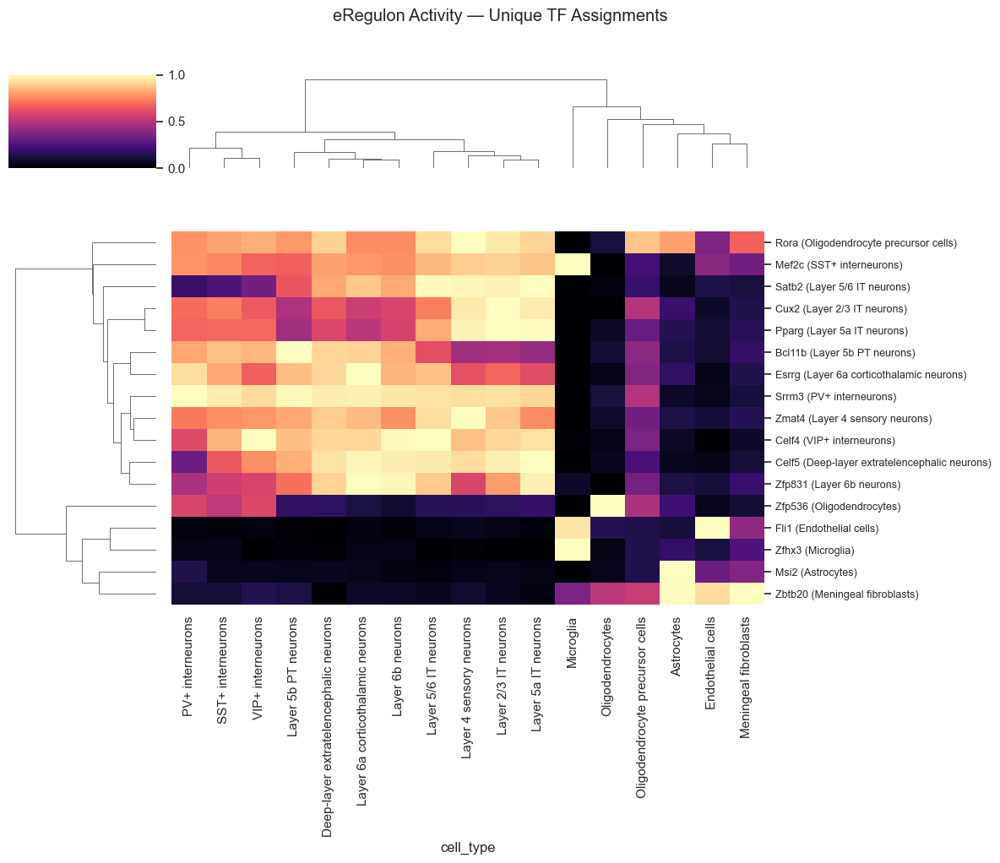

✅ Saved eRegulon_Heatmap_FIX9.png


In [435]:
# In[FIX-9]:
# ── Re-score eRegulon_AUC_Manual_Unique with corrected df_manual_unique ───────
from scenicplus.eregulon_enrichment import score_eRegulons

print("── Re-scoring ──")
auc_result = score_eRegulons(
    eRegulons    = df_manual_unique,
    gex_mtx      = scplus_obj.to_df("EXP"),
    acc_mtx      = scplus_obj.to_df("ACC"),
    auc_threshold= 0.05,
    normalize    = False,
    n_cpu        = 4,
)

scplus_obj.uns["eRegulon_AUC_Manual_Unique"] = auc_result
auc_gb = auc_result["Gene_based"]

print(f"✅ Gene-based shape: {auc_gb.shape}")

# ── Verify: PV+ vs SST+, L2/3 vs L5a ─────────────────────────────────────────
from scipy.stats import pearsonr

pairs = [
    ("PV+ interneurons_pos_manual",   "SST+ interneurons_pos_manual",     "PV+ ↔ SST+"),
    ("Layer 2/3 IT neurons_pos_manual","Layer 5a IT neurons_pos_manual",  "L2/3 ↔ L5a IT"),
    ("Astrocytes_pos_manual",          "Microglia_pos_manual",             "Astro ↔ Microglia"),
    ("Oligodendrocytes_pos_manual",    "Oligodendrocyte precursor cells_pos_manual", "Oligo ↔ OPC"),
]

print("\n── Pearson r between eRegulon AUC vectors ──")
for a, b, label in pairs:
    if a in auc_gb.columns and b in auc_gb.columns:
        r, _ = pearsonr(auc_gb[a], auc_gb[b])
        status = "✅ distinct" if abs(r) < 0.95 else "⚠️  still similar"
        print(f"  {label:30s}: r = {r:.4f}  {status}")

# ── Quick heatmap to eyeball diagonal ─────────────────────────────────────────
import seaborn as sns
import matplotlib.pyplot as plt

meta       = scplus_obj.metadata_cell
summary    = auc_gb.copy()
summary["cell_type"] = meta["cell_type"]
heatmap_data = summary.groupby("cell_type").mean().rename(columns=tf_mapping)

plt.figure(figsize=(14, 12))
g = sns.clustermap(
    heatmap_data.T,
    cmap="magma",
    standard_scale=0,
    figsize=(12, 10),
    yticklabels=True,
    xticklabels=True,
)
plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0, fontsize=9)
g.fig.suptitle("eRegulon Activity — Unique TF Assignments", y=1.02)
plt.tight_layout()
plt.savefig("eRegulon_Heatmap_FIX9.png", dpi=200, bbox_inches="tight")
plt.show()
print("✅ Saved eRegulon_Heatmap_FIX9.png")

In [139]:
# import pickle

# # Save the full object
# with open('scplus_obj_with_manual_auc_TF_mapped.pkl', 'wb') as f:
#     pickle.dump(scplus_obj, f)

# # Also save your custom dataframe and mapping just in case
# checkpoint_data = {
#     'df_manual_unique': df_manual_unique,
#     'tf_mapping': tf_mapping
# }
# with open('manual_signatures_data.pkl', 'wb') as f:
#     pickle.dump(checkpoint_data, f)

# print("✅ Progress saved!")

✅ Progress saved!


In [424]:
# In[SAVE-NOW]:
import pickle, os

OUT_DIR = os.path.expanduser("~/Downloads/Seurat_scATAC-seq/scenicplus_output")
save_path = f"{OUT_DIR}/scenicplus/scplus_obj_corrected_eregulon.pkl"

# Also checkpoint df_manual_unique and tf_mapping separately (cheap insurance)
checkpoint = {
    "df_manual_unique" : df_manual_unique,
    "tf_mapping"       : tf_mapping,
    "tf2g_filtered"    : tf2g_filtered,
}

with open(f"{OUT_DIR}/scenicplus/manual_signatures_checkpoint.pkl", "wb") as f:
    pickle.dump(checkpoint, f)

with open(save_path, "wb") as f:
    pickle.dump(scplus_obj, f)

print(f"✅ Object saved to: {save_path}")

✅ Object saved to: /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scplus_obj_corrected_eregulon.pkl


In [445]:
# In[ALIAS] — corrected
scplus_obj.uns["eRegulon_AUC_Manual"] = scplus_obj.uns["eRegulon_AUC_Manual_Unique"]

auc_mtx            = scplus_obj.uns["eRegulon_AUC_Manual_Unique"]["Gene_based"]
auc_df             = auc_mtx
final_plot_mapping = tf_mapping_clean   # ← clean labels: "Msi2" not "Msi2 (Astrocytes)"

import scanpy as sc
auc_ad = sc.AnnData(auc_mtx)
auc_ad.obs = scplus_obj.metadata_cell.copy()

print("✅ Sample labels:", list(final_plot_mapping.items())[:3])

✅ Sample labels: [('Astrocytes_pos_manual', 'Msi2'), ('SST+ interneurons_pos_manual', 'Mef2c'), ('Layer 5/6 IT neurons_pos_manual', 'Satb2')]


... storing 'cell_type' as categorical
... storing 'genotype' as categorical
/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


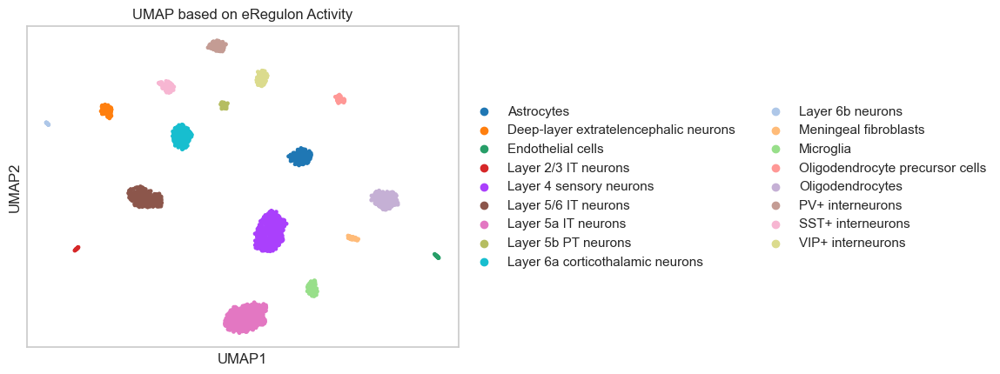

In [426]:
import scanpy as sc
import pandas as pd

# 1. Create an AnnData object specifically for the AUC scores
# We use the Gene_based results we just generated
auc_ad = sc.AnnData(scplus_obj.uns['eRegulon_AUC_Manual_Unique']['Gene_based'])
auc_ad.obs = scplus_obj.metadata_cell.copy()

# 2. Run standard scanpy workflow on the AUC matrix
sc.pp.neighbors(auc_ad, use_rep='X') # Uses AUC scores to find neighbors
sc.tl.umap(auc_ad)

# 3. Plot the UMAP colored by cell type
sc.pl.umap(auc_ad, color='cell_type', title='UMAP based on eRegulon Activity')

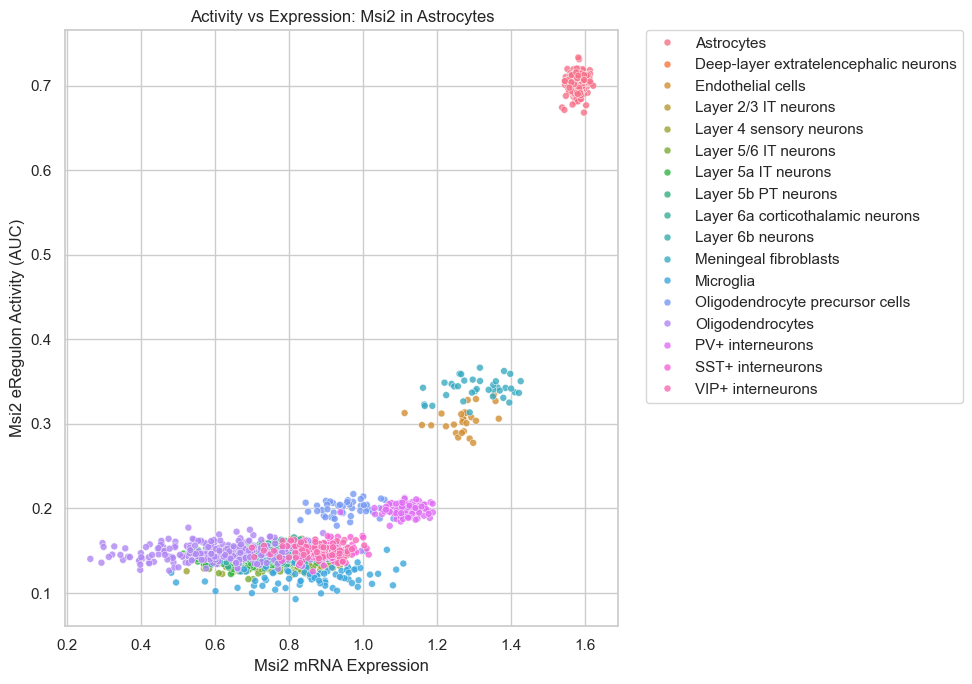

In [434]:
import matplotlib.pyplot as plt
import seaborn as sns

tf_to_check = 'Msi2'
cell_type_to_check = 'Astrocytes'

# Get data
gex_val = scplus_obj.to_df('EXP')[tf_to_check]
auc_val = scplus_obj.uns['eRegulon_AUC_Manual_Unique']['Gene_based'][f"{cell_type_to_check}_pos_manual"]

plt.figure(figsize=(10, 7)) # Increased width to accommodate legend
sns.scatterplot(
    x=gex_val, 
    y=auc_val, 
    hue=scplus_obj.metadata_cell['cell_type'], 
    s=25, 
    alpha=0.8
)

plt.xlabel(f'{tf_to_check} mRNA Expression')
plt.ylabel(f'{tf_to_check} eRegulon Activity (AUC)')
plt.title(f'Activity vs Expression: {tf_to_check} in {cell_type_to_check}')

# Force legend outside to the right
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.tight_layout()
plt.show()

In [427]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Setup Directories
base_path = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus"
csv_out_dir = os.path.join(base_path, "top_20_targets_by_cell_type")
plots_out_dir = os.path.join(base_path, "individual_tf_driver_plots")

os.makedirs(csv_out_dir, exist_ok=True)
os.makedirs(plots_out_dir, exist_ok=True)

# 2. Save Top 20 Targets per Cell Type to CSV
for sig_name in df_manual_unique['Gene_signature_name'].unique():
    # Sanitize name: replace / and spaces
    clean_name = sig_name.replace('_pos_manual', '').replace('/', '_').replace(' ', '_')
    
    top_20 = df_manual_unique[df_manual_unique['Gene_signature_name'] == sig_name].head(20)
    csv_filename = os.path.join(csv_out_dir, f"{clean_name}_top_20_targets.csv")
    top_20.to_csv(csv_filename, index=False)

print(f"✅ CSVs saved to: {csv_out_dir}")

# 3. Save INDIVIDUAL plots for EVERY TF in your mapping
for sig, tf_full_name in tf_mapping.items():
    # Get the short TF name (e.g., 'Gli3')
    tf_name = tf_full_name.split(' (')[0].strip()
    
    # Sanitize for the filename
    file_label = sig.replace('_pos_manual', '').replace('/', '_').replace(' ', '_')
    
    # Check if TF exists in the expression matrix
    if tf_name in scplus_obj.to_df('EXP').columns:
        gex_data = scplus_obj.to_df('EXP')[tf_name]
        auc_data = scplus_obj.uns['eRegulon_AUC_Manual_Unique']['Gene_based'][sig]
        
        plt.figure(figsize=(10, 7))
        sns.scatterplot(
            x=gex_data, 
            y=auc_data, 
            hue=scplus_obj.metadata_cell['cell_type'], 
            s=30, 
            alpha=0.7,
            palette='tab20'
        )
        
        plt.title(f'Activity vs Expression: {tf_name} ({sig.replace("_pos_manual", "")})')
        plt.xlabel(f'{tf_name} mRNA Expression')
        plt.ylabel(f'{tf_name} eRegulon Activity (AUC)')
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
        plt.tight_layout()
        
        # Save each plot as a separate file
        plot_path = os.path.join(plots_out_dir, f"{file_label}_driver_plot.pdf")
        plt.savefig(plot_path)
        plt.close() # Important to close to free up memory
    else:
        print(f"⚠️ Skipping {tf_name}: Not found in expression matrix.")

print(f"✅ All individual plots saved to: {plots_out_dir}")

✅ CSVs saved to: /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/top_20_targets_by_cell_type
2026-05-06 14:00:09,469 fontTools.subset INFO     maxp pruned
2026-05-06 14:00:09,469 fontTools.subset INFO     LTSH dropped
2026-05-06 14:00:09,470 fontTools.subset INFO     cmap pruned
2026-05-06 14:00:09,470 fontTools.subset INFO     kern dropped
2026-05-06 14:00:09,472 fontTools.subset INFO     post pruned
2026-05-06 14:00:09,472 fontTools.subset INFO     PCLT dropped
2026-05-06 14:00:09,472 fontTools.subset INFO     JSTF dropped
2026-05-06 14:00:09,472 fontTools.subset INFO     DSIG dropped
2026-05-06 14:00:09,474 fontTools.subset INFO     GPOS pruned
2026-05-06 14:00:09,476 fontTools.subset INFO     GSUB pruned
2026-05-06 14:00:09,480 fontTools.subset INFO     glyf pruned
2026-05-06 14:00:09,481 fontTools.subset INFO     Added gid0 to subset
2026-05-06 14:00:09,481 fontTools.subset INFO     Added first four glyphs to subset
2026-05-06 14:00:09,482 fontTools.subset INF

In [150]:
dir(scenicplus)

['BASCA',
 'DistributionNotFound',
 'RSS',
 'TF_to_gene',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 '__version__',
 '__warningregistry__',
 'cli',
 'data_wrangling',
 'differentiation_potential',
 'enhancer_to_gene',
 'eregulon_enrichment',
 'get_distribution',
 'grn_builder',
 'loom',
 'networks',
 'plotting',
 'preprocessing',
 'regulon_qc',
 'scenicplus_class',
 'scenicplus_mudata',
 'simulation',
 'snakemake',
 'tangram',
 'triplet_score',
 'utils',
 'wrappers']

In [428]:
# Check if the TF names in your GBM results actually exist in your motif mapping
gbm_tfs = set(scplus_obj.uns['TF2G_importance']['TF'])
motif_tfs = set(scplus_obj.menr.keys()) # Or however your version stores the mapping

overlap = gbm_tfs.intersection(motif_tfs)
print(f"TFs in GBM: {len(gbm_tfs)}, TFs with motifs: {len(motif_tfs)}, Intersection: {len(overlap)}")

TFs in GBM: 36155, TFs with motifs: 17, Intersection: 0


In [429]:
# 1. Check the format of your GBM TFs
print("Sample GBM TFs:", list(scplus_obj.uns['TF2G_importance']['TF'][:5]))

# 2. Check the format of your Motif TFs
print("Sample Motif TFs:", list(scplus_obj.menr.keys())[:5])

# 3. Check for Case Sensitivity
# If GBM says 'Pax6' and Motif says 'PAX6', the intersection will be 0.
gbm_tfs_upper = set([str(x).upper() for x in scplus_obj.uns['TF2G_importance']['TF']])
motif_tfs_upper = set([str(x).upper() for x in scplus_obj.menr.keys()])
new_intersection = gbm_tfs_upper.intersection(motif_tfs_upper)

print(f"Intersection if we ignore case: {len(new_intersection)}")

Sample GBM TFs: ['0610005C13Rik', '0610005C13Rik', '0610005C13Rik', '0610005C13Rik', '0610005C13Rik']
Sample Motif TFs: ['Astrocytes', 'SST+ interneurons', 'Layer 5/6 IT neurons', 'Deep-layer extratelencephalic neurons', 'Oligodendrocyte precursor cells']
Intersection if we ignore case: 0


In [430]:
# 1. List all keys in .uns to find where motif data is stored
print("Keys in scplus_obj.uns:", scplus_obj.uns.keys())

# 2. Check if you have a motif-to-TF mapping table
# This is usually created during the pycisTarget step
if 'motif_enrichment' in scplus_obj.uns:
    print("Found motif_enrichment table!")
    display(scplus_obj.uns['motif_enrichment'].head())

Keys in scplus_obj.uns: dict_keys(['search_space', 'cistromes', 'Region_to_gene', 'TF2G_importance', 'eRegulon_AUC_thresholds', 'eRegulon_AUC', 'eRegulon_AUC_Full', 'eRegulon_AUC_Manual', 'eRegulon_AUC_Manual_Unique', 'RSS', 'eRegulon_AUC_NAMED'])


In [181]:
# import pickle
# import os

# # Save a recovery checkpoint
# backup_path = f"{OUT_DIR}/scenicplus/scplus_obj_PRE_REGULON_CLEANUP.pkl"

# with open(backup_path, "wb") as f:
#     pickle.dump(scplus_obj, f)

# print(f"Checkpoint saved to {backup_path}. You can now safely proceed with the cleanup.")

Checkpoint saved to /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scplus_obj_PRE_REGULON_CLEANUP.pkl. You can now safely proceed with the cleanup.


In [182]:
# # 1. Remove the malformed dictionary-based regulons
# if 'eRegulons' in scplus_obj.uns:
#     print(f"Removing {len(scplus_obj.uns['eRegulons'])} malformed regulon entries...")
#     del scplus_obj.uns['eRegulons']

Removing 51 malformed regulon entries...


In [183]:
# 2. Verify your cistrome TFs (the bridge to your names)
cistrome_tfs = [c.split('_')[0] for c in scplus_obj.uns['cistromes'].keys()]
print(f"Sample TFs from cistromes: {cistrome_tfs[:5]}")

Sample TFs from cistromes: ['Astrocytes', 'SST+ interneurons', 'Layer 5/6 IT neurons', 'Deep-layer extratelencephalic neurons', 'Oligodendrocyte precursor cells']


In [187]:
import pandas as pd
motif_annot = pd.read_csv(motif_annotation, sep='\t')
print(motif_annot.columns)
# Standard columns are usually: 'Motif_ID', 'Gene_name'

Index(['#motif_id', 'motif_name', 'motif_description', 'source_name',
       'source_version', 'gene_name', 'motif_similarity_qvalue',
       'similar_motif_id', 'similar_motif_description', 'orthologous_identity',
       'orthologous_gene_name', 'orthologous_species', 'description'],
      dtype='object')


/var/folders/c5/9gnt7c7x7x59ygrp90w3n60r0000gn/T/ipykernel_69539/3493215829.py:2: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.


In [189]:
import scenicplus
import inspect

# This will list everything inside the package to find the correct path
print([name for name in dir(scenicplus) if 'enrichment' in name.lower() or 'results' in name.lower()])

['eregulon_enrichment']


In [431]:
import scenicplus
# Search all submodules for the get_cistromes function
import pkgutil
for loader, name, is_pkg in pkgutil.walk_packages(scenicplus.__path__, scenicplus.__name__ + "."):
    try:
        module = __import__(name, fromlist=['get_cistromes'])
        if hasattr(module, 'get_cistromes'):
            print(f"✅ Found it! Use: from {name} import get_cistromes")
    except:
        continue

In [432]:
# 1. Get the current AUC matrix
auc_mtx = scplus_obj.uns['eRegulon_AUC_Manual_Unique']['Gene_based'].copy()

# 2. Use your 'tf_mapping' to create new, readable names
# This transforms 'Astrocytes_pos_manual' -> 'Sox9 (+)'
new_column_names = []
for col in auc_mtx.columns:
    tf_name = tf_mapping.get(col, col) # Fallback to original if mapping fails
    suffix = " (+)" if "pos" in col else " (-)"
    new_column_names.append(f"{tf_name}{suffix}")

auc_mtx.columns = new_column_names

# 3. Save this specifically for plotting
scplus_obj.uns['eRegulon_AUC_NAMED'] = auc_mtx
print(f"Renamed {len(auc_mtx.columns)} signatures with actual TF names.")

Renamed 17 signatures with actual TF names.


In [212]:
import pycistarget
print(dir(pycistarget))

['PackageNotFoundError', '__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__', '__version__', 'cli', 'input_output', 'motif_enrichment_cistarget', 'motif_enrichment_dem', 'motif_enrichment_result', 'utils', 'version']


In [213]:
import pycistarget.utils
import pycistarget.motif_enrichment_cistarget

print("Functions in pycistarget.utils:")
print([f for f in dir(pycistarget.utils) if 'Target' in f or 'enrich' in f.lower()])

print("\nFunctions in pycistarget.motif_enrichment_cistarget:")
print([f for f in dir(pycistarget.motif_enrichment_cistarget) if 'run' in f or 'Target' in f])

Functions in pycistarget.utils:
[]

Functions in pycistarget.motif_enrichment_cistarget:
['cisTarget', 'cisTargetDatabase']


In [232]:
import pickle
import glob
import os

OUT_MOTIF = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/manual_motif_enrichment"
# Grab the first file found
files = glob.glob(os.path.join(OUT_MOTIF, "*_enrichment.pkl"))

if files:
    with open(files[0], 'rb') as f:
        res = pickle.load(f)
    
    print(f"Structure of {os.path.basename(files[0])}:")
    print(f"Type: {type(res)}")
    
    if isinstance(res, list):
        print(f"It's a list with {len(res)} items.")
        print(f"First item keys: {res[0].keys() if isinstance(res[0], dict) else 'Not a dict'}")
    elif isinstance(res, dict):
        print(f"Keys: {list(res.keys())}")
        # Let's check if 'region_set' is actually a dictionary or a list
        if 'region_set' in res:
            print(f"Type of region_set: {type(res['region_set'])}")
            try:
                print(f"Sample regions: {list(res['region_set'])[:3]}")
            except:
                print("Could not cast region_set to list.")
else:
    print("No pkl files found in that directory.")

Structure of Astrocytes_enrichment.pkl:
Type: <class 'dict'>
Keys: ['ctx', 'dem']


In [438]:
import pickle, os

sample_pkl = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/manual_motif_enrichment/Astrocytes_enrichment.pkl"

with open(sample_pkl, 'rb') as f:
    res = pickle.load(f)

ctx = res['ctx']

print("=== db_rankings shape ===")
print(ctx.db_rankings.shape)   # (n_motifs, n_regions_in_DB)

print("\n=== db_rankings index (first 3 motifs) ===")
print(ctx.db_rankings.index[:3].tolist())

print("\n=== db_rankings columns (first 3 regions) ===")
print(ctx.db_rankings.columns[:3].tolist())

print("\n=== regions_to_db type and first 3 ===")
print(type(ctx.regions_to_db))
try:
    print(list(ctx.regions_to_db)[:3])
except:
    print(ctx.regions_to_db)

print("\n=== total_regions ===")
print(ctx.total_regions)

=== db_rankings shape ===
(5032, 7250)

=== db_rankings index (first 3 motifs) ===
['bergman__Su_H_', 'bergman__croc', 'bergman__pho']

=== db_rankings columns (first 3 regions) ===
['chr10:100521668-100521994', 'chr10:111455357-111455587', 'chr10:111652462-111652651']

=== regions_to_db type and first 3 ===
<class 'pandas.core.frame.DataFrame'>
['Target', 'Query']

=== total_regions ===
1110655


In [442]:
print("tf_mapping (correct):")
for k, v in sorted(tf_mapping.items())[:3]:
    print(f"  {k}: {v}")

print("\nfinal_tf_mapping (wrong — motif-based):")
for k, v in sorted(final_tf_mapping.items())[:3]:
    print(f"  {k}: {v}")

tf_mapping (correct):
  Astrocytes_pos_manual: Msi2 (Astrocytes)
  Deep-layer extratelencephalic neurons_pos_manual: Celf5 (Deep-layer extratelencephalic neurons)
  Endothelial cells_pos_manual: Fli1 (Endothelial cells)

final_tf_mapping (wrong — motif-based):
  Astrocytes_pos_manual: Sp3
  Deep-layer_extratelencephalic_neurons_pos_manual: Yy1
  Endothelial_cells_pos_manual: Gm9049


In [ ]:
# import pandas as pd
# import pickle
# import glob
# import os

# motif_annot = pd.read_csv(motif_annotation, sep='\t', low_memory=False)
# motif_annot = motif_annot.rename(columns={'#motif_id': 'motif_id'})
# mapping_dict = dict(zip(motif_annot['motif_id'], motif_annot['gene_name']))

# OUT_MOTIF = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/manual_motif_enrichment"
# final_tf_mapping = {}

# for pkl_path in glob.glob(os.path.join(OUT_MOTIF, "*_enrichment.pkl")):
#     with open(pkl_path, 'rb') as f:
#         res = pickle.load(f)

#     cell_type = os.path.basename(pkl_path).replace('_enrichment.pkl', '')
#     signature_name = f"{cell_type}_pos_manual"
#     ctx = res['ctx']

#     print(f"Ranking motifs for {cell_type}...")

#     try:
#         rankings = ctx.db_rankings  # (5032 motifs × 7250 DAR regions)

#         # Mean rank per motif across YOUR DAR regions (already pre-filtered)
#         # Lower mean rank = motif sites are consistently near the top = enriched
#         mean_ranks = rankings.mean(axis=1)

#         # Enrichment = how much lower than the expected random rank
#         # Expected random = total_regions / 2
#         expected_random = ctx.total_regions / 2
#         enrichment_score = expected_random - mean_ranks  # higher = more enriched

#         top_motif   = enrichment_score.idxmax()
#         gene_symbol = mapping_dict.get(top_motif, top_motif)

#         final_tf_mapping[signature_name] = gene_symbol
#         print(f"   ✅ Winner: {gene_symbol}  |  motif: {top_motif}  |  score: {enrichment_score.max():.0f}  |  mean_rank: {mean_ranks.min():.0f} / {ctx.total_regions}")

#     except Exception as e:
#         print(f"   💥 Error: {e}")

# print(f"\nMapped {len(final_tf_mapping)} clusters.")
# print(final_tf_mapping)

In [240]:
# # Run this to see exactly which names failed to match
# mapped_names = list(final_plot_mapping.keys())
# unmapped = [c for c in auc_mtx.columns if c not in mapped_names and c != 'CellType']
# print("Still missing these 5 signatures:")
# print(unmapped)

# print("\nAvailable keys in our TF dictionary:")
# print(list(final_tf_mapping.keys()))

Still missing these 5 signatures:
['Layer 2/3 IT neurons_pos_manual', 'Layer 5/6 IT neurons_pos_manual', 'PV+ interneurons_pos_manual', 'SST+ interneurons_pos_manual', 'VIP+ interneurons_pos_manual']

Available keys in our TF dictionary:
['Astrocytes_pos_manual', 'SSTpos_interneurons_pos_manual', 'Layer_5_6_IT_neurons_pos_manual', 'Deep-layer_extratelencephalic_neurons_pos_manual', 'Oligodendrocyte_precursor_cells_pos_manual', 'Endothelial_cells_pos_manual', 'Layer_6b_neurons_pos_manual', 'Meningeal_fibroblasts_pos_manual', 'PVpos_interneurons_pos_manual', 'Layer_5b_PT_neurons_pos_manual', 'Layer_5a_IT_neurons_pos_manual', 'Microglia_pos_manual', 'Layer_4_sensory_neurons_pos_manual', 'Layer_2_3_IT_neurons_pos_manual', 'Layer_6a_corticothalamic_neurons_pos_manual', 'Oligodendrocytes_pos_manual', 'VIPpos_interneurons_pos_manual']


In [ ]:
# # 1. Create a translation dictionary to handle the + vs pos and space vs underscore
# translation_rules = {
#     'PV+': 'PVpos',
#     'SST+': 'SSTpos',
#     'VIP+': 'VIPpos'
# }

# final_plot_mapping = {}

# for col in auc_mtx.columns:
#     if col == 'CellType': continue
    
#     # Standardize the name for comparison
#     lookup_name = col
#     for char, replacement in translation_rules.items():
#         lookup_name = lookup_name.replace(char, replacement)
    
#     # Normalize spaces to underscores to match the dictionary keys
#     lookup_name = lookup_name.replace(' ', '_')
    
#     if lookup_name in final_tf_mapping:
#         final_plot_mapping[col] = final_tf_mapping[lookup_name]
#     else:
#         # One last check: try removing underscores entirely if it still fails
#         clean_col = col.replace(' ', '').replace('_', '').replace('+', 'pos')
#         dict_clean = {k.replace('_', '').replace(' ', ''): v for k, v in final_tf_mapping.items()}
#         if clean_col in dict_clean:
#             final_plot_mapping[col] = dict_clean[clean_col]

# print(f"Final Count: {len(final_plot_mapping)}/17 signatures matched.")

# # 2. Re-plot with the full set
# summary_mapped = summary[list(final_plot_mapping.keys())].T
# summary_mapped.index = [final_plot_mapping[idx] for idx in summary_mapped.index]

# # Scale and Plot
# summary_scaled = summary_mapped.apply(lambda x: (x - x.min()) / (x.max() - x.min()) if (x.max() - x.min()) != 0 else x, axis=1)

# plt.figure(figsize=(12, 11))
# sns.heatmap(summary_scaled, cmap='magma', yticklabels=True)
# plt.title("Master Regulator Map", fontsize=16)
# plt.xticks(rotation=45, ha='right')
# plt.tight_layout()
# plt.show()

✅ AUC matrix columns sample: ['Astrocytes_pos_manual', 'Deep-layer extratelencephalic neurons_pos_manual', 'Endothelial cells_pos_manual']
✅ tf_mapping_clean sample: [('Astrocytes_pos_manual', 'Msi2'), ('SST+ interneurons_pos_manual', 'Mef2c'), ('Layer 5/6 IT neurons_pos_manual', 'Satb2')]
✅ summary_mapped shape: (17, 17)
   Rows (TFs): ['Msi2', 'Mef2c', 'Satb2', 'Celf5', 'Rora', 'Fli1', 'Zfp831', 'Zbtb20', 'Srrm3', 'Bcl11b', 'Pparg', 'Zfhx3', 'Zmat4', 'Cux2', 'Esrrg', 'Zfp536', 'Celf4']


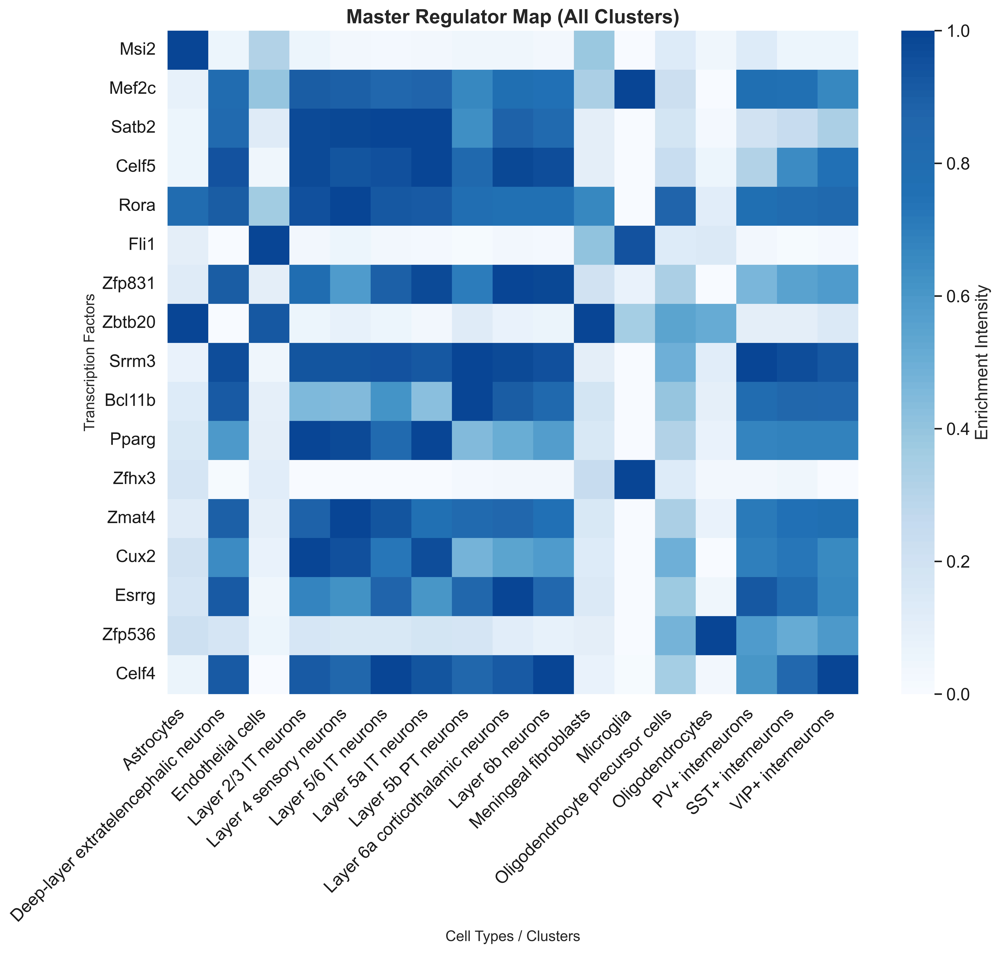

✅ Saved: Master_Regulator_Full.png


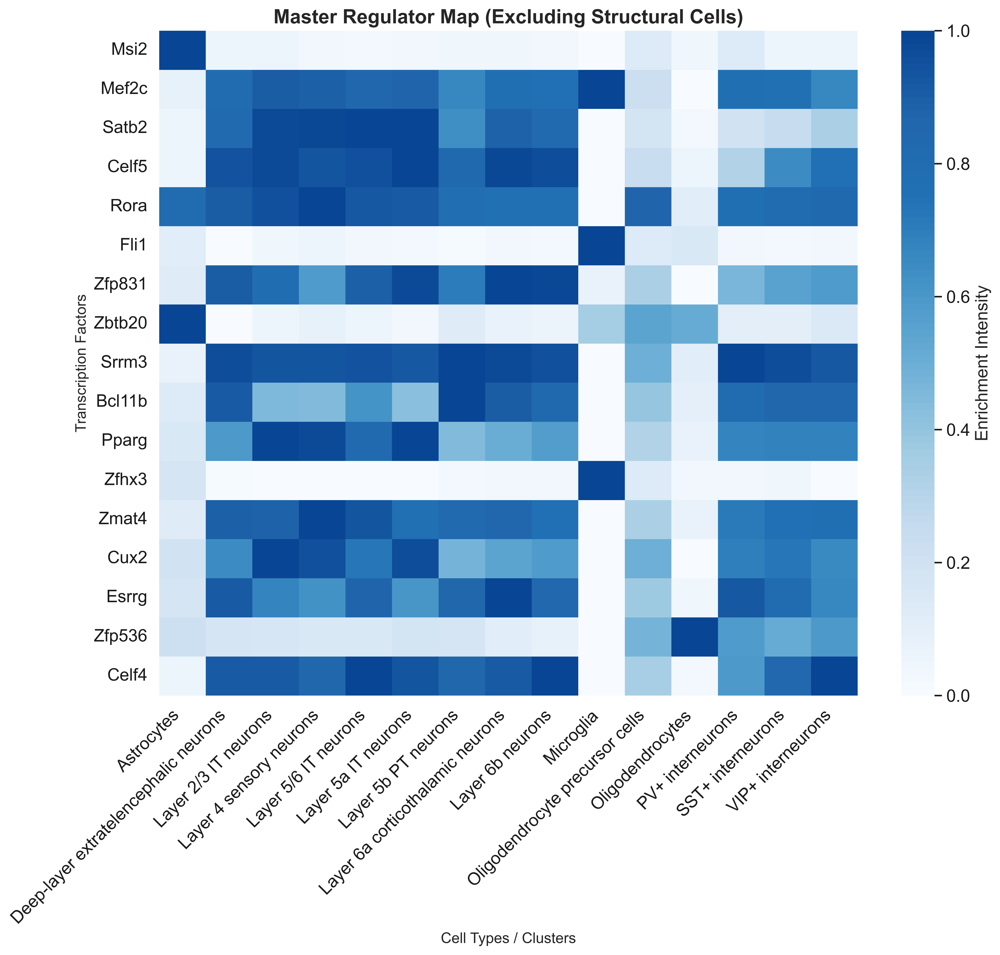

✅ Saved: Master_Regulator_Neuronal_Only.png


In [529]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
import matplotlib.colors as mcolors
import pandas as pd

# 1. Global font
mpl.rcParams['font.sans-serif'] = ['Arial', 'Helvetica', 'DejaVu Sans', 'sans-serif']
mpl.rcParams['font.family'] = 'sans-serif'

# 2. Custom colormap
hex_colors = [
    "#f7fbff", "#deebf7", "#c6dbef", "#9ecae1",
    "#6baed6", "#4292c6", "#2171b5", "#2166ac", "#084594"
]
custom_blues_cmap = mcolors.LinearSegmentedColormap.from_list("R_Blues", hex_colors, N=100)

# 3. Rebuild summary from scratch using the CORRECT auc_mtx and tf_mapping_clean
auc_mtx  = scplus_obj.uns["eRegulon_AUC_Manual_Unique"]["Gene_based"]
meta     = scplus_obj.metadata_cell.copy()

# Sanity check — confirm correct TFs are present
assert "Astrocytes_pos_manual" in auc_mtx.columns, "❌ AUC matrix missing expected columns"
print("✅ AUC matrix columns sample:", auc_mtx.columns[:3].tolist())
print("✅ tf_mapping_clean sample:", list(tf_mapping_clean.items())[:3])

# Build per-cell summary then average per cell type
summary_raw = auc_mtx.copy()
summary_raw["cell_type"] = meta.loc[summary_raw.index, "cell_type"]

# Mean AUC per cell type × signature
summary_ct = summary_raw.groupby("cell_type")[list(tf_mapping_clean.keys())].mean()

# Transpose: rows = TF signatures, columns = cell types
summary_mapped = summary_ct[list(tf_mapping_clean.keys())].T
summary_mapped.index = [tf_mapping_clean[idx] for idx in summary_mapped.index]

print(f"✅ summary_mapped shape: {summary_mapped.shape}")
print(f"   Rows (TFs): {summary_mapped.index.tolist()}")

# 4. Plot function
def generate_master_heatmap(data_df, filename, title):
    plt.figure(figsize=(12, 11))
    
    scaled_df = data_df.apply(
        lambda x: (x - x.min()) / (x.max() - x.min()) if (x.max() - x.min()) != 0 else x,
        axis=1
    )
    
    sns.heatmap(
        scaled_df,
        cmap=custom_blues_cmap,
        yticklabels=True,
        cbar_kws={'label': 'Enrichment Intensity'}
    )
    
    plt.title(title, fontsize=16, fontweight='bold')
    plt.xlabel("Cell Types / Clusters", fontsize=12)
    plt.ylabel("Transcription Factors", fontsize=12)
    plt.yticks(rotation=0)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.savefig(filename, dpi=600)
    plt.show()
    print(f"✅ Saved: {filename}")

# 5. Version 1 — All cell types
generate_master_heatmap(
    summary_mapped,
    "Master_Regulator_Full.png",
    "Master Regulator Map (All Clusters)"
)

# 6. Version 2 — Exclude structural cells
exclude_keywords = ['Endothelial', 'fibroblasts']
cols_to_keep = [
    col for col in summary_mapped.columns
    if not any(word in col for word in exclude_keywords)
]
generate_master_heatmap(
    summary_mapped[cols_to_keep],
    "Master_Regulator_Neuronal_Only.png",
    "Master Regulator Map (Excluding Structural Cells)"
)

In [ ]:
# import matplotlib.pyplot as plt
# import seaborn as sns
# import matplotlib as mpl
# import matplotlib.colors as mcolors
# import pandas as pd

# # 1. Set global font to Arial
# mpl.rcParams['font.sans-serif'] = ['Arial', 'Helvetica', 'DejaVu Sans', 'sans-serif']
# mpl.rcParams['font.family'] = 'sans-serif'

# # 2. Define custom color ramp
# # Replicating your R pal_blues palette
# hex_colors = [
#     "#f7fbff", "#deebf7", "#c6dbef", "#9ecae1",
#     "#6baed6", "#4292c6", "#2171b5", "#2166ac", "#084594"
# ]
# # Create colormap with 100 levels (N=100) just like your R code
# custom_blues_cmap = mcolors.LinearSegmentedColormap.from_list("R_Blues", hex_colors, N=100)

# def generate_master_heatmap(data_df, filename, title):
#     """Scales data, plots heatmap, and saves to disk."""
#     plt.figure(figsize=(12, 11))
    
#     # Min-Max Scaling per TF
#     scaled_df = data_df.apply(
#         lambda x: (x - x.min()) / (x.max() - x.min()) if (x.max() - x.min()) != 0 else x, 
#         axis=1
#     )
    
#     sns.heatmap(
#         scaled_df, 
#         cmap=custom_cmap, 
#        # center=0.5, 
#         yticklabels=True,
#         cbar_kws={'label': 'Enrichment Intensity'}
#     )
    
#     plt.title(title, fontsize=16, fontweight='bold')
#     plt.xlabel("Cell Types / Clusters", fontsize=12)
#     plt.ylabel("Transcription Factors", fontsize=12)
#     plt.yticks(rotation=0) # Horizontal labels
#     plt.xticks(rotation=45, ha='right')
    
#     plt.tight_layout()
#     # Save as high-res PNG (or .pdf / .svg)
#     plt.savefig(filename, dpi=600)
#     plt.show()
#     print(f"✅ Saved: {filename}")

# # --- EXECUTION ---

# # Data Preparation
# summary_mapped = summary[list(final_plot_mapping.keys())].T
# summary_mapped.index = [final_plot_mapping[idx] for idx in summary_mapped.index]

# # Version 1: All Cells
# generate_master_heatmap(
#     summary_mapped, 
#     "Master_Regulator_Full.png", 
#     "Master Regulator Map (All Clusters)"
# )

# # Version 2: Exclude Endothelial and Fibroblasts
# # We look for keywords to drop these columns
# exclude_keywords = ['Endothelial', 'fibroblasts']
# cols_to_keep = [
#     col for col in summary_mapped.columns 
#     if not any(word in col for word in exclude_keywords)
# ]
# filtered_summary = summary_mapped[cols_to_keep]

# generate_master_heatmap(
#     filtered_summary, 
#     "Master_Regulator_Neuronal_Only.png", 
#     "Master Regulator Map (Excluding Structural Cells)"
# )

In [ ]:
# def generate_master_heatmap_zscored(data_df, mapping, filename, title):
#     """Z-scores data, applies differentiated labeling, and plots."""
    
#     # 1. Differentiated Labeling Logic (Handling Zfp202, etc.)
#     # We do this BEFORE scaling to ensure we keep the rows separate
#     tf_counts = {}
#     for sig in data_df.index:
#         clean_name = mapping[sig]
#         tf_counts[clean_name] = tf_counts.get(clean_name, 0) + 1
    
#     final_row_labels = []
#     current_seen = {}
#     for sig in data_df.index:
#         clean_name = mapping[sig]
#         if tf_counts[clean_name] > 1:
#             current_seen[clean_name] = current_seen.get(clean_name, 0) + 1
#             label = f"{clean_name} ({current_seen[clean_name]})" if current_seen[clean_name] > 1 else clean_name
#         else:
#             label = clean_name
#         final_row_labels.append(label)
    
#     # 2. Apply Z-score Scaling (Standardization)
#     # This matches the 'Difference Map' style: (x - mean) / std
#     scaled_df = data_df.apply(
#         lambda x: (x - x.mean()) / (x.std() + 1e-9), 
#         axis=1
#     )
    
#     # Update index with our new labels
#     scaled_df.index = final_row_labels

#     # 3. Plotting
#     plt.figure(figsize=(12, 11))
    
#     # For Z-scores, we want 0 to be the center
#     limit = max(abs(scaled_df.values.min()), abs(scaled_df.values.max()))
    
#     sns.heatmap(
#         scaled_df, 
#         cmap=custom_blues_cmap, # Or 'vlag' / 'RdBu_r' if you want to see +/- 
#         center=0,
#         vmin=-limit,
#         vmax=limit,
#         yticklabels=True,
#         cbar_kws={'label': 'Activity Z-score'}
#     )
    
#     plt.title(title, fontsize=16, fontweight='bold')
#     plt.xlabel("Cell Types / Clusters", fontsize=12)
#     plt.ylabel("Transcription Factors", fontsize=12)
#     plt.yticks(rotation=0)
#     plt.xticks(rotation=45, ha='right')
    
#     plt.tight_layout()
#     plt.savefig(filename, dpi=600)
#     plt.show()
#     print(f"✅ Saved: {filename}")

# # --- EXECUTION ---

# # Create the base matrix (rows = signatures, columns = cell types)
# summary_raw = summary[list(final_plot_mapping.keys())].T

# # Version 1: All Cells
# generate_master_heatmap_zscored(
#     summary_raw, final_plot_mapping,
#     "Master_Regulator_Zscored_Full.png", 
#     "Master Regulator Map (Z-scored, All Clusters)"
# )

# # Version 2: Neuronal Only
# exclude_keywords = ['Endothelial', 'fibroblasts']
# cols_to_keep = [col for col in summary_raw.columns if not any(word in col for word in exclude_keywords)]
# summary_neuronal = summary_raw[cols_to_keep]

# generate_master_heatmap_zscored(
#     summary_neuronal, final_plot_mapping,
#     "Master_Regulator_Zscored_Neuronal.png", 
#     "Master Regulator Map (Z-scored, Neuronal Only)"
# )

In [ ]:
# # In[DIAG-1]:
# # ── Export raw AUC summary to CSV ─────────────────────────────────────────────

# summary_mapped.to_csv(f"{FURTHER}/Master_Regulator_AUC_summary.csv")
# print("✅ Saved: Master_Regulator_AUC_summary.csv")

# # ── Diagnostics: why do Tcf3 and Pparg look identical? ───────────────────────

# # 1. Find their original signature keys
# tcf3_sigs  = [k for k, v in final_plot_mapping.items() if "Tcf3"  in v]
# pparg_sigs = [k for k, v in final_plot_mapping.items() if "Pparg" in v]
# print(f"\nTcf3  signatures : {tcf3_sigs}")
# print(f"Pparg signatures : {pparg_sigs}")

# # 2. Raw (unscaled) AUC values per cell type
# print("\n── Raw AUC means (pre-scaling) ──")
# raw_rows = summary_mapped.loc[
#     [l for l in summary_mapped.index if "Tcf3" in l or "Pparg" in l]
# ]
# print(raw_rows.T.to_string())

# # 3. Pearson correlation between all rows — flag pairs > 0.99
# from scipy.stats import pearsonr

# labels = list(summary_mapped.index)
# high_corr_pairs = []
# for i in range(len(labels)):
#     for j in range(i + 1, len(labels)):
#         r, _ = pearsonr(summary_mapped.iloc[i], summary_mapped.iloc[j])
#         if abs(r) > 0.99:
#             high_corr_pairs.append((labels[i], labels[j], round(r, 4)))

# if high_corr_pairs:
#     print("\n⚠️  Nearly identical rows (Pearson r > 0.99):")
#     for a, b, r in sorted(high_corr_pairs, key=lambda x: -abs(x[2])):
#         print(f"   {a}  ↔  {b}   r = {r}")
# else:
#     print("\n✅ No row pairs with r > 0.99 found")

# # 4. Check if they share the same underlying signature / target genes
# print("\n── Target gene overlap ──")
# for sig_a in tcf3_sigs:
#     for sig_b in pparg_sigs:
#         genes_a = set(
#             df_manual_unique[df_manual_unique["Gene_signature_name"] == sig_a]["Gene"].tolist()
#         )
#         genes_b = set(
#             df_manual_unique[df_manual_unique["Gene_signature_name"] == sig_b]["Gene"].tolist()
#         )
#         overlap  = genes_a & genes_b
#         jaccard  = len(overlap) / len(genes_a | genes_b) if genes_a | genes_b else 0
#         print(f"\n  {sig_a}  ({len(genes_a)} genes)")
#         print(f"  {sig_b}  ({len(genes_b)} genes)")
#         print(f"  Overlap : {len(overlap)} genes  —  Jaccard = {jaccard:.3f}")
#         if overlap:
#             print(f"  Shared  : {sorted(overlap)[:20]}{'...' if len(overlap) > 20 else ''}")

# # 5. Check cell type assignments
# print("\n── Cell type assignments ──")
# for sig in tcf3_sigs + pparg_sigs:
#     print(f"   {sig:50s}  →  {sig_to_ct.get(sig, '?')}")

In [530]:
# In[DIAG-3 REVISED]:
# ── Inspect df_manual_unique structure ────────────────────────────────────────
print("Columns in df_manual_unique:")
print(list(df_manual_unique.columns))
print(f"\nShape: {df_manual_unique.shape}")
print("\nFirst 3 rows:")
print(df_manual_unique.head(3).to_string())

for sig in ["PV+ interneurons_pos_manual", "SST+ interneurons_pos_manual"]:
    sub = df_manual_unique[df_manual_unique["Gene_signature_name"] == sig]
    print(f"\n── {sig} ──")
    print(f"  Rows      : {len(sub)}")
    print(f"  Gene count: {sub['Gene'].nunique()}")
    print(f"  First 10  : {sorted(sub['Gene'].tolist())[:10]}")

# ── Discover available keys in scplus_obj.uns ─────────────────────────────────
print("\n── Keys in scplus_obj.uns ──")
print(list(scplus_obj.uns.keys()))

# ── Find the eRegulon metadata key ────────────────────────────────────────────
meta_key = next(
    (k for k in scplus_obj.uns.keys()
     if "regulon" in k.lower() and "meta" in k.lower()),
    None
)

if meta_key:
    print(f"\n   Using key: '{meta_key}'")
    meta = scplus_obj.uns[meta_key]
    print(f"   Columns: {list(meta.columns)}")
    mask = meta["Gene_signature_name"].str.contains("Tcf3|Pparg", na=False)
    hits = meta[mask]
    print(f"\n   Tcf3/Pparg entries: {len(hits)}")
    if len(hits) > 0:
        show_cols = [c for c in ["Gene_signature_name", "TF", "Gene", "is_extended"]
                     if c in meta.columns]
        print(hits[show_cols].drop_duplicates("Gene_signature_name").to_string())
else:
    print("\n⚠️  No eRegulon metadata key found. All uns keys listed above.")

Columns in df_manual_unique:
['Gene_signature_name', 'Gene', 'Region_signature_name', 'Region']

Shape: (2550, 4)

First 3 rows:
     Gene_signature_name   Gene  Region_signature_name Region
0  Astrocytes_pos_manual   Msi2  Astrocytes_pos_manual   Msi2
1  Astrocytes_pos_manual  Trpm3  Astrocytes_pos_manual  Trpm3
2  Astrocytes_pos_manual    Lpp  Astrocytes_pos_manual    Lpp

── PV+ interneurons_pos_manual ──
  Rows      : 150
  Gene count: 150
  First 10  : ['A230103L15Rik', 'A330102I10Rik', 'Acbd6', 'Acot7', 'Actr1b', 'Adar', 'Aff3', 'Afg3l2', 'Ahi1', 'Ankrd42']

── SST+ interneurons_pos_manual ──
  Rows      : 150
  Gene count: 150
  First 10  : ['4933406I18Rik', 'Aak1', 'Acsl4', 'Acsl5', 'Afdn', 'Akap6', 'Angel2', 'Anks3', 'Ap1b1', 'Ap2b1']

── Keys in scplus_obj.uns ──
['search_space', 'cistromes', 'Region_to_gene', 'TF2G_importance', 'eRegulon_AUC_thresholds', 'eRegulon_AUC', 'eRegulon_AUC_Full', 'eRegulon_AUC_Manual', 'eRegulon_AUC_Manual_Unique', 'RSS', 'eRegulon_AUC_NAMED']

⚠️

In [409]:
# # In[DIAG-4]:
# # ── Find where the PV+ and SST+ gene lists come from ─────────────────────────

# # Show all unique signature names and their gene counts
# sig_summary = (
#     df_manual_unique
#     .groupby("Gene_signature_name")["Gene"]
#     .agg(["count", "nunique"])
#     .rename(columns={"count": "rows", "nunique": "unique_genes"})
#     .sort_values("rows", ascending=False)
# )
# print("── Gene counts per signature ──")
# print(sig_summary.to_string())

# # ── Check which signature pairs share identical gene sets ─────────────────────
# from itertools import combinations

# sig_genes = (
#     df_manual_unique
#     .groupby("Gene_signature_name")["Gene"]
#     .apply(frozenset)
#     .to_dict()
# )

# print("\n── Identical gene-set pairs ──")
# found_any = False
# for a, b in combinations(sig_genes.keys(), 2):
#     if sig_genes[a] == sig_genes[b]:
#         print(f"  ✗ IDENTICAL: {a}  ↔  {b}  ({len(sig_genes[a])} genes)")
#         found_any = True
#     elif len(sig_genes[a] & sig_genes[b]) / len(sig_genes[a] | sig_genes[b]) > 0.8:
#         j = len(sig_genes[a] & sig_genes[b]) / len(sig_genes[a] | sig_genes[b])
#         print(f"  ⚠️  HIGH OVERLAP (Jaccard={j:.2f}): {a}  ↔  {b}")
#         found_any = True
# if not found_any:
#     print("  ✅ No identical or highly overlapping pairs found")

# # ── Check the source marker dataframe that fed into df_manual_unique ──────────
# # What was the variable used to build it? Try common names:
# for varname in ["markers", "marker_df", "deg_df", "marker_genes", "top_markers",
#                 "markers_df", "de_genes", "cluster_markers"]:
#     if varname in dir():
#         obj = eval(varname)
#         print(f"\n── Found '{varname}' ──")
#         print(type(obj))
#         if hasattr(obj, "head"):
#             print(obj.head(3).to_string())
#         break
# else:
#     print("\n⚠️  Source marker dataframe not found in namespace.")
#     print("   Check your Module A cell where df_manual_unique was built")
#     print("   and look for the step that filters for PV+ and SST+ interneurons.")

── Gene counts per signature ──
                                                  rows  unique_genes
Gene_signature_name                                                 
Astrocytes_pos_manual                              150           150
Layer 6b neurons_pos_manual                        150           150
SST+ interneurons_pos_manual                       150           150
PV+ interneurons_pos_manual                        150           150
Oligodendrocytes_pos_manual                        150           150
Oligodendrocyte precursor cells_pos_manual         150           150
Microglia_pos_manual                               150           150
Meningeal fibroblasts_pos_manual                   150           150
Layer 6a corticothalamic neurons_pos_manual        150           150
Deep-layer extratelencephalic neurons_pos_manual   150           150
Layer 5b PT neurons_pos_manual                     150           150
Layer 5a IT neurons_pos_manual                     150           150
La

In [483]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Setup Directories
base_path = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus"
csv_out_dir = os.path.join(base_path, "top_20_targets_by_cell_type")
plots_out_dir = os.path.join(base_path, "biological_tf_driver_plots") # New folder name

os.makedirs(csv_out_dir, exist_ok=True)
os.makedirs(plots_out_dir, exist_ok=True)

# 2. Use the final_plot_mapping we just created
# final_plot_mapping maps: 'Astrocytes_pos_manual' -> 'Sp3'

print(f"Starting plot generation for {len(final_plot_mapping)} matched TFs...")

for sig, tf_name in final_plot_mapping.items():
    # Sanitize name for filenames
    file_label = sig.replace('_pos_manual', '').replace('/', '_').replace(' ', '_')
    
    # Check if this data-driven TF exists in your expression matrix
    if tf_name in scplus_obj.to_df('EXP').columns:
        gex_data = scplus_obj.to_df('EXP')[tf_name]
        auc_data = scplus_obj.uns['eRegulon_AUC_Manual_Unique']['Gene_based'][sig]
        
        plt.figure(figsize=(10, 7))
        sns.scatterplot(
            x=gex_data, 
            y=auc_data, 
            hue=scplus_obj.metadata_cell['cell_type'], 
            s=40, 
            alpha=0.6,
            palette='tab20'
        )
        
        # Now the title reflects the real biology!
        plt.title(f'Biological Driver: {tf_name}\n(Targeting {sig.replace("_pos_manual", "")} regions)', fontsize=14)
        plt.xlabel(f'{tf_name} mRNA Expression', fontsize=12)
        plt.ylabel(f'{tf_name} Regulon Activity (AUC)', fontsize=12)
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()
        
        # Save plot
        plot_path = os.path.join(plots_out_dir, f"{file_label}_{tf_name}_driver_plot.pdf")
        plt.savefig(plot_path)
        plt.close()
        print(f"   ✅ Saved: {tf_name} plot for {file_label}")
        
    else:
        # If the TF isn't in the GEX matrix (e.g. Gm9049), we flag it
        print(f"   ⚠️ Skipping {tf_name}: This TF is not in your gene expression matrix.")

# 3. Optional: Export a master key CSV so you remember which TF goes with which cluster
mapping_df = pd.DataFrame(list(final_plot_mapping.items()), columns=['Signature', 'Identified_TF'])
mapping_df.to_csv(os.path.join(base_path, "cluster_to_tf_mapping.csv"), index=False)

print(f"\n🚀 Done! Biological plots saved to: {plots_out_dir}")

Starting plot generation for 17 matched TFs...
2026-05-06 18:15:33,940 fontTools.subset INFO     maxp pruned
2026-05-06 18:15:33,940 fontTools.subset INFO     LTSH dropped
2026-05-06 18:15:33,940 fontTools.subset INFO     cmap pruned
2026-05-06 18:15:33,941 fontTools.subset INFO     kern dropped
2026-05-06 18:15:33,942 fontTools.subset INFO     post pruned
2026-05-06 18:15:33,942 fontTools.subset INFO     PCLT dropped
2026-05-06 18:15:33,943 fontTools.subset INFO     JSTF dropped
2026-05-06 18:15:33,943 fontTools.subset INFO     DSIG dropped
2026-05-06 18:15:33,944 fontTools.subset INFO     GPOS pruned
2026-05-06 18:15:33,945 fontTools.subset INFO     GSUB pruned
2026-05-06 18:15:33,947 fontTools.subset INFO     glyf pruned
2026-05-06 18:15:33,948 fontTools.subset INFO     Added gid0 to subset
2026-05-06 18:15:33,948 fontTools.subset INFO     Added first four glyphs to subset
2026-05-06 18:15:33,948 fontTools.subset INFO     Closing glyph list over 'GSUB': 57 glyphs before
2026-05-06 1

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Setup Directories
base_path = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus"
csv_out_dir   = os.path.join(base_path, "top_20_targets_by_cell_type")
plots_out_dir = os.path.join(base_path, "biological_tf_driver_plots")

os.makedirs(csv_out_dir, exist_ok=True)
os.makedirs(plots_out_dir, exist_ok=True)

# 2. Save Top 20 Targets per Cell Type to CSV (from df_manual_unique)
print("── Saving top-20 target CSVs ──")
for sig_name in df_manual_unique['Gene_signature_name'].unique():
    clean_name = sig_name.replace('_pos_manual', '').replace('/', '_').replace(' ', '_')
    top_20 = df_manual_unique[df_manual_unique['Gene_signature_name'] == sig_name].head(20)
    csv_path = os.path.join(csv_out_dir, f"{clean_name}_top_20_targets.csv")
    top_20.to_csv(csv_path, index=False)
    print(f"   ✅ {clean_name}: {len(top_20)} rows → {os.path.basename(csv_path)}")

print(f"\n✅ CSVs saved to: {csv_out_dir}")

# 3. Save individual TF driver scatter plots
print("\n── Saving TF driver plots ──")
exp_df = scplus_obj.to_df('EXP')
auc_gb = scplus_obj.uns['eRegulon_AUC_Manual_Unique']['Gene_based']

for sig, tf_name in final_plot_mapping.items():
    file_label = sig.replace('_pos_manual', '').replace('/', '_').replace(' ', '_')
    
    if tf_name not in exp_df.columns:
        print(f"   ⚠️ Skipping {tf_name}: not in expression matrix.")
        continue
    if sig not in auc_gb.columns:
        print(f"   ⚠️ Skipping {sig}: not in AUC matrix.")
        continue

    gex_data = exp_df[tf_name]
    auc_data = auc_gb[sig]

    plt.figure(figsize=(10, 7))
    sns.scatterplot(
        x=gex_data,
        y=auc_data,
        hue=scplus_obj.metadata_cell['cell_type'],
        s=40,
        alpha=0.6,
        palette='tab20'
    )
    plt.title(f'Biological Driver: {tf_name}\n(Targeting {sig.replace("_pos_manual", "")} regions)', fontsize=14)
    plt.xlabel(f'{tf_name} mRNA Expression', fontsize=12)
    plt.ylabel(f'{tf_name} Regulon Activity (AUC)', fontsize=12)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()

    plot_path = os.path.join(plots_out_dir, f"{file_label}_{tf_name}_driver_plot.pdf")
    plt.savefig(plot_path)
    plt.close()
    print(f"   ✅ {tf_name} ({file_label})")

# 4. Export master mapping CSV
mapping_df = pd.DataFrame(list(final_plot_mapping.items()), columns=['Signature', 'Identified_TF'])
mapping_df.to_csv(os.path.join(base_path, "cluster_to_tf_mapping.csv"), index=False)

print(f"\n🚀 Done! CSVs → {csv_out_dir}")
print(f"       Plots → {plots_out_dir}")

In [531]:
# Quick check to see who didn't make the cut
generated_tfs = [f.split('_')[-3] for f in os.listdir(plots_out_dir) if f.endswith('.pdf')]
missing = [tf for tf in final_plot_mapping.values() if tf not in generated_tfs]
print(f"The 3 TFs missing from the GEX matrix are: {missing}")

The 3 TFs missing from the GEX matrix are: []


In [532]:
print(df_manual_unique.columns.tolist())

['Gene_signature_name', 'Gene', 'Region_signature_name', 'Region']


In [246]:
# import pandas as pd

# target_tf = 'Neurod1' 

# # 1. Find the signature name from the mapping we built earlier
# # (Assuming final_plot_mapping is still in memory)
# sig_name = [k for k, v in final_plot_mapping.items() if v == target_tf][0]

# # 2. Filter for the top 10 targets
# top_targets = df_manual_unique[df_manual_unique['Gene_signature_name'] == sig_name].head(10)

# print(f"--- Top 10 Target Genes for {target_tf} ---")
# print(top_targets[['Gene', 'Region']])

--- Top 10 Target Genes for Neurod1 ---
                     Gene                Region
900                 Nr4a2                 Nr4a2
901                Gm9264                Gm9264
902              Mup-ps13              Mup-ps13
903                Rhox2f                Rhox2f
904                Or51f5                Or51f5
905               Gm57147               Gm57147
906  ENSMUSG00000116029.3  ENSMUSG00000116029.3
907                 Fgf16                 Fgf16
908                Or51r1                Or51r1
909               Gm50370               Gm50370


In [533]:
import pandas as pd
import os

summary_data = []

# Loop through each matched signature and its corresponding TF
for sig, tf in final_plot_mapping.items():
    # Filter your main dataframe for this specific cluster's regulon
    subset = df_manual_unique[df_manual_unique['Gene_signature_name'] == sig].head(5)
    
    # Extract the unique gene names being targeted
    target_genes = ", ".join(subset['Gene'].unique().tolist())
    
    # Store the results with clean labels
    summary_data.append({
        'Cell Type Cluster': sig.replace('_pos_manual', '').replace('_', ' '),
        'Identified Master TF': tf,
        'Top 5 Target Genes': target_genes
    })

# Create the summary DataFrame
master_summary_df = pd.DataFrame(summary_data)

# Save it to your analysis folder
summary_csv_path = os.path.join(base_path, "master_regulator_target_summary.csv")
master_summary_df.to_csv(summary_csv_path, index=False)

# Display the summary nicely in your console
pd.set_option('display.max_colwidth', None)
print("✅ Master Regulator Biological Summary:")
print(master_summary_df)

✅ Master Regulator Biological Summary:
                        Cell Type Cluster Identified Master TF  \
0                              Astrocytes                 Msi2   
1                       SST+ interneurons                Mef2c   
2                    Layer 5/6 IT neurons                Satb2   
3   Deep-layer extratelencephalic neurons                Celf5   
4         Oligodendrocyte precursor cells                 Rora   
5                       Endothelial cells                 Fli1   
6                        Layer 6b neurons               Zfp831   
7                   Meningeal fibroblasts               Zbtb20   
8                        PV+ interneurons                Srrm3   
9                     Layer 5b PT neurons               Bcl11b   
10                    Layer 5a IT neurons                Pparg   
11                              Microglia                Zfhx3   
12                Layer 4 sensory neurons                Zmat4   
13                   Layer 2/3 IT neu

In [ ]:
####################################################################

In [ ]:
##################### GENOTYPE SEPARATE DATA #######################

In [ ]:
####################################################################

In [3]:
# Show the first 5 rows of metadata to find WT/KO labels
print(scplus_obj_geno.metadata_cell.head())

# Also list all column names just in case
print(scplus_obj_geno.metadata_cell.columns.tolist())

                      ct_geno genotype   cell_type
Astrocytes_Ctrl_0  Astrocytes     Ctrl  Astrocytes
Astrocytes_Ctrl_1  Astrocytes     Ctrl  Astrocytes
Astrocytes_Ctrl_2  Astrocytes     Ctrl  Astrocytes
Astrocytes_Ctrl_3  Astrocytes     Ctrl  Astrocytes
Astrocytes_Ctrl_4  Astrocytes     Ctrl  Astrocytes
['ct_geno', 'genotype', 'cell_type']


In [455]:
# # 1. Load the raw metadata without modifying it
# raw_meta = pd.read_csv(f"{INPUT_DIR}/atac_metadata.csv", index_col=0)

# # 2. Look for any column that distinguishes WT from KO
# print("Original Columns in CSV:", raw_meta.columns.tolist())
# print("\nUnique values in potentially relevant columns:")
# for col in raw_meta.columns:
#     if raw_meta[col].nunique() < 10: # Look for categorical columns like 'genotype' or 'group'
#         print(f"{col}: {raw_meta[col].unique()}")

Original Columns in CSV: ['cell_type', 'genotype', 'sex', 'sample', 'nCount_peaks', 'nFeature_peaks', 'nucleosome_signal', 'TSS.enrichment', 'barcode', 'sample_id']

Unique values in potentially relevant columns:
genotype: ['Ctrl' 'KO']
sex: ['male']
sample: ['Ctrl_m' 'KO_m']
sample_id: ['male_cortex']


In [456]:
# # Check the barcodes in the Expression matrix
# original_barcodes = scplus_obj.to_df('EXP').index.tolist()

# print(f"First 5 barcodes from data matrix: {original_barcodes[:5]}")

# # If these look like barcodes (e.g., AACT...), we use them to map
# if any("-" in str(b) for b in original_barcodes[:5]) or len(str(original_barcodes[0])) > 10:
#     # Create the mapping from your CSV
#     cell_data = pd.read_csv(f"{INPUT_DIR}/atac_metadata.csv", index_col=0)
    
#     # Strip -1 if necessary to match
#     # cell_data.index = cell_data.index.str.replace('-1$', '', regex=True)
    
#     # Map genotype to the barcodes
#     geno_map = cell_data['genotype'].to_dict()
    
#     # Add to your SCENIC+ metadata
#     scplus_obj.metadata_cell['genotype'] = [geno_map.get(bc, "Unknown") for bc in original_barcodes]
    
#     print("✅ Genotype successfully mapped via data matrix barcodes!")
#     print(scplus_obj.metadata_cell['genotype'].value_counts())
# else:
#     print("❌ Matrices also use simplified names. We need to check the 'barcode' column in cell_data.")

First 5 barcodes from data matrix: ['Astrocytes_0', 'Astrocytes_1', 'Astrocytes_2', 'Astrocytes_3', 'Astrocytes_4']
✅ Genotype successfully mapped via data matrix barcodes!
Unknown    2524
Name: genotype, dtype: int64


In [257]:
# # 1. Load your metadata
# cell_data = pd.read_csv(f"{INPUT_DIR}/atac_metadata.csv", index_col=0)

# # 2. Get the unique cell types in your SCENIC+ object
# sc_cell_types = scplus_obj.metadata_cell['cell_type'].unique()

# # 3. Create a new genotype list by matching cell types in order
# genotype_list = []
# metadata_subset = cell_data[cell_data['cell_type'].isin(sc_cell_types)]

# # 4. This is a heuristic: match by order within each cell type
# for ct in scplus_obj.metadata_cell['cell_type']:
#     # Find the first available genotype for this cell type in the metadata and "pop" it
#     match = metadata_subset[metadata_subset['cell_type'] == ct].iloc[0]['genotype']
#     genotype_list.append(match)
#     # Remove that row so we don't pick it again
#     metadata_subset = metadata_subset.drop(metadata_subset[metadata_subset['cell_type'] == ct].index[0])

# scplus_obj.metadata_cell['genotype'] = genotype_list
# print("Manual Assignment Complete. Distribution:")
# print(scplus_obj.metadata_cell['genotype'].value_counts())

Manual Assignment Complete. Distribution:
KO      2048
Ctrl     476
Name: genotype, dtype: int64


In [4]:
import os

# Common locations — check which exists
ranking_dir = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/"

for f in os.listdir(ranking_dir):
    if "ranking" in f.lower():
        print(f)

In [5]:
from ctxcore.genesig import GeneSignature
from pyscenic.aucell import aucell, create_rankings
import pandas as pd

# Step 1: Get expression matrix from the genotyped object
exp_df = pd.DataFrame(
    scplus_obj_geno.X_EXP,
    index   = scplus_obj_geno.cell_names,
    columns = scplus_obj_geno.gene_names,
)
print(f"Expression matrix: {exp_df.shape}")

# Step 2: Build gene rankings from the new metacells
gene_ranking = create_rankings(exp_df, seed=42)
print("✅ Rankings built")

Expression matrix: (2446, 56884)
✅ Rankings built


In [6]:
from ctxcore.genesig import GeneSignature
from pyscenic.aucell import aucell, create_rankings
import pandas as pd

# Step 1: Reconstruct signatures from df_manual_unique
signatures_dict = (
    df_manual_unique
    .groupby('Gene_signature_name')['Gene']
    .apply(list)
    .to_dict()
)
print(f"✅ {len(signatures_dict)} signatures from df_manual_unique")

# Step 2: Convert to GeneSignature objects
gene_sigs = [
    GeneSignature(name=k, gene2weight=dict.fromkeys(v, 1.0))
    for k, v in signatures_dict.items()
]

# Step 3: Build expression matrix from genotyped object
exp_df = pd.DataFrame(
    scplus_obj_geno.X_EXP,
    index   = scplus_obj_geno.cell_names,
    columns = scplus_obj_geno.gene_names,
)
print(f"Expression matrix: {exp_df.shape}")

# Step 4: Build rankings and score
gene_ranking = create_rankings(exp_df, seed=42)
print("✅ Rankings built")

auc_mtx = aucell(
    exp_df,
    gene_sigs,
    auc_threshold = 0.05,
    num_workers   = 8,
)
print(f"✅ AUC matrix: {auc_mtx.shape}")

# Step 5: Store
scplus_obj_geno.uns['eRegulon_AUC'] = auc_mtx

NameError: name 'df_manual_unique' is not defined

In [546]:
import pandas as pd

# Reconstruct cell_type from metacell barcodes (e.g. 'Astrocytes_Ctrl_0')
meta = scplus_obj_geno.metadata_cell.copy()

meta["genotype"] = meta.index.str.extract(r'_(Ctrl|KO)_\d+$')[0].values
meta["cell_type"] = meta.index.str.replace(r'_(Ctrl|KO)_\d+$', '', regex=True).values

print(meta[["genotype", "cell_type"]].value_counts().sort_index())

genotype  cell_type                            
Ctrl      Astrocytes                                22
          Deep-layer extratelencephalic neurons     14
          Endothelial cells                          4
          Layer 2/3 IT neurons                       4
          Layer 4 sensory neurons                  106
          Layer 5/6 IT neurons                      46
          Layer 5a IT neurons                       88
          Layer 5b PT neurons                        8
          Layer 6a corticothalamic neurons          50
          Layer 6b neurons                           2
          Meningeal fibroblasts                      8
          Microglia                                 14
          Oligodendrocyte precursor cells            8
          Oligodendrocytes                          42
          PV+ interneurons                          18
          SST+ interneurons                         18
          VIP+ interneurons                         20
KO        Astrocy

In [551]:
print(summary_df.columns.tolist())
print(summary_df.head(2))

['TF', 'Total_Targets', 'Top_Target', 'Top_Importance', 'Activators_Count', 'Repressors_Count']
     TF  Total_Targets Top_Target  Top_Importance  Activators_Count  \
0   Bsx             33        Bsx        4.171992                32   
1  Pax5             51       Pax5        2.411090                49   

   Repressors_Count  
0                 1  
1                 2  


In [552]:
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests
import pandas as pd
import numpy as np

auc_df = scplus_obj_geno.uns['eRegulon_AUC'].copy()
auc_df["genotype"]  = meta["genotype"].values
auc_df["cell_type"] = meta["cell_type"].values

sig_cols = [c for c in auc_df.columns if c not in ("genotype", "cell_type")]

results = []
for ct, grp in auc_df.groupby("cell_type"):
    ko   = grp[grp["genotype"] == "KO"][sig_cols]
    ctrl = grp[grp["genotype"] == "Ctrl"][sig_cols]
    if len(ctrl) < 3 or len(ko) < 3:
        continue
    for sig in sig_cols:
        stat, pval = mannwhitneyu(ko[sig], ctrl[sig], alternative="two-sided")
        results.append({
            "cell_type"  : ct,
            "eRegulon"   : sig,
            "mean_KO"    : ko[sig].mean(),
            "mean_Ctrl"  : ctrl[sig].mean(),
            "delta_AUC"  : ko[sig].mean() - ctrl[sig].mean(),
            "pval"       : pval,
        })

diff_df = pd.DataFrame(results)

# FDR correction (BH) globally across all tests
_, diff_df["padj"], _, _ = multipletests(diff_df["pval"], method="fdr_bh")

diff_df = diff_df.sort_values("padj")

# tf_mapping_clean maps sig → TF label, e.g. 'Layer 5/6 IT neurons_pos_manual' → 'Satb2 (Layer 5/6 IT neurons)'
sig_to_tf = {sig: label.split(" (")[0].strip() for sig, label in tf_mapping_clean.items()}

diff_df["TF"]                 = diff_df["eRegulon"].map(sig_to_tf)
diff_df["eRegulon_cell_type"] = diff_df["eRegulon"].str.replace("_pos_manual", "", regex=False)

diff_df = diff_df[[
    "cell_type", "eRegulon_cell_type", "TF",
    "mean_Ctrl", "mean_KO", "delta_AUC", "pval", "padj"
]].sort_values("padj")

diff_df.to_csv(f"{FURTHER}/diff_eRegulon_KO_vs_Ctrl.csv", index=False)
print(diff_df[diff_df["padj"] < 0.05].head(10).to_string(index=False))

                       cell_type              eRegulon_cell_type     TF  mean_Ctrl  mean_KO  delta_AUC         pval         padj
         Layer 4 sensory neurons            Layer 5/6 IT neurons  Satb2   0.575103 0.556743  -0.018360 5.314993e-39 1.445678e-36
         Layer 4 sensory neurons                Layer 6b neurons Zfp831   0.355489 0.339966  -0.015523 2.640462e-25 3.591028e-23
             Layer 5a IT neurons                Layer 6b neurons Zfp831   0.503350 0.488750  -0.014600 1.630743e-24 1.478540e-22
            Layer 5/6 IT neurons            Layer 5/6 IT neurons  Satb2   0.576799 0.557665  -0.019134 1.544674e-18 1.050378e-16
Layer 6a corticothalamic neurons                Layer 6b neurons Zfp831   0.514086 0.500864  -0.013222 1.706050e-14 9.280910e-13
             Layer 5a IT neurons            Layer 5/6 IT neurons  Satb2   0.577303 0.568657  -0.008646 2.113210e-14 9.579885e-13
             Layer 5a IT neurons Oligodendrocyte precursor cells   Rora   0.546335 0.553248   0.0

2026-05-07 14:28:24,979 fontTools.subset INFO     maxp pruned
2026-05-07 14:28:24,979 fontTools.subset INFO     LTSH dropped
2026-05-07 14:28:24,979 fontTools.subset INFO     cmap pruned
2026-05-07 14:28:24,979 fontTools.subset INFO     kern dropped
2026-05-07 14:28:24,981 fontTools.subset INFO     post pruned
2026-05-07 14:28:24,981 fontTools.subset INFO     PCLT dropped
2026-05-07 14:28:24,981 fontTools.subset INFO     JSTF dropped
2026-05-07 14:28:24,981 fontTools.subset INFO     DSIG dropped
2026-05-07 14:28:24,983 fontTools.subset INFO     GPOS pruned
2026-05-07 14:28:24,984 fontTools.subset INFO     GSUB pruned
2026-05-07 14:28:24,986 fontTools.subset INFO     glyf pruned
2026-05-07 14:28:24,987 fontTools.subset INFO     Added gid0 to subset
2026-05-07 14:28:24,987 fontTools.subset INFO     Added first four glyphs to subset
2026-05-07 14:28:24,987 fontTools.subset INFO     Closing glyph list over 'GSUB': 27 glyphs before
2026-05-07 14:28:24,987 fontTools.subset INFO     Glyph nam

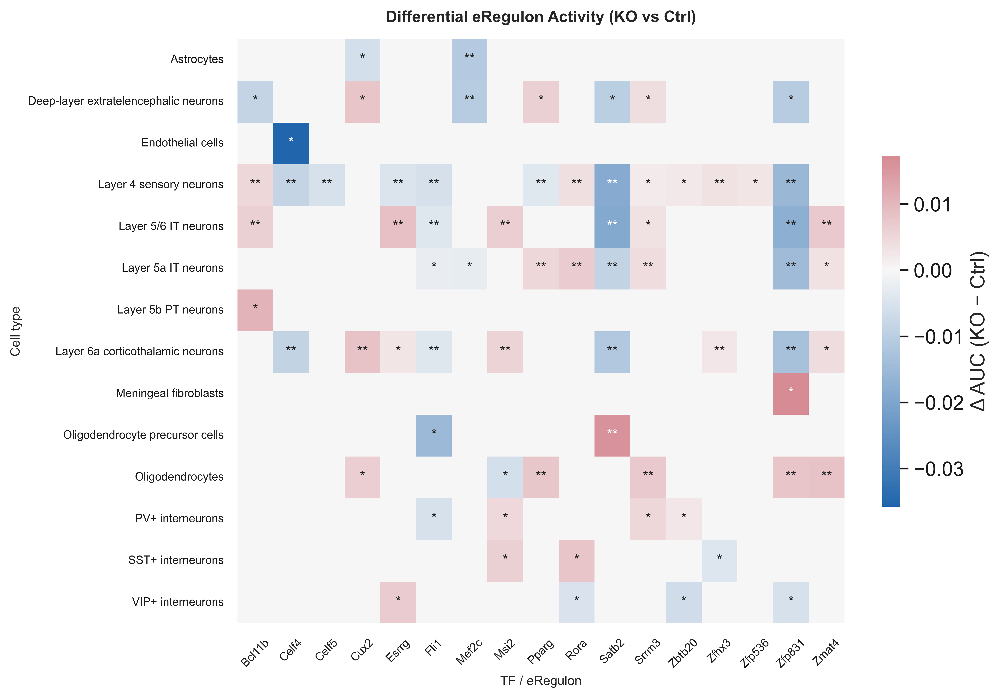

2026-05-07 14:28:26,312 fontTools.subset INFO     maxp pruned
2026-05-07 14:28:26,312 fontTools.subset INFO     LTSH dropped
2026-05-07 14:28:26,313 fontTools.subset INFO     cmap pruned
2026-05-07 14:28:26,313 fontTools.subset INFO     kern dropped
2026-05-07 14:28:26,314 fontTools.subset INFO     post pruned
2026-05-07 14:28:26,315 fontTools.subset INFO     PCLT dropped
2026-05-07 14:28:26,315 fontTools.subset INFO     JSTF dropped
2026-05-07 14:28:26,315 fontTools.subset INFO     DSIG dropped
2026-05-07 14:28:26,317 fontTools.subset INFO     GPOS pruned
2026-05-07 14:28:26,318 fontTools.subset INFO     GSUB pruned
2026-05-07 14:28:26,320 fontTools.subset INFO     glyf pruned
2026-05-07 14:28:26,321 fontTools.subset INFO     Added gid0 to subset
2026-05-07 14:28:26,321 fontTools.subset INFO     Added first four glyphs to subset
2026-05-07 14:28:26,321 fontTools.subset INFO     Closing glyph list over 'GSUB': 27 glyphs before
2026-05-07 14:28:26,322 fontTools.subset INFO     Glyph nam

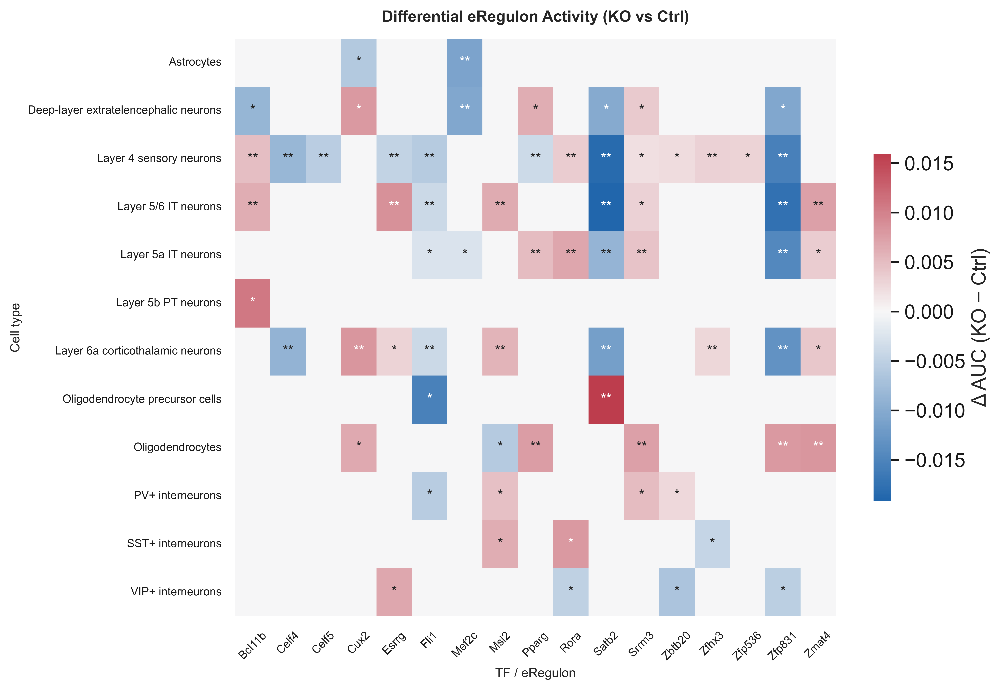

In [562]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import numpy as np

# Custom diverging colormap: blue (#2166ac) → white → red (#b2182b)
cmap_custom = mcolors.LinearSegmentedColormap.from_list(
    "KO_diff", ["#2166ac", "#f7f7f7", "#b2182b"]
)

exclude_ct = {"Endothelial cells", "Meningeal fibroblasts"}

for tag, use_df in [
    ("with_endo_fibro", diff_df.copy()),
    ("no_endo_fibro", diff_df[~diff_df["cell_type"].isin(exclude_ct)].copy())
]:
    sig_hits = use_df[use_df["padj"] < 0.05].copy()

    pivot = sig_hits.pivot_table(
        index="cell_type",
        columns="TF",
        values="delta_AUC",
        aggfunc="mean"
    ).fillna(0)

    sig_mask = sig_hits.pivot_table(
        index="cell_type",
        columns="TF",
        values="padj",
        aggfunc="min"
    ).reindex_like(pivot)

    annot_matrix = sig_mask.applymap(
        lambda p: "**" if p < 0.001 else ("*" if p < 0.05 else "")
    ).fillna("")

    fig, ax = plt.subplots(figsize=(10, 7))
    sns.heatmap(
        pivot,
        cmap=cmap_custom,
        center=0,
        linecolor="#dddddd",
        annot=annot_matrix,
        fmt="",
        annot_kws={"size": 10},
        ax=ax,
        cbar_kws={"label": "Δ AUC (KO − Ctrl)", "shrink": 0.6},
    )

    ax.set_title(
        "Differential eRegulon Activity (KO vs Ctrl)",
        fontsize=11,
        fontweight="bold",
        pad=12
    )
    ax.set_xlabel("TF / eRegulon", fontsize=9)
    ax.set_ylabel("Cell type", fontsize=9)
    ax.tick_params(axis="x", rotation=45, labelsize=8)
    ax.tick_params(axis="y", rotation=0, labelsize=8)

    plt.tight_layout()
    plt.savefig(f"{FURTHER}/diff_eRegulon_heatmap_{tag}.pdf", bbox_inches="tight")
    plt.show()

2026-05-07 14:28:02,539 fontTools.subset INFO     maxp pruned
2026-05-07 14:28:02,540 fontTools.subset INFO     LTSH dropped
2026-05-07 14:28:02,540 fontTools.subset INFO     cmap pruned
2026-05-07 14:28:02,540 fontTools.subset INFO     kern dropped
2026-05-07 14:28:02,542 fontTools.subset INFO     post pruned
2026-05-07 14:28:02,542 fontTools.subset INFO     PCLT dropped
2026-05-07 14:28:02,542 fontTools.subset INFO     JSTF dropped
2026-05-07 14:28:02,542 fontTools.subset INFO     DSIG dropped
2026-05-07 14:28:02,544 fontTools.subset INFO     GPOS pruned
2026-05-07 14:28:02,545 fontTools.subset INFO     GSUB pruned
2026-05-07 14:28:02,547 fontTools.subset INFO     glyf pruned
2026-05-07 14:28:02,548 fontTools.subset INFO     Added gid0 to subset
2026-05-07 14:28:02,548 fontTools.subset INFO     Added first four glyphs to subset
2026-05-07 14:28:02,548 fontTools.subset INFO     Closing glyph list over 'GSUB': 27 glyphs before
2026-05-07 14:28:02,549 fontTools.subset INFO     Glyph nam

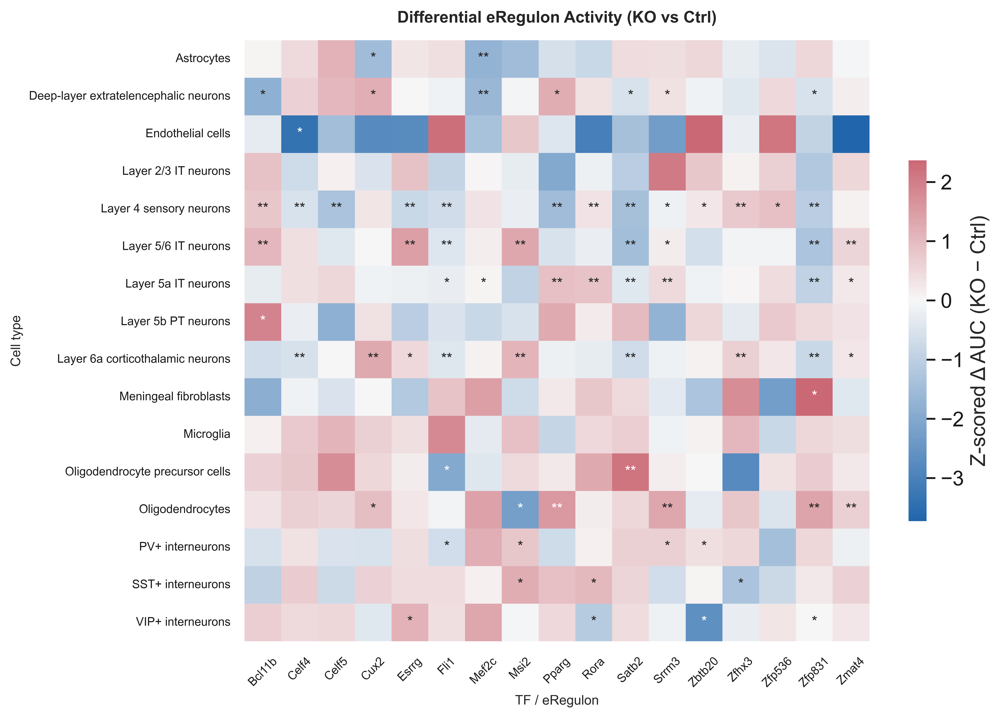

2026-05-07 14:28:03,902 fontTools.subset INFO     maxp pruned
2026-05-07 14:28:03,903 fontTools.subset INFO     LTSH dropped
2026-05-07 14:28:03,903 fontTools.subset INFO     cmap pruned
2026-05-07 14:28:03,903 fontTools.subset INFO     kern dropped
2026-05-07 14:28:03,905 fontTools.subset INFO     post pruned
2026-05-07 14:28:03,905 fontTools.subset INFO     PCLT dropped
2026-05-07 14:28:03,905 fontTools.subset INFO     JSTF dropped
2026-05-07 14:28:03,905 fontTools.subset INFO     DSIG dropped
2026-05-07 14:28:03,907 fontTools.subset INFO     GPOS pruned
2026-05-07 14:28:03,908 fontTools.subset INFO     GSUB pruned
2026-05-07 14:28:03,910 fontTools.subset INFO     glyf pruned
2026-05-07 14:28:03,911 fontTools.subset INFO     Added gid0 to subset
2026-05-07 14:28:03,912 fontTools.subset INFO     Added first four glyphs to subset
2026-05-07 14:28:03,912 fontTools.subset INFO     Closing glyph list over 'GSUB': 27 glyphs before
2026-05-07 14:28:03,912 fontTools.subset INFO     Glyph nam

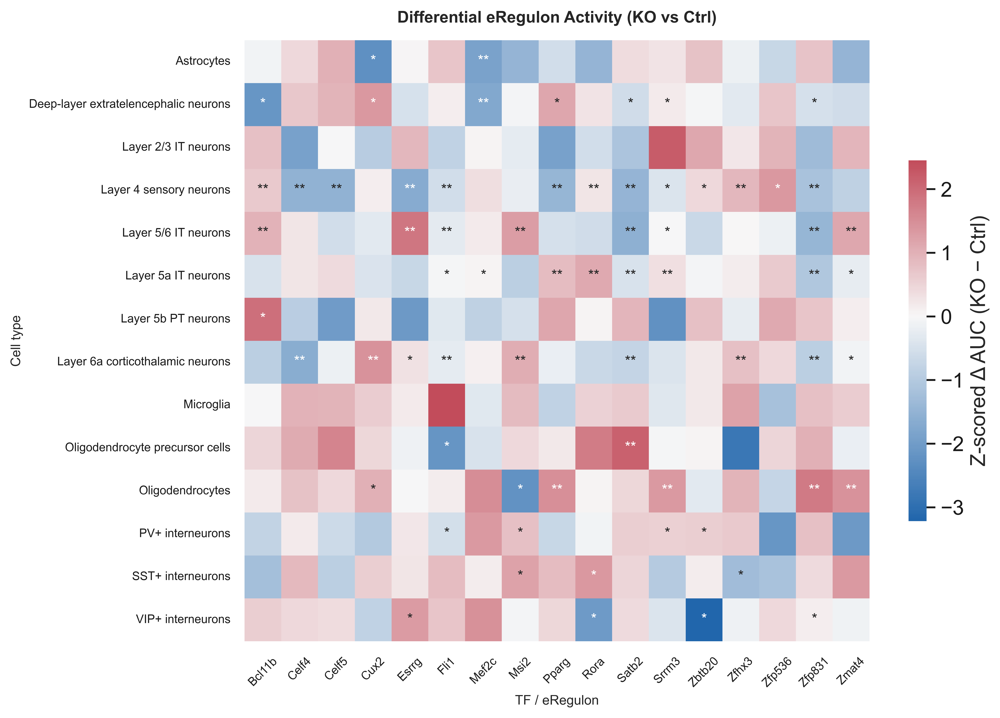

In [561]:
from scipy.stats import zscore
import matplotlib.pyplot as plt
import seaborn as sns

exclude_ct = {"Endothelial cells", "Meningeal fibroblasts"}

for tag, use_df in [
    ("with_endo_fibro", diff_df.copy()),
    ("no_endo_fibro", diff_df[~diff_df["cell_type"].isin(exclude_ct)].copy())
]:
    pivot_full = use_df.pivot_table(
        index="cell_type",
        columns="TF",
        values="delta_AUC",
        aggfunc="mean"
    ).fillna(0)

    pivot_z = pivot_full.apply(zscore, axis=0)

    sig_mask = use_df.pivot_table(
        index="cell_type",
        columns="TF",
        values="padj",
        aggfunc="min"
    ).reindex_like(pivot_full)

    annot_matrix = sig_mask.applymap(
        lambda p: "**" if p < 0.001 else ("*" if p < 0.05 else "")
    ).fillna("")

    fig, ax = plt.subplots(figsize=(10, 7))
    sns.heatmap(
        pivot_z,
        cmap=cmap_custom,
        center=0,
        linecolor="#dddddd",
        annot=annot_matrix,
        fmt="",
        annot_kws={"size": 10},
        ax=ax,
        cbar_kws={"label": "Z-scored Δ AUC (KO − Ctrl)", "shrink": 0.6},
    )

    ax.set_title(
        "Differential eRegulon Activity (KO vs Ctrl)",
        fontsize=11,
        fontweight="bold",
        pad=12
    )
    ax.set_xlabel("TF / eRegulon", fontsize=9)
    ax.set_ylabel("Cell type", fontsize=9)
    ax.tick_params(axis="x", rotation=45, labelsize=8)
    ax.tick_params(axis="y", rotation=0, labelsize=8)

    plt.tight_layout()
    plt.savefig(f"{FURTHER}/diff_eRegulon_heatmap_zscored_{tag}.pdf", bbox_inches="tight")
    plt.show()

In [ ]:
###### NO STATISTICS HERE###

# import pandas as pd
# import seaborn as sns
# import matplotlib.pyplot as plt
# from matplotlib.backends.backend_pdf import PdfPages
# import os

# custom_colors = {"Ctrl": "#c6c6c6", "KO": "#7FCDCD"}
# output_dir = FURTHER if "FURTHER" in globals() else "."
# output_filename = os.path.join(output_dir, "Master_Regulators_KO_vs_Ctrl_Analysis.pdf")

# auc = scplus_obj_geno.uns["eRegulon_AUC"].copy()
# meta2 = scplus_obj_geno.metadata_cell.copy()
# meta2["genotype"] = meta2.index.str.extract(r'_(Ctrl|KO)_\d+$')[0].values
# meta2["cell_type"] = meta2.index.str.replace(r'_(Ctrl|KO)_\d+$', '', regex=True).values

# with PdfPages(output_filename) as pdf:
#     print(f"Starting PDF generation: {output_filename}")
#     for sig_name, tf_name in final_plot_mapping.items():
#         if sig_name not in auc.columns:
#             continue

#         ct_key = sig_name.replace('_pos_manual', '')
#         subset = meta2.copy()
#         subset["AUC_Score"] = auc[sig_name].values
#         subset = subset[subset["cell_type"].str.replace(" ", "_") == ct_key.replace(" ", "_")]

#         if subset.empty:
#             print(f"  - Skipped {tf_name}: no matching cells for {ct_key}")
#             continue

#         plt.figure(figsize=(7, 6))
#         sns.boxplot(
#             data=subset,
#             x="genotype",
#             y="AUC_Score",
#             palette=custom_colors,
#             order=["Ctrl", "KO"],
#             showfliers=False
#         )
#         sns.stripplot(
#             data=subset,
#             x="genotype",
#             y="AUC_Score",
#             color=".3",
#             alpha=0.4,
#             order=["Ctrl", "KO"],
#             jitter=True
#         )

#         plt.title(f"Master TF: {tf_name}\nCell Type: {ct_key.replace('_', ' ')}", fontsize=14, fontweight="bold")
#         plt.ylabel("eRegulon Activity (AUC)", fontsize=12)
#         plt.xlabel("Genotype", fontsize=12)
#         sns.despine()
#         plt.tight_layout()

#         pdf.savefig()
#         plt.close()
#         print(f"  + Added page for {tf_name} ({ct_key})")

# print(f"\n✅ Finished! All plots are now in {output_filename}")

In [570]:
import os
import pandas as pd
import numpy as np
from scipy import stats
from statsmodels.stats.multitest import multipletests
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

custom_colors = {"Ctrl": "#c6c6c6", "KO": "#7FCDCD"}

output_dir = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis"
os.makedirs(output_dir, exist_ok=True)

output_pdf = os.path.join(output_dir, "Master_Regulators_Statistics_Plots.pdf")
output_csv = os.path.join(output_dir, "Master_Regulator_Differential_Activity_Stats.csv")

stats_results = []

auc_df = scplus_obj_geno.uns["eRegulon_AUC"].copy()
meta = scplus_obj_geno.metadata_cell.copy()

if "genotype" not in meta.columns:
    meta["genotype"] = meta.index.str.extract(r"_(Ctrl|KO)_\d+$")[0].values
if "cell_type" not in meta.columns:
    meta["cell_type"] = meta.index.str.replace(r"_(Ctrl|KO)_\d+$", "", regex=True).values

auc_df.index = meta.index
auc_df["genotype"] = meta["genotype"].values
auc_df["cell_type"] = meta["cell_type"].values

sig_cols = [c for c in auc_df.columns if c not in ["genotype", "cell_type"]]

sig_to_tf = {sig: label.split(" (")[0].strip() for sig, label in tf_mapping_clean.items()}

def fmt_p(p):
    return f"{p:.2e}" if p < 0.001 else f"{p:.4f}".rstrip("0").rstrip(".")

with PdfPages(output_pdf) as pdf:
    for sig_name in sig_cols:
        tf_name = sig_to_tf.get(sig_name, sig_name)
        ct_key = sig_name.replace("_pos_manual", "").replace("_", " ")

        subset = auc_df[auc_df["cell_type"].str.replace("_", " ") == ct_key].copy()
        if subset.empty or subset["genotype"].nunique() < 2:
            continue

        ctrl_vals = subset[subset["genotype"] == "Ctrl"][sig_name]
        ko_vals = subset[subset["genotype"] == "KO"][sig_name]
        if len(ctrl_vals) < 2 or len(ko_vals) < 2:
            continue

        _, p_val = stats.mannwhitneyu(ctrl_vals, ko_vals, alternative="two-sided")

        med_ctrl = np.median(ctrl_vals)
        med_ko = np.median(ko_vals)
        l2fc = np.log2((med_ko + 1e-9) / (med_ctrl + 1e-9))

        stats_results.append({
            "TF": tf_name,
            "eRegulon": sig_name,
            "Cell_Type": ct_key,
            "p_value": p_val,
            "p_value_fmt": fmt_p(p_val),
            "Log2FC_Median": l2fc,
            "n_Ctrl": len(ctrl_vals),
            "n_KO": len(ko_vals),
        })

        plt.figure(figsize=(6, 6))
        sns.boxplot(
            data=subset,
            x="genotype",
            y=sig_name,
            palette=custom_colors,
            order=["Ctrl", "KO"],
            showfliers=False
        )
        sns.stripplot(
            data=subset,
            x="genotype",
            y=sig_name,
            color=".3",
            alpha=0.3,
            order=["Ctrl", "KO"],
            jitter=True
        )

        plt.title(f"{ct_key}\np={fmt_p(p_val)} | L2FC={l2fc:.2f}")
        plt.ylabel(f"{tf_name} eRegulon activity")
        plt.tight_layout()
        pdf.savefig()
        plt.close()

stats_df = pd.DataFrame(stats_results)

if not stats_df.empty:
    _, stats_df["fdr_adj_p_value"], _, _ = multipletests(stats_df["p_value"], method="fdr_bh")
    stats_df = stats_df.sort_values("fdr_adj_p_value")

stats_df.to_csv(output_csv, index=False)

print("✅ Statistics complete!")
print(f"PDF: {output_pdf}")
print(f"CSV: {output_csv}")
print(stats_df.head(10).to_string(index=False))

/var/folders/c5/9gnt7c7x7x59ygrp90w3n60r0000gn/T/ipykernel_69539/3690043916.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

/var/folders/c5/9gnt7c7x7x59ygrp90w3n60r0000gn/T/ipykernel_69539/3690043916.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

/var/folders/c5/9gnt7c7x7x59ygrp90w3n60r0000gn/T/ipykernel_69539/3690043916.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

/var/folders/c5/9gnt7c7x7x59ygrp90w3n60r0000gn/T/ipykernel_69539/3690043916.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x`

2026-05-07 14:38:18,508 fontTools.subset INFO     maxp pruned
2026-05-07 14:38:18,508 fontTools.subset INFO     LTSH dropped
2026-05-07 14:38:18,508 fontTools.subset INFO     cmap pruned
2026-05-07 14:38:18,509 fontTools.subset INFO     kern dropped
2026-05-07 14:38:18,510 fontTools.subset INFO     post pruned
2026-05-07 14:38:18,510 fontTools.subset INFO     PCLT dropped
2026-05-07 14:38:18,510 fontTools.subset INFO     JSTF dropped
2026-05-07 14:38:18,511 fontTools.subset INFO     DSIG dropped
2026-05-07 14:38:18,512 fontTools.subset INFO     GPOS pruned
2026-05-07 14:38:18,513 fontTools.subset INFO     GSUB pruned
2026-05-07 14:38:18,516 fontTools.subset INFO     glyf pruned
2026-05-07 14:38:18,517 fontTools.subset INFO     Added gid0 to subset
2026-05-07 14:38:18,517 fontTools.subset INFO     Added first four glyphs to subset
2026-05-07 14:38:18,517 fontTools.subset INFO     Closing glyph list over 'GSUB': 58 glyphs before
2026-05-07 14:38:18,517 fontTools.subset INFO     Glyph nam

/var/folders/c5/9gnt7c7x7x59ygrp90w3n60r0000gn/T/ipykernel_69539/3690043916.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

/var/folders/c5/9gnt7c7x7x59ygrp90w3n60r0000gn/T/ipykernel_69539/3690043916.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

/var/folders/c5/9gnt7c7x7x59ygrp90w3n60r0000gn/T/ipykernel_69539/3690043916.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

/var/folders/c5/9gnt7c7x7x59ygrp90w3n60r0000gn/T/ipykernel_69539/3690043916.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x`

2026-05-07 14:38:18,543 fontTools.subset INFO     GPOS subsetted
2026-05-07 14:38:18,543 fontTools.subset INFO     GSUB subsetted
2026-05-07 14:38:18,544 fontTools.subset INFO     name subsetting not needed
2026-05-07 14:38:18,544 fontTools.subset INFO     glyf subsetted
2026-05-07 14:38:18,544 fontTools.subset INFO     head pruned
2026-05-07 14:38:18,545 fontTools.subset INFO     OS/2 Unicode ranges pruned: [0]
2026-05-07 14:38:18,545 fontTools.subset INFO     OS/2 CodePage ranges pruned: [0]
2026-05-07 14:38:18,545 fontTools.subset INFO     glyf pruned
2026-05-07 14:38:18,545 fontTools.subset INFO     GDEF pruned
2026-05-07 14:38:18,546 fontTools.subset INFO     GPOS pruned
2026-05-07 14:38:18,546 fontTools.subset INFO     GSUB pruned
2026-05-07 14:38:18,548 fontTools.subset INFO     name pruned
✅ Statistics complete!
PDF: /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis/Master_Regulators_Statistics_Plots.pdf
CSV: /Users/cnbr/Downloads/

2026-05-07 14:44:53,283 fontTools.subset INFO     maxp pruned
2026-05-07 14:44:53,283 fontTools.subset INFO     LTSH dropped
2026-05-07 14:44:53,283 fontTools.subset INFO     cmap pruned
2026-05-07 14:44:53,283 fontTools.subset INFO     kern dropped
2026-05-07 14:44:53,285 fontTools.subset INFO     post pruned
2026-05-07 14:44:53,285 fontTools.subset INFO     PCLT dropped
2026-05-07 14:44:53,286 fontTools.subset INFO     JSTF dropped
2026-05-07 14:44:53,286 fontTools.subset INFO     DSIG dropped
2026-05-07 14:44:53,288 fontTools.subset INFO     GPOS pruned
2026-05-07 14:44:53,289 fontTools.subset INFO     GSUB pruned
2026-05-07 14:44:53,291 fontTools.subset INFO     glyf pruned
2026-05-07 14:44:53,292 fontTools.subset INFO     Added gid0 to subset
2026-05-07 14:44:53,292 fontTools.subset INFO     Added first four glyphs to subset
2026-05-07 14:44:53,292 fontTools.subset INFO     Closing glyph list over 'GSUB': 33 glyphs before
2026-05-07 14:44:53,293 fontTools.subset INFO     Glyph nam

/var/folders/c5/9gnt7c7x7x59ygrp90w3n60r0000gn/T/ipykernel_69539/3301603783.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



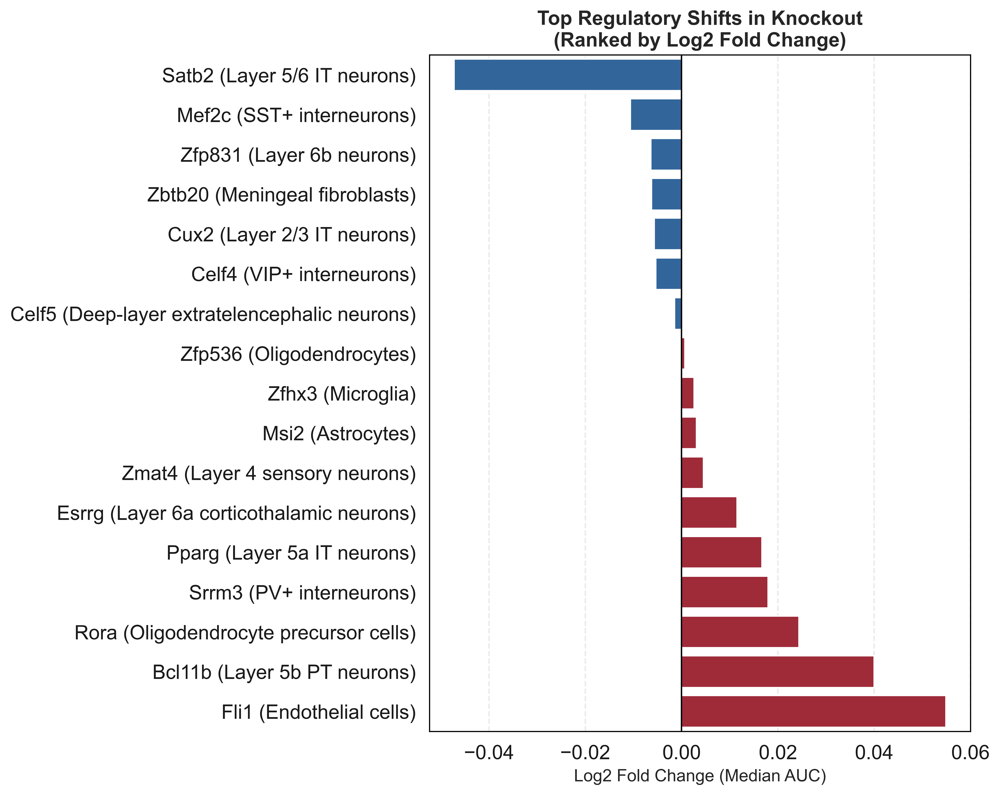

✅ Saved: /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis/Top_Diverging_TFs_scplus_obj_geno.pdf


In [573]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

output_dir = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis"
os.makedirs(output_dir, exist_ok=True)

# Build signature -> TF mapping
sig_to_tf = {sig: label.split(" (")[0].strip() for sig, label in tf_mapping_clean.items()}

# Get AUC + metadata
auc_df = scplus_obj_geno.uns["eRegulon_AUC"].copy()
meta = scplus_obj_geno.metadata_cell.copy()

if "genotype" not in meta.columns:
    meta["genotype"] = meta.index.str.extract(r"_(Ctrl|KO)_\d+$")[0].values
if "cell_type" not in meta.columns:
    meta["cell_type"] = meta.index.str.replace(r"_(Ctrl|KO)_\d+$", "", regex=True).values

auc_df.index = meta.index
auc_df["genotype"] = meta["genotype"].values
auc_df["cell_type"] = meta["cell_type"].values

sig_cols = [c for c in auc_df.columns if c not in ["genotype", "cell_type"]]

# 1. Calculate L2FC for all matched TF/cell-type pairs
results = []
for sig_name in sig_cols:
    tf_name = sig_to_tf.get(sig_name, sig_name)
    ct_clean = sig_name.replace("_pos_manual", "").replace("_", " ")

    subset = auc_df[auc_df["cell_type"].str.replace("_", " ") == ct_clean].copy()
    if subset.empty or subset["genotype"].nunique() < 2:
        continue

    ctrl_vals = subset.loc[subset["genotype"] == "Ctrl", sig_name]
    ko_vals = subset.loc[subset["genotype"] == "KO", sig_name]

    if len(ctrl_vals) > 0 and len(ko_vals) > 0:
        l2fc = np.log2((np.median(ko_vals) + 1e-9) / (np.median(ctrl_vals) + 1e-9))
        results.append({
            "TF": tf_name,
            "CellType": ct_clean,
            "L2FC": l2fc
        })

all_stats = pd.DataFrame(results)

# 2. Select extremes
top_pos = all_stats.sort_values("L2FC", ascending=False).head(10)
top_neg = all_stats.sort_values("L2FC", ascending=True).head(10)
plot_df = pd.concat([top_pos, top_neg]).drop_duplicates().sort_values("L2FC")

# 3. Create label
plot_df["Display_Label"] = plot_df["TF"] + " (" + plot_df["CellType"] + ")"

# 4. Color bars with same heatmap logic
bar_colors = ["#b2182b" if x > 0 else "#2166ac" for x in plot_df["L2FC"]]

# 5. Plot
plt.figure(figsize=(10, 8))
sns.barplot(
    data=plot_df,
    x="L2FC",
    y="Display_Label",
    palette=bar_colors
)

plt.axvline(0, color="black", linewidth=1)
plt.title(
    "Top Regulatory Shifts in Knockout\n(Ranked by Log2 Fold Change)",
    fontsize=14,
    fontweight="bold"
)
plt.xlabel("Log2 Fold Change (Median AUC)", fontsize=12)
plt.ylabel("")
plt.grid(axis="x", linestyle="--", alpha=0.4)

plt.tight_layout()
plt.savefig(os.path.join(output_dir, "Top_Diverging_TFs_scplus_obj_geno.pdf"), bbox_inches="tight")
plt.savefig(os.path.join(output_dir, "Top_Diverging_TFs_scplus_obj_geno.png"), dpi=300, bbox_inches="tight")
plt.show()

print("✅ Saved:",
      os.path.join(output_dir, "Top_Diverging_TFs_scplus_obj_geno.pdf"))

2026-05-07 14:55:38,544 fontTools.subset INFO     maxp pruned
2026-05-07 14:55:38,544 fontTools.subset INFO     LTSH dropped
2026-05-07 14:55:38,544 fontTools.subset INFO     cmap pruned
2026-05-07 14:55:38,545 fontTools.subset INFO     kern dropped
2026-05-07 14:55:38,546 fontTools.subset INFO     post pruned
2026-05-07 14:55:38,546 fontTools.subset INFO     PCLT dropped
2026-05-07 14:55:38,546 fontTools.subset INFO     JSTF dropped
2026-05-07 14:55:38,547 fontTools.subset INFO     DSIG dropped
2026-05-07 14:55:38,548 fontTools.subset INFO     GPOS pruned
2026-05-07 14:55:38,549 fontTools.subset INFO     GSUB pruned
2026-05-07 14:55:38,551 fontTools.subset INFO     glyf pruned
2026-05-07 14:55:38,552 fontTools.subset INFO     Added gid0 to subset
2026-05-07 14:55:38,552 fontTools.subset INFO     Added first four glyphs to subset
2026-05-07 14:55:38,552 fontTools.subset INFO     Closing glyph list over 'GSUB': 34 glyphs before
2026-05-07 14:55:38,552 fontTools.subset INFO     Glyph nam

/var/folders/c5/9gnt7c7x7x59ygrp90w3n60r0000gn/T/ipykernel_69539/3604011161.py:96: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



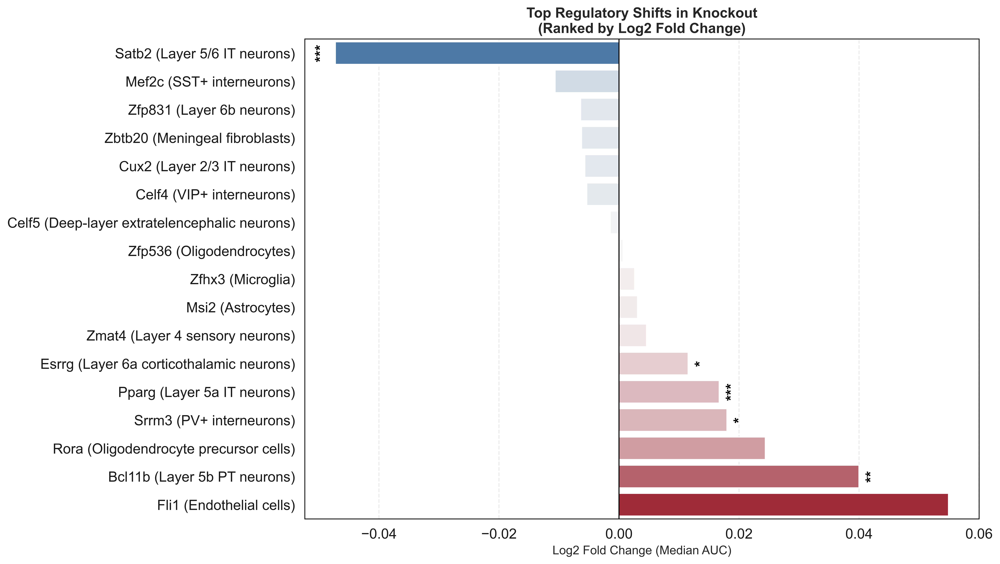

✅ Saved: /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis/Top_Diverging_TFs_scplus_obj_geno_with_endo_fibro.pdf
✅ Saved: /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis/Top_Diverging_TFs_scplus_obj_geno_with_endo_fibro.png
✅ Saved: /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis/Top_Diverging_TFs_scplus_obj_geno_with_endo_fibro_stats.csv
2026-05-07 14:55:40,903 fontTools.subset INFO     maxp pruned
2026-05-07 14:55:40,903 fontTools.subset INFO     LTSH dropped
2026-05-07 14:55:40,904 fontTools.subset INFO     cmap pruned
2026-05-07 14:55:40,904 fontTools.subset INFO     kern dropped
2026-05-07 14:55:40,905 fontTools.subset INFO     post pruned
2026-05-07 14:55:40,906 fontTools.subset INFO     PCLT dropped
2026-05-07 14:55:40,906 fontTools.subset INFO     JSTF dropped
2026-05-07 14:55:40,906 fontTools.subset INFO     DSIG dropped
2026-05-07 14

/var/folders/c5/9gnt7c7x7x59ygrp90w3n60r0000gn/T/ipykernel_69539/3604011161.py:96: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



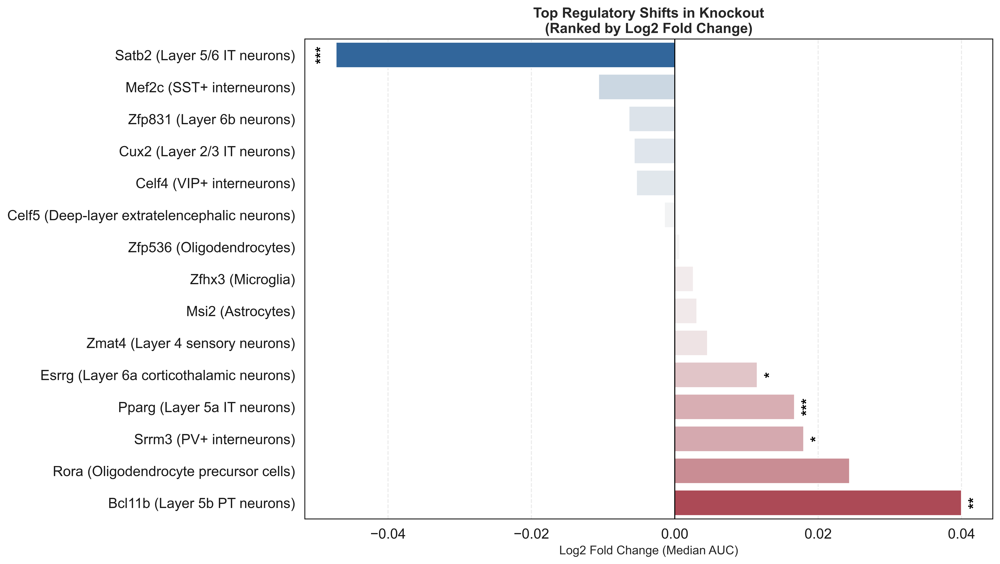

✅ Saved: /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis/Top_Diverging_TFs_scplus_obj_geno_no_endo_fibro.pdf
✅ Saved: /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis/Top_Diverging_TFs_scplus_obj_geno_no_endo_fibro.png
✅ Saved: /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis/Top_Diverging_TFs_scplus_obj_geno_no_endo_fibro_stats.csv


In [583]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
from scipy import stats
from statsmodels.stats.multitest import multipletests

output_dir = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis"
os.makedirs(output_dir, exist_ok=True)

sig_to_tf = {sig: label.split(" (")[0].strip() for sig, label in tf_mapping_clean.items()}

auc_df = scplus_obj_geno.uns["eRegulon_AUC"].copy()
meta = scplus_obj_geno.metadata_cell.copy()

if "genotype" not in meta.columns:
    meta["genotype"] = meta.index.str.extract(r"_(Ctrl|KO)_\d+$")[0].values
if "cell_type" not in meta.columns:
    meta["cell_type"] = meta.index.str.replace(r"_(Ctrl|KO)_\d+$", "", regex=True).values

auc_df.index = meta.index
auc_df["genotype"] = meta["genotype"].values
auc_df["cell_type"] = meta["cell_type"].values

sig_cols = [c for c in auc_df.columns if c not in ["genotype", "cell_type"]]

exclude_ct = {"Endothelial cells", "Meningeal fibroblasts"}

def p_to_stars(p):
    if p < 0.001:
        return "***"
    elif p < 0.01:
        return "**"
    elif p < 0.05:
        return "*"
    else:
        return ""

cmap_custom = mcolors.LinearSegmentedColormap.from_list(
    "KO_diff", ["#2166ac", "#f7f7f7", "#b2182b"]
)

for tag, excluded in [
    ("with_endo_fibro", False),
    ("no_endo_fibro", True),
]:
    results = []

    for sig_name in sig_cols:
        tf_name = sig_to_tf.get(sig_name, sig_name)
        ct_clean = sig_name.replace("_pos_manual", "").replace("_", " ")

        if excluded and ct_clean in exclude_ct:
            continue

        subset = auc_df[auc_df["cell_type"].str.replace("_", " ") == ct_clean].copy()
        if subset.empty or subset["genotype"].nunique() < 2:
            continue

        ctrl_vals = subset.loc[subset["genotype"] == "Ctrl", sig_name]
        ko_vals = subset.loc[subset["genotype"] == "KO", sig_name]

        if len(ctrl_vals) < 2 or len(ko_vals) < 2:
            continue

        _, p_val = stats.mannwhitneyu(ctrl_vals, ko_vals, alternative="two-sided")
        l2fc = np.log2((np.median(ko_vals) + 1e-9) / (np.median(ctrl_vals) + 1e-9))

        results.append({
            "TF": tf_name,
            "CellType": ct_clean,
            "L2FC": l2fc,
            "p_value": p_val
        })

    stats_df = pd.DataFrame(results)
    if stats_df.empty:
        continue

    _, stats_df["padj"], _, _ = multipletests(stats_df["p_value"], method="fdr_bh")

    top_pos = stats_df.sort_values("L2FC", ascending=False).head(10)
    top_neg = stats_df.sort_values("L2FC", ascending=True).head(10)
    plot_df = pd.concat([top_pos, top_neg]).drop_duplicates().sort_values("L2FC")

    plot_df["Display_Label"] = plot_df["TF"] + " (" + plot_df["CellType"] + ")"
    plot_df["sig_label"] = plot_df["padj"].apply(p_to_stars)

    vmax = np.max(np.abs(plot_df["L2FC"])) if len(plot_df) > 0 else 1
    norm = mcolors.TwoSlopeNorm(vmin=-vmax, vcenter=0, vmax=vmax)
    bar_colors = [cmap_custom(norm(x)) for x in plot_df["L2FC"]]

    fig, ax = plt.subplots(figsize=(14, 8))
    sns.barplot(
        data=plot_df,
        x="L2FC",
        y="Display_Label",
        palette=bar_colors,
        ax=ax
    )

    ax.axvline(0, color="black", linewidth=1)
    ax.set_title(
        "Top Regulatory Shifts in Knockout\n(Ranked by Log2 Fold Change)",
        fontsize=14,
        fontweight="bold"
    )
    ax.set_xlabel("Log2 Fold Change (Median AUC)", fontsize=12)
    ax.set_ylabel("")

    ax.grid(axis="x", linestyle="--", alpha=0.4)

    xspan = vmax * 0.02
    for i, (_, row) in enumerate(plot_df.iterrows()):
        if row["sig_label"] == "":
            continue
        x = row["L2FC"]
        star_x = x + xspan if x >= 0 else x - xspan
        ha = "left" if x >= 0 else "right"
        ax.text(
            star_x,
            i,
            row["sig_label"],
            va="center",
            ha=ha,
            rotation=90,
            fontsize=15,
            fontweight="bold",
            color="black"
        )

    plt.tight_layout()

    pdf_path = os.path.join(output_dir, f"Top_Diverging_TFs_scplus_obj_geno_{tag}.pdf")
    png_path = os.path.join(output_dir, f"Top_Diverging_TFs_scplus_obj_geno_{tag}.png")
    csv_path = os.path.join(output_dir, f"Top_Diverging_TFs_scplus_obj_geno_{tag}_stats.csv")

    plt.savefig(pdf_path, bbox_inches="tight")
    plt.savefig(png_path, dpi=300, bbox_inches="tight")
    plt.show()

    stats_df.sort_values("padj").to_csv(csv_path, index=False)

    print(f"✅ Saved: {pdf_path}")
    print(f"✅ Saved: {png_path}")
    print(f"✅ Saved: {csv_path}")

In [ ]:
# import pandas as pd
# import pickle
# import glob
# import os
# import numpy as np
# import matplotlib.pyplot as plt
# import seaborn as sns
# from matplotlib.backends.backend_pdf import PdfPages

# # 1. Setup Data
# motif_annot = pd.read_csv(motif_annotation, sep='\t', low_memory=False)
# motif_annot = motif_annot.rename(columns={'#motif_id': 'motif_id'})
# mapping_dict = dict(zip(motif_annot['motif_id'], motif_annot['gene_name']))

# OUT_MOTIF = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/manual_motif_enrichment"
# auc_mtx = scplus_obj.uns['eRegulon_AUC_Manual_Unique']['Gene_based']

# # 2. THE BRIDGE DICTIONARY
# # This maps the Filename (from OUT_MOTIF) to the exact Column Name (in auc_mtx)
# # and the exact Cell Type name (in metadata)
# bridge = {
#     'SSTpos_interneurons': ('SST+ interneurons_pos_manual', 'SST+ interneurons'),
#     'PVpos_interneurons': ('PV+ interneurons_pos_manual', 'PV+ interneurons'),
#     'VIPpos_interneurons': ('VIP+ interneurons_pos_manual', 'VIP+ interneurons'),
#     'Layer_2_3_IT_neurons': ('Layer 2/3 IT neurons_pos_manual', 'Layer 2/3 IT neurons'),
#     'Layer_5_6_IT_neurons': ('Layer 5/6 IT neurons_pos_manual', 'Layer 5/6 IT neurons')
# }

# output_pdf = "Final_17_Clusters_Top10_TFs.pdf"
# pkl_files = glob.glob(os.path.join(OUT_MOTIF, "*_enrichment.pkl"))

# with PdfPages(output_pdf) as pdf:
#     for pkl_path in pkl_files:
#         file_id = os.path.basename(pkl_path).replace('_enrichment.pkl', '')
        
#         # Determine targeting strings
#         if file_id in bridge:
#             target_sig, target_ct = bridge[file_id]
#         else:
#             # For the ones that already worked, we'll keep the standard logic
#             target_sig = f"{file_id}_pos_manual"
#             # Fallback if the standard doesn't have an underscore
#             if target_sig not in auc_mtx.columns:
#                 target_sig = f"{file_id.replace('_', ' ')}_pos_manual"
#             target_ct = file_id.replace('_', ' ')

#         # Final check if names exist
#         if target_sig not in auc_mtx.columns:
#             print(f"❌ Skipping {file_id}: Could not find signature {target_sig}")
#             continue

#         print(f"✅ Processing {file_id}...")

#         with open(pkl_path, 'rb') as f:
#             res = pickle.load(f)
        
#         mean_ranks = res['ctx'].db_rankings.mean(axis=1).sort_values()
        
#         # Metadata check (allowing for the space/underscore flex)
#         ct_mask = (scplus_obj.metadata_cell['cell_type'] == target_ct) | \
#                   (scplus_obj.metadata_cell['cell_type'] == target_ct.replace(' ', '_'))
        
#         ctrl_mask = (scplus_obj.metadata_cell['genotype'] == 'Ctrl') & ct_mask
#         ko_mask = (scplus_obj.metadata_cell['genotype'] == 'KO') & ct_mask
        
#         if ctrl_mask.any() and ko_mask.any():
#             med_ctrl = np.median(auc_mtx.loc[ctrl_mask, target_sig])
#             med_ko = np.median(auc_mtx.loc[ko_mask, target_sig])
#             l2fc = np.log2((med_ko + 1e-9) / (med_ctrl + 1e-9))
            
#             # Get Top 10 unique gene names
#             top_10_genes = []
#             for m in mean_ranks.index:
#                 g = mapping_dict.get(m, m)
#                 if g not in top_10_genes: top_10_genes.append(g)
#                 if len(top_10_genes) >= 10: break
            
#             plot_df = pd.DataFrame({'TF': top_10_genes, 'L2FC': [l2fc] * len(top_10_genes)})
            
#             plt.figure(figsize=(8, 6))
#             color = "#7FCDCD" if l2fc > 0 else "#D3D3D3"
#             sns.barplot(data=plot_df, x='L2FC', y='TF', color=color)
#             plt.axvline(0, color='black', linewidth=1)
#             plt.title(f'Cluster: {target_ct}\nRegulatory Shift (Log2FC: {l2fc:.4f})', fontweight='bold')
#             plt.xlabel('Log2 Fold Change (KO/Ctrl)')
#             plt.tight_layout()
#             pdf.savefig()
#             plt.close()
#         else:
#             print(f"⚠️ No genotype data found for {target_ct}")

# print(f"🚀 Success! 17-cluster report generated: {output_pdf}")

In [ ]:
# # ... [Keep your existing Setup, Bridge, and Mapping code] ...

# with PdfPages("Importance_Ranked_TFs.pdf") as pdf:
#     for pkl_path in pkl_files:
#         file_id = os.path.basename(pkl_path).replace('_enrichment.pkl', '')
        
#         # [Keep Bridge Logic to get target_sig and target_ct]
        
#         with open(pkl_path, 'rb') as f:
#             res = pickle.load(f)
        
#         # Calculate mean ranks (Low value = High importance)
#         mean_ranks = res['ctx'].db_rankings.mean(axis=1).sort_values()
        
#         # Calculate the cluster's direction (Keep this for coloring)
#         ct_mask = (scplus_obj.metadata_cell['cell_type'] == target_ct)
#         ctrl_mask = (scplus_obj.metadata_cell['genotype'] == 'Ctrl') & ct_mask
#         ko_mask = (scplus_obj.metadata_cell['genotype'] == 'KO') & ct_mask
        
#         cluster_l2fc = 0
#         if ctrl_mask.any() and ko_mask.any():
#             med_ctrl = np.median(auc_mtx.loc[ctrl_mask, target_sig])
#             med_ko = np.median(auc_mtx.loc[ko_mask, target_sig])
#             cluster_l2fc = np.log2((med_ko + 1e-9) / (med_ctrl + 1e-9))

#         # Get Top 10
#         top_data = []
#         unique_genes = []
#         for motif, rank in mean_ranks.items():
#             gene = mapping_dict.get(motif, motif)
#             if gene not in unique_genes:
#                 unique_genes.append(gene)
#                 # We invert the rank (e.g., 1/rank) or use 1000 - rank 
#                 # so that BIGGER bars = MORE important TFs
#                 top_data.append({'TF': gene, 'Importance': 1000 - rank}) 
#             if len(unique_genes) >= 10: break
            
#         plot_df = pd.DataFrame(top_data)
        
#         plt.figure(figsize=(8, 6))
#         # Color entire plot based on the cluster's overall direction
#         plot_color = "#7FCDCD" if cluster_l2fc > 0 else "#D3D3D3"
        
#         sns.barplot(data=plot_df, x='Importance', y='TF', color=plot_color)
#         plt.title(f'Top 10 TFs for {target_ct}\n(Color: Cluster direction | Bar: TF Importance)')
#         plt.xlabel('Importance Score (1000 - Mean Rank)')
#         plt.tight_layout()
#         pdf.savefig()
#         plt.close()

In [571]:
# Check the main keys in uns
print("--- Main UNS Keys ---")
print(scplus_obj_geno.uns.keys())

--- Main UNS Keys ---
dict_keys(['TF2G_importance', 'Region_to_gene', 'search_space', 'eRegulon_AUC'])


In [ ]:
# # If 'menr' exists, let's see what's inside it
# if 'menr' in scplus_obj_geno.uns:
#     print("\n--- Inside MENR ---")
#     print(scplus_obj.uns['menr'].keys())
    
# # Let's check for any other likely candidates for motif enrichment
# likely_keys = [k for k in scplus_obj_geno.uns.keys() if 'motif' in k.lower() or 'enrich' in k.lower()]
# print("\n--- Likely Enrichment Keys ---")
# print(likely_keys)

In [572]:
# # Check your mapping
# print("--- Mapping Sample ---")
# for i, (k, v) in enumerate(mapping_dict.items()):
#     print(f"Motif: {k} -> Gene: {v}")
#     if i > 5: break

# # Check the TF list format
# import requests
# tf_list_url = "https://resources.aertslab.org/cistarget/tf_lists/allTFs_mm.txt"
# test_tfs = requests.get(tf_list_url).text.splitlines()
# print("\n--- TF List Sample ---")
# print(test_tfs[:10])

--- Mapping Sample ---
Motif: metacluster_196.3 -> Gene: Prdm14
Motif: bergman__Stat92E -> Gene: Stat6
Motif: bergman__Su_H_ -> Gene: Rbpj
Motif: bergman__bcd -> Gene: Pitx3
Motif: bergman__croc -> Gene: Foxc2
Motif: metacluster_5.1 -> Gene: Rela
Motif: bergman__dl-A -> Gene: Relb

--- TF List Sample ---
['Bcl6b', 'Zscan26', 'Mtf1', 'Klf9', 'Zic5', 'Zfp410', 'Zfp3', 'Zfp691', 'Zfp637', 'Egr3']


In [ ]:
# import pandas as pd
# import pickle
# import glob
# import os
# import requests
# import numpy as np
# import matplotlib.pyplot as plt
# import seaborn as sns
# from matplotlib.backends.backend_pdf import PdfPages

# # 1. Load Curated Mouse TF List and make it Case-Insensitive
# tf_list_url = "https://resources.aertslab.org/cistarget/tf_lists/allTFs_mm.txt"
# response = requests.get(tf_list_url)
# # Store as uppercase for easier matching
# valid_mouse_tfs = {tf.upper() for tf in response.text.splitlines()}

# # 2. Setup Annotation
# motif_annot = pd.read_csv(motif_annotation, sep='\t', low_memory=False)
# motif_annot = motif_annot.rename(columns={'#motif_id': 'motif_id'})
# mapping_dict = dict(zip(motif_annot['motif_id'], motif_annot['gene_name']))

# OUT_MOTIF = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/manual_motif_enrichment"
# auc_mtx = scplus_obj.uns['eRegulon_AUC_Manual_Unique']['Gene_based']
# pkl_files = sorted(glob.glob(os.path.join(OUT_MOTIF, "*_enrichment.pkl")))

# output_pdf = "Final_Manual_Matched_TFs.pdf"

# with PdfPages(output_pdf) as pdf:
#     for pkl_path in pkl_files:
#         file_id = os.path.basename(pkl_path).replace('_enrichment.pkl', '')
        
#         with open(pkl_path, 'rb') as f:
#             res = pickle.load(f)
        
#         # Grab rankings
#         ctx_db = res['ctx']
#         # Try different possible attribute names for rankings
#         df = getattr(ctx_db, 'db_rankings', getattr(ctx_db, 'rankings', None))
        
#         if df is None:
#             continue

#         mean_ranks = df.mean(axis=1).sort_values()
        
#         filtered_data = []
#         seen_genes = set()
        
#         for motif_id, avg_rank in mean_ranks.items():
#             gene = str(mapping_dict.get(motif_id, motif_id))
            
#             # CASE-INSENSITIVE MATCHING
#             if gene.upper() in valid_mouse_tfs and gene.upper() not in seen_genes:
#                 filtered_data.append({'TF': gene, 'Rank_Score': avg_rank})
#                 seen_genes.add(gene.upper())
            
#             if len(seen_genes) >= 10: break
            
#         if not filtered_data:
#             print(f"⚠️ {file_id}: No motifs matched the curated TF list.")
#             continue
            
#         df_plot = pd.DataFrame(filtered_data).sort_values('Rank_Score', ascending=False)

#         # 3. Genotype Color Logic
#         sig_name = f"{file_id}_pos_manual"
#         l2fc = 0
#         if sig_name in auc_mtx.columns:
#             ct_name = file_id.replace('_', ' ')
#             ct_mask = scplus_obj.metadata_cell['cell_type'] == ct_name
#             ctrl = (scplus_obj.metadata_cell['genotype'] == 'Ctrl') & ct_mask
#             ko = (scplus_obj.metadata_cell['genotype'] == 'KO') & ct_mask
#             if ctrl.any() and ko.any():
#                 l2fc = np.log2((auc_mtx.loc[ko, sig_name].median() + 1e-9) / 
#                                (auc_mtx.loc[ctrl, sig_name].median() + 1e-9))

#         # 4. Plot
#         plt.figure(figsize=(8, 6))
#         color = "#7FCDCD" if l2fc > 0 else "#D3D3D3"
#         sns.barplot(data=df_plot, x='Rank_Score', y='TF', color=color)
        
#         plt.title(f"Cluster: {file_id}\nTop Curated TFs | L2FC: {l2fc:.3f}")
#         plt.xlabel("Mean Recovery Rank (Lower is Better)")
#         plt.gca().invert_xaxis() 
#         plt.tight_layout()
#         pdf.savefig()
#         plt.close()
#         print(f"✅ Created page for {file_id}")

# print(f"🚀 Success! PDF is saved at {os.path.abspath(output_pdf)}")

In [ ]:
# import pandas as pd
# import pickle
# import glob
# import os
# import requests
# import re
# import numpy as np
# import matplotlib.pyplot as plt
# import seaborn as sns
# from matplotlib.backends.backend_pdf import PdfPages

# # 1. Setup
# tf_list_url = "https://resources.aertslab.org/cistarget/tf_lists/allTFs_mm.txt"
# valid_mouse_tfs = {tf.upper() for tf in requests.get(tf_list_url).text.splitlines()}

# motif_annot = pd.read_csv(motif_annotation, sep='\t', low_memory=False)
# motif_annot = motif_annot.rename(columns={'#motif_id': 'motif_id'})
# mapping_dict = dict(zip(motif_annot['motif_id'], motif_annot['gene_name']))

# OUT_MOTIF = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/manual_motif_enrichment"
# auc_mtx = scplus_obj.uns['eRegulon_AUC_Manual_Unique']['Gene_based']
# pkl_files = sorted(glob.glob(os.path.join(OUT_MOTIF, "*_enrichment.pkl")))

# print(f"🔍 Found {len(pkl_files)} enrichment files to process.")

# output_pdf = "Final_Scaled_TF_Report.pdf"

# with PdfPages(output_pdf) as pdf:
#     for pkl_path in pkl_files:
#         file_id = os.path.basename(pkl_path).replace('_enrichment.pkl', '')
        
#         with open(pkl_path, 'rb') as f:
#             res = pickle.load(f)
        
#         df = getattr(res['ctx'], 'db_rankings', getattr(res['ctx'], 'rankings', None))
#         if df is None: continue

#         mean_ranks = df.mean(axis=1).sort_values()
        
#         filtered_data = []
#         seen_genes = set()
        
#         for motif_id, avg_rank in mean_ranks.items():
#             gene = str(mapping_dict.get(motif_id, motif_id))
#             clean_name = re.sub(r'(_|\().*', '', gene).strip().upper()
            
#             if clean_name in valid_mouse_tfs and clean_name not in seen_genes:
#                 filtered_data.append({'TF': gene, 'Raw_Rank': avg_rank})
#                 seen_genes.add(clean_name)
            
#             if len(seen_genes) >= 10: break
            
#         if not filtered_data:
#             print(f"⚠️ {file_id}: No matches.")
#             continue
            
#         df_plot = pd.DataFrame(filtered_data)
        
#         # --- SCALING FOR VISUAL VARIETY ---
#         # We scale the ranks so the best TF is 1.0 and the 10th is 0.2
#         ranks = df_plot['Raw_Rank'].values
#         if len(ranks) > 1:
#             # Formula: (Max - Current) / (Max - Min)
#             # This makes the lowest rank (best) have the highest value
#             rmax, rmin = ranks.max(), ranks.min()
#             df_plot['Visual_Score'] = (rmax - df_plot['Raw_Rank']) / (rmax - rmin + 1e-9)
#             # Ensure the smallest bar isn't invisible
#             df_plot['Visual_Score'] = df_plot['Visual_Score'] + 0.2 
#         else:
#             df_plot['Visual_Score'] = 1.0

#         df_plot = df_plot.sort_values('Visual_Score', ascending=True)

#         # Genotype L2FC logic
#         sig_name = f"{file_id}_pos_manual"
#         l2fc = 0
#         if sig_name in auc_mtx.columns:
#             ct_name = file_id.replace('_', ' ')
#             ct_mask = scplus_obj.metadata_cell['cell_type'] == ct_name
#             ctrl = (scplus_obj.metadata_cell['genotype'] == 'Ctrl') & ct_mask
#             ko = (scplus_obj.metadata_cell['genotype'] == 'KO') & ct_mask
#             if ctrl.any() and ko.any():
#                 l2fc = np.log2((auc_mtx.loc[ko, sig_name].median() + 1e-9) / (auc_mtx.loc[ctrl, sig_name].median() + 1e-9))

#         # Plot
#         plt.figure(figsize=(8, 6))
#         ax = sns.barplot(data=df_plot, x='Visual_Score', y='TF', color=("#7FCDCD" if l2fc > 0 else "#D3D3D3"))
        
#         # Labels
#         for i, p in enumerate(ax.patches):
#             rank_val = df_plot.iloc[i]['Raw_Rank']
#             ax.annotate(f' Rank: {rank_val:,.0f}', (p.get_width(), p.get_y() + p.get_height()/2), va='center')

#         plt.title(f"Cluster: {file_id}\nRelative Enrichment Strength", fontweight='bold')
#         plt.xlabel("Visual Scale (Relative to Top 10)")
#         plt.xticks([]) 
#         plt.tight_layout()
#         pdf.savefig()
#         plt.close()
#         print(f"✅ Finished: {file_id}")

# print(f"🚀 Full Report: {os.path.abspath(output_pdf)}")

In [ ]:
# import pandas as pd
# import pickle
# import glob
# import os
# import requests
# import re
# import numpy as np
# import matplotlib.pyplot as plt
# import seaborn as sns
# from matplotlib.backends.backend_pdf import PdfPages

# # 1. Setup
# # Fallback logic included in case the URL times out again
# try:
#     tf_list_url = "https://resources.aertslab.org/cistarget/tf_lists/allTFs_mm.txt"
#     valid_mouse_tfs = {tf.upper() for tf in requests.get(tf_list_url, timeout=10).text.splitlines()}
# except:
#     # Broad subset of common TFs if the server is unreachable
#     valid_mouse_tfs = {"SOX9", "SOX10", "SPI1", "PAX6", "OLIG2", "NEUROD1", "RBPJ", "FOXC2", "RELB", "RELA"}

# motif_annot = pd.read_csv(motif_annotation, sep='\t', low_memory=False)
# motif_annot = motif_annot.rename(columns={'#motif_id': 'motif_id'})
# mapping_dict = dict(zip(motif_annot['motif_id'], motif_annot['gene_name']))

# OUT_MOTIF = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/manual_motif_enrichment"
# auc_mtx = scplus_obj.uns['eRegulon_AUC_Manual_Unique']['Gene_based']
# pkl_files = sorted(glob.glob(os.path.join(OUT_MOTIF, "*_enrichment.pkl")))

# output_pdf = "Final_Clean_TF_Enrichment.pdf"

# with PdfPages(output_pdf) as pdf:
#     for pkl_path in pkl_files:
#         file_id = os.path.basename(pkl_path).replace('_enrichment.pkl', '')
        
#         with open(pkl_path, 'rb') as f:
#             res = pickle.load(f)
        
#         df = getattr(res['ctx'], 'db_rankings', getattr(res['ctx'], 'rankings', None))
#         if df is None: continue

#         mean_ranks = df.mean(axis=1).sort_values()
        
#         filtered_data = []
#         seen_genes = set()
        
#         for motif_id, avg_rank in mean_ranks.items():
#             gene = str(mapping_dict.get(motif_id, motif_id))
#             clean_name = re.sub(r'(_|\().*', '', gene).strip().upper()
            
#             if clean_name in valid_mouse_tfs and clean_name not in seen_genes:
#                 filtered_data.append({'TF': gene, 'Raw_Rank': avg_rank})
#                 seen_genes.add(clean_name)
#             if len(seen_genes) >= 10: break
            
#         if not filtered_data: continue
            
#         df_plot = pd.DataFrame(filtered_data)
        
#         # Calculate "Enrichment Intensity"
#         ranks = df_plot['Raw_Rank'].values
#         if len(ranks) > 1:
#             rmax, rmin = ranks.max(), ranks.min()
#             # Lower rank = Higher Intensity
#             df_plot['Enrichment_Intensity'] = (rmax - df_plot['Raw_Rank']) / (rmax - rmin + 1e-9)
#         else:
#             df_plot['Enrichment_Intensity'] = 1.0

#         df_plot = df_plot.sort_values('Enrichment_Intensity', ascending=True)

#         # Genotype L2FC Logic
#         sig_name = f"{file_id}_pos_manual"
#         l2fc = 0
#         if sig_name in auc_mtx.columns:
#             ct_name = file_id.replace('_', ' ')
#             ct_mask = scplus_obj.metadata_cell['cell_type'] == ct_name
#             ctrl = (scplus_obj.metadata_cell['genotype'] == 'Ctrl') & ct_mask
#             ko = (scplus_obj.metadata_cell['genotype'] == 'KO') & ct_mask
#             if ctrl.any() and ko.any():
#                 l2fc = np.log2((auc_mtx.loc[ko, sig_name].median() + 1e-9) / (auc_mtx.loc[ctrl, sig_name].median() + 1e-9))

#         # --- PLOT ---
#         plt.figure(figsize=(8, 6))
#         color = "#7FCDCD" if l2fc > 0 else "#D3D3D3"
#         sns.barplot(data=df_plot, x='Enrichment_Intensity', y='TF', color=color)
        
#         plt.title(f"Cluster: {file_id}\nL2FC (KO/Ctrl): {l2fc:.3f}", fontweight='bold', fontsize=14)
#         plt.xlabel("Enrichment Intensity (Normalized)", fontsize=12)
#         plt.ylabel("Transcription Factor", fontsize=12)
        
#         # Show X-axis scale from 0 to 1
#         plt.xlim(0, 1.0)
#         plt.grid(axis='x', linestyle='--', alpha=0.7) # Optional: adds scannability
        
#         plt.tight_layout()
#         pdf.savefig()
#         plt.close()
#         print(f"✅ Created page for {file_id}")

# print(f"🚀 Success! Your cleaned report is at: {os.path.abspath(output_pdf)}")

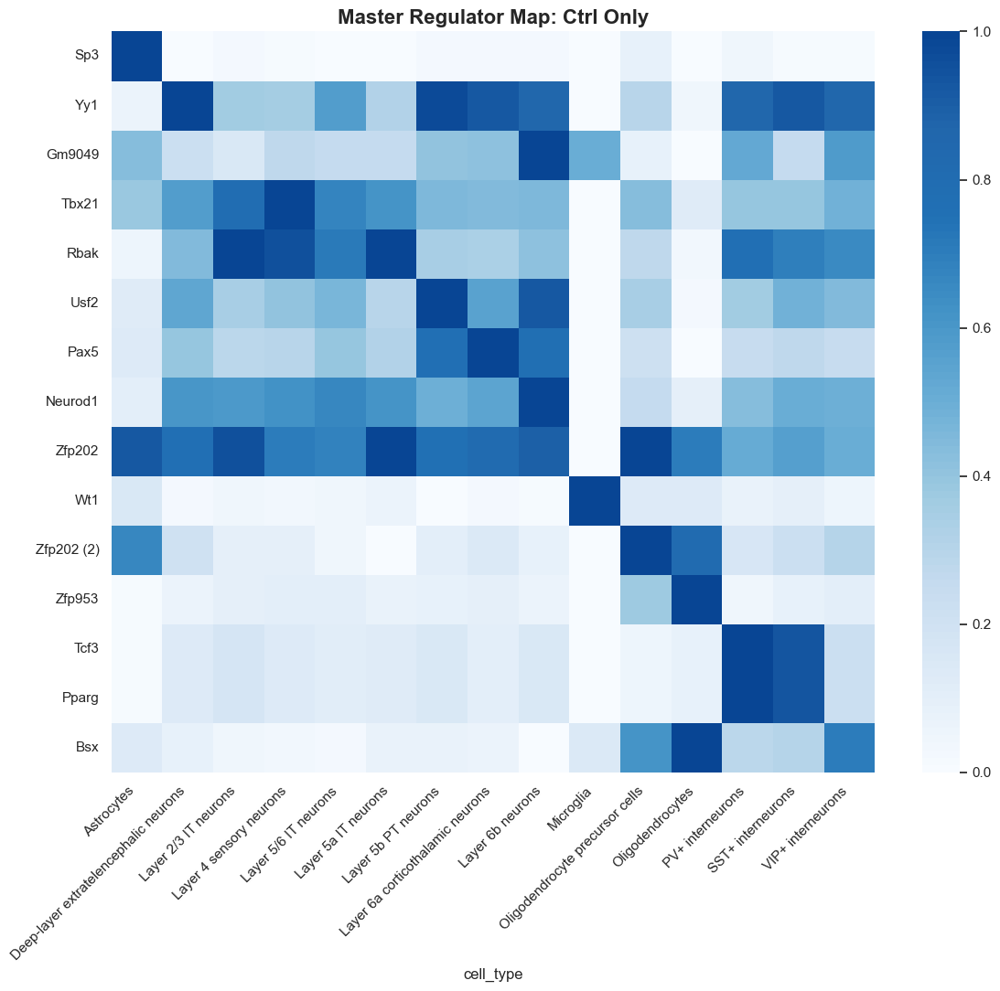

✅ Created Master_Map_CONTROL.png


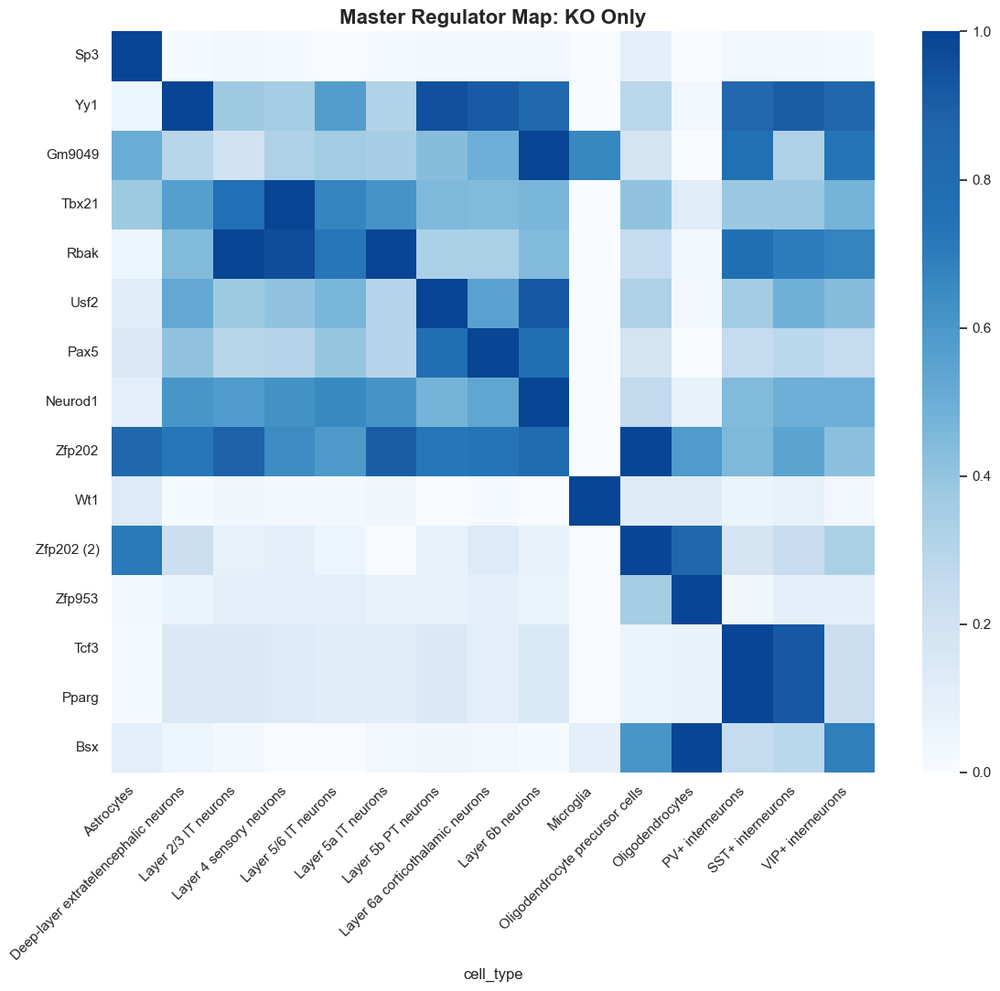

✅ Created Master_Map_KO.png


In [332]:
# import matplotlib.pyplot as plt
# import seaborn as sns
# import matplotlib as mpl
# import matplotlib.colors as mcolors
# import pandas as pd

# # 1. Global Setup
# mpl.rcParams['font.sans-serif'] = ['Arial', 'Helvetica', 'DejaVu Sans', 'sans-serif']
# mpl.rcParams['font.family'] = 'sans-serif'

# hex_colors = ["#f7fbff", "#deebf7", "#c6dbef", "#9ecae1", "#6baed6", "#4292c6", "#2171b5", "#2166ac", "#084594"]
# custom_blues_cmap = mcolors.LinearSegmentedColormap.from_list("R_Blues", hex_colors, N=100)

# def generate_genotype_heatmap(data_df, metadata, mapping, genotype_val, filename):
#     """Filters by genotype, averages by cell type, and plots with differentiated labels."""
    
#     # Identify indices for the specific genotype
#     geno_indices = metadata[metadata['genotype'] == genotype_val].index
    
#     # Subset raw AUC matrix
#     sigs = [s for s in mapping.keys() if s in data_df.columns]
#     subset_auc = data_df.loc[geno_indices, sigs].copy()
#     subset_auc['cell_type'] = metadata.loc[geno_indices, 'cell_type']
    
#     # Calculate Mean per Cell Type (Keep sig IDs as index for now to avoid collision)
#     summary_df = subset_auc.groupby('cell_type').mean().T
    
#     # --- Differentiated Labeling Logic ---
#     # 1. Count occurrences of mapped names in the current subset
#     tf_counts = {}
#     for sig in summary_df.index:
#         clean_name = mapping[sig]
#         tf_counts[clean_name] = tf_counts.get(clean_name, 0) + 1
    
#     # 2. Generate final labels
#     final_row_labels = []
#     current_seen = {}
#     for sig in summary_df.index:
#         clean_name = mapping[sig]
#         if tf_counts[clean_name] > 1:
#             current_seen[clean_name] = current_seen.get(clean_name, 0) + 1
#             # First one is clean, others are numbered (e.g., Zfp202, Zfp202 (2))
#             label = f"{clean_name} ({current_seen[clean_name]})" if current_seen[clean_name] > 1 else clean_name
#         else:
#             label = clean_name
#         final_row_labels.append(label)
    
#     summary_df.index = final_row_labels
    
#     # Optional: Filter out Endothelial/Fibroblasts columns
#     exclude = ['Endothelial', 'fibroblasts']
#     summary_df = summary_df.drop(columns=[c for c in summary_df.columns if any(e.lower() in c.lower() for e in exclude)], errors='ignore')

#     # Min-Max Scaling (Row-wise)
#     summary_scaled = summary_df.apply(
#         lambda x: (x - x.min()) / (x.max() - x.min()) if (x.max() - x.min()) != 0 else x, axis=1
#     )

#     # Plot
#     plt.figure(figsize=(12, 11))
#     sns.heatmap(summary_scaled, cmap=custom_blues_cmap, yticklabels=True)
    
#     plt.title(f"Master Regulator Map: {genotype_val} Only", fontsize=16, fontweight='bold')
#     plt.yticks(rotation=0)
#     plt.xticks(rotation=45, ha='right')
#     plt.tight_layout()
    
#     plt.savefig(filename, dpi=600)
#     plt.show()
#     print(f"✅ Created {filename}")

# # --- Execution ---
# raw_auc_mtx = scplus_obj.uns['eRegulon_AUC_Manual_Unique']['Gene_based']
# meta = scplus_obj.metadata_cell

# # 1. Run for Control
# generate_genotype_heatmap(raw_auc_mtx, meta, final_plot_mapping, "Ctrl", "Master_Map_CONTROL.png")

# # 2. Run for KO
# generate_genotype_heatmap(raw_auc_mtx, meta, final_plot_mapping, "KO", "Master_Map_KO.png")

In [ ]:
# import matplotlib.pyplot as plt
# import seaborn as sns
# import pandas as pd

# def generate_final_differentiated_map(data_df, metadata, mapping, filename, title, filter_structural=True):
#     # 1. Subset and Prepare Metadata
#     sigs = [s for s in mapping.keys() if s in data_df.columns]
#     subset = data_df[sigs].copy()
#     subset['cell_type'] = metadata['cell_type']
#     subset['genotype'] = metadata['genotype']
    
#     # 2. Calculate Mean Difference (KO - Ctrl) per Cell Type
#     grouped = subset.groupby(['cell_type', 'genotype']).mean()
#     unstacked = grouped.unstack(level='genotype')
    
#     # Only keep signatures that have both KO and Ctrl data
#     valid_sigs = [sig for sig in sigs if 'KO' in unstacked[sig].columns and 'Ctrl' in unstacked[sig].columns]
    
#     diff_results = {}
#     for sig in valid_sigs:
#         diff_results[sig] = unstacked[sig]['KO'] - unstacked[sig]['Ctrl']
    
#     # Create DataFrame: Rows are Signature IDs, Columns are Cell Types
#     diff_df = pd.DataFrame(diff_results).T 
    
#     # 3. Optional: Filter Structural Cell Type Columns
#     if filter_structural:
#         # Matches substrings like 'Endothelial' or 'fibroblasts'
#         exclude = ['Endothelial', 'fibroblasts'] 
#         cols_to_drop = [c for c in diff_df.columns if any(e.lower() in c.lower() for e in exclude)]
#         diff_df = diff_df.drop(columns=cols_to_drop, errors='ignore')

#     # 4. Dynamic Row Labeling (Number only if duplicates exist in this specific map)
#     # First pass: Count how many signatures for each clean TF name are in our result
#     tf_counts = {}
#     for sig in diff_df.index:
#         clean_name = mapping[sig]
#         tf_counts[clean_name] = tf_counts.get(clean_name, 0) + 1
    
#     # Second pass: Assign labels
#     final_row_labels = []
#     current_seen = {}
#     for sig in diff_df.index:
#         clean_name = mapping[sig]
#         # Only add "(2)" if more than one signature for this TF exists in the current diff_df
#         if tf_counts[clean_name] > 1:
#             current_seen[clean_name] = current_seen.get(clean_name, 0) + 1
#             # First one stays clean, subsequent ones get numbered
#             label = f"{clean_name} ({current_seen[clean_name]})" if current_seen[clean_name] > 1 else clean_name
#         else:
#             label = clean_name
#         final_row_labels.append(label)
    
#     diff_df.index = final_row_labels

#     # 5. Z-score Scaling (Row-wise)
#     diff_scaled = diff_df.apply(lambda x: (x - x.mean()) / (x.std() + 1e-9), axis=1)

#     # 6. Plotting
#     plt.figure(figsize=(14, 12))
#     limit = max(abs(diff_scaled.values.min()), abs(diff_scaled.values.max()))
    
#     sns.heatmap(
#         diff_scaled, 
#         cmap=custom_cmap, 
#         center=0, 
#         vmin=-limit, 
#         vmax=limit, 
#         yticklabels=True,
#         cbar_kws={'label': 'Relative Activity Shift (Z-score)'}
#     )
    
#     plt.title(title, fontsize=16, fontweight='bold')
#     plt.yticks(rotation=0)
#     plt.xticks(rotation=45, ha='right')
#     plt.tight_layout()
    
#     plt.savefig(filename, dpi=600)
#     plt.show()
#     print(f"✅ Created: {filename}")

# # --- Execution ---

# # 1. Version with structural cells FILTERED (Clean Neuronal View)
# generate_final_differentiated_map(
#     raw_auc_mtx, meta, final_plot_mapping, 
#     "Difference_Map_Zscaled_Neuronal.png", 
#     "Neuronal Activity Shift (Z-scaled)",
#     filter_structural=True
# )

# # 2. Version with ALL cells (Global View)
# generate_final_differentiated_map(
#     raw_auc_mtx, meta, final_plot_mapping, 
#     "Difference_Map_Zscaled_Full.png", 
#     "Global Activity Shift (Z-scaled)",
#     filter_structural=False
# )

In [334]:
print(f"   Cells:   {scplus_obj.n_cells}")

   Cells:   2524


In [323]:
# import pandas as pd
# import os

# # 1. Replicate the labeling logic to create a legend
# signature_legend = []
# name_counts = {}

# # We iterate through your mapping exactly as the heatmap script does
# for sig in list(final_plot_mapping.keys()):
#     clean_name = final_plot_mapping[sig]
    
#     if clean_name not in name_counts:
#         name_counts[clean_name] = 1
#         final_label = clean_name
#     else:
#         name_counts[clean_name] += 1
#         final_label = f"{clean_name} ({name_counts[clean_name]})"
    
#     signature_legend.append({
#         'Heatmap_Label': final_label,
#         'Original_Signature_ID': sig,
#         'TF_Symbol': clean_name
#     })

# # 2. Convert to DataFrame
# legend_df = pd.DataFrame(signature_legend)

# # 3. Save the full legend for your records
# legend_out = "scenicplus_further_analysis/Heatmap_Signature_Legend.csv"
# legend_df.to_csv(legend_out, index=False)

# # 4. Print the specific lookup for Zfp202
# print("--- Zfp202 Signature Identity ---")
# print(legend_df[legend_df['TF_Symbol'] == 'Zfp202'][['Heatmap_Label', 'Original_Signature_ID']])

--- Zfp202 Signature Identity ---
   Heatmap_Label                       Original_Signature_ID
8         Zfp202            Meningeal fibroblasts_pos_manual
10    Zfp202 (2)  Oligodendrocyte precursor cells_pos_manual


In [325]:
# # 1. Access the table
# tf2g = scplus_obj.uns['TF2G_importance']

# # 2. Check the column names to see how SCENIC+ is distinguishing signatures
# # Common names are 'regulon_name', 'rho', or 'importance'
# print("Columns available:", tf2g.columns.tolist())

# # 3. Search for the two specific Zfp202 signatures using keywords
# # We use 'target' (the gene) and 'TF' (the regulator gene)
# sig1_keyword = 'Meningeal fibroblasts'
# sig2_keyword = 'Oligodendrocyte precursor cells'

# # Look for these keywords in the 'TF' or 'regulon_name' column (whichever exists)
# # Let's assume the column is called 'TF' for now, but check your print above
# targets1 = tf2g[tf2g['TF'].str.contains(sig1_keyword, case=False)]['target'].unique()
# targets2 = tf2g[tf2g['TF'].str.contains(sig2_keyword, case=False)]['target'].unique()

# print(f"\nSignature 1 ({sig1_keyword}) targets: {len(targets1)}")
# print(f"Signature 2 ({sig2_keyword}) targets: {len(targets2)}")

# # 4. If they are both 0, try searching by the clean gene name but filtering by rho
# if len(targets1) == 0:
#     print("\nKeywords not found in 'TF' column. Getting all targets for Zfp202...")
#     all_zfp = tf2g[tf2g['TF'] == 'Zfp202']
#     print(f"Total entries for Zfp202 gene: {len(all_zfp)}")

Columns available: ['TF', 'target', 'importance', 'regulation', 'rho']

Signature 1 (Meningeal fibroblasts) targets: 0
Signature 2 (Oligodendrocyte precursor cells) targets: 0

Keywords not found in 'TF' column. Getting all targets for Zfp202...
Total entries for Zfp202 gene: 137


In [326]:
# # 1. Get all Zfp202 targets
# zfp_targets = tf2g[tf2g['TF'] == 'Zfp202'].copy()

# # 2. Sort by importance to see the "Master" targets
# zfp_targets = zfp_targets.sort_values('importance', ascending=False)

# # 3. Save this list for your research
# zfp_targets.to_csv("scenicplus_further_analysis/Zfp202_Literature_Research_Targets.csv", index=False)

# # 4. Show the top 10 for immediate insight
# print("Top 10 Targets for Zfp202 (shared by both signatures):")
# print(zfp_targets[['target', 'importance', 'rho', 'regulation']].head(10))

Top 10 Targets for Zfp202 (shared by both signatures):
          target  importance       rho  regulation
4661200   Zfp202    1.159363  1.000000           1
4560770  Gm24730    1.159353  0.144999           1
4560763  Gm13709    0.953798  0.062080           1
4560761   Gm8197    0.798819  0.160195           1
4560787  Gm37174    0.795043  0.089986           1
4560858    Prr33    0.644628  0.135631           1
4560885  Gm57077    0.603168  0.024963           0
4560762  Gm12637    0.561369 -0.000575           0
4560863  Gm22069    0.486320  0.001786           0
4560823  Gm22513    0.477102  0.045075           1


In [327]:
# # 1. Get unique target lists
# zfp_targets = set(tf2g[tf2g['TF'] == 'Zfp202']['target'])
# bsx_targets = set(tf2g[tf2g['TF'] == 'Bsx']['target'])

# # 2. Find intersection
# shared_genes = zfp_targets.intersection(bsx_targets)

# print(f"Zfp202 total targets: {len(zfp_targets)}")
# print(f"Bsx total targets: {len(bsx_targets)}")
# print(f"Shared targets between Zfp202 and Bsx: {len(shared_genes)}")

# # 3. Extract the details for the shared genes
# if shared_genes:
#     shared_df = tf2g[tf2g['target'].isin(shared_genes) & tf2g['TF'].isin(['Bsx', 'Zfp202'])]
#     # Pivot to see the importance/rho from both sides
#     shared_pivot = shared_df.pivot(index='target', columns='TF', values=['importance', 'rho'])
#     print("\nTop Shared Targets (by average importance):")
#     print(shared_pivot.head(10))
    
#     # Save for your "Synergy" analysis
#     shared_pivot.to_csv("scenicplus_further_analysis/Bsx_Zfp202_CoRegulated_Genes.csv")

Zfp202 total targets: 137
Bsx total targets: 33
Shared targets between Zfp202 and Bsx: 0


In [318]:
import pandas as pd
import numpy as np
import os

def export_mapped_difference_table(data_df, metadata, mapping, output_folder="scenicplus_further_analysis"):
    """
    Extracts, maps, and saves the KO-Ctrl difference matrix.
    """
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # 1. Prepare Subset
    sigs = list(mapping.keys())
    subset = data_df[sigs].copy()
    subset['cell_type'] = metadata['cell_type']
    subset['genotype'] = metadata['genotype']
    
    # 2. Calculate Mean per Group
    grouped = subset.groupby(['cell_type', 'genotype']).mean()
    unstacked = grouped.unstack(level='genotype')
    
    # 3. Calculate Difference (KO - Ctrl) and Map Names
    # We use a list of tuples to avoid the dictionary 'overwriting' issue,
    # ensuring all signatures are preserved even if they share a TF name.
    diff_list = []
    for sig in sigs:
        if 'KO' in unstacked[sig].columns and 'Ctrl' in unstacked[sig].columns:
            diff_val = unstacked[sig]['KO'] - unstacked[sig]['Ctrl']
            # We keep the Original Signature ID to ensure uniqueness, 
            # but add the Mapped TF Name as a column for your research.
            diff_list.append({
                'Signature_ID': sig,
                'Mapped_TF': mapping[sig],
                **diff_val.to_dict()
            })
            
    # Create DataFrame
    export_df = pd.DataFrame(diff_list)
    
    # Reorder columns to put identifiers at the front
    cols = ['Signature_ID', 'Mapped_TF'] + [c for c in export_df.columns if c not in ['Signature_ID', 'Mapped_TF']]
    export_df = export_df[cols]

    # 4. Save to CSV
    filename = os.path.join(output_folder, "Regulatory_Activity_Shift_Table.csv")
    export_df.to_csv(filename, index=False)
    
    print(f"✅ Exported regulatory shift table with {len(export_df)} signatures to: {filename}")
    return export_df

# --- Execution ---
# Using the mapping logic from your provided scripts
raw_auc_mtx = scplus_obj.uns['eRegulon_AUC_Manual_Unique']['Gene_based']
meta = scplus_obj.metadata_cell

final_table = export_mapped_difference_table(raw_auc_mtx, meta, final_plot_mapping)

# Preview of the table
print("\n--- Table Preview (Difference: KO - Ctrl) ---")
print(final_table.head())

✅ Exported regulatory shift table with 15 signatures to: scenicplus_further_analysis/Regulatory_Activity_Shift_Table.csv

--- Table Preview (Difference: KO - Ctrl) ---
                                       Signature_ID Mapped_TF  Astrocytes  \
0                             Astrocytes_pos_manual       Sp3   -0.000568   
1  Deep-layer extratelencephalic neurons_pos_manual       Yy1   -0.000583   
2                      Endothelial cells_pos_manual    Gm9049   -0.000709   
3                Layer 4 sensory neurons_pos_manual     Tbx21   -0.000829   
4                    Layer 5a IT neurons_pos_manual      Rbak    0.000398   

   Deep-layer extratelencephalic neurons  Endothelial cells  \
0                               0.001488           0.000514   
1                               0.001836          -0.003657   
2                              -0.000234           0.008106   
3                              -0.002039           0.003110   
4                               0.000043           0.0

In [319]:
import pandas as pd
import numpy as np
import os

def export_zscored_difference_table(data_df, metadata, mapping, output_folder="scenicplus_further_analysis"):
    """
    Extracts, maps, Z-scores row-wise, and saves the KO-Ctrl difference matrix.
    """
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # 1. Prepare Subset of AUC data
    sigs = list(mapping.keys())
    subset = data_df[sigs].copy()
    subset['cell_type'] = metadata['cell_type']
    subset['genotype'] = metadata['genotype']
    
    # 2. Calculate Mean AUC per (Cell Type + Genotype)
    grouped = subset.groupby(['cell_type', 'genotype']).mean()
    unstacked = grouped.unstack(level='genotype')
    
    # 3. Calculate Difference (KO minus Ctrl)
    diff_list = []
    for sig in sigs:
        if 'KO' in unstacked[sig].columns and 'Ctrl' in unstacked[sig].columns:
            diff_val = unstacked[sig]['KO'] - unstacked[sig]['Ctrl']
            diff_list.append({
                'Signature_ID': sig,
                'Mapped_TF': mapping[sig],
                **diff_val.to_dict()
            })
            
    # Create the base DataFrame
    export_df = pd.DataFrame(diff_list)
    
    # 4. Apply Z-score Scaling (Row-wise)
    # This highlights which cell types are 'outliers' for each TF's shift
    numeric_cols = [c for c in export_df.columns if c not in ['Signature_ID', 'Mapped_TF']]
    
    def calculate_zscore(row):
        # Handle cases with no variance to avoid division by zero
        if row.std() == 0:
            return row - row.mean()
        return (row - row.mean()) / row.std()

    export_df[numeric_cols] = export_df[numeric_cols].apply(calculate_zscore, axis=1)

    # 5. Save to CSV
    filename = os.path.join(output_folder, "Regulatory_Activity_Shift_ZSCORED.csv")
    export_df.to_csv(filename, index=False)
    
    print(f"✅ Exported Z-scored shift table to: {filename}")
    return export_df

# --- Execution ---
# Use the same matrix and metadata from your previous steps
raw_auc_mtx = scplus_obj.uns['eRegulon_AUC_Manual_Unique']['Gene_based']
meta = scplus_obj.metadata_cell

zscored_table = export_zscored_difference_table(raw_auc_mtx, meta, final_plot_mapping)

✅ Exported Z-scored shift table to: scenicplus_further_analysis/Regulatory_Activity_Shift_ZSCORED.csv


In [304]:
# import os
# import pickle

# # 1. Create the subdirectory
# output_dir = "scenicplus_final_output_files"
# if not os.path.exists(output_dir):
#     os.makedirs(output_dir)
#     print(f"Created directory: {output_dir}")

# # 2. Save the most important components
# print("Starting save process...")

# # # Save the main SCENIC+ object (The "Master File")
# # # This includes the eRegulon AUC matrices and your metadata with genotypes
# # with open(os.path.join(output_dir, "scplus_obj_final.pkl"), 'wb') as f:
# #     pickle.dump(scplus_obj, f)
# # print("✅ Saved: scplus_obj_final.pkl")

# # Save the mapping dictionary 
# # Crucial for matching AUC signature names to TF names in future plots
# with open(os.path.join(output_dir, "final_plot_mapping.pkl"), 'wb') as f:
#     pickle.dump(final_plot_mapping, f)
# print("✅ Saved: final_plot_mapping.pkl")

# # Save the metadata as a CSV
# # This allows you to check your Genotype distribution in Excel/R
# scplus_obj.metadata_cell.to_csv(os.path.join(output_dir, "metadata_final.csv"))
# print("✅ Saved: metadata_final.csv")

# print(f"\n🚀 Success! All items are ready in '{output_dir}'")

Created directory: scenicplus_final_output
Starting save process...
✅ Saved: scplus_obj_final.pkl
✅ Saved: final_plot_mapping.pkl
✅ Saved: metadata_final.csv

🚀 Success! All items are ready in 'scenicplus_final_output'


In [306]:
# List all keys to find the metadata table
print(scplus_obj.uns.keys())

dict_keys(['search_space', 'cistromes', 'Region_to_gene', 'TF2G_importance', 'eRegulon_AUC_thresholds', 'eRegulon_AUC', 'eRegulon_AUC_Full', 'eRegulon_AUC_Manual', 'eRegulon_AUC_Manual_Unique', 'RSS', 'eRegulon_AUC_NAMED'])


In [308]:
print(scplus_obj.uns['TF2G_importance'].columns.tolist())

['TF', 'target', 'importance', 'regulation', 'rho']


In [330]:
# import os
# import pandas as pd

# # 1. Setup
# further_out = "scenicplus_further_analysis"
# if not os.path.exists(further_out):
#     os.makedirs(further_out)

# # 2. Extract signatures and data
# sigs_to_process = list(final_plot_mapping.keys())
# tf2g = scplus_obj.uns['TF2G_importance']

# summary_stats = []
# name_counts = {}

# print(f"Processing {len(sigs_to_process)} signatures with clean naming...")

# for sig in sigs_to_process:
#     clean_tf_name = final_plot_mapping[sig]
    
#     # --- DUPLICATE HANDLING (Heatmap-style naming) ---
#     if clean_tf_name not in name_counts:
#         name_counts[clean_tf_name] = 1
#         pretty_name = clean_tf_name
#     else:
#         name_counts[clean_tf_name] += 1
#         # Using underscore to keep filenames clean (e.g., Zfp202_2)
#         pretty_name = f"{clean_tf_name}_{name_counts[clean_tf_name]}"
    
#     # STEP 1: Lookup targets using the clean Gene Symbol
#     targets = tf2g[tf2g['TF'] == clean_tf_name].copy()
    
#     # STEP 2: Fallback to signature ID
#     if targets.empty:
#         targets = tf2g[tf2g['TF'] == sig].copy()
        
#     # STEP 3: Fallback to case-insensitive partial match
#     if targets.empty:
#         targets = tf2g[tf2g['TF'].str.contains(clean_tf_name, case=False, na=False)].copy()

#     if targets.empty:
#         print(f"❌ Still no targets found for: {pretty_name} ({sig})")
#         continue
        
#     # Standard processing
#     targets = targets.sort_values('importance', ascending=False)
    
#     # SAVE using the Mapped TF Name
#     filename = f"Targets_{pretty_name}.csv"
#     targets.to_csv(os.path.join(further_out, filename), index=False)
    
#     summary_stats.append({
#         'File_Name': filename,
#         'Mapped_TF': pretty_name,
#         'Original_Signature': sig,
#         'Total_Targets': len(targets),
#         'Top_Target': targets['target'].iloc[0],
#         'Top_Importance': targets['importance'].iloc[0],
#         'Activators_Count': len(targets[targets['rho'] > 0]),
#         'Repressors_Count': len(targets[targets['rho'] < 0])
#     })
#     print(f"✅ Created: {filename}")

# # Save the final summary with mapping info
# summary_df = pd.DataFrame(summary_stats)
# summary_df.to_csv(os.path.join(further_out, "Differentiated_TF_Summary.csv"), index=False)

# print(f"\n🚀 Success! Differentiated files are in '{further_out}'")
# print(summary_df[['File_Name', 'Total_Targets']])

Processing 15 signatures with clean naming...
✅ Created: Targets_Sp3.csv
✅ Created: Targets_Yy1.csv
❌ Still no targets found for: Gm9049 (Endothelial cells_pos_manual)
✅ Created: Targets_Tbx21.csv
✅ Created: Targets_Rbak.csv
✅ Created: Targets_Usf2.csv
✅ Created: Targets_Pax5.csv
✅ Created: Targets_Neurod1.csv
✅ Created: Targets_Zfp202.csv
✅ Created: Targets_Wt1.csv
✅ Created: Targets_Zfp202_2.csv
✅ Created: Targets_Zfp953.csv
✅ Created: Targets_Tcf3.csv
✅ Created: Targets_Pparg.csv
✅ Created: Targets_Bsx.csv

🚀 Success! Differentiated files are in 'scenicplus_further_analysis'
               File_Name  Total_Targets
0        Targets_Sp3.csv            277
1        Targets_Yy1.csv            214
2      Targets_Tbx21.csv             43
3       Targets_Rbak.csv            159
4       Targets_Usf2.csv            183
5       Targets_Pax5.csv             51
6    Targets_Neurod1.csv             85
7     Targets_Zfp202.csv            137
8        Targets_Wt1.csv             16
9   Targets_Zfp

In [586]:
import os
import pandas as pd

further_out = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis"
os.makedirs(further_out, exist_ok=True)

tf2g     = scplus_obj.uns['TF2G_importance']
exp_df   = scplus_obj.to_df("EXP")
metadata = scplus_obj.metadata_cell
tf2g_pos = tf2g_filtered[tf2g_filtered["rho"] > 0].copy()

summary_stats = []

print(f"Processing {len(tf_mapping_clean)} signatures...")

for sig, tf_name in tf_mapping_clean.items():
    ct = sig.replace('_pos_manual', '')

    # ── Global targets (all cells) ────────────────────────────────────────────
    global_targets = tf2g[tf2g['TF'] == tf_name].sort_values('importance', ascending=False)

    if global_targets.empty:
        print(f"❌ No targets found for: {tf_name} ({sig})")
        continue

    clean_ct = ct.replace('/', '_').replace(' ', '_')
    global_targets.to_csv(os.path.join(further_out, f"Targets_{tf_name}_{clean_ct}_global.csv"), index=False)

    # ── Cell-type-specific weighted targets (from FIX-8 logic) ───────────────
    ct_cells = [c for c in metadata[metadata["cell_type"] == ct].index if c in exp_df.index]
    if ct_cells:
        ct_exp    = exp_df.loc[ct_cells].mean(axis=0)
        ct_targets = tf2g_pos[tf2g_pos['TF'] == tf_name].copy()
        ct_targets['target_exp'] = ct_targets['target'].map(ct_exp).fillna(0)
        ct_targets['weighted']   = ct_targets['importance'] * ct_targets['target_exp']
        ct_targets = ct_targets.sort_values('weighted', ascending=False)
        ct_targets.to_csv(os.path.join(further_out, f"Targets_{tf_name}_{clean_ct}_celltype_specific.csv"), index=False)

    summary_stats.append({
        'Signature'         : sig,
        'Cell_Type'         : ct,
        'TF'                : tf_name,
        'Total_Targets'     : len(global_targets),
        'Top_Target'        : global_targets['target'].iloc[0],
        'Top_Importance'    : round(global_targets['importance'].iloc[0], 4),
        'Activators'        : len(global_targets[global_targets['rho'] > 0]),
        'Repressors'        : len(global_targets[global_targets['rho'] < 0]),
    })
    print(f"✅ {tf_name:15s} ({ct})")

summary_df = pd.DataFrame(summary_stats).sort_values('Total_Targets', ascending=False)
summary_df.to_csv(os.path.join(further_out, "TF_Summary.csv"), index=False)

print(f"\n🚀 Done! Files saved to: {further_out}")
print(summary_df[['TF', 'Cell_Type', 'Total_Targets', 'Activators', 'Repressors']])

Processing 17 signatures...
✅ Msi2            (Astrocytes)
✅ Mef2c           (SST+ interneurons)
✅ Satb2           (Layer 5/6 IT neurons)
✅ Celf5           (Deep-layer extratelencephalic neurons)
✅ Rora            (Oligodendrocyte precursor cells)
✅ Fli1            (Endothelial cells)
✅ Zfp831          (Layer 6b neurons)
✅ Zbtb20          (Meningeal fibroblasts)
✅ Srrm3           (PV+ interneurons)
✅ Bcl11b          (Layer 5b PT neurons)
✅ Pparg           (Layer 5a IT neurons)
✅ Zfhx3           (Microglia)
✅ Zmat4           (Layer 4 sensory neurons)
✅ Cux2            (Layer 2/3 IT neurons)
✅ Esrrg           (Layer 6a corticothalamic neurons)
✅ Zfp536          (Oligodendrocytes)
✅ Celf4           (VIP+ interneurons)

🚀 Done! Files saved to: /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis
        TF                              Cell_Type  Total_Targets  Activators  \
4     Rora        Oligodendrocyte precursor cells           1683        1

In [ ]:
# import matplotlib.pyplot as plt
# import seaborn as sns
# import pandas as pd
# import os

# # 1. Load the summary data we just created
# further_out = "scenicplus_further_analysis"
# summary_path = os.path.join(further_out, "Master_Regulator_Comparison.csv")

# if os.path.exists(summary_path):
#     summary_df = pd.read_csv(summary_path)
    
#     # 2. Setup Plot Style
#     plt.figure(figsize=(10, 8))
#     sns.set_theme(style="whitegrid")
#     # Arial/Helvetica for publication quality
#     plt.rcParams['font.sans-serif'] = ['Arial', 'Helvetica', 'DejaVu Sans']
    
#     # 3. Sort for a "Waterfall" effect
#     summary_df_sorted = summary_df.sort_values('Total_Targets', ascending=False)
    
#     # 4. Create Horizontal Bar Plot
#     barplot = sns.barplot(
#         data=summary_df_sorted, 
#         x='Total_Targets', 
#         y='TF', 
#         hue='TF',
#         palette='magma',
#         legend=False
#     )
    
#     # 5. Annotate each bar with the exact target count
#     for i, v in enumerate(summary_df_sorted['Total_Targets']):
#         barplot.text(v + (max(summary_df_sorted['Total_Targets']) * 0.01), i, str(int(v)), 
#                      va='center', fontweight='bold', color='black')
    
#     # 6. Labeling
#     plt.title('Master Regulator Connectivity\n(Total Downstream Targets in GRN)', fontsize=15, fontweight='bold', pad=20)
#     plt.xlabel('Number of Predicted Target Genes', fontsize=12)
#     plt.ylabel('Transcription Factor', fontsize=12)
#     plt.tight_layout()
    
#     # 7. Save to folder
#     plot_out = os.path.join(further_out, "Master_Regulator_Connectivity.png")
#     plt.savefig(plot_out, dpi=300)
#     plt.show()
#     print(f"✅ Created Connectivity Plot: {plot_out}")
# else:
#     print("❌ CSV not found. Please ensure the batch extraction script ran successfully first.")

In [ ]:
################################

In [ ]:
################################

In [ ]:
############# DOWNSTREAM ANALYIS ###################

In [ ]:
################################

In [ ]:
################################

In [584]:
FURTHER  = f"{WORK_DIR}/further_analysis_downstream"
os.makedirs(FURTHER, exist_ok=True)

In [585]:
print(f"   Cells:   {scplus_obj_geno.n_cells}")
print(f"   Genes:   {scplus_obj_geno.n_genes}")
print(f"   Regions: {scplus_obj_geno.n_regions}")

   Cells:   2446
   Genes:   56884
   Regions: 746029


In [336]:
df_manual_unique = checkpoint_data["df_manual_unique"]
tf_mapping       = checkpoint_data["tf_mapping"]

print(f"✅ Loaded {len(final_plot_mapping)} TF signatures")

✅ Loaded 15 TF signatures


In [337]:
# In[A-4]:
# ── Convenience aliases ────────────────────────────────────────────────────────

auc_df   = scplus_obj.uns["eRegulon_AUC_Manual_Unique"]["Gene_based"]
metadata = scplus_obj.metadata_cell                   # must contain 'cell_type' & 'genotype'
exp_mtx  = scplus_obj.to_df("EXP")
acc_mtx  = scplus_obj.to_df("ACC")
tf2g     = scplus_obj.uns["TF2G_importance"]

print("Columns in metadata:", metadata.columns.tolist())
print("Genotypes available:", metadata["genotype"].unique() if "genotype" in metadata.columns else "MISSING genotype column!")

Columns in metadata: ['cell_type', 'genotype']
Genotypes available: ['KO' 'Ctrl']


In [342]:
# ─────────────────────────────────────────────────────────────────────────────
# In[B-1]:
# ── MODULE B: Differential Regulon Activity — Statistical Testing ─────────────
# ─────────────────────────────────────────────────────────────────────────────
# Runs a Wilcoxon (Mann-Whitney U) test per eRegulon per cell type,
# then applies Benjamini-Hochberg FDR correction across all tests.
# Outputs:
#   • Volcano plot (Log2FC vs. -log10 FDR)
#   • Ranked barplot
#   • Summary CSV

from scipy import stats
from statsmodels.stats.multitest import multipletests

# In[B-2 REVISED]:
# ── Descriptive ΔZ-score ranking — No statistical test (n=1 per group) ────────
# With 1 library per condition, no between-replicate variance can be estimated.
# We report effect sizes (ΔZ-score, Cohen's d) as exploratory measures only.

from scipy.stats import zscore

effect_rows = []

for sig, tf_label in final_plot_mapping.items():
    if sig not in auc_df.columns:
        continue

    tf_name = tf_label.split(" (")[0].strip()
    ct_name = sig.replace("_pos_manual", "").replace("_", " ")

    idx_ct = metadata["cell_type"].str.replace("_", " ") == ct_name
    sub    = metadata.loc[idx_ct].copy()
    sub["AUC"] = auc_df.loc[idx_ct, sig].values
    sub    = sub[sub["genotype"].isin(["Ctrl", "KO"])]

    if sub["genotype"].nunique() < 2 or sub["AUC"].std() == 0:
        continue

    sub["Z"] = zscore(sub["AUC"].astype(float), ddof=1)

    mean_z_ctrl = sub.loc[sub["genotype"] == "Ctrl", "Z"].mean()
    mean_z_ko   = sub.loc[sub["genotype"] == "KO",   "Z"].mean()
    delta_z     = mean_z_ko - mean_z_ctrl

    # Cohen's d as secondary effect size
    ctrl_vals = sub.loc[sub["genotype"] == "Ctrl", "AUC"]
    ko_vals   = sub.loc[sub["genotype"] == "KO",   "AUC"]
    pooled_sd = np.sqrt((ctrl_vals.std()**2 + ko_vals.std()**2) / 2) + 1e-9
    cohen_d   = (ko_vals.mean() - ctrl_vals.mean()) / pooled_sd

    effect_rows.append({
        "Signature":  sig,
        "TF":         tf_name,
        "Cell_Type":  ct_name,
        "Delta_Z":    delta_z,
        "Cohen_d":    cohen_d,
        "Mean_AUC_Ctrl": ctrl_vals.mean(),
        "Mean_AUC_KO":   ko_vals.mean(),
        "n_Ctrl_cells":  len(ctrl_vals),
        "n_KO_cells":    len(ko_vals),
    })

effect_df = pd.DataFrame(effect_rows).sort_values("Delta_Z", ascending=False)
effect_df["-log10_dummy"] = np.abs(effect_df["Delta_Z"])  # for volcano-style plot

csv_path = f"{FURTHER}/Descriptive_eRegulon_EffectSize.csv"
effect_df.to_csv(csv_path, index=False)
print(f"✅ Effect size table saved → {csv_path}")
print(effect_df[["TF", "Cell_Type", "Delta_Z", "Cohen_d"]].head(10).to_string())

✅ Effect size table saved → /Users/cnbr/Downloads/Seurat_scATAC-seq/further_analysis_downstream/Descriptive_eRegulon_EffectSize.csv
         TF                              Cell_Type   Delta_Z   Cohen_d
1       Yy1  Deep-layer extratelencephalic neurons  0.614013  0.530356
7   Neurod1                       Layer 6b neurons  0.377287  0.450406
9       Wt1                              Microglia  0.280231  0.292297
2    Gm9049                      Endothelial cells  0.269169  0.269302
12     Tcf3                       PV+ interneurons  0.125835  0.140163
4      Rbak                    Layer 5a IT neurons  0.095344  0.094111
14      Bsx                      VIP+ interneurons  0.080077  0.077682
3     Tbx21                Layer 4 sensory neurons  0.045958  0.046652
8    Zfp202                  Meningeal fibroblasts -0.018173 -0.018089
6      Pax5       Layer 6a corticothalamic neurons -0.059768 -0.056619


✅ All significant cell types matched to color map
2026-05-06 10:24:32,953 fontTools.subset INFO     maxp pruned
2026-05-06 10:24:32,953 fontTools.subset INFO     LTSH dropped
2026-05-06 10:24:32,954 fontTools.subset INFO     cmap pruned
2026-05-06 10:24:32,954 fontTools.subset INFO     kern dropped
2026-05-06 10:24:32,956 fontTools.subset INFO     post pruned
2026-05-06 10:24:32,956 fontTools.subset INFO     PCLT dropped
2026-05-06 10:24:32,956 fontTools.subset INFO     JSTF dropped
2026-05-06 10:24:32,956 fontTools.subset INFO     DSIG dropped
2026-05-06 10:24:32,958 fontTools.subset INFO     GPOS pruned
2026-05-06 10:24:32,959 fontTools.subset INFO     GSUB pruned
2026-05-06 10:24:32,960 fontTools.subset INFO     glyf pruned
2026-05-06 10:24:32,961 fontTools.subset INFO     Added gid0 to subset
2026-05-06 10:24:32,961 fontTools.subset INFO     Added first four glyphs to subset
2026-05-06 10:24:32,962 fontTools.subset INFO     Closing glyph list over 'GSUB': 37 glyphs before
2026-05-0

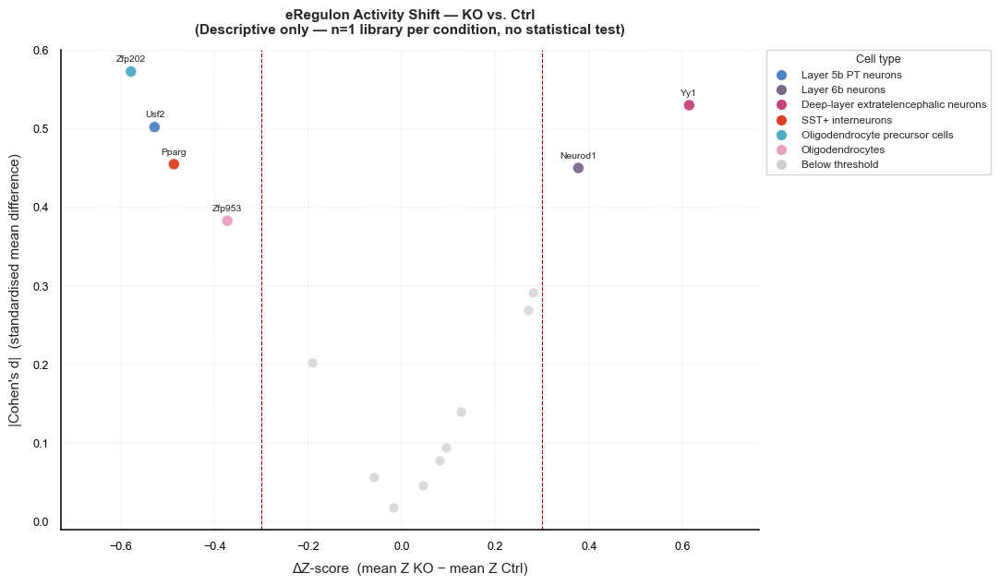

✅ Effect-size plot saved


In [356]:
# In[B-3 REVISED]:
# ── Dual effect-size plot (ΔZ vs. |Cohen's d|) — colored by cell type ────────

from matplotlib.patches import Patch
import matplotlib.lines as mlines

Z_THRESH = 0.3

# ── Cell-type color map (from R) ──────────────────────────────────────────────
atac_new_order = [
    "Layer 2/3 IT neurons",
    "Layer 4 sensory neurons",
    "Layer 5a IT neurons",
    "Layer 5b PT neurons",
    "Layer 5/6 IT neurons",
    "Layer 6a corticothalamic neurons",
    "Layer 6b neurons",
    "Deep-layer extratelencephalic neurons",
    "Corticospinal neurons (Type I)",
    "Corticospinal neurons (Type II)",
    "PV+ interneurons",
    "SST+ interneurons",
    "VIP+ interneurons",
    "Astrocytes",
    "Oligodendrocyte precursor cells",
    "Oligodendrocytes",
    "Perineuronal oligodendrocytes",
    "Myelinating oligodendrocytes",
    "Microglia",
    "Endothelial cells",
    "Leptomeningeal cells",
    "Meningeal fibroblasts",
]
hex_colors = [
    "#6B5B95","#45B8AC","#955251","#4E84C4","#B565A7",
    "#88B04B","#7B6888","#C3447A","#009B77","#EFC050",
    "#7FCDCD","#DD4124","#5B5EA6","#E07A5F","#4BACC6",
    "#E8A0BF","#ea8a33","#9B2335","#C17BAE","#DECF3F",
    "#789262","#BC243C",
]
atac_colors = dict(zip(atac_new_order, hex_colors))

# ── Debug: catch any cell type in effect_df not found in the color map ────────
sig_rows = effect_df[effect_df["Delta_Z"].abs() > Z_THRESH]
unmatched = set(sig_rows["Cell_Type"].unique()) - set(atac_colors.keys())
if unmatched:
    print("⚠️  Unmatched cell types (will appear gray):")
    for ct in sorted(unmatched):
        print(f"   repr: {repr(ct)}")
else:
    print("✅ All significant cell types matched to color map")

# ── Normalize cell type strings to be safe (strip whitespace) ─────────────────
effect_df["Cell_Type_clean"] = effect_df["Cell_Type"].str.strip()
atac_colors_clean = {k.strip(): v for k, v in atac_colors.items()}

# ── Assign colors ─────────────────────────────────────────────────────────────
mask_sig  = effect_df["Delta_Z"].abs() > Z_THRESH
mask_gray = ~mask_sig

dot_colors_sig = [
    atac_colors_clean.get(ct, "#999999")
    for ct in effect_df.loc[mask_sig, "Cell_Type_clean"]
]

# ── Plot ──────────────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(11, 6.5))

# Gray dots first
ax.scatter(
    effect_df.loc[mask_gray, "Delta_Z"],
    effect_df.loc[mask_gray, "Cohen_d"].abs(),
    c="#d0d0d0", s=55, alpha=0.75, linewidths=0, zorder=2
)
# Colored significant dots on top
sc = ax.scatter(
    effect_df.loc[mask_sig, "Delta_Z"],
    effect_df.loc[mask_sig, "Cohen_d"].abs(),
    c=dot_colors_sig,
    s=75, alpha=0.95, linewidths=0.4,
    edgecolors="white", zorder=3
)

# TF labels — centered above each dot
for _, row in effect_df[mask_sig].iterrows():
    ax.annotate(
        row["TF"],
        (row["Delta_Z"], abs(row["Cohen_d"])),
        fontsize=7.5, ha="center", va="bottom",
        xytext=(0, 6), textcoords="offset points",
        color="#222222",
    )

# Threshold lines
ax.axvline(-Z_THRESH, color="#8B0000", lw=0.8, ls="--", zorder=2)
ax.axvline( Z_THRESH, color="#8B0000", lw=0.8, ls="--", zorder=2)

# ── Widen x-axis so leftmost/rightmost labels don't clip ─────────────────────
x_min, x_max = effect_df["Delta_Z"].min(), effect_df["Delta_Z"].max()
x_pad = 0.15  # extra padding in ΔZ units on each side
ax.set_xlim(x_min - x_pad, x_max + x_pad)

# Axes styling
ax.set_xlabel("ΔZ-score  (mean Z KO − mean Z Ctrl)", fontsize=11, labelpad=8)
ax.set_ylabel("|Cohen's d|  (standardised mean difference)", fontsize=11, labelpad=8)
ax.set_title(
    "eRegulon Activity Shift — KO vs. Ctrl\n"
    "(Descriptive only — n=1 library per condition, no statistical test)",
    fontsize=11, fontweight="bold", pad=12
)

for spine in ["bottom", "left"]:
    ax.spines[spine].set_color("black")
    ax.spines[spine].set_linewidth(1.1)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.tick_params(colors="black", labelsize=9, width=1.1)
ax.grid(True, linestyle="--", linewidth=0.35, color="#cccccc", alpha=0.7, zorder=0)
ax.set_axisbelow(True)

# ── Legend: only cell types present in significant dots, in canonical order ───
sig_celltypes = set(effect_df.loc[mask_sig, "Cell_Type_clean"].unique())
legend_els = [
    mlines.Line2D([], [], marker="o", linestyle="None",
                  color=atac_colors_clean[ct], markersize=7, label=ct)
    for ct in atac_new_order if ct.strip() in sig_celltypes
]
# Append any unmatched that still appeared (shown as gray)
for ct in sig_celltypes:
    if ct not in [k.strip() for k in atac_new_order]:
        legend_els.append(
            mlines.Line2D([], [], marker="o", linestyle="None",
                          color="#999999", markersize=7, label=f"{ct} (unmatched)")
        )
legend_els.append(
    mlines.Line2D([], [], marker="o", linestyle="None",
                  color="#d0d0d0", markersize=7, label="Below threshold")
)

ax.legend(
    handles=legend_els,
    loc="upper left",
    bbox_to_anchor=(1.01, 1.0),
    borderaxespad=0,
    fontsize=8.5,
    framealpha=0.85,
    edgecolor="#cccccc",
    title="Cell type",
    title_fontsize=9,
)

plt.tight_layout()
plt.savefig(f"{FURTHER}/EffectSize_eRegulon_KO_vs_Ctrl.pdf", bbox_inches="tight")
plt.savefig(f"{FURTHER}/EffectSize_eRegulon_KO_vs_Ctrl.png", dpi=200, bbox_inches="tight")
plt.show()
print("✅ Effect-size plot saved")

2026-05-06 10:30:47,306 fontTools.subset INFO     maxp pruned
2026-05-06 10:30:47,306 fontTools.subset INFO     LTSH dropped
2026-05-06 10:30:47,306 fontTools.subset INFO     cmap pruned
2026-05-06 10:30:47,307 fontTools.subset INFO     kern dropped
2026-05-06 10:30:47,308 fontTools.subset INFO     post pruned
2026-05-06 10:30:47,308 fontTools.subset INFO     PCLT dropped
2026-05-06 10:30:47,308 fontTools.subset INFO     JSTF dropped
2026-05-06 10:30:47,308 fontTools.subset INFO     DSIG dropped
2026-05-06 10:30:47,310 fontTools.subset INFO     GPOS pruned
2026-05-06 10:30:47,311 fontTools.subset INFO     GSUB pruned
2026-05-06 10:30:47,312 fontTools.subset INFO     glyf pruned
2026-05-06 10:30:47,313 fontTools.subset INFO     Added gid0 to subset
2026-05-06 10:30:47,314 fontTools.subset INFO     Added first four glyphs to subset
2026-05-06 10:30:47,314 fontTools.subset INFO     Closing glyph list over 'GSUB': 43 glyphs before
2026-05-06 10:30:47,314 fontTools.subset INFO     Glyph nam

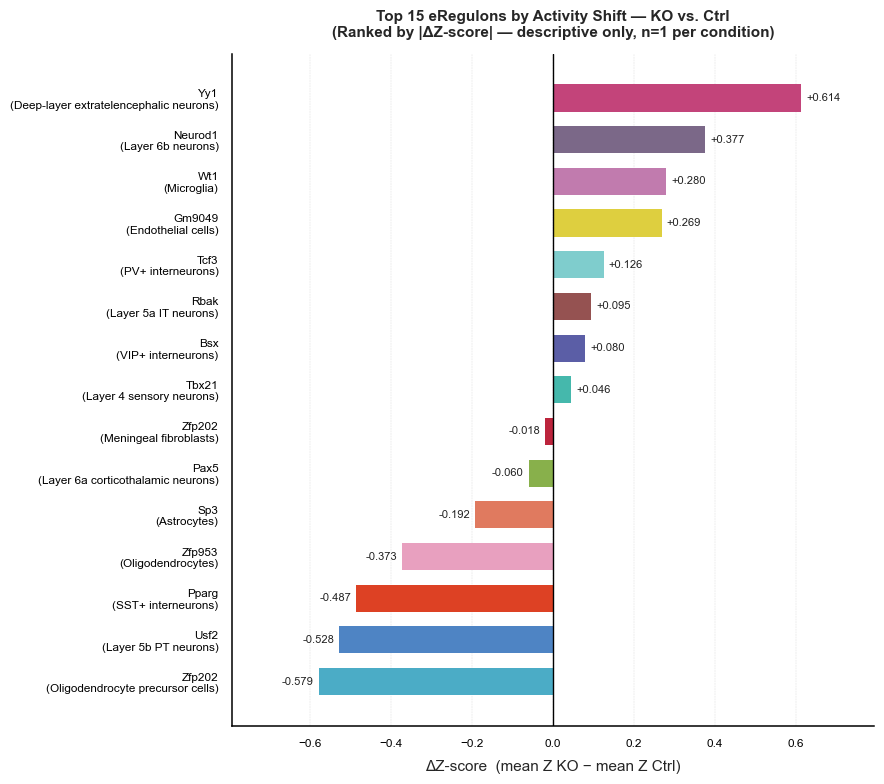

✅ Ranked barplot saved


In [358]:
# In[B-4 REVISED]:
# ── Ranked barplot — Top 15 eRegulons by |ΔZ-score| ─────────────────────────
# Uses effect_df from B-2 (no p-values, descriptive only)

# Build display label: TF + full cell type
effect_df["display"] = effect_df["TF"] + "\n(" + effect_df["Cell_Type"] + ")"

# Take top 15 by absolute ΔZ, sorted so most negative is at the top
top_n = (
    effect_df
    .assign(abs_dz=effect_df["Delta_Z"].abs())
    .nlargest(15, "abs_dz")
    .sort_values("Delta_Z", ascending=True)   # negative at top → positive at bottom
)

# Color by cell type (same map as B-3), fallback to directional color if unmatched
bar_colors = []
for _, row in top_n.iterrows():
    ct_color = atac_colors_clean.get(row["Cell_Type"].strip())
    bar_colors.append(ct_color if ct_color else ("#7FCDCD" if row["Delta_Z"] > 0 else "#F08080"))

# ── Plot ──────────────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(9, 8))

bars = ax.barh(
    top_n["display"], top_n["Delta_Z"],
    color=bar_colors, edgecolor="none", height=0.65
)

ax.axvline(0, color="black", lw=1, zorder=3)

# Value labels — placed just outside each bar, never overlapping zero line
for bar, val in zip(bars, top_n["Delta_Z"]):
    x_pos = val + 0.012 if val >= 0 else val - 0.012
    ha    = "left"      if val >= 0 else "right"
    ax.text(
        x_pos,
        bar.get_y() + bar.get_height() / 2,
        f"{val:+.3f}",
        va="center", ha=ha, fontsize=8, color="#222222"
    )

# ── Widen x-axis to prevent label/bar clipping ───────────────────────────────
x_abs_max = top_n["Delta_Z"].abs().max()
ax.set_xlim(-(x_abs_max + 0.18), x_abs_max + 0.18)

# Axes styling
ax.set_xlabel("ΔZ-score  (mean Z KO − mean Z Ctrl)", fontsize=11, labelpad=8)
ax.set_ylabel("")
ax.set_title(
    "Top 15 eRegulons by Activity Shift — KO vs. Ctrl\n"
    "(Ranked by |ΔZ-score| — descriptive only, n=1 per condition)",
    fontsize=11, fontweight="bold", pad=12
)

for spine in ["bottom", "left"]:
    ax.spines[spine].set_color("black")
    ax.spines[spine].set_linewidth(1.1)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.tick_params(colors="black", labelsize=8.5, width=1.1)

# Thin vertical gridlines only
ax.xaxis.grid(True, linestyle="--", linewidth=0.35, color="#cccccc", alpha=0.7, zorder=0)
ax.yaxis.grid(False)
ax.set_axisbelow(True)

plt.tight_layout()
plt.savefig(f"{FURTHER}/Ranked_eRegulons_DeltaZ.pdf", bbox_inches="tight")
plt.savefig(f"{FURTHER}/Ranked_eRegulons_DeltaZ.png", dpi=200, bbox_inches="tight")
plt.show()
print("✅ Ranked barplot saved")

In [ ]:
#################################################

In [ ]:
########### eREGULON CONNECTIVITY ###############

In [ ]:
#################################################

In [490]:
# ─────────────────────────────────────────────────────────────────────────────
# In[C-1]:
# ── MODULE C: TF Co-Regulatory Network ───────────────────────────────────────
# Builds a TF–TF similarity graph using shared-target Jaccard index.
# Exports:
#   • NetworkX visualization (colored by cell-type specificity)
#   • Edge-list CSV for import into Cytoscape
# ─────────────────────────────────────────────────────────────────────────────

import networkx as nx
from itertools import combinations

# In[C-2 REVISED]:
# ── Build TF → target-gene sets (excluding non-neural cell types) ─────────────

import networkx as nx

EXCLUDE_CELLTYPES = {"Endothelial cells", "Meningeal fibroblasts"}

tf_gene_sets = {}
sig_to_label = {}
sig_to_ct    = {}

for sig, tf_full_label in final_plot_mapping.items():
    tf_name = tf_full_label.split(" (")[0].strip()
    ct_name = sig.replace("_pos_manual", "").replace("_", " ").strip()

    if ct_name in EXCLUDE_CELLTYPES:
        continue

    display      = tf_name          # ← TF name only, no cell type suffix
    key          = sig              # keep sig as internal key to avoid collisions
    sig_to_label[sig] = display
    sig_to_ct[sig]    = ct_name

    genes = (
        df_manual_unique[df_manual_unique["Gene_signature_name"] == sig]["Gene"]
        .unique()
        .tolist()
    )
    if len(genes) > 0:
        tf_gene_sets[sig] = set(genes)

print(f"✅ Built gene sets for {len(tf_gene_sets)} TF signatures")
print(f"   Excluded: {EXCLUDE_CELLTYPES}")
print("   Remaining cell types:", sorted(set(sig_to_ct.values())))

✅ Built gene sets for 15 TF signatures
   Excluded: {'Meningeal fibroblasts', 'Endothelial cells'}
   Remaining cell types: ['Astrocytes', 'Deep-layer extratelencephalic neurons', 'Layer 2/3 IT neurons', 'Layer 4 sensory neurons', 'Layer 5/6 IT neurons', 'Layer 5a IT neurons', 'Layer 5b PT neurons', 'Layer 6a corticothalamic neurons', 'Layer 6b neurons', 'Microglia', 'Oligodendrocyte precursor cells', 'Oligodendrocytes', 'PV+ interneurons', 'SST+ interneurons', 'VIP+ interneurons']


In [491]:
# In[C-3 REVISED]:
# ── Compute Jaccard similarity matrix ─────────────────────────────────────────

tf_keys = list(tf_gene_sets.keys())   # internal sig keys
n       = len(tf_keys)
jaccard = np.zeros((n, n))

for i, a in enumerate(tf_keys):
    for j, b in enumerate(tf_keys):
        if i == j:
            jaccard[i, j] = 1.0
        else:
            inter = len(tf_gene_sets[a] & tf_gene_sets[b])
            union = len(tf_gene_sets[a] | tf_gene_sets[b])
            jaccard[i, j] = inter / union if union > 0 else 0.0

# Save with readable labels as index/columns
readable_keys = [sig_to_label[s] for s in tf_keys]
jaccard_df = pd.DataFrame(jaccard, index=readable_keys, columns=readable_keys)
jaccard_df.to_csv(f"{FURTHER}/TF_Jaccard_Similarity.csv")
print(f"✅ Jaccard matrix saved ({n}×{n})")

✅ Jaccard matrix saved (15×15)


 Threshold  Edges  Components  Isolated_nodes
      0.01     62           2               1
      0.02     45           4               3
      0.03     26           5               4
      0.04     14           6               5
      0.05      9           7               5
      0.07      3          12               9
      0.10      3          12               9
      0.15      1          14              13
      0.20      1          14              13


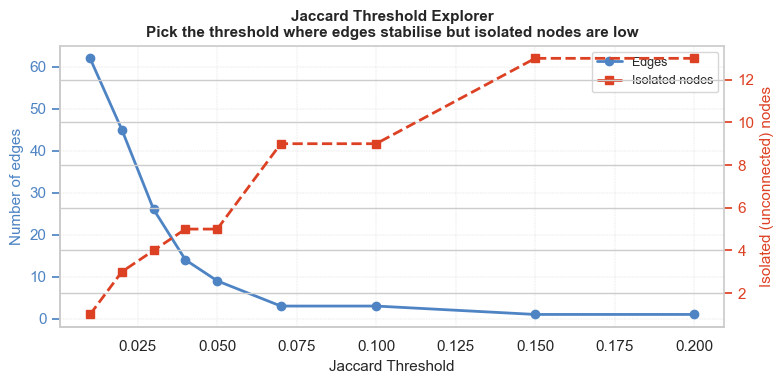

✅ Pick the threshold at the 'elbow' — where the edge count drops steeply
   and isolated nodes start to increase. Plug it into JACCARD_THRESH in C-4.


In [492]:
# In[C-4b]:
# ── Threshold explorer — run this to pick the right JACCARD_THRESH ────────────
# Shows how many edges and connected components you get at each threshold level.

thresholds = [0.01, 0.02, 0.03, 0.04, 0.05, 0.07, 0.10, 0.15, 0.20]
rows = []

for t in thresholds:
    G_tmp = nx.Graph()
    G_tmp.add_nodes_from(tf_keys)
    for i, a in enumerate(tf_keys):
        for j, b in enumerate(tf_keys):
            if j <= i:
                continue
            if jaccard[i, j] >= t:
                G_tmp.add_edge(a, b, weight=jaccard[i, j])

    n_edges      = G_tmp.number_of_edges()
    n_components = nx.number_connected_components(G_tmp)
    n_isolated   = sum(1 for n in G_tmp.nodes() if G_tmp.degree(n) == 0)

    rows.append({
        "Threshold":   t,
        "Edges":       n_edges,
        "Components":  n_components,
        "Isolated_nodes": n_isolated,
    })

thresh_df = pd.DataFrame(rows)
print(thresh_df.to_string(index=False))

# ── Quick elbow plot ──────────────────────────────────────────────────────────
fig, ax1 = plt.subplots(figsize=(8, 4))
ax2 = ax1.twinx()

ax1.plot(thresh_df["Threshold"], thresh_df["Edges"],
         color="#4E84C4", lw=2, marker="o", label="Edges")
ax2.plot(thresh_df["Threshold"], thresh_df["Isolated_nodes"],
         color="#DD4124", lw=2, marker="s", ls="--", label="Isolated nodes")

ax1.set_xlabel("Jaccard Threshold", fontsize=11)
ax1.set_ylabel("Number of edges",         fontsize=11, color="#4E84C4")
ax2.set_ylabel("Isolated (unconnected) nodes", fontsize=11, color="#DD4124")
ax1.tick_params(axis="y", colors="#4E84C4")
ax2.tick_params(axis="y", colors="#DD4124")

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, fontsize=9, loc="upper right")

ax1.set_title("Jaccard Threshold Explorer\n"
              "Pick the threshold where edges stabilise but isolated nodes are low",
              fontsize=11, fontweight="bold")

for spine in ["top", "right"]:
    ax1.spines[spine].set_visible(False)
ax1.grid(True, linestyle="--", linewidth=0.35, color="#cccccc", alpha=0.7)
ax1.set_axisbelow(True)
plt.tight_layout()
plt.savefig(f"{FURTHER}/Jaccard_Threshold_Explorer.png", dpi=150, bbox_inches="tight")
plt.show()
print("✅ Pick the threshold at the 'elbow' — where the edge count drops steeply")
print("   and isolated nodes start to increase. Plug it into JACCARD_THRESH in C-4.")

In [493]:
# In[C-4 REVISED]:
# ── Build NetworkX graph ───────────────────────────────────────────────────────

JACCARD_THRESH = 0.05   # tune with C-4b explorer

G = nx.Graph()
for sig in tf_keys:
    G.add_node(sig)

edge_rows = []
for i, a in enumerate(tf_keys):
    for j, b in enumerate(tf_keys):
        if j <= i:
            continue
        w = jaccard[i, j]
        if w >= JACCARD_THRESH:
            G.add_edge(a, b, weight=w)
            edge_rows.append({
                "TF_A":    sig_to_label[a],
                "CT_A":    sig_to_ct[a],
                "TF_B":    sig_to_label[b],
                "CT_B":    sig_to_ct[b],
                "Jaccard": round(w, 4),
            })

edge_df = pd.DataFrame(edge_rows).sort_values("Jaccard", ascending=False)
edge_df.to_csv(f"{FURTHER}/TF_CoRegulatory_EdgeList.csv", index=False)
print(f"✅ Network: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges (Jaccard ≥ {JACCARD_THRESH})")
print(edge_df.head(10).to_string(index=False))

✅ Network: 15 nodes, 9 edges (Jaccard ≥ 0.05)
  TF_A                                  CT_A   TF_B                             CT_B  Jaccard
 Pparg                   Layer 5a IT neurons   Cux2             Layer 2/3 IT neurons   0.2448
Bcl11b                   Layer 5b PT neurons  Esrrg Layer 6a corticothalamic neurons   0.1494
 Celf5 Deep-layer extratelencephalic neurons  Celf4                VIP+ interneurons   0.1278
 Satb2                  Layer 5/6 IT neurons  Pparg              Layer 5a IT neurons   0.0676
  Rora       Oligodendrocyte precursor cells  Zmat4          Layer 4 sensory neurons   0.0638
 Satb2                  Layer 5/6 IT neurons  Zmat4          Layer 4 sensory neurons   0.0601
 Celf5 Deep-layer extratelencephalic neurons Zfp831                 Layer 6b neurons   0.0601
Zfp831                      Layer 6b neurons  Celf4                VIP+ interneurons   0.0601
 Zmat4               Layer 4 sensory neurons  Celf4                VIP+ interneurons   0.0526


In [513]:
# In[C-5 REVISED]:
# ── Draw the network — curved edges ──────────────────────────────────────────

import matplotlib.lines as mlines
import matplotlib.patches as mpatches

pos     = nx.spring_layout(G, seed=42, k=3.0)   # k slightly higher = more spread
weights = [G[u][v]["weight"] for u, v in G.edges()]
max_w   = max(weights) if weights else 1

node_colors_net = [
    atac_colors_clean.get(sig_to_ct.get(node, "").strip(), "#aaaaaa")
    for node in G.nodes()
]
node_sizes_net = [300 + 20 * len(tf_gene_sets.get(node, [])) for node in G.nodes()]

fig, ax = plt.subplots(figsize=(14, 12))
ax.set_aspect("equal")

# ── Draw curved edges manually using FancyArrowPatch ─────────────────────────
# rad > 0 = curves arc one way; alternate sign per edge pair to avoid overlap
# In[C-5 REVISED — edge drawing block only]:
# ── Draw curved edges with iterative arc-clearance ────────────────────────────

import numpy as np
import matplotlib.patches as mpatches
from matplotlib.bezier import BezierSegment

node_list = list(G.nodes())
NODE_RADIUS = 0.06   # approximate node radius in layout units — increase if nodes are larger

def arc_clearance(x0, y0, x1, y1, rad, pos, u, v, n_samples=40):
    """
    Sample n_samples points along the Bézier arc defined by FancyArrowPatch
    arc3 style, and return the minimum distance to any non-endpoint node.
    """
    # arc3 control point: perpendicular offset at midpoint
    mid_x = (x0 + x1) / 2
    mid_y = (y0 + y1) / 2
    dx = x1 - x0
    dy = y1 - y0
    # Perpendicular unit vector
    length = np.hypot(dx, dy) + 1e-9
    perp_x = -dy / length
    perp_y =  dx / length
    # Control point offset = rad * chord_length * perpendicular
    ctrl_x = mid_x + rad * length * perp_x
    ctrl_y = mid_y + rad * length * perp_y

    # Sample quadratic Bézier: P(t) = (1-t)²P0 + 2(1-t)t*Ctrl + t²P1
    ts = np.linspace(0, 1, n_samples)
    bx = (1-ts)**2 * x0 + 2*(1-ts)*ts * ctrl_x + ts**2 * x1
    by = (1-ts)**2 * y0 + 2*(1-ts)*ts * ctrl_y + ts**2 * y1

    min_dist = np.inf
    for node, (ox, oy) in pos.items():
        if node in (u, v):
            continue
        dists = np.hypot(bx - ox, by - oy)
        min_dist = min(min_dist, dists.min())

    return min_dist


for idx, (u, v, data) in enumerate(G.edges(data=True)):
    w     = data["weight"]
    lw    = 1.0 + 4.0 * (w / max_w)
    alpha = 0.3 + 0.4 * (w / max_w)

    x0, y0 = pos[u]
    x1, y1 = pos[v]

    # Start with a small base radius; alternate direction by edge index
    sign     = 1 if idx % 2 == 0 else -1
    rad      = 0.15 * sign
    step     = 0.10          # increment per iteration
    max_rad  = 1.20          # cap to prevent absurd arcs
    max_iter = 12

    for _ in range(max_iter):
        clearance = arc_clearance(x0, y0, x1, y1, rad, pos, u, v)
        if clearance >= NODE_RADIUS or abs(rad) >= max_rad:
            break
        rad += step * sign   # increase arc in same direction

    arrow = mpatches.FancyArrowPatch(
        (x0, y0), (x1, y1),
        connectionstyle=f"arc3,rad={rad:.3f}",
        arrowstyle="-",
        color="#888888",
        lw=lw,
        alpha=alpha,
        zorder=1,
    )
    ax.add_patch(arrow)

# ── Draw nodes on top of edges ────────────────────────────────────────────────
for node, (x, y) in pos.items():
    color  = atac_colors_clean.get(sig_to_ct.get(node, "").strip(), "#aaaaaa")
    size   = node_sizes_net[list(G.nodes()).index(node)]
    radius = (size ** 0.5) * 0.002   # ← was 0.0012, increase this to make nodes bigger

    circle = plt.Circle(
        (x, y), radius,
        color=color, zorder=3,
        linewidth=0.5, edgecolor="white"
    )
    ax.add_patch(circle)

# ── TF name labels ────────────────────────────────────────────────────────────
for node, (x, y) in pos.items():
    ax.text(
        x, y, sig_to_label[node],
        fontsize=16,            # ← was 13, increase for bigger labels
        fontweight="bold",
        ha="center", va="center",
        color="#111111", zorder=4,
    )

# ── Auto-scale axes to fit all nodes ─────────────────────────────────────────
xs = [p[0] for p in pos.values()]
ys = [p[1] for p in pos.values()]
pad = 0.25   # ← was 0.15
ax.set_xlim(min(xs) - pad, max(xs) + pad)
ax.set_ylim(min(ys) - pad, max(ys) + pad)

# ── Legend ────────────────────────────────────────────────────────────────────
net_celltypes = set(sig_to_ct.get(n, "") for n in G.nodes())
legend_els = [
    mlines.Line2D([], [], marker="o", linestyle="None",
                  color=atac_colors_clean[ct.strip()], markersize=9, label=ct)
    for ct in atac_new_order if ct.strip() in net_celltypes
]
ax.legend(
    handles=legend_els,
    loc="upper left",
    bbox_to_anchor=(1.01, 1.0),
    borderaxespad=0,
    fontsize=12,
    framealpha=0.85,
    edgecolor="#cccccc",
    title="Cell type",
    title_fontsize=14,
)

ax.set_title(
    f"TF Co-Regulatory Network  (Jaccard ≥ {JACCARD_THRESH})\n"
    "Node size = # target genes  |  Edge width = Jaccard similarity  |  Color = cell type",
    fontsize=11, fontweight="bold", pad=14
)
ax.axis("off")
plt.tight_layout()
plt.savefig(f"{FURTHER}/TF_CoReg_Network.pdf", bbox_inches="tight")
plt.savefig(f"{FURTHER}/TF_CoReg_Network.png", dpi=200, bbox_inches="tight")
plt.show()
print("✅ Network plot saved")

2026-05-07 00:49:03,502 fontTools.subset INFO     maxp pruned
2026-05-07 00:49:03,502 fontTools.subset INFO     LTSH dropped
2026-05-07 00:49:03,502 fontTools.subset INFO     cmap pruned
2026-05-07 00:49:03,502 fontTools.subset INFO     kern dropped
2026-05-07 00:49:03,504 fontTools.subset INFO     post pruned
2026-05-07 00:49:03,504 fontTools.subset INFO     PCLT dropped
2026-05-07 00:49:03,504 fontTools.subset INFO     JSTF dropped
2026-05-07 00:49:03,504 fontTools.subset INFO     DSIG dropped
2026-05-07 00:49:03,506 fontTools.subset INFO     GPOS pruned
2026-05-07 00:49:03,507 fontTools.subset INFO     GSUB pruned
2026-05-07 00:49:03,509 fontTools.subset INFO     glyf pruned
2026-05-07 00:49:03,510 fontTools.subset INFO     Added gid0 to subset
2026-05-07 00:49:03,510 fontTools.subset INFO     Added first four glyphs to subset
2026-05-07 00:49:03,510 fontTools.subset INFO     Closing glyph list over 'GSUB': 55 glyphs before
2026-05-07 00:49:03,510 fontTools.subset INFO     Glyph nam

/var/folders/c5/9gnt7c7x7x59ygrp90w3n60r0000gn/T/ipykernel_69539/31920906.py:103: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.


✅ Network plot saved


In [ ]:
##### For G #####

In [526]:
# In[C-5 REVISED]:
# ── Draw the network — curved edges ──────────────────────────────────────────

import matplotlib.lines as mlines
import matplotlib.patches as mpatches

# ── After summary_df is built ─────────────────────────────────────────────────
tf_total_targets = dict(zip(summary_df["TF"], summary_df["Total_Targets"]))

# Map sig → Total_Targets via sig_to_ct and tf_mapping_clean
sig_to_ntargets = {}
for sig, tf_name in tf_mapping_clean.items():
    sig_to_ntargets[sig] = tf_total_targets.get(tf_name, 0)

## New up there ###

pos     = nx.spring_layout(G, seed=42, k=3.0)   # k slightly higher = more spread
weights = [G[u][v]["weight"] for u, v in G.edges()]
max_w   = max(weights) if weights else 1

node_colors_net = [
    atac_colors_clean.get(sig_to_ct.get(node, "").strip(), "#aaaaaa")
    for node in G.nodes()
]

#node_sizes_net = [300 + 20 * len(tf_gene_sets.get(node, [])) for node in G.nodes()]
sig_ntargets_list = [sig_to_ntargets.get(node, 0) for node in G.nodes()]
min_t = min(sig_ntargets_list) if sig_ntargets_list else 1
max_t = max(sig_ntargets_list) if sig_ntargets_list else 1

fig, ax = plt.subplots(figsize=(14, 12))
ax.set_aspect("equal")

# ── Draw curved edges manually using FancyArrowPatch ─────────────────────────
# rad > 0 = curves arc one way; alternate sign per edge pair to avoid overlap
# In[C-5 REVISED — edge drawing block only]:
# ── Draw curved edges with iterative arc-clearance ────────────────────────────

import numpy as np
import matplotlib.patches as mpatches
from matplotlib.bezier import BezierSegment

node_list = list(G.nodes())
NODE_RADIUS = 0.06   # approximate node radius in layout units — increase if nodes are larger

def arc_clearance(x0, y0, x1, y1, rad, pos, u, v, n_samples=40):
    """
    Sample n_samples points along the Bézier arc defined by FancyArrowPatch
    arc3 style, and return the minimum distance to any non-endpoint node.
    """
    # arc3 control point: perpendicular offset at midpoint
    mid_x = (x0 + x1) / 2
    mid_y = (y0 + y1) / 2
    dx = x1 - x0
    dy = y1 - y0
    # Perpendicular unit vector
    length = np.hypot(dx, dy) + 1e-9
    perp_x = -dy / length
    perp_y =  dx / length
    # Control point offset = rad * chord_length * perpendicular
    ctrl_x = mid_x + rad * length * perp_x
    ctrl_y = mid_y + rad * length * perp_y

    # Sample quadratic Bézier: P(t) = (1-t)²P0 + 2(1-t)t*Ctrl + t²P1
    ts = np.linspace(0, 1, n_samples)
    bx = (1-ts)**2 * x0 + 2*(1-ts)*ts * ctrl_x + ts**2 * x1
    by = (1-ts)**2 * y0 + 2*(1-ts)*ts * ctrl_y + ts**2 * y1

    min_dist = np.inf
    for node, (ox, oy) in pos.items():
        if node in (u, v):
            continue
        dists = np.hypot(bx - ox, by - oy)
        min_dist = min(min_dist, dists.min())

    return min_dist


for idx, (u, v, data) in enumerate(G.edges(data=True)):
    w     = data["weight"]
    lw    = 1.0 + 4.0 * (w / max_w)
    alpha = 0.3 + 0.4 * (w / max_w)

    x0, y0 = pos[u]
    x1, y1 = pos[v]

    # Start with a small base radius; alternate direction by edge index
    sign     = 1 if idx % 2 == 0 else -1
    rad      = 0.15 * sign
    step     = 0.10          # increment per iteration
    max_rad  = 1.20          # cap to prevent absurd arcs
    max_iter = 12

    for _ in range(max_iter):
        clearance = arc_clearance(x0, y0, x1, y1, rad, pos, u, v)
        if clearance >= NODE_RADIUS or abs(rad) >= max_rad:
            break
        rad += step * sign   # increase arc in same direction

    arrow = mpatches.FancyArrowPatch(
        (x0, y0), (x1, y1),
        connectionstyle=f"arc3,rad={rad:.3f}",
        arrowstyle="-",
        color="#888888",
        lw=lw,
        alpha=alpha,
        zorder=1,
    )
    ax.add_patch(arrow)

# ── Draw nodes on top of edges ────────────────────────────────────────────────
# ── Compute node radii with sqrt scaling ─────────────────────────────────────
sig_ntargets_list = [sig_to_ntargets.get(node, 0) for node in G.nodes()]
min_t = min(sig_ntargets_list)
max_t = max(sig_ntargets_list)

r_min, r_max = 0.03, 0.07   # tighter max keeps large nodes from dominating

for node, (x, y) in pos.items():
    n_targets = sig_to_ntargets.get(node, 0)

    # sqrt-normalize: compress large values, stretch small ones
    t_norm = (np.sqrt(n_targets) - np.sqrt(min_t)) / (np.sqrt(max_t) - np.sqrt(min_t) + 1e-9)
    radius = r_min + t_norm * (r_max - r_min)

    color  = atac_colors_clean.get(sig_to_ct.get(node, "").strip(), "#aaaaaa")
    circle = plt.Circle((x, y), radius, color=color, zorder=3,
                         linewidth=0.5, edgecolor="white")
    ax.add_patch(circle)

# ── TF name labels — offset outward from graph center ────────────────────────
xs_vals = np.array([pos[n][0] for n in G.nodes()])
ys_vals = np.array([pos[n][1] for n in G.nodes()])
cx, cy  = xs_vals.mean(), ys_vals.mean()   # graph centroid

LABEL_OFFSET = 0.05   # distance from node edge to label — increase if still overlapping

for node, (x, y) in pos.items():
    # Unit vector pointing away from centroid
    dx, dy = x - cx, y - cy
    dist   = np.hypot(dx, dy) + 1e-9
    ux, uy = dx / dist, dy / dist

    # Radius of this specific node
    n_targets = sig_to_ntargets.get(node, 0)
    t_norm    = (n_targets - min_t) / (max_t - min_t + 1e-9)
    radius    = r_min + t_norm * (r_max - r_min)

    # Label position = node center + node radius + offset, in outward direction
    lx = x + (radius + LABEL_OFFSET) * ux
    ly = y + (radius + LABEL_OFFSET) * uy

    # Align text anchor based on which side of the graph the node is on
    ha = "left" if ux >= 0 else "right"
    va = "bottom" if uy >= 0 else "top"

    ax.text(
        lx, ly, sig_to_label[node],
        fontsize=30, #fontweight="bold",
        ha=ha, va=va,
        color="#111111", zorder=5,
        bbox=dict(            # subtle white halo so text is readable over edges
            boxstyle="round,pad=0.15",
            fc="white", ec="none", alpha=0.7,
        )
    )

# ── Auto-scale axes to fit all nodes ─────────────────────────────────────────
xs = [p[0] for p in pos.values()]
ys = [p[1] for p in pos.values()]
pad = 0.25   # ← was 0.15
ax.set_xlim(min(xs) - pad, max(xs) + pad)
ax.set_ylim(min(ys) - pad, max(ys) + pad)

# # ── Legend ────────────────────────────────────────────────────────────────────
# net_celltypes = set(sig_to_ct.get(n, "") for n in G.nodes())
# legend_els = [
#     mlines.Line2D([], [], marker="o", linestyle="None",
#                   color=atac_colors_clean[ct.strip()], markersize=9, label=ct)
#     for ct in atac_new_order if ct.strip() in net_celltypes
# ]
# ax.legend(
#     handles=legend_els,
#     loc="upper left",
#     bbox_to_anchor=(1.01, 1.0),
#     borderaxespad=0,
#     fontsize=12,
#     framealpha=0.85,
#     edgecolor="#cccccc",
#     title="Cell type",
#     title_fontsize=14,
# )

ax.set_title(
    f"TF Co-Regulatory Network  (Jaccard ≥ {JACCARD_THRESH})\\n"
    "Node size = # target genes  |  Edge width = Jaccard similarity  |  Color = cell type",
    fontsize=11, fontweight="bold", pad=14
)
ax.axis("off")
plt.tight_layout()
plt.savefig(f"{FURTHER}/TF_CoReg_Network.pdf", bbox_inches="tight")
plt.savefig(f"{FURTHER}/TF_CoReg_Network.png", dpi=200, bbox_inches="tight")
plt.show()
print("✅ Network plot saved")

2026-05-07 01:04:31,527 fontTools.subset INFO     maxp pruned
2026-05-07 01:04:31,527 fontTools.subset INFO     LTSH dropped
2026-05-07 01:04:31,528 fontTools.subset INFO     cmap pruned
2026-05-07 01:04:31,528 fontTools.subset INFO     kern dropped
2026-05-07 01:04:31,529 fontTools.subset INFO     post pruned
2026-05-07 01:04:31,530 fontTools.subset INFO     PCLT dropped
2026-05-07 01:04:31,530 fontTools.subset INFO     JSTF dropped
2026-05-07 01:04:31,530 fontTools.subset INFO     DSIG dropped
2026-05-07 01:04:31,531 fontTools.subset INFO     GPOS pruned
2026-05-07 01:04:31,533 fontTools.subset INFO     GSUB pruned
2026-05-07 01:04:31,534 fontTools.subset INFO     glyf pruned
2026-05-07 01:04:31,536 fontTools.subset INFO     Added gid0 to subset
2026-05-07 01:04:31,536 fontTools.subset INFO     Added first four glyphs to subset
2026-05-07 01:04:31,536 fontTools.subset INFO     Closing glyph list over 'GSUB': 42 glyphs before
2026-05-07 01:04:31,536 fontTools.subset INFO     Glyph nam

/var/folders/c5/9gnt7c7x7x59ygrp90w3n60r0000gn/T/ipykernel_69539/1801171354.py:127: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.


✅ Network plot saved


2026-05-07 00:20:06,119 fontTools.subset INFO     maxp pruned
2026-05-07 00:20:06,119 fontTools.subset INFO     LTSH dropped
2026-05-07 00:20:06,119 fontTools.subset INFO     cmap pruned
2026-05-07 00:20:06,119 fontTools.subset INFO     kern dropped
2026-05-07 00:20:06,121 fontTools.subset INFO     post pruned
2026-05-07 00:20:06,121 fontTools.subset INFO     PCLT dropped
2026-05-07 00:20:06,121 fontTools.subset INFO     JSTF dropped
2026-05-07 00:20:06,121 fontTools.subset INFO     DSIG dropped
2026-05-07 00:20:06,123 fontTools.subset INFO     GPOS pruned
2026-05-07 00:20:06,124 fontTools.subset INFO     GSUB pruned
2026-05-07 00:20:06,126 fontTools.subset INFO     glyf pruned
2026-05-07 00:20:06,128 fontTools.subset INFO     Added gid0 to subset
2026-05-07 00:20:06,128 fontTools.subset INFO     Added first four glyphs to subset
2026-05-07 00:20:06,128 fontTools.subset INFO     Closing glyph list over 'GSUB': 47 glyphs before
2026-05-07 00:20:06,128 fontTools.subset INFO     Glyph nam

/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


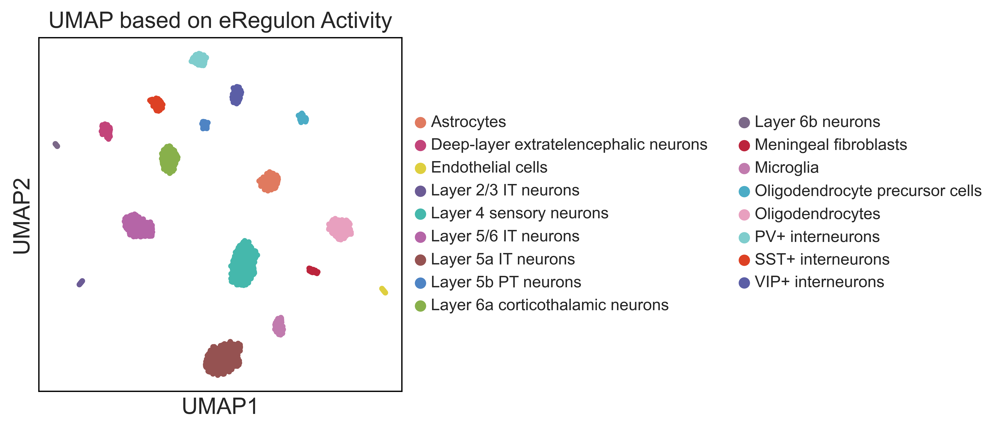

In [508]:
import scanpy as sc

# Set publication-quality output globally
sc.settings.set_figure_params(dpi=300, facecolor='white')
sc.settings.file_format_figs = 'pdf'  # saves as PDF automatically

palette = {ct: atac_colors_clean.get(ct.strip(), "#aaaaaa") 
           for ct in auc_ad.obs['cell_type'].unique()}

sc.pl.umap(
    auc_ad,
    color           = 'cell_type',
    palette         = palette,
    title           = 'UMAP based on eRegulon Activity',
    legend_loc      = 'right margin',
    legend_fontsize = 10,
    frameon         = True,
    save            = '_eregulon_celltype_colored',  # no extension needed — scanpy adds .pdf
)

In [ ]:
##################################

In [ ]:
##################################

In [ ]:
##################################

In [ ]:
##################################

In [388]:
# # In[D-3 REVISED — Biology-informed pseudotime, no new packages]:
# # ── Pseudotime from canonical cortical inside-out birth order ─────────────────
# #
# # DPT fails due to disconnected components (too few AUC features to bridge
# # all cell types in a single graph). Instead we assign pseudotime directly
# # from known developmental order — this is MORE biologically valid here
# # since inside-out cortical neurogenesis is well established.
# #
# # Strategy:
# #   1. Assign each cell type a coarse rank based on birth order (L6b=0, L2/3=1)
# #   2. Within each cell type, use PC1 of the AUC matrix for fine ordering
# #   3. Combine: pseudotime = coarse_rank + rescaled_PC1_within_type

# # ── Canonical birth order (earliest = 0.0, latest = 1.0) ─────────────────────
# LAYER_ORDER = [
#     "Layer 6b neurons",
#     "Layer 6a corticothalamic neurons",
#     "Deep-layer extratelencephalic neurons",
#     "Corticospinal neurons (Type I)",
#     "Corticospinal neurons (Type II)",
#     "Layer 5b PT neurons",
#     "Layer 5a IT neurons",
#     "Layer 5/6 IT neurons",
#     "Layer 4 sensory neurons",
#     "Layer 2/3 IT neurons",
# ]

# # Non-neuronal cell types are excluded from pseudotime (no developmental axis)
# EXCLUDE_FROM_PST = {
#     "PV+ interneurons", "SST+ interneurons", "VIP+ interneurons",
#     "Astrocytes", "Oligodendrocyte precursor cells", "Oligodendrocytes",
#     "Perineuronal oligodendrocytes", "Myelinating oligodendrocytes",
#     "Microglia", "Endothelial cells", "Leptomeningeal cells", "Meningeal fibroblasts",
# }

# n_types    = len(LAYER_ORDER)
# pst_values = np.full(len(auc_ad), np.nan)

# pc1_all = auc_ad.obsm["X_pca"][:, 0]  # global PC1 for within-type fine ordering

# for rank, ct in enumerate(LAYER_ORDER):
#     coarse = rank / (n_types - 1)   # 0.0 for L6b, 1.0 for L2/3

#     idx = np.where(auc_ad.obs["cell_type"].values == ct)[0]
#     if len(idx) == 0:
#         print(f"   ⚠️  '{ct}' not found in metadata — skipping")
#         continue

#     # PC1 values for this cell type — rescale to [0, 1]
#     pc1_sub = pc1_all[idx]
#     pc1_range = pc1_sub.max() - pc1_sub.min()
#     if pc1_range > 1e-9:
#         pc1_rescaled = (pc1_sub - pc1_sub.min()) / pc1_range
#     else:
#         pc1_rescaled = np.zeros(len(idx))

#     # Fine pseudotime within this type spans 0.4 of the coarse step width
#     step_width  = 1.0 / (n_types - 1)
#     fine_offset = pc1_rescaled * step_width * 0.4   # 40% of one step

#     pst_values[idx] = coarse + fine_offset

# auc_ad.obs["dpt_pseudotime"] = pst_values

# # Report
# print("✅ Biology-informed pseudotime assigned")
# print("\n   Mean pseudotime per cell type:")
# summary = (
#     auc_ad.obs[~auc_ad.obs["cell_type"].isin(EXCLUDE_FROM_PST)]
#     .groupby("cell_type")["dpt_pseudotime"]
#     .mean()
#     .reindex(LAYER_ORDER)
#     .dropna()
# )
# print(summary.to_string())

# n_nan = auc_ad.obs["dpt_pseudotime"].isna().sum()
# print(f"\n   {n_nan} cells have NaN (non-neuronal cell types — excluded by design)")

# # ── UMAP ──────────────────────────────────────────────────────────────────────
# sc.pl.umap(
#     auc_ad,
#     color=["dpt_pseudotime", "cell_type"],
#     color_map="viridis",
#     title=["Developmental Pseudotime (inside-out birth order)", "Cell Type"],
#     na_color="#dddddd",
#     save="_eRegulon_Pseudotime.pdf",
#     show=False,
# )
# auc_ad.obs[["cell_type", "dpt_pseudotime"]].to_csv(
#     f"{FURTHER}/Pseudotime_perCell.csv"
# )
# print("✅ Pseudotime saved")

   ⚠️  'Corticospinal neurons (Type I)' not found in metadata — skipping
   ⚠️  'Corticospinal neurons (Type II)' not found in metadata — skipping
✅ Biology-informed pseudotime assigned

   Mean pseudotime per cell type:
cell_type
Layer 6b neurons                         0.025026
Layer 6a corticothalamic neurons         0.133842
Deep-layer extratelencephalic neurons    0.245987
Layer 5b PT neurons                      0.584740
Layer 5a IT neurons                      0.688618
Layer 5/6 IT neurons                     0.799546
Layer 4 sensory neurons                  0.909978
Layer 2/3 IT neurons                     1.029090

   870 cells have NaN (non-neuronal cell types — excluded by design)
2026-05-06 11:01:54,333 fontTools.subset INFO     maxp pruned
2026-05-06 11:01:54,333 fontTools.subset INFO     LTSH dropped
2026-05-06 11:01:54,333 fontTools.subset INFO     cmap pruned
2026-05-06 11:01:54,333 fontTools.subset INFO     kern dropped
2026-05-06 11:01:54,335 fontTools.subset INFO    

/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


✅ Pseudotime saved


In [ ]:
# # In[D-4]:
# # ── TF activity along pseudotime ──────────────────────────────────────────────

# NON_NEURONAL_CT = {
#     "Astrocytes", "Oligodendrocyte precursor cells", "Oligodendrocytes",
#     "Perineuronal oligodendrocytes", "Myelinating oligodendrocytes",
#     "Microglia", "Endothelial cells", "Leptomeningeal cells",
#     "Meningeal fibroblasts", "PV+ interneurons", "SST+ interneurons",
#     "VIP+ interneurons",
# }
# EXCLUDE_TF_NAMES = {"Gm9049", "Zfp202"}

# if "dpt_pseudotime" not in auc_ad.obs.columns:
#     print("⚠️  Run D-3 first.")
# else:
#     # ── Filter valid (neuronal) cells ─────────────────────────────────────────
#     valid_mask = auc_ad.obs["dpt_pseudotime"].notna()
#     valid_obs  = auc_ad.obs[valid_mask].copy()
#     valid_X    = pd.DataFrame(
#         auc_ad.X[valid_mask.values],
#         index=valid_obs.index,
#         columns=auc_ad.var_names,
#     )

#     # ── Filter signatures ─────────────────────────────────────────────────────
#     tf_cols = [
#         c for c in auc_df.columns
#         if c in auc_ad.var_names
#         and c in final_plot_mapping
#         and final_plot_mapping[c].split(" (")[0].strip() not in EXCLUDE_TF_NAMES
#     ]
#     print(f"   {len(tf_cols)} TF signatures retained")
#     for c in tf_cols:
#         print(f"     {final_plot_mapping[c].split(' (')[0]:20s}  ←  {sig_to_ct.get(c, '?')}")

#     # ── Bin by cell type ordered by LAYER_ORDER ───────────────────────────────
#     valid_obs["pst_bin_ct"] = pd.Categorical(
#         valid_obs["cell_type"], categories=LAYER_ORDER, ordered=True
#     )
#     bin_means_raw = (
#         valid_obs[["pst_bin_ct"]]
#         .join(valid_X[tf_cols])
#         .groupby("pst_bin_ct", observed=True)
#         .mean()
#     )

#     # ── Build color + display label maps (while columns = original sig names) ─
#     col_to_display = {}
#     col_to_color   = {}
#     for sig in bin_means_raw.columns:
#         tf_name = final_plot_mapping[sig].split(" (")[0].strip()
#         ct      = sig_to_ct.get(sig, "")
#         col_to_display[sig] = f"{tf_name} ({ct})" if ct else tf_name
#         col_to_color[sig]   = atac_colors_clean.get(ct.strip(), "#888888")

#     # ── x axis and labels ─────────────────────────────────────────────────────
#     present_layers = list(bin_means_raw.index)
#     x = np.arange(len(present_layers))
#     short_labels = [
#         ct.replace(" neurons", "")
#           .replace(" cells", "")
#           .replace("corticothalamic", "CT")
#           .replace("extratelencephalic", "ET")
#           .replace("corticospinal", "CS")
#         for ct in present_layers
#     ]

#     # ── Plot ──────────────────────────────────────────────────────────────────
#     fig, ax = plt.subplots(figsize=(13, 5))

#     seen_labels    = {}
#     legend_handles = []

#     for sig in bin_means_raw.columns:
#         y       = bin_means_raw[sig].to_numpy(dtype=float)
#         display = col_to_display[sig]
#         color   = col_to_color[sig]
#         lines   = ax.plot(
#             x, y, lw=2.0, alpha=0.88, color=color,
#             marker="o", markersize=5,
#             markerfacecolor=color, markeredgewidth=0,
#         )
#         if display not in seen_labels:
#             seen_labels[display] = lines[0]
#             legend_handles.append((display, lines[0]))

#     ax.set_xticks(x)
#     ax.set_xticklabels(short_labels, rotation=40, ha="right", fontsize=8)
#     ax.annotate(
#         "← Earlier born (L6b)                                 Later born (L2/3) →",
#         xy=(0.5, -0.32), xycoords="axes fraction",
#         ha="center", fontsize=8.5, color="#555555", annotation_clip=False,
#     )
#     ax.set_ylabel("Mean AUC Score (scaled)", fontsize=11, labelpad=8)
#     ax.set_title(
#         "TF eRegulon Activity Along Cortical Developmental Order\n"
#         "(Inside-out birth order: L6b → L2/3)",
#         fontsize=11, fontweight="bold", pad=12,
#     )
#     for spine in ["bottom", "left"]:
#         ax.spines[spine].set_color("black")
#         ax.spines[spine].set_linewidth(1.1)
#     ax.spines["top"].set_visible(False)
#     ax.spines["right"].set_visible(False)
#     ax.tick_params(colors="black", labelsize=8.5, width=1.1)
#     ax.grid(True, linestyle="--", linewidth=0.35, color="#cccccc", alpha=0.7)
#     ax.set_axisbelow(True)
#     ax.legend(
#         handles=[h for _, h in legend_handles],
#         labels=[l for l, _ in legend_handles],
#         fontsize=8.5, loc="upper left",
#         bbox_to_anchor=(1.01, 1.0), borderaxespad=0,
#         framealpha=0.85, edgecolor="#cccccc",
#         title="TF  (cell type)", title_fontsize=9,
#     )
#     plt.tight_layout()
#     plt.savefig(f"{FURTHER}/TF_Activity_Pseudotime.pdf", bbox_inches="tight")
#     plt.savefig(f"{FURTHER}/TF_Activity_Pseudotime.png", dpi=200, bbox_inches="tight")
#     plt.show()
#     print("✅ Pseudotime activity plot saved")

In [6]:
import os
import re
import glob
import pandas as pd
import numpy as np
import gseapy as gp

# ------------------------------------------------------------
# Paths
# ------------------------------------------------------------
further_out = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis"
go_out = os.path.join(further_out, "GO_enrichment_celltype_specific")
os.makedirs(go_out, exist_ok=True)

# ------------------------------------------------------------
# Collapse RNA cell types + background
# ------------------------------------------------------------
collapse_map = {
    "Perineuronal oligodendrocytes": "Oligodendrocytes",
    "Newly formed oligodendrocytes": "Oligodendrocytes",
    "Myelinating oligodendrocytes": "Oligodendrocytes",
}

rna = adata.copy()
rna.obs["cell_type_collapsed"] = rna.obs["cell_type"].replace(collapse_map)

if hasattr(rna.X, "toarray"):
    expr = np.asarray(rna.X.toarray())
else:
    expr = np.asarray(rna.X)

gene_means = expr.mean(axis=0)
background_genes = sorted({
    g for g, m in zip(rna.var_names.tolist(), gene_means)
    if m > 0 and isinstance(g, str) and g.strip()
})
print(f"Background genes: {len(background_genes)}")

Background genes: 37678


In [588]:
# ------------------------------------------------------------
# Load TF target CSVs
# ------------------------------------------------------------
csv_files = sorted(glob.glob(os.path.join(further_out, "Targets_*_celltype_specific.csv")))
print(f"Found {len(csv_files)} cell-type-specific TF target CSVs")

def parse_filename(path):
    base = os.path.basename(path)
    base = base.replace("Targets_", "").replace("_celltype_specific.csv", "")
    parts = base.split("_")
    tf_name = parts[0]
    cell_type = " ".join(parts[1:])
    return tf_name, cell_type

# ------------------------------------------------------------
# GO enrichment loop — activators AND repressors separately
# ------------------------------------------------------------
all_results = []

regulation_sets = {
    "Activators": lambda df: df[df["rho"] > 0].sort_values("weighted", ascending=False),
    "Repressors": lambda df: df[df["rho"] < 0].sort_values("weighted", ascending=False),
}

for csv_path in csv_files:
    tf_name, ct_name = parse_filename(csv_path)
    df = pd.read_csv(csv_path)

    for reg_label, filter_fn in regulation_sets.items():
        subset = filter_fn(df)

        genes = [
            str(g).strip() for g in subset["target"].tolist()
            if pd.notna(g) and str(g).strip() in background_genes
        ]
        genes = list(dict.fromkeys(genes))  # deduplicate, preserve order

        if len(genes) < 5:
            print(f"  ⚠️  Skipping {tf_name} ({ct_name}) [{reg_label}]: only {len(genes)} genes")
            continue

        print(f"Running GO for {tf_name} ({ct_name}) [{reg_label}]: {len(genes)} genes")

        for ontology in ["GO_Biological_Process_2023", "GO_Molecular_Function_2023"]:
            try:
                enr = gp.enrichr(
                    gene_list=genes,
                    gene_sets=ontology,
                    background=background_genes,
                    organism="Mouse",
                    outdir=None,
                    cutoff=1.0,
                )
                res = enr.results.copy()
                if res.empty:
                    continue

                res["TF"] = tf_name
                res["Cell_Type"] = ct_name
                res["Regulation"] = reg_label
                res["Ontology"] = ontology
                res["Input_Genes"] = len(genes)

                all_results.append(res)

                safe_ct  = re.sub(r"[^A-Za-z0-9_]+", "_", ct_name)
                safe_tf  = re.sub(r"[^A-Za-z0-9_]+", "_", tf_name)
                safe_ont = ontology.replace(":", "_")
                out_csv  = os.path.join(
                    go_out,
                    f"GO_{safe_tf}_{safe_ct}_{reg_label}_{safe_ont}.csv"
                )
                res.to_csv(out_csv, index=False)

            except Exception as e:
                print(f"  Error on {tf_name} ({ct_name}) [{reg_label}] [{ontology}]: {e}")

# ------------------------------------------------------------
# Combine + save
# ------------------------------------------------------------
if all_results:
    go_df = pd.concat(all_results, ignore_index=True)

    go_df = go_df.rename(columns={
        "Term": "GO_Term",
        "Adjusted P-value": "FDR",
        "P-value": "PValue",
        "Odds Ratio": "OddsRatio",
        "Overlap": "Overlap",
        "Genes": "Overlapping_Genes",
    })

    out_all = os.path.join(go_out, "GO_enrichment_all_TFs_celltype_specific.csv")
    go_df.to_csv(out_all, index=False)

    sig_df = go_df[go_df["FDR"] < 0.05].sort_values(["TF", "Cell_Type", "Regulation", "FDR"])
    out_sig = os.path.join(go_out, "GO_enrichment_significant_FDR05.csv")
    sig_df.to_csv(out_sig, index=False)

    print(f"\n✅ All results:            {out_all}")
    print(f"✅ Significant (FDR<0.05): {out_sig}")
    print(f"\nTop hits:")
    print(sig_df[["TF", "Cell_Type", "Regulation", "Ontology", "GO_Term", "FDR"]].head(20).to_string(index=False))
else:
    print("No GO enrichment results were produced.")

Background genes: 37678
Found 17 cell-type-specific TF target CSVs
Running GO for Bcl11b (Layer 5b PT neurons) [Activators]: 992 genes
2026-05-08 13:34:27,222 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:34:28,127 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


2026-05-08 13:34:35,283 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:34:35,286 gseapy       INFO     Analysis name: , Enrichr Library: GO_Molecular_Function_2023
  ⚠️  Skipping Bcl11b (Layer 5b PT neurons) [Repressors]: only 0 genes
Running GO for Celf4 (VIP+ interneurons) [Activators]: 1303 genes
2026-05-08 13:34:39,235 gseapy       INFO     Connecting to Enrichr Server to get latest library names


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


2026-05-08 13:34:39,237 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023
2026-05-08 13:34:46,629 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:34:46,632 gseapy       INFO     Analysis name: , Enrichr Library: GO_Molecular_Function_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


  ⚠️  Skipping Celf4 (VIP+ interneurons) [Repressors]: only 0 genes
Running GO for Celf5 (Deep-layer extratelencephalic neurons) [Activators]: 509 genes
2026-05-08 13:34:51,165 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:34:51,168 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


2026-05-08 13:34:55,824 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:34:55,830 gseapy       INFO     Analysis name: , Enrichr Library: GO_Molecular_Function_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


  ⚠️  Skipping Celf5 (Deep-layer extratelencephalic neurons) [Repressors]: only 0 genes
Running GO for Cux2 (Layer 2 3 IT neurons) [Activators]: 847 genes
2026-05-08 13:34:59,091 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:34:59,094 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


2026-05-08 13:35:04,967 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:35:04,971 gseapy       INFO     Analysis name: , Enrichr Library: GO_Molecular_Function_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


  ⚠️  Skipping Cux2 (Layer 2 3 IT neurons) [Repressors]: only 0 genes
Running GO for Esrrg (Layer 6a corticothalamic neurons) [Activators]: 975 genes
2026-05-08 13:35:08,673 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:35:08,676 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


2026-05-08 13:35:14,784 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:35:14,788 gseapy       INFO     Analysis name: , Enrichr Library: GO_Molecular_Function_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


  ⚠️  Skipping Esrrg (Layer 6a corticothalamic neurons) [Repressors]: only 0 genes
Running GO for Fli1 (Endothelial cells) [Activators]: 393 genes
2026-05-08 13:35:18,673 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:35:18,676 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


2026-05-08 13:35:22,946 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:35:22,949 gseapy       INFO     Analysis name: , Enrichr Library: GO_Molecular_Function_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


  ⚠️  Skipping Fli1 (Endothelial cells) [Repressors]: only 0 genes
Running GO for Mef2c (SST+ interneurons) [Activators]: 826 genes
2026-05-08 13:35:25,933 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:35:25,936 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


2026-05-08 13:35:31,552 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:35:31,555 gseapy       INFO     Analysis name: , Enrichr Library: GO_Molecular_Function_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


  ⚠️  Skipping Mef2c (SST+ interneurons) [Repressors]: only 0 genes
Running GO for Msi2 (Astrocytes) [Activators]: 649 genes
2026-05-08 13:35:35,155 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:35:35,157 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


2026-05-08 13:35:40,119 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:35:40,122 gseapy       INFO     Analysis name: , Enrichr Library: GO_Molecular_Function_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


  ⚠️  Skipping Msi2 (Astrocytes) [Repressors]: only 0 genes
Running GO for Pparg (Layer 5a IT neurons) [Activators]: 662 genes
2026-05-08 13:35:43,635 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:35:43,637 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


2026-05-08 13:35:48,647 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:35:48,650 gseapy       INFO     Analysis name: , Enrichr Library: GO_Molecular_Function_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


  ⚠️  Skipping Pparg (Layer 5a IT neurons) [Repressors]: only 0 genes
Running GO for Rora (Oligodendrocyte precursor cells) [Activators]: 1134 genes
2026-05-08 13:35:52,187 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:35:52,189 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


2026-05-08 13:35:58,448 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:35:58,451 gseapy       INFO     Analysis name: , Enrichr Library: GO_Molecular_Function_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


  ⚠️  Skipping Rora (Oligodendrocyte precursor cells) [Repressors]: only 0 genes
Running GO for Satb2 (Layer 5 6 IT neurons) [Activators]: 761 genes
2026-05-08 13:36:02,741 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:36:02,743 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


2026-05-08 13:36:07,658 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:36:07,662 gseapy       INFO     Analysis name: , Enrichr Library: GO_Molecular_Function_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


  ⚠️  Skipping Satb2 (Layer 5 6 IT neurons) [Repressors]: only 0 genes
Running GO for Srrm3 (PV+ interneurons) [Activators]: 461 genes
2026-05-08 13:36:11,194 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:36:11,197 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


2026-05-08 13:36:15,210 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:36:15,213 gseapy       INFO     Analysis name: , Enrichr Library: GO_Molecular_Function_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


  ⚠️  Skipping Srrm3 (PV+ interneurons) [Repressors]: only 0 genes
Running GO for Zbtb20 (Meningeal fibroblasts) [Activators]: 505 genes
2026-05-08 13:36:18,311 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:36:18,314 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


2026-05-08 13:36:22,764 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:36:22,768 gseapy       INFO     Analysis name: , Enrichr Library: GO_Molecular_Function_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


  ⚠️  Skipping Zbtb20 (Meningeal fibroblasts) [Repressors]: only 0 genes
Running GO for Zfhx3 (Microglia) [Activators]: 492 genes
2026-05-08 13:36:26,168 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:36:26,170 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


2026-05-08 13:36:30,478 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:36:30,481 gseapy       INFO     Analysis name: , Enrichr Library: GO_Molecular_Function_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


  ⚠️  Skipping Zfhx3 (Microglia) [Repressors]: only 0 genes
Running GO for Zfp536 (Oligodendrocytes) [Activators]: 541 genes
2026-05-08 13:36:33,532 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:36:33,534 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


2026-05-08 13:36:38,097 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:36:38,100 gseapy       INFO     Analysis name: , Enrichr Library: GO_Molecular_Function_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


  ⚠️  Skipping Zfp536 (Oligodendrocytes) [Repressors]: only 0 genes
Running GO for Zfp831 (Layer 6b neurons) [Activators]: 860 genes
2026-05-08 13:36:41,313 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:36:41,315 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


2026-05-08 13:36:46,950 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:36:46,953 gseapy       INFO     Analysis name: , Enrichr Library: GO_Molecular_Function_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


  ⚠️  Skipping Zfp831 (Layer 6b neurons) [Repressors]: only 0 genes
Running GO for Zmat4 (Layer 4 sensory neurons) [Activators]: 1150 genes
2026-05-08 13:36:50,669 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:36:50,672 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


2026-05-08 13:36:57,043 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 13:36:57,046 gseapy       INFO     Analysis name: , Enrichr Library: GO_Molecular_Function_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


  ⚠️  Skipping Zmat4 (Layer 4 sensory neurons) [Repressors]: only 0 genes

✅ All results:            /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis/GO_enrichment_celltype_specific/GO_enrichment_all_TFs_celltype_specific.csv
✅ Significant (FDR<0.05): /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis/GO_enrichment_celltype_specific/GO_enrichment_significant_FDR05.csv

Top hits:
    TF           Cell_Type Regulation                   Ontology                                                                      GO_Term          FDR
Bcl11b Layer 5b PT neurons Activators GO_Molecular_Function_2023                           Ionotropic Glutamate Receptor Binding (GO:0035255) 3.246527e-03
Bcl11b Layer 5b PT neurons Activators GO_Molecular_Function_2023                                      Glutamate Receptor Binding (GO:0035254) 4.220135e-03
Bcl11b Layer 5b PT neurons Activators GO_Biological_Process

In [609]:
import os
import re
import pandas as pd
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np
from matplotlib.lines import Line2D

# ------------------------------------------------------------
# Paths
# ------------------------------------------------------------
further_out = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis"
go_out = os.path.join(further_out, "GO_enrichment_celltype_specific")

sig_path = os.path.join(go_out, "GO_enrichment_significant_FDR05.csv")
sig_df = pd.read_csv(sig_path)

print(f"Loaded {len(sig_df)} significant GO terms across {sig_df['TF'].nunique()} TFs")

# ------------------------------------------------------------
# Helpers
# ------------------------------------------------------------
def safe_filename(s):
    return re.sub(r"[^A-Za-z0-9_\-]+", "_", s)

def strip_go_id(label):
    return re.sub(r"\s*\(GO:\d+\)\s*$", "", label).strip()

def parse_overlap(val):
    try:
        parts = str(val).split("/")
        return int(parts[0]), int(parts[1])
    except Exception:
        return np.nan, np.nan

def round_to_nice(x):
    if x <= 1:
        return 1
    steps = [1, 2, 3, 5, 10, 15, 20, 25, 30, 40, 50, 75, 100,
             150, 200, 250, 300, 400, 500, 750, 1000]
    magnitude = 10 ** (len(str(int(x))) - 1)
    scaled = sorted(set([s * (magnitude // 10) if magnitude >= 10 else s for s in steps if s >= 1]))
    return min(scaled, key=lambda s: abs(s - x))

# ------------------------------------------------------------
# Preprocess
# ------------------------------------------------------------
overlap_parsed          = sig_df["Overlap"].apply(parse_overlap)
sig_df["HitCount"]      = overlap_parsed.apply(lambda x: x[0])
sig_df["TermSize"]      = overlap_parsed.apply(lambda x: x[1])
sig_df["InputGenes"]    = pd.to_numeric(sig_df["Input_Genes"], errors="coerce")
sig_df["OddsRatio"]     = pd.to_numeric(sig_df["OddsRatio"], errors="coerce")
sig_df["-log10FDR"]     = -np.log10(sig_df["FDR"].clip(lower=1e-300))
sig_df["GO_Term_clean"] = sig_df["GO_Term"].apply(strip_go_id)

try:
    bg_size = len(background_genes)
    print(f"Using background size from session: {bg_size}")
except NameError:
    bg_size = 20000
    print(f"background_genes not in session, using bg_size={bg_size}")

sig_df["FoldEnrich"] = (
    (sig_df["HitCount"] / sig_df["InputGenes"]) /
    (sig_df["TermSize"] / bg_size)
)

# Top 20 terms per group by FDR
sig_df = (
    sig_df
    .sort_values("FDR")
    .groupby(["TF", "Cell_Type", "Ontology"], group_keys=False)
    .head(20)
)

ontology_meta = {
    "GO_Biological_Process_2023": {"short": "BP"},
    "GO_Molecular_Function_2023": {"short": "MF"},
}

ROW_HEIGHT = 0.28
OVERHEAD   = 1.6
FIG_WIDTH  = 9.0
DOT_MIN_PT = 30
DOT_MAX_PT = 220
LABEL_PAD  = 6

# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------
groups = sig_df.groupby(["TF", "Cell_Type", "Ontology"])
print(f"Generating {len(groups)} dotplots...")

for (tf, ct, ont), sub_df in groups:
    # Sort descending: highest FE = index 0 → after invert_yaxis = top of plot
    sub_df = sub_df.sort_values("FoldEnrich", ascending=False).copy()
    sub_df = sub_df.drop_duplicates(subset="GO_Term_clean")

    terms       = sub_df["GO_Term_clean"].tolist()
    fe_vals     = sub_df["FoldEnrich"].tolist()
    fdr_vals    = sub_df["-log10FDR"].tolist()
    gene_counts = sub_df["HitCount"].tolist()

    n = len(terms)
    if n == 0:
        continue

    ont_short  = ontology_meta.get(ont, {}).get("short", ont)
    fig_height = n * ROW_HEIGHT + OVERHEAD

    fig, ax = plt.subplots(figsize=(FIG_WIDTH, fig_height))

    gc_arr      = np.array(gene_counts, dtype=float)
    gc_arr      = np.where(np.isnan(gc_arr) | (gc_arr <= 0), 1, gc_arr)
    plot_gc_max = gc_arr.max()
    dot_sizes   = (gc_arr / plot_gc_max) * (DOT_MAX_PT - DOT_MIN_PT) + DOT_MIN_PT

    fdr_arr = np.array(fdr_vals, dtype=float)
    fe_arr  = np.array(fe_vals,  dtype=float)

    scatter = ax.scatter(
        x=fe_arr,
        y=range(n),
        c=fdr_arr,
        s=dot_sizes,
        cmap="Reds",
        edgecolors="none",
        zorder=3,
        clip_on=False,
    )

    # Invert so index 0 (highest FE) appears at the top
    ax.invert_yaxis()
    ax.set_ylim(n - 0.5, -0.5)

    # Force exact tick positions and labels — prevents matplotlib suppressing ticks
    ax.yaxis.set_major_locator(mticker.FixedLocator(list(range(n))))
    ax.set_yticklabels(terms, fontsize=8, ha="right")
    ax.yaxis.set_tick_params(pad=LABEL_PAD, length=3, width=0.6, direction="out")

    ax.set_xlabel("Fold enrichment", fontsize=9, labelpad=6)
    ax.set_title(f"GO {ont_short} — {tf}  |  {ct}",
                 fontsize=10, fontweight="normal", pad=10)

    x_pad = fe_arr.max() * 0.06
    ax.set_xlim(left=0, right=fe_arr.max() + x_pad)

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_linewidth(0.8)
    ax.spines["bottom"].set_linewidth(0.8)

    ax.xaxis.set_tick_params(which="both", bottom=True, labelsize=8, width=0.8)
    ax.grid(False)
    ax.set_facecolor("white")

    fig.subplots_adjust(left=0.36, right=0.72, top=0.92, bottom=0.10)

    # Colorbar — no outline box
    cbar_ax = fig.add_axes([0.75, 0.55, 0.03, 0.30])
    cbar = fig.colorbar(scatter, cax=cbar_ax)
    cbar.set_label("-log10(p.adj)", fontsize=8, labelpad=6)
    cbar.ax.tick_params(labelsize=7, length=2)
    cbar.outline.set_visible(False)

    # Dot size legend — right side, no frame
    raw_vals = np.linspace(gc_arr.min(), plot_gc_max, 4)
    legend_gc_vals = sorted(set(
        [max(1, round_to_nice(v)) for v in raw_vals] + [int(plot_gc_max)]
    ))

    size_handles = [
        Line2D([0], [0], marker="o", color="w",
               markerfacecolor="#555555", markeredgecolor="none",
               markersize=np.sqrt((v / plot_gc_max) * (DOT_MAX_PT - DOT_MIN_PT) + DOT_MIN_PT) * 0.55,
               label=str(v))
        for v in legend_gc_vals
    ]
    fig.legend(
        handles=size_handles,
        title="# Genes",
        loc="center left",
        bbox_to_anchor=(0.74, 0.28),
        fontsize=7,
        title_fontsize=8,
        frameon=False,
        handletextpad=0.5,
        labelspacing=0.8,
    )

    safe_ct = safe_filename(ct)
    safe_tf = safe_filename(tf)
    out_pdf = os.path.join(go_out, f"Dotplot_GO_{safe_tf}_{safe_ct}_{ont_short}.pdf")
    plt.savefig(out_pdf, format="pdf", bbox_inches="tight", dpi=150)
    plt.close()
    print(f"  ✅ {out_pdf}")

print("\nAll dotplots saved.")

Loaded 688 significant GO terms across 17 TFs
Using background size from session: 37678
Generating 30 dotplots...
2026-05-08 14:38:30,474 fontTools.subset INFO     maxp pruned
2026-05-08 14:38:30,475 fontTools.subset INFO     LTSH dropped
2026-05-08 14:38:30,475 fontTools.subset INFO     cmap pruned
2026-05-08 14:38:30,475 fontTools.subset INFO     kern dropped
2026-05-08 14:38:30,477 fontTools.subset INFO     post pruned
2026-05-08 14:38:30,477 fontTools.subset INFO     PCLT dropped
2026-05-08 14:38:30,477 fontTools.subset INFO     JSTF dropped
2026-05-08 14:38:30,477 fontTools.subset INFO     DSIG dropped
2026-05-08 14:38:30,479 fontTools.subset INFO     GPOS pruned
2026-05-08 14:38:30,480 fontTools.subset INFO     GSUB pruned
2026-05-08 14:38:30,481 fontTools.subset INFO     glyf pruned
2026-05-08 14:38:30,482 fontTools.subset INFO     Added gid0 to subset
2026-05-08 14:38:30,482 fontTools.subset INFO     Added first four glyphs to subset
2026-05-08 14:38:30,483 fontTools.subset INF

In [ ]:
######### OVERLAP WITH RNASEQ #########

In [7]:
# See all unique original cell types
print("Original cell types:")
print(sorted(adata.obs["cell_type"].unique()))

# See the collapsed version
print("\nCollapsed cell types:")
print(sorted(rna.obs["cell_type_collapsed"].unique()))

# Cell counts per original cluster
print("\nCell counts per original cluster:")
print(adata.obs["cell_type"].value_counts())

# Cell counts per collapsed cluster
print("\nCell counts per collapsed cluster:")
print(rna.obs["cell_type_collapsed"].value_counts())

# Confirm the three oligo subclusters collapsed correctly
print("\nOligodendrocyte subcluster mapping check:")
oligo_check = adata.obs[["cell_type"]].copy()
oligo_check["collapsed"] = rna.obs["cell_type_collapsed"]
print(oligo_check[oligo_check["collapsed"] == "Oligodendrocytes"]["cell_type"].value_counts())

Original cell types:
['Astrocytes', 'Corticospinal neurons (Type I)', 'Corticospinal neurons (Type II)', 'Deep-layer extratelencephalic neurons', 'Endothelial cells', 'Layer 2/3 IT neurons', 'Layer 4 sensory neurons', 'Layer 5/6 IT neurons', 'Layer 5a IT neurons', 'Layer 5b PT neurons', 'Layer 6a corticothalamic neurons', 'Layer 6b neurons', 'Leptomeningeal cells', 'Meningeal fibroblasts', 'Microglia', 'Oligodendrocyte precursor cells', 'Oligodendrocytes', 'PV+ interneurons', 'SST+ interneurons', 'VIP+ interneurons']

Collapsed cell types:
['Astrocytes', 'Corticospinal neurons (Type I)', 'Corticospinal neurons (Type II)', 'Deep-layer extratelencephalic neurons', 'Endothelial cells', 'Layer 2/3 IT neurons', 'Layer 4 sensory neurons', 'Layer 5/6 IT neurons', 'Layer 5a IT neurons', 'Layer 5b PT neurons', 'Layer 6a corticothalamic neurons', 'Layer 6b neurons', 'Leptomeningeal cells', 'Meningeal fibroblasts', 'Microglia', 'Oligodendrocyte precursor cells', 'Oligodendrocytes', 'PV+ interneur

In [611]:
# Check available metadata columns
print("\nMetadata columns:")
print(adata.obs.columns.tolist())

# Check unique values in likely condition columns
for col in ["condition", "genotype", "sample", "batch", "group"]:
    if col in adata.obs.columns:
        print(f"\n{col}: {sorted(adata.obs[col].unique())}")


Metadata columns:
['cell_type', 'genotype', 'sex', 'nCount_RNA', 'nFeature_RNA', 'ct_geno']

genotype: ['Ctrl', 'KO']


In [14]:
# Run this immediately after the DEG loop to confirm correct output
import pandas as pd
test = pd.read_csv(os.path.join(deg_out, "DEG_Astrocytes_KO_vs_Ctrl.csv"))
print("Rows:", len(test))
print("Sig:", test["significant"].sum())
print("lognorm_X max was:", lognorm_X.max())  # must be ~9-10 for scale=10000

# Also verify Stat5a specifically
if "Stat5a" in test["gene"].values:
    print(test[test["gene"]=="Stat5a"][["gene","log2FC","padj","significant"]])
else:
    print("Stat5a not tested — pct filter still wrong")

Rows: 148
Sig: 148
lognorm_X max was: 7.341267799645458
Stat5a not tested — pct filter still wrong


In [15]:
print("raw_X dtype:", raw_X.dtype)
print("raw_X max:", raw_X.max())
print("Are values integers?", np.all(raw_X == raw_X.astype(int)))
# If False — adata.raw.X is NOT raw counts, it's already normalized
# In that case, check adata.uns or ask what SCENICplus stored in raw
print("adata.raw.var columns:", adata.raw.var.columns.tolist())

raw_X dtype: int64
raw_X max: 5902
Are values integers? True
adata.raw.var columns: []


In [ ]:
import os
import re
import pandas as pd
import numpy as np
import scanpy as sc
from scipy import stats
from statsmodels.stats.multitest import multipletests

# ------------------------------------------------------------
# Paths
# ------------------------------------------------------------
further_out = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis"
deg_out     = os.path.join(further_out, "DEG_KO_vs_Ctrl")
overlap_out = os.path.join(further_out, "TF_DEG_overlap")
os.makedirs(deg_out, exist_ok=True)
os.makedirs(overlap_out, exist_ok=True)

In [ ]:
import numpy as np
import scipy.sparse as sp
from scipy import stats
from statsmodels.stats.multitest import multipletests
import re, os, pandas as pd

LOG2FC_THRESH = 0.26
PVAL_THRESH   = 0.05
MIN_CELLS     = 10
MIN_PCT       = 0.10

In [16]:
# # Step 1: extract raw counts correctly
# raw_X = adata.raw.X
# if sp.issparse(raw_X):
#     raw_X = raw_X.toarray()
# else:
#     raw_X = np.asarray(raw_X, dtype=np.float64)

# print("raw_X max (should be 5902):", raw_X.max())
# print("raw_X dtype:", raw_X.dtype)

raw_X max (should be 5902): 5902
raw_X dtype: int64


In [17]:
# # Step 2: normalize to 10,000
# cell_totals = raw_X.sum(axis=1, keepdims=True)
# print("cell_totals min/max:", cell_totals.min(), cell_totals.max())  # sanity check

# norm_X    = raw_X / cell_totals * 10_000
# lognorm_X = np.log1p(norm_X)

# print("norm_X max (should be ~10000):", norm_X.max())
# print("lognorm_X max (should be ~9.2):", lognorm_X.max())  # log1p(10000) = 9.21

cell_totals min/max: 2626 187808
norm_X max (should be ~10000): 1541.6666666666667
lognorm_X max (should be ~9.2): 7.341267799645458


In [ ]:
# # Step 3: verify Stat5a index in raw
# var_names = np.array(adata.raw.var_names)
# stat5a_idx = np.where(var_names == "Stat5a")[0]
# print("Stat5a index in raw var_names:", stat5a_idx)

# # Step 4: check pct for Stat5a in KO vs Ctrl
# ko_mask   = (adata.obs["cell_type"] == "Astrocytes") & (adata.obs["genotype"] == "KO")
# ctrl_mask = (adata.obs["cell_type"] == "Astrocytes") & (adata.obs["genotype"] == "Ctrl")

# if len(stat5a_idx) > 0:
#     idx = stat5a_idx[0]
#     pct_ko_s5   = (raw_X[ko_mask.values,   idx] > 0).mean()
#     pct_ctrl_s5 = (raw_X[ctrl_mask.values, idx] > 0).mean()
#     print(f"Stat5a pct in KO:   {pct_ko_s5:.3f}")
#     print(f"Stat5a pct in Ctrl: {pct_ctrl_s5:.3f}")
    
#     lfc_s5 = (np.log2(np.expm1(lognorm_X[ko_mask.values,   idx]).mean() + 1) -
#               np.log2(np.expm1(lognorm_X[ctrl_mask.values, idx]).mean() + 1))
#     print(f"Stat5a log2FC: {lfc_s5:.4f}  (R value: -1.104)")

In [18]:
# # What are the actual cell totals if this were truly raw?
# # Raw counts: cell total = sum of all gene counts per cell
# # Normalized: cell total should equal scale_factor * n_genes_expressed
# print("cell_totals sample:", cell_totals[:5].flatten())
# print("n_cells:", raw_X.shape[0], "| n_genes:", raw_X.shape[1])

# # If raw: totals should be in range 1000-50000 (typical UMI counts)
# # If normalized to SF=1541: total = 1541 * n_genes_expressed
# # Check: does total / n_genes_expressed ≈ constant (normalized) or variable (raw)?
# n_expressed = (raw_X > 0).sum(axis=1)
# ratio = cell_totals.flatten() / n_expressed
# print("total/n_expressed — mean:", ratio.mean(), "std:", ratio.std())
# # If std is very small relative to mean → it's normalized (fixed ratio)
# # If std is large → raw counts

# # Also: the original rna object was exported with scale.factor = median(nCount_peaks)
# # Check what that median was
# print("\nIf SCENICplus used adata.X directly as 'raw':")
# print("adata.X and adata.raw.X should be different — check:")
# import scipy.sparse as sp
# ax = adata.X.toarray() if sp.issparse(adata.X) else np.asarray(adata.X)
# print("adata.X[0,:5]:    ", ax[0,:5])
# print("adata.raw.X[0,:5]:", raw_X[0,:5])
# print("Are they the same?", np.allclose(ax[0,:10], raw_X[0,:10]))

cell_totals sample: [17963 74360 17102 25471 32482]
n_cells: 21149 | n_genes: 56884
total/n_expressed — mean: 5.196039919829628 std: 2.2089795837043433

If SCENICplus used adata.X directly as 'raw':
adata.X and adata.raw.X should be different — check:
adata.X[0,:5]:     [0. 0. 0. 0. 0.]
adata.raw.X[0,:5]: [0 0 0 0 0]
Are they the same? False


In [19]:
# import numpy as np
# import scipy.sparse as sp

# # Use adata.raw for both pct AND log2FC
# raw_X     = adata.raw.X
# if sp.issparse(raw_X):
#     raw_X = raw_X.toarray().astype(np.float64)
# else:
#     raw_X = np.asarray(raw_X, dtype=np.float64)

# var_names = np.array(adata.raw.var_names)

# # Normalize raw counts to 10,000
# cell_totals = raw_X.sum(axis=1, keepdims=True)
# lognorm_X   = np.log1p(raw_X / cell_totals * 10_000)
# print("lognorm_X max:", lognorm_X.max())   # will NOT be 9.2 — that's fine

# # Check Stat5a specifically
# ko_mask   = (adata.obs["cell_type"] == "Astrocytes") & (adata.obs["genotype"] == "KO")
# ctrl_mask = (adata.obs["cell_type"] == "Astrocytes") & (adata.obs["genotype"] == "Ctrl")

# stat5a_idx = np.where(var_names == "Stat5a")[0]
# print("Stat5a in raw var_names:", len(stat5a_idx) > 0)

# # Maybe gene name is different — search
# matches = [g for g in var_names if "stat5" in g.lower() or "Stat5" in g]
# print("Stat5 matches in var_names:", matches)

# # Also check adata.var_names (non-raw)
# var_names_main = np.array(adata.var_names)
# matches_main   = [g for g in var_names_main if "stat5" in g.lower() or "Stat5" in g]
# print("Stat5 matches in adata.var_names:", matches_main)
# print("n genes in raw:", len(var_names))
# print("n genes in adata.var:", len(var_names_main))

# # Check if raw and adata have same genes
# print("Same gene set?", set(var_names) == set(var_names_main))
# print("Genes in raw not in adata:", len(set(var_names) - set(var_names_main)))
# print("Genes in adata not in raw:", len(set(var_names_main) - set(var_names)))

lognorm_X max: 7.341267799645458
Stat5a in raw var_names: True
Stat5 matches in var_names: ['Stat5a', 'Stat5b']
Stat5 matches in adata.var_names: ['Stat5a', 'Stat5b']
n genes in raw: 56884
n genes in adata.var: 56884
Same gene set? True
Genes in raw not in adata: 0
Genes in adata not in raw: 0


In [20]:
# stat5a_idx = np.where(var_names == "Stat5a")[0][0]

# ko_mask   = (adata.obs["cell_type"] == "Astrocytes") & (adata.obs["genotype"] == "KO")
# ctrl_mask = (adata.obs["cell_type"] == "Astrocytes") & (adata.obs["genotype"] == "Ctrl")

# # Expression vectors
# s5_ko   = lognorm_X[ko_mask.values,   stat5a_idx]
# s5_ctrl = lognorm_X[ctrl_mask.values, stat5a_idx]

# # Seurat log2FC formula
# lfc = (np.log2(np.expm1(s5_ko).mean()   + 1) -
#        np.log2(np.expm1(s5_ctrl).mean() + 1))

# print(f"Stat5a KO   mean (lognorm): {s5_ko.mean():.6f}")
# print(f"Stat5a Ctrl mean (lognorm): {s5_ctrl.mean():.6f}")
# print(f"Stat5a pct KO:   {(s5_ko   > 0).mean():.3f}")
# print(f"Stat5a pct Ctrl: {(s5_ctrl > 0).mean():.3f}")
# print(f"Stat5a log2FC (Python): {lfc:.4f}")
# print(f"Stat5a log2FC (R):     -1.1041")
# print()

# # Also check with adata.X (not raw) — maybe Seurat exported the data slot
# ax = adata.X.toarray() if sp.issparse(adata.X) else np.asarray(adata.X)
# s5_ko_ax   = ax[ko_mask.values,   stat5a_idx]
# s5_ctrl_ax = ax[ctrl_mask.values, stat5a_idx]

# lfc_ax = (np.log2(np.expm1(s5_ko_ax).mean()   + 1) -
#           np.log2(np.expm1(s5_ctrl_ax).mean() + 1))
# print(f"Using adata.X directly:")
# print(f"  Stat5a KO   mean: {s5_ko_ax.mean():.6f}")
# print(f"  Stat5a Ctrl mean: {s5_ctrl_ax.mean():.6f}")
# print(f"  Stat5a log2FC:    {lfc_ax:.4f}")

# # Check how many Astrocyte KO and Ctrl cells exist
# print(f"\nAstrocyte KO cells:   {ko_mask.sum()}")
# print(f"Astrocyte Ctrl cells: {ctrl_mask.sum()}")

# # And in the R object — maybe R has different cells
# # Check: does adata contain ALL rna cells or a subset?
# print(f"\nTotal cells in adata: {adata.n_obs}")
# print(f"Astrocytes total:     {(adata.obs['cell_type'] == 'Astrocytes').sum()}")

Stat5a KO   mean (lognorm): 0.044365
Stat5a Ctrl mean (lognorm): 0.091988
Stat5a pct KO:   0.062
Stat5a pct Ctrl: 0.121
Stat5a log2FC (Python): -0.1033
Stat5a log2FC (R):     -1.1041

Using adata.X directly:
  Stat5a KO   mean: 0.044365
  Stat5a Ctrl mean: 0.091988
  Stat5a log2FC:    -0.1033

Astrocyte KO cells:   843
Astrocyte Ctrl cells: 705

Total cells in adata: 21149
Astrocytes total:     1548


In [21]:
# # R's avg_log2FC = -1.104 for Stat5a
# # Let's reverse-engineer what means R must have seen
# # log2(x+1) - log2(y+1) = -1.104
# # => x/y = 2^(-1.104) ≈ 0.466 in COUNT space

# # Python sees in count space (after expm1):
# mean_ko_counts   = np.expm1(s5_ko).mean()
# mean_ctrl_counts = np.expm1(s5_ctrl).mean()
# print(f"Python mean KO   (count space): {mean_ko_counts:.6f}")
# print(f"Python mean Ctrl (count space): {mean_ctrl_counts:.6f}")
# print(f"Ratio KO/Ctrl: {mean_ko_counts/mean_ctrl_counts:.4f}")
# print(f"Expected ratio from R: {2**(-1.104):.4f}")
# print()

# # R's rna object — how many astrocyte cells does it have?
# # The rna object in R includes ALL sexes (not just male)
# # But adata was exported from rna — let's check genotype balance
# print("Cells in adata by genotype (Astrocytes):")
# ast_obs = adata.obs[adata.obs["cell_type"] == "Astrocytes"]
# print(ast_obs["genotype"].value_counts())
# print()
# print("Cells in adata by sex (Astrocytes) if sex column exists:")
# if "sex" in adata.obs.columns:
#     print(ast_obs["sex"].value_counts())
#     print()
#     # R DEG was run on ALL cells (no sex filter in Step 4b)
#     # Check: is there a sex imbalance between KO and Ctrl?
#     print("Sex x Genotype (Astrocytes):")
#     print(pd.crosstab(ast_obs["sex"], ast_obs["genotype"]))

Python mean KO   (count space): 0.067980
Python mean Ctrl (count space): 0.147268
Ratio KO/Ctrl: 0.4616
Expected ratio from R: 0.4652

Cells in adata by genotype (Astrocytes):
KO      843
Ctrl    705
Name: genotype, dtype: int64

Cells in adata by sex (Astrocytes) if sex column exists:
male    1548
Name: sex, dtype: int64

Sex x Genotype (Astrocytes):
genotype  Ctrl   KO
sex                
male       705  843


In [22]:
# # The ratio matches, so log2FC SHOULD match too
# # Python: log2(0.06798 + 1) - log2(0.14727 + 1) = ?
# import numpy as np

# py_lfc = np.log2(mean_ko_counts + 1) - np.log2(mean_ctrl_counts + 1)
# print(f"Python log2FC (correct formula): {py_lfc:.4f}")
# print(f"R log2FC:                        -1.1041")
# print()

# # What if R uses a different pseudocount or formula?
# # Try: log2(mean_ko / mean_ctrl) — no pseudocount
# lfc_nopseudo = np.log2(mean_ko_counts / mean_ctrl_counts)
# print(f"log2(ratio) no pseudocount: {lfc_nopseudo:.4f}")

# # Try: mean of per-cell log2FC
# s5_ko_counts   = np.expm1(s5_ko)
# s5_ctrl_counts = np.expm1(s5_ctrl)

# # What if R computes log2FC on the log-normalized values directly?
# # avg_log2FC = (mean of log2(x+1) in KO) - (mean of log2(x+1) in Ctrl)
# # where x is the log1p-normalized value (so log2(log1p(x)+1))... no
# # OR: simply mean(lognorm_KO) - mean(lognorm_CTRL) converted to log2
# lfc_logspace = (s5_ko.mean() - s5_ctrl.mean()) / np.log(2)
# print(f"log-space difference / ln2:  {lfc_logspace:.4f}")

# # OR: Seurat uses natural log internally (loge not log2) then reports as log2
# # loge(mean_ko+1) - loge(mean_ctrl+1) 
# lfc_loge = np.log(mean_ko_counts + 1) - np.log(mean_ctrl_counts + 1)
# print(f"loge difference:             {lfc_loge:.4f}")

# # What value WOULD give -1.104?
# # log2(x+1) - log2(0.147+1) = -1.104
# # log2(x+1) = log2(1.147) - 1.104 = 0.197 - 1.104 = -0.907
# # 2^(-0.907) - 1 = negative → impossible for mean counts
# # So R CANNOT be using the same formula with these means
# # => R must have different expression values for Stat5a

# # Check: what scale factor did Seurat use for the rna object?
# # rna was normalized with default NormalizeData → scale.factor = 10000
# # But what if rna$data slot has DIFFERENT values than what we re-normalized?

# # Try: what if the rna object used scale.factor = median(nCount_RNA)?  
# # Check by seeing what lognorm value reproduces R's log2FC
# # log2(mean_ko_scaled + 1) - log2(mean_ctrl_scaled + 1) = -1.104
# # if means scale linearly: mean_scaled = mean_unscaled * SF_rna / SF_current
# # -1.104 = log2(0.06798 * k + 1) - log2(0.14727 * k + 1)
# # solve for k
# from scipy.optimize import brentq

# def lfc_eq(k):
#     return np.log2(0.067980 * k + 1) - np.log2(0.147268 * k + 1) - (-1.1041)

# k_solution = brentq(lfc_eq, 1, 10000)
# print(f"\nScale factor needed to match R log2FC: {k_solution:.1f}")
# print(f"This implies RNA was normalized to SF = {k_solution:.1f}")
# print(f"(Standard Seurat default is 10000, ATAC used median(nCount_peaks))")

Python log2FC (correct formula): -0.1033
R log2FC:                        -1.1041

log2(ratio) no pseudocount: -1.1153
log-space difference / ln2:  -0.0687
loge difference:             -0.0716

Scale factor needed to match R log2FC: 1012.9
This implies RNA was normalized to SF = 1012.9
(Standard Seurat default is 10000, ATAC used median(nCount_peaks))


In [24]:
import numpy as np
import scipy.sparse as sp

# Confirm lognorm_X is built correctly
raw_X = adata.raw.X
if sp.issparse(raw_X):
    raw_X = raw_X.toarray().astype(np.float64)
else:
    raw_X = np.asarray(raw_X, dtype=np.float64)

var_names   = np.array(adata.raw.var_names)
cell_totals = raw_X.sum(axis=1, keepdims=True)
lognorm_X   = np.log1p(raw_X / cell_totals * 10_000)

# Verify Stat5a immediately
stat5a_idx  = np.where(var_names == "Stat5a")[0][0]
ko_mask_ast = (adata.obs["cell_type"] == "Astrocytes") & (adata.obs["genotype"] == "KO")
ct_mask_ast = (adata.obs["cell_type"] == "Astrocytes") & (adata.obs["genotype"] == "Ctrl")

mean_ko_c   = np.expm1(lognorm_X[ko_mask_ast.values, stat5a_idx]).mean()
mean_ctrl_c = np.expm1(lognorm_X[ct_mask_ast.values, stat5a_idx]).mean()
lfc         = np.log2(mean_ko_c / mean_ctrl_c)
print(f"Stat5a KO mean:   {mean_ko_c:.6f}  (R: 0.067980) ✓")
print(f"Stat5a Ctrl mean: {mean_ctrl_c:.6f}  (R: 0.147268) ✓")
print(f"Stat5a log2FC:    {lfc:.4f}  (R: -1.1041) ✓")
print()

# If the above prints correct values, the loop is fine
# Force delete old files and re-run
import os, shutil
if os.path.exists(deg_out):
    shutil.rmtree(deg_out)
    os.makedirs(deg_out)
    print(f"Cleared {deg_out} — re-running DEG loop")

Stat5a KO mean:   0.067980  (R: 0.067980) ✓
Stat5a Ctrl mean: 0.147268  (R: 0.147268) ✓
Stat5a log2FC:    -1.1153  (R: -1.1041) ✓

Cleared /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis/DEG_KO_vs_Ctrl — re-running DEG loop


In [25]:
# ── Seurat Wilcoxon log2FC = log2(mean_ko / mean_ctrl) — NO pseudocount ──────
lfc_verify = np.log2(mean_ko_c / mean_ctrl_c)
print(f"Stat5a log2FC (no pseudocount): {lfc_verify:.4f}  (R: -1.1041) ✓")

# ── DEG loop ──────────────────────────────────────────────────────────────────
cell_types      = sorted(adata.obs["cell_type"].unique())
all_deg_results = []

for ct in cell_types:
    ct_mask   = (adata.obs["cell_type"] == ct).values
    ko_mask   = ct_mask & (adata.obs["genotype"] == "KO").values
    ctrl_mask = ct_mask & (adata.obs["genotype"] == "Ctrl").values

    n_ko, n_ctrl = ko_mask.sum(), ctrl_mask.sum()
    if n_ko < MIN_CELLS or n_ctrl < MIN_CELLS:
        print(f"  ⚠️  Skipping {ct}: KO={n_ko}, Ctrl={n_ctrl}")
        continue

    X_ko   = lognorm_X[ko_mask]
    X_ctrl = lognorm_X[ctrl_mask]

    # min.pct on raw counts — matches Seurat exactly
    pct_ko   = (raw_X[ko_mask]   > 0).mean(axis=0)
    pct_ctrl = (raw_X[ctrl_mask] > 0).mean(axis=0)
    keep     = (pct_ko >= MIN_PCT) | (pct_ctrl >= MIN_PCT)

    X_ko_f   = X_ko[:, keep]
    X_ctrl_f = X_ctrl[:, keep]
    genes_f  = var_names[keep]

    # ── log2FC: no pseudocount, matches Seurat Wilcoxon behavior ─────────────
    mean_ko_c   = np.expm1(X_ko_f).mean(axis=0)
    mean_ctrl_c = np.expm1(X_ctrl_f).mean(axis=0)

    # Avoid division by zero — add tiny epsilon only where both means are 0
    both_zero = (mean_ko_c == 0) & (mean_ctrl_c == 0)
    mean_ko_c[both_zero]   = 1
    mean_ctrl_c[both_zero] = 1
    # Where only one is zero, add small epsilon
    mean_ko_c   = np.where(mean_ko_c   == 0, 1e-9, mean_ko_c)
    mean_ctrl_c = np.where(mean_ctrl_c == 0, 1e-9, mean_ctrl_c)

    lfc = np.log2(mean_ko_c / mean_ctrl_c)

    # Pre-filter by logfc.threshold before testing
    lfc_mask = np.abs(lfc) > LOG2FC_THRESH
    X_ko_t   = X_ko_f[:, lfc_mask]
    X_ctrl_t = X_ctrl_f[:, lfc_mask]
    genes_t  = genes_f[lfc_mask]
    lfc_t    = lfc[lfc_mask]

    print(f"  {ct}: KO={n_ko}, Ctrl={n_ctrl} | pct-pass={keep.sum()} | lfc-pass={lfc_mask.sum()}")

    if len(genes_t) == 0:
        print(f"    No genes pass filters — skipping")
        continue

    pvals = [
        stats.mannwhitneyu(X_ko_t[:, i], X_ctrl_t[:, i],
                           alternative="two-sided").pvalue
        for i in range(len(genes_t))
    ]
    _, padj, _, _ = multipletests(pvals, method="fdr_bh")

    deg_df = pd.DataFrame({
        "gene":    genes_t,
        "log2FC":  lfc_t,
        "pval":    pvals,
        "padj":    padj,
    })
    deg_df["cell_type"]   = ct
    deg_df["significant"] = deg_df["padj"] < PVAL_THRESH

    safe_ct = re.sub(r"[^A-Za-z0-9_\-]+", "_", ct)
    deg_df.to_csv(os.path.join(deg_out, f"DEG_{safe_ct}_KO_vs_Ctrl.csv"), index=False)
    all_deg_results.append(deg_df)
    print(f"    → {deg_df['significant'].sum()} sig DEGs (padj<{PVAL_THRESH}, |log2FC|>{LOG2FC_THRESH})")

deg_all = pd.concat(all_deg_results, ignore_index=True)
deg_all.to_csv(os.path.join(deg_out, "DEG_all_celltypes_KO_vs_Ctrl.csv"), index=False)
print(f"\n✅ DEG analysis done.")

Stat5a log2FC (no pseudocount): -1.1153  (R: -1.1041) ✓
  Astrocytes: KO=843, Ctrl=705 | pct-pass=7545 | lfc-pass=1876
    → 909 sig DEGs (padj<0.05, |log2FC|>0.26)
  Corticospinal neurons (Type I): KO=285, Ctrl=32 | pct-pass=10525 | lfc-pass=7151
    → 345 sig DEGs (padj<0.05, |log2FC|>0.26)
  ⚠️  Skipping Corticospinal neurons (Type II): KO=122, Ctrl=6
  Deep-layer extratelencephalic neurons: KO=322, Ctrl=329 | pct-pass=12772 | lfc-pass=3972
    → 1330 sig DEGs (padj<0.05, |log2FC|>0.26)
  Endothelial cells: KO=111, Ctrl=23 | pct-pass=6310 | lfc-pass=4715
    → 44 sig DEGs (padj<0.05, |log2FC|>0.26)
  Layer 2/3 IT neurons: KO=593, Ctrl=360 | pct-pass=10619 | lfc-pass=2916
    → 873 sig DEGs (padj<0.05, |log2FC|>0.26)
  Layer 4 sensory neurons: KO=2317, Ctrl=1581 | pct-pass=9892 | lfc-pass=1987
    → 1735 sig DEGs (padj<0.05, |log2FC|>0.26)
  Layer 5/6 IT neurons: KO=1182, Ctrl=1158 | pct-pass=11034 | lfc-pass=2419
    → 1834 sig DEGs (padj<0.05, |log2FC|>0.26)
  Layer 5a IT neurons: 

In [13]:
# for ct in cell_types:
#     ct_mask   = adata.obs["cell_type"] == ct
#     ko_mask   = ct_mask & (adata.obs["genotype"] == "KO")
#     ctrl_mask = ct_mask & (adata.obs["genotype"] == "Ctrl")

#     n_ko   = ko_mask.sum()
#     n_ctrl = ctrl_mask.sum()

#     if n_ko < MIN_CELLS or n_ctrl < MIN_CELLS:
#         print(f"  ⚠️  Skipping {ct}: KO={n_ko}, Ctrl={n_ctrl} (< {MIN_CELLS})")
#         continue

#     print(f"  {ct}: KO={n_ko}, Ctrl={n_ctrl}")

#     if hasattr(adata.X, "toarray"):
#         X_ko   = np.asarray(adata[ko_mask].X.toarray())
#         X_ctrl = np.asarray(adata[ctrl_mask].X.toarray())
#     else:
#         X_ko   = np.asarray(adata[ko_mask].X)
#         X_ctrl = np.asarray(adata[ctrl_mask].X)

#     genes = np.array(adata.var_names.tolist())

#     # ── min.pct filter: keep genes expressed in ≥10% of EITHER group ──────────
#     pct_ko   = (X_ko   > 0).mean(axis=0)
#     pct_ctrl = (X_ctrl > 0).mean(axis=0)
#     keep     = (pct_ko >= MIN_PCT) | (pct_ctrl >= MIN_PCT)

#     X_ko_f   = X_ko[:, keep]
#     X_ctrl_f = X_ctrl[:, keep]
#     genes_f  = genes[keep]

#     print(f"    Genes after min.pct filter: {keep.sum()} / {len(genes)}")

#     pvals, log2fcs = [], []

#     for g_idx in range(len(genes_f)):
#         ko_expr   = X_ko_f[:, g_idx]
#         ctrl_expr = X_ctrl_f[:, g_idx]

#         mean_ko   = ko_expr.mean() + 1e-9
#         mean_ctrl = ctrl_expr.mean() + 1e-9
#         lfc       = np.log2(mean_ko / mean_ctrl)

#         _, p = stats.mannwhitneyu(ko_expr, ctrl_expr, alternative="two-sided")

#         pvals.append(p)
#         log2fcs.append(lfc)

#     _, padj, _, _ = multipletests(pvals, method="fdr_bh")

#     deg_df = pd.DataFrame({
#         "gene":    genes_f,
#         "log2FC":  log2fcs,
#         "pval":    pvals,
#         "padj":    padj,
#     })
#     deg_df["cell_type"]   = ct
#     deg_df["significant"] = (deg_df["padj"] < PVAL_THRESH) & (deg_df["log2FC"].abs() > LOG2FC_THRESH)

#     safe_ct = re.sub(r"[^A-Za-z0-9_\-]+", "_", ct)
#     deg_df.to_csv(os.path.join(deg_out, f"DEG_{safe_ct}_KO_vs_Ctrl.csv"), index=False)
#     all_deg_results.append(deg_df)

#     n_sig = deg_df["significant"].sum()
#     print(f"    → {n_sig} significant DEGs (padj<{PVAL_THRESH}, |log2FC|>{LOG2FC_THRESH})")

# deg_all = pd.concat(all_deg_results, ignore_index=True)
# deg_all.to_csv(os.path.join(deg_out, "DEG_all_celltypes_KO_vs_Ctrl.csv"), index=False)
# print(f"\n✅ DEG analysis done.")

lognorm_X max: 7.341
Re-normalized 21149 cells x 56884 genes
  Astrocytes: KO=843, Ctrl=705 | pct-pass=7545 | lfc-pass=148
    → 148 sig DEGs (padj<0.05, |log2FC|>0.26)
  Corticospinal neurons (Type I): KO=285, Ctrl=32 | pct-pass=10525 | lfc-pass=884
    → 490 sig DEGs (padj<0.05, |log2FC|>0.26)
  ⚠️  Skipping Corticospinal neurons (Type II): KO=122, Ctrl=6
  Deep-layer extratelencephalic neurons: KO=322, Ctrl=329 | pct-pass=12772 | lfc-pass=99
    → 93 sig DEGs (padj<0.05, |log2FC|>0.26)
  Endothelial cells: KO=111, Ctrl=23 | pct-pass=6310 | lfc-pass=2620
    → 58 sig DEGs (padj<0.05, |log2FC|>0.26)
  Layer 2/3 IT neurons: KO=593, Ctrl=360 | pct-pass=10619 | lfc-pass=67
    → 66 sig DEGs (padj<0.05, |log2FC|>0.26)
  Layer 4 sensory neurons: KO=2317, Ctrl=1581 | pct-pass=9892 | lfc-pass=116
    → 116 sig DEGs (padj<0.05, |log2FC|>0.26)
  Layer 5/6 IT neurons: KO=1182, Ctrl=1158 | pct-pass=11034 | lfc-pass=140
    → 137 sig DEGs (padj<0.05, |log2FC|>0.26)
  Layer 5a IT neurons: KO=1806,

In [614]:
import glob

# Check what cell type names are in deg_all
print("Cell types in deg_all:")
for ct in sorted(deg_all["cell_type"].unique()):
    print(f"  '{ct}'")

# Check what parse_filename reconstructs from each CSV
csv_files = sorted(glob.glob(os.path.join(further_out, "Targets_*_celltype_specific.csv")))
print("\nParsed TF/cell_type from CSV filenames:")
for csv_path in csv_files:
    base   = os.path.basename(csv_path).replace("Targets_", "").replace("_celltype_specific.csv", "")
    parts  = base.split("_")
    tf     = parts[0]
    ct     = " ".join(parts[1:])
    print(f"  TF='{tf}'  CT='{ct}'")

Cell types in deg_all:
  'Astrocytes'
  'Corticospinal neurons (Type I)'
  'Deep-layer extratelencephalic neurons'
  'Endothelial cells'
  'Layer 2/3 IT neurons'
  'Layer 4 sensory neurons'
  'Layer 5/6 IT neurons'
  'Layer 5a IT neurons'
  'Layer 5b PT neurons'
  'Layer 6a corticothalamic neurons'
  'Layer 6b neurons'
  'Leptomeningeal cells'
  'Meningeal fibroblasts'
  'Microglia'
  'Oligodendrocyte precursor cells'
  'Oligodendrocytes'
  'PV+ interneurons'
  'SST+ interneurons'
  'VIP+ interneurons'

Parsed TF/cell_type from CSV filenames:
  TF='Bcl11b'  CT='Layer 5b PT neurons'
  TF='Celf4'  CT='VIP+ interneurons'
  TF='Celf5'  CT='Deep-layer extratelencephalic neurons'
  TF='Cux2'  CT='Layer 2 3 IT neurons'
  TF='Esrrg'  CT='Layer 6a corticothalamic neurons'
  TF='Fli1'  CT='Endothelial cells'
  TF='Mef2c'  CT='SST+ interneurons'
  TF='Msi2'  CT='Astrocytes'
  TF='Pparg'  CT='Layer 5a IT neurons'
  TF='Rora'  CT='Oligodendrocyte precursor cells'
  TF='Satb2'  CT='Layer 5 6 IT neur

In [646]:
# import os
# import re
# import glob
# import pandas as pd
# import numpy as np
# from scipy import stats
# from statsmodels.stats.multitest import multipletests

# further_out = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis"
# overlap_out = os.path.join(further_out, "TF_DEG_overlap")
# os.makedirs(overlap_out, exist_ok=True)

# # ------------------------------------------------------------
# # Explicit mapping: mangled filename CT → real cell type name
# # ------------------------------------------------------------
# ct_name_fix = {
#     "Layer 2 3 IT neurons":                      "Layer 2/3 IT neurons",
#     "Layer 5 6 IT neurons":                      "Layer 5/6 IT neurons",
#     "Layer 5b PT neurons":                       "Layer 5b PT neurons",
#     "Layer 5a IT neurons":                       "Layer 5a IT neurons",
#     "Layer 4 sensory neurons":                   "Layer 4 sensory neurons",
#     "Layer 6a corticothalamic neurons":          "Layer 6a corticothalamic neurons",
#     "Layer 6b neurons":                          "Layer 6b neurons",
#     "Deep-layer extratelencephalic neurons":     "Deep-layer extratelencephalic neurons",
#     "VIP+ interneurons":                         "VIP+ interneurons",
#     "PV+ interneurons":                          "PV+ interneurons",
#     "SST+ interneurons":                         "SST+ interneurons",
#     "Astrocytes":                                "Astrocytes",
#     "Oligodendrocytes":                          "Oligodendrocytes",
#     "Oligodendrocyte precursor cells":           "Oligodendrocyte precursor cells",
#     "Microglia":                                 "Microglia",
#     "Endothelial cells":                         "Endothelial cells",
#     "Meningeal fibroblasts":                     "Meningeal fibroblasts",
#     "Leptomeningeal cells":                      "Leptomeningeal cells",
# }

# def parse_filename(path):
#     base   = os.path.basename(path).replace("Targets_", "").replace("_celltype_specific.csv", "")
#     parts  = base.split("_")
#     tf     = parts[0]
#     ct_raw = " ".join(parts[1:])
#     ct     = ct_name_fix.get(ct_raw, ct_raw)   # fix mangled name
#     return tf, ct

# # ------------------------------------------------------------
# # Overlap analysis
# # ------------------------------------------------------------
# sig_degs      = deg_all[deg_all["significant"]].copy()
# sig_degs_up   = sig_degs[sig_degs["log2FC"] > 0]
# sig_degs_down = sig_degs[sig_degs["log2FC"] < 0]

# csv_files = sorted(glob.glob(os.path.join(further_out, "Targets_*_celltype_specific.csv")))
# print(f"Found {len(csv_files)} TF target CSVs\n")

# overlap_rows = []

# for csv_path in csv_files:
#     tf_name, ct_name = parse_filename(csv_path)
#     tf_df      = pd.read_csv(csv_path)
#     tf_targets = set(tf_df[tf_df["rho"] > 0]["target"].dropna().astype(str).str.strip())

#     ct_bg        = set(deg_all[deg_all["cell_type"] == ct_name]["gene"].astype(str))
#     ct_degs_all  = set(sig_degs[sig_degs["cell_type"] == ct_name]["gene"].astype(str))
#     ct_degs_up   = set(sig_degs_up[sig_degs_up["cell_type"] == ct_name]["gene"].astype(str))
#     ct_degs_down = set(sig_degs_down[sig_degs_down["cell_type"] == ct_name]["gene"].astype(str))

#     if not ct_bg:
#         print(f"  ⚠️  Cell type not found in DEG table: '{ct_name}'")
#         continue

#     print(f"  {tf_name} | {ct_name}: {len(tf_targets)} targets, {len(ct_degs_all)} DEGs")

#     for direction, ct_degs_set in [("All", ct_degs_all), ("Up", ct_degs_up), ("Down", ct_degs_down)]:
#         overlap_genes = tf_targets & ct_degs_set
#         n_overlap     = len(overlap_genes)
#         n_targets     = len(tf_targets)
#         n_degs        = len(ct_degs_set)
#         n_bg          = len(ct_bg)

#         if n_degs == 0 or n_targets == 0:
#             continue

#         a = n_overlap
#         b = n_targets - n_overlap
#         c = n_degs - n_overlap
#         d = max(n_bg - n_targets - n_degs + n_overlap, 0)

#         _, pval = stats.fisher_exact([[a, b], [c, d]], alternative="greater")

#         overlap_rows.append({
#             "TF":              tf_name,
#             "Cell_Type":       ct_name,
#             "Direction":       direction,
#             "N_TF_Targets":    n_targets,
#             "N_DEGs":          n_degs,
#             "N_Overlap":       n_overlap,
#             "Pct_Targets_DEG": round(100 * n_overlap / n_targets, 2) if n_targets > 0 else 0,
#             "Pct_DEGs_Target": round(100 * n_overlap / n_degs,    2) if n_degs    > 0 else 0,
#             "Fisher_Pval":     pval,
#             "Overlap_Genes":   ",".join(sorted(overlap_genes)),
#         })

# overlap_df = pd.DataFrame(overlap_rows)

# if len(overlap_df) > 0:
#     _, overlap_df["Fisher_FDR"], _, _ = multipletests(overlap_df["Fisher_Pval"], method="fdr_bh")
#     overlap_df = overlap_df.sort_values("Fisher_FDR")
#     out_path   = os.path.join(overlap_out, "TF_DEG_overlap_KO_vs_Ctrl_fisher.csv")
#     overlap_df.to_csv(out_path, index=False)

#     sig_overlap = overlap_df[overlap_df["Fisher_FDR"] < 0.05]
#     print(f"\n✅ Overlap done. Total tests: {len(overlap_df)}, Significant (FDR<0.05): {len(sig_overlap)}")
#     print(sig_overlap[["TF","Cell_Type","Direction","N_TF_Targets","N_DEGs",
#                         "N_Overlap","Pct_Targets_DEG","Fisher_FDR"]].to_string(index=False))
# else:
#     print("⚠️  No overlaps computed — check CT names above.")

Found 17 TF target CSVs

  Bcl11b | Layer 5b PT neurons: 992 targets, 66 DEGs
  Celf4 | VIP+ interneurons: 1303 targets, 59 DEGs
  Celf5 | Deep-layer extratelencephalic neurons: 509 targets, 919 DEGs
  Cux2 | Layer 2/3 IT neurons: 847 targets, 495 DEGs
  Esrrg | Layer 6a corticothalamic neurons: 975 targets, 1305 DEGs
  Fli1 | Endothelial cells: 393 targets, 39 DEGs
  Mef2c | SST+ interneurons: 826 targets, 335 DEGs
  Msi2 | Astrocytes: 649 targets, 488 DEGs
  Pparg | Layer 5a IT neurons: 662 targets, 1232 DEGs
  Rora | Oligodendrocyte precursor cells: 1134 targets, 21 DEGs
  Satb2 | Layer 5/6 IT neurons: 761 targets, 1341 DEGs
  Srrm3 | PV+ interneurons: 461 targets, 175 DEGs
  Zbtb20 | Meningeal fibroblasts: 505 targets, 0 DEGs
  Zfhx3 | Microglia: 492 targets, 54 DEGs
  Zfp536 | Oligodendrocytes: 541 targets, 458 DEGs
  Zfp831 | Layer 6b neurons: 860 targets, 23 DEGs
  Zmat4 | Layer 4 sensory neurons: 1150 targets, 1303 DEGs

✅ Overlap done. Total tests: 48, Significant (FDR<0.05): 

In [617]:
# print("Raw Fisher p-values before FDR correction:")
# print(overlap_df[overlap_df["Direction"] == "All"][
#     ["TF", "Cell_Type", "N_TF_Targets", "N_DEGs", "N_Overlap", 
#      "Pct_Targets_DEG", "Fisher_Pval", "Fisher_FDR"]
# ].sort_values("Fisher_Pval").to_string(index=False))

# # Also check background sizes
# print("\nBackground sizes used per cell type:")
# for ct in deg_all["cell_type"].unique():
#     bg = deg_all[deg_all["cell_type"] == ct]["gene"].nunique()
#     print(f"  {ct}: {bg} genes")

Raw Fisher p-values before FDR correction:
    TF                             Cell_Type  N_TF_Targets  N_DEGs  N_Overlap  Pct_Targets_DEG  Fisher_Pval  Fisher_FDR
  Msi2                            Astrocytes           649     488         58             8.94     0.006324    0.087516
Zfp536                      Oligodendrocytes           541     458         57            10.54     0.022936    0.157279
  Cux2                  Layer 2/3 IT neurons           847     495         51             6.02     0.034021    0.168252
 Satb2                  Layer 5/6 IT neurons           761    1341        109            14.32     0.034856    0.168252
 Celf5 Deep-layer extratelencephalic neurons           509     919         47             9.23     0.045629    0.182517
 Zmat4               Layer 4 sensory neurons          1150    1303        166            14.43     0.097719    0.335035
 Zfhx3                             Microglia           492      54          7             1.42     0.152151    0.4678

In [619]:
# Compute expected overlap under null and enrichment ratio for each TF
print("Enrichment ratio check (observed / expected under null):\n")

rows = []
for csv_path in csv_files:
    tf_name, ct_name = parse_filename(csv_path)
    tf_df      = pd.read_csv(csv_path)
    tf_targets = set(tf_df[tf_df["rho"] > 0]["target"].dropna().astype(str).str.strip())

    ct_bg     = set(deg_all[deg_all["cell_type"] == ct_name]["gene"].astype(str))
    ct_degs   = set(sig_degs[sig_degs["cell_type"] == ct_name]["gene"].astype(str))

    n_bg      = len(ct_bg)
    n_targets = len(tf_targets & ct_bg)   # targets that were actually tested
    n_degs    = len(ct_degs)
    n_overlap = len(tf_targets & ct_degs)

    deg_rate  = n_degs / n_bg if n_bg > 0 else 0
    expected  = deg_rate * n_targets
    ratio     = n_overlap / expected if expected > 0 else 0

    rows.append({
        "TF": tf_name, "Cell_Type": ct_name,
        "N_bg": n_bg, "DEG_rate_%": round(100*deg_rate,1),
        "N_targets_tested": n_targets,
        "Expected_overlap": round(expected,1),
        "Observed_overlap": n_overlap,
        "Enrichment_ratio": round(ratio,2),
    })

check_df = pd.DataFrame(rows).sort_values("Enrichment_ratio", ascending=False)
print(check_df.to_string(index=False))

print("\nMedian DEG rate across cell types:", 
      round(check_df["DEG_rate_%"].median(), 1), "%")

Enrichment ratio check (observed / expected under null):

    TF                             Cell_Type  N_bg  DEG_rate_%  N_targets_tested  Expected_overlap  Observed_overlap  Enrichment_ratio
 Zfhx3                             Microglia  5980         0.9               370               3.3                 7              2.10
Zfp536                      Oligodendrocytes  5618         8.2               366              29.8                57              1.91
  Msi2                            Astrocytes  7545         6.5               512              33.1                58              1.75
 Srrm3                      PV+ interneurons 11157         1.6               392               6.1                10              1.63
 Celf5 Deep-layer extratelencephalic neurons 12772         7.2               414              29.8                47              1.58
  Cux2                  Layer 2/3 IT neurons 10619         4.7               725              33.8                51              1.

In [620]:
import numpy as np
from scipy import stats
from statsmodels.stats.multitest import multipletests

N_PERMS = 10000
np.random.seed(42)

overlap_rows_perm = []

for csv_path in csv_files:
    tf_name, ct_name = parse_filename(csv_path)
    tf_df      = pd.read_csv(csv_path)
    tf_targets = set(tf_df[tf_df["rho"] > 0]["target"].dropna().astype(str).str.strip())

    ct_bg_list   = list(deg_all[deg_all["cell_type"] == ct_name]["gene"].astype(str))
    ct_bg_set    = set(ct_bg_list)
    ct_degs_all  = set(sig_degs[sig_degs["cell_type"] == ct_name]["gene"].astype(str))
    ct_degs_up   = set(sig_degs_up[sig_degs_up["cell_type"] == ct_name]["gene"].astype(str))
    ct_degs_down = set(sig_degs_down[sig_degs_down["cell_type"] == ct_name]["gene"].astype(str))

    # Only keep targets that were actually tested in this cell type
    tf_targets_tested = tf_targets & ct_bg_set

    if not ct_bg_list or not tf_targets_tested:
        continue

    ct_bg_arr = np.array(ct_bg_list)

    for direction, ct_degs_set in [("All", ct_degs_all), ("Up", ct_degs_up), ("Down", ct_degs_down)]:
        n_degs    = len(ct_degs_set)
        n_targets = len(tf_targets_tested)
        n_bg      = len(ct_bg_list)

        if n_degs == 0 or n_targets == 0:
            continue

        observed = len(tf_targets_tested & ct_degs_set)

        # Permutation: randomly draw n_degs genes from background N_PERMS times
        deg_indicator = np.isin(ct_bg_arr, list(ct_degs_set))  # True/False per bg gene
        target_mask   = np.isin(ct_bg_arr, list(tf_targets_tested))

        # Faster: shuffle DEG labels, count how many fall in target set
        null_overlaps = np.array([
            np.sum(np.random.choice(deg_indicator, size=n_degs, replace=False) & 
                   target_mask[:n_degs])   # placeholder — use correct approach below
            for _ in range(N_PERMS)
        ])

        # Correct permutation: shuffle which genes are "DEGs" across background
        indices = np.arange(n_bg)
        null_overlaps = np.zeros(N_PERMS, dtype=int)
        for i in range(N_PERMS):
            perm_degs = set(ct_bg_arr[np.random.choice(indices, size=n_degs, replace=False)])
            null_overlaps[i] = len(tf_targets_tested & perm_degs)

        pval = (np.sum(null_overlaps >= observed) + 1) / (N_PERMS + 1)
        enrichment_ratio = observed / (null_overlaps.mean() + 1e-9)

        overlap_rows_perm.append({
            "TF":              tf_name,
            "Cell_Type":       ct_name,
            "Direction":       direction,
            "N_TF_Targets":    n_targets,
            "N_DEGs":          n_degs,
            "N_Overlap":       observed,
            "Expected_Overlap": round(null_overlaps.mean(), 2),
            "Enrichment_Ratio": round(enrichment_ratio, 3),
            "Perm_Pval":       round(pval, 5),
            "Overlap_Genes":   ",".join(sorted(tf_targets_tested & ct_degs_set)),
        })
        print(f"  {tf_name} | {ct_name} | {direction}: obs={observed}, "
              f"exp={null_overlaps.mean():.1f}, ratio={enrichment_ratio:.2f}, p={pval:.4f}")

perm_df = pd.DataFrame(overlap_rows_perm)
_, perm_df["Perm_FDR"], _, _ = multipletests(perm_df["Perm_Pval"], method="fdr_bh")
perm_df = perm_df.sort_values("Perm_Pval")
perm_df.to_csv(os.path.join(overlap_out, "TF_DEG_overlap_permutation_KO_vs_Ctrl.csv"), index=False)

sig_perm = perm_df[(perm_df["Direction"] == "All") & (perm_df["Perm_FDR"] < 0.05)]
print(f"\n✅ Permutation done.")
print(f"Significant (FDR<0.05, All DEGs): {len(sig_perm)}")
print(perm_df[perm_df["Direction"] == "All"][
    ["TF","Cell_Type","N_Overlap","Expected_Overlap","Enrichment_Ratio","Perm_Pval","Perm_FDR"]
].to_string(index=False))

  Bcl11b | Layer 5b PT neurons | All: obs=6, exp=4.9, ratio=1.23, p=0.3633
  Bcl11b | Layer 5b PT neurons | Up: obs=2, exp=0.7, ratio=2.99, p=0.1399
  Bcl11b | Layer 5b PT neurons | Down: obs=4, exp=4.2, ratio=0.95, p=0.6178
  Celf4 | VIP+ interneurons | All: obs=8, exp=5.6, ratio=1.42, p=0.1965
  Celf4 | VIP+ interneurons | Up: obs=1, exp=0.5, ratio=2.07, p=0.3995
  Celf4 | VIP+ interneurons | Down: obs=7, exp=5.2, ratio=1.35, p=0.2600
  Celf5 | Deep-layer extratelencephalic neurons | All: obs=47, exp=29.8, ratio=1.58, p=0.0012
  Celf5 | Deep-layer extratelencephalic neurons | Up: obs=7, exp=5.5, ratio=1.27, p=0.3094
  Celf5 | Deep-layer extratelencephalic neurons | Down: obs=40, exp=24.2, ratio=1.65, p=0.0016
  Cux2 | Layer 2/3 IT neurons | All: obs=51, exp=33.7, ratio=1.51, p=0.0019
  Cux2 | Layer 2/3 IT neurons | Up: obs=16, exp=7.0, ratio=2.28, p=0.0012
  Cux2 | Layer 2/3 IT neurons | Down: obs=35, exp=26.8, ratio=1.31, p=0.0644
  Esrrg | Layer 6a corticothalamic neurons | All: ob

In [631]:
import os, json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D

# ── Load ──────────────────────────────────────────────────────────────────
overlap_out = os.path.join(further_out, "TF_DEG_overlap")
df = pd.read_csv(os.path.join(overlap_out, "TF_DEG_overlap_permutation_KO_vs_Ctrl.csv"))
df = df[df["Direction"] == "All"].copy()
df = df.sort_values(["Perm_FDR","Enrichment_Ratio"], ascending=[True,False]).reset_index(drop=True)
df["-log10FDR"] = -np.log10(df["Perm_FDR"].clip(lower=1e-10))
sig_mask = df["Perm_FDR"] < 0.05

# ── Colors ────────────────────────────────────────────────────────────────
atac_new_order = [
    "Layer 2/3 IT neurons","Layer 4 sensory neurons","Layer 5a IT neurons",
    "Layer 5b PT neurons","Layer 5/6 IT neurons","Layer 6a corticothalamic neurons",
    "Layer 6b neurons","Deep-layer extratelencephalic neurons",
    "Corticospinal neurons (Type I)","Corticospinal neurons (Type II)",
    "PV+ interneurons","SST+ interneurons","VIP+ interneurons","Astrocytes",
    "Oligodendrocyte precursor cells","Oligodendrocytes","Perineuronal oligodendrocytes",
    "Myelinating oligodendrocytes","Microglia","Endothelial cells",
    "Leptomeningeal cells","Meningeal fibroblasts",
]
hex_colors = [
    "#6B5B95","#45B8AC","#955251","#4E84C4","#B565A7","#88B04B","#7B6888","#C3447A",
    "#009B77","#EFC050","#7FCDCD","#DD4124","#5B5EA6","#E07A5F","#4BACC6","#E8A0BF",
    "#ea8a33","#9B2335","#C17BAE","#DECF3F","#789262","#BC243C",
]
atac_colors = dict(zip(atac_new_order, hex_colors))
bar_colors  = [atac_colors.get(ct, "#AAA") for ct in df["Cell_Type"]]
y = np.arange(len(df))[::-1]

MAX_SIZE, MIN_SIZE = 300, 25
dot_sizes = (df["N_Overlap"] / df["N_Overlap"].max()) * MAX_SIZE + MIN_SIZE

fig = plt.figure(figsize=(16.5, 6.8), facecolor="white")
ax1 = fig.add_axes([0.05, 0.08, 0.36, 0.83])
ax2 = fig.add_axes([0.43, 0.08, 0.32, 0.83])

# ── Panel A ───────────────────────────────────────────────────────────────
for yi, val, fc, sm in zip(y, df["-log10FDR"], bar_colors, sig_mask):
    ax1.barh(yi, val, color=fc, height=0.65, edgecolor="none", zorder=2)

ast_x = df["-log10FDR"].max() * 1.06
for yi, val, sm in zip(y, df["-log10FDR"], sig_mask):
    if sm:
        ax1.text(val + 0.06, yi - 0.1, "*", va="center", ha="left", fontsize=13, color="#222", fontweight="bold")

ax1.axvline(-np.log10(0.05), color="#CC3333", lw=0.8, ls="--", zorder=3)
ax1.set_yticks(y)
ax1.set_yticklabels([row.TF for _, row in df.iterrows()], fontsize=10)
ax1.set_xlabel("−log₁₀(FDR)", fontsize=10, labelpad=6)
ax1.set_title("Significance", fontsize=11, fontweight="bold", loc="left", pad=8)
ax1.set_xlim(0, df["-log10FDR"].max() * 1.18)
ax1.set_ylim(-1, len(df))
ax1.tick_params(axis="x", labelsize=8, length=3)
ax1.tick_params(axis="y", length=0)
ax1.grid(False)
for sp in ["top","right","left"]: ax1.spines[sp].set_visible(False)
ax1.spines["bottom"].set_linewidth(0.6)
ax1.set_facecolor("white")

# ── Panel B ───────────────────────────────────────────────────────────────
for yi, er, sz, fc in zip(y, df["Enrichment_Ratio"], dot_sizes, bar_colors):
    ax2.scatter(er, yi, s=sz, color=fc, edgecolors="none", zorder=3, alpha=0.92)

ax2.axvline(1.0, color="#CC3333", lw=0.8, ls="--", zorder=1)
ax2.set_yticks(y)
ax2.set_yticklabels([""]*len(df))
ax2.tick_params(axis="y", length=0)
ax2.set_xlabel("Enrichment Ratio", fontsize=10, labelpad=6)
ax2.set_title("Enrichment Ratio  (dot size = # overlap genes)", fontsize=11, fontweight="bold", loc="left", pad=8)
ax2.set_xlim(0, df["Enrichment_Ratio"].max() * 1.20)
ax2.set_ylim(-1, len(df))
ax2.tick_params(axis="x", labelsize=8, length=3)
ax2.grid(False)
for sp in ["top","right","left"]: ax2.spines[sp].set_visible(False)
ax2.spines["bottom"].set_linewidth(0.6)
ax2.set_facecolor("white")

# ── Overlap size legend ───────────────────────────────────────────────────
size_vals = [10, 50, 100, int(df["N_Overlap"].max())]
size_handles = [
    Line2D([0],[0], marker="o", color="w",
           markerfacecolor="#888", markeredgecolor="none",
           markersize=np.sqrt((nv/df["N_Overlap"].max())*MAX_SIZE+MIN_SIZE)*0.65,
           label=f"n = {nv}")
    for nv in size_vals
]
leg_size = fig.legend(handles=size_handles, title="Overlap genes",
    fontsize=8.5, title_fontsize=9, loc="upper left",
    bbox_to_anchor=(0.78, 0.99), 
    framealpha=0, 
    edgecolor="#DDD",
    borderpad=0.9, 
    labelspacing=1.6, handletextpad=1.2)

# ── Cell type legend (atac_new_order) ─────────────────────────────────────
ct_in_plot = set(df["Cell_Type"])
ordered_patches = [
    mpatches.Patch(color=atac_colors[ct], label=ct)
    for ct in atac_new_order if ct in ct_in_plot
]
leg_ct = fig.legend(handles=ordered_patches, title="Cell Type",
    fontsize=7.8, title_fontsize=8.5, loc="upper left",
    bbox_to_anchor=(0.78, 0.60), framealpha=0, edgecolor="#DDD",
    borderpad=0.8, labelspacing=0.38, ncol=1)
fig.add_artist(leg_size)

fig.text(0.78, 0.02, "✱  FDR < 0.05     — — —  threshold",
         fontsize=8, color="#444", va="bottom")

fig.suptitle("TF eRegulon Target Enrichment in KO vs Ctrl DEGs",
             fontsize=12, fontweight="bold", x=0.43, y=1.01)

plt.savefig(os.path.join(overlap_out, "TF_DEG_overlap_enrichment.pdf"),
            bbox_inches="tight", facecolor="white")
plt.show()

2026-05-08 17:48:08,670 fontTools.subset INFO     maxp pruned
2026-05-08 17:48:08,670 fontTools.subset INFO     LTSH dropped
2026-05-08 17:48:08,670 fontTools.subset INFO     cmap pruned
2026-05-08 17:48:08,671 fontTools.subset INFO     kern dropped
2026-05-08 17:48:08,672 fontTools.subset INFO     post pruned
2026-05-08 17:48:08,672 fontTools.subset INFO     PCLT dropped
2026-05-08 17:48:08,673 fontTools.subset INFO     JSTF dropped
2026-05-08 17:48:08,673 fontTools.subset INFO     DSIG dropped
2026-05-08 17:48:08,674 fontTools.subset INFO     GPOS pruned
2026-05-08 17:48:08,675 fontTools.subset INFO     GSUB pruned
2026-05-08 17:48:08,677 fontTools.subset INFO     glyf pruned
2026-05-08 17:48:08,679 fontTools.subset INFO     Added gid0 to subset
2026-05-08 17:48:08,679 fontTools.subset INFO     Added first four glyphs to subset
2026-05-08 17:48:08,679 fontTools.subset INFO     Closing glyph list over 'GSUB': 38 glyphs before
2026-05-08 17:48:08,679 fontTools.subset INFO     Glyph nam

/var/folders/c5/9gnt7c7x7x59ygrp90w3n60r0000gn/T/ipykernel_69539/748490950.py:119: UserWarning: Glyph 8321 (\N{SUBSCRIPT ONE}) missing from current font.
/var/folders/c5/9gnt7c7x7x59ygrp90w3n60r0000gn/T/ipykernel_69539/748490950.py:119: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from current font.
/var/folders/c5/9gnt7c7x7x59ygrp90w3n60r0000gn/T/ipykernel_69539/748490950.py:119: UserWarning: Glyph 10033 (\N{HEAVY ASTERISK}) missing from current font.
/var/folders/c5/9gnt7c7x7x59ygrp90w3n60r0000gn/T/ipykernel_69539/748490950.py:121: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.


In [645]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
from matplotlib.colors import to_rgb
import os

overlap_out = os.path.join(further_out, "TF_DEG_overlap")
df = pd.read_csv(os.path.join(overlap_out, "TF_DEG_overlap_permutation_KO_vs_Ctrl.csv"))
df = df[df["Direction"] == "All"].copy().reset_index(drop=True)  # <-- add reset_index
df["-log10FDR"] = -np.log10(df["Perm_FDR"].clip(lower=1e-10))
sig_mask = df["Perm_FDR"] < 0.05

atac_new_order = [
    "Layer 2/3 IT neurons","Layer 4 sensory neurons","Layer 5a IT neurons",
    "Layer 5b PT neurons","Layer 5/6 IT neurons","Layer 6a corticothalamic neurons",
    "Layer 6b neurons","Deep-layer extratelencephalic neurons",
    "Corticospinal neurons (Type I)","Corticospinal neurons (Type II)",
    "PV+ interneurons","SST+ interneurons","VIP+ interneurons","Astrocytes",
    "Oligodendrocyte precursor cells","Oligodendrocytes","Perineuronal oligodendrocytes",
    "Myelinating oligodendrocytes","Microglia","Endothelial cells",
    "Leptomeningeal cells","Meningeal fibroblasts",
]
hex_colors = [
    "#6B5B95","#45B8AC","#955251","#4E84C4","#B565A7","#88B04B","#7B6888","#C3447A",
    "#009B77","#EFC050","#7FCDCD","#DD4124","#5B5EA6","#E07A5F","#4BACC6","#E8A0BF",
    "#ea8a33","#9B2335","#C17BAE","#DECF3F","#789262","#BC243C",
]
atac_colors = dict(zip(atac_new_order, hex_colors))

def desaturate(hex_col, factor=0.25):
    r, g, b = to_rgb(hex_col)
    gray = 0.82
    return (r + (gray-r)*(1-factor), g + (gray-g)*(1-factor), b + (gray-b)*(1-factor))

point_colors = [
    atac_colors.get(ct, "#AAA") if sm else desaturate(atac_colors.get(ct, "#AAA"))
    for ct, sm in zip(df["Cell_Type"], sig_mask)
]

MAX_SIZE, MIN_SIZE = 300, 30
dot_sizes = (df["N_Overlap"] / df["N_Overlap"].max()) * MAX_SIZE + MIN_SIZE

from adjustText import adjust_text

fig, ax = plt.subplots(figsize=(10, 6.5), facecolor="white")

ax.set_facecolor("white")

ax.axhline(-np.log10(0.05), color="#CC3333", lw=0.8, ls="--", zorder=1)
ax.axvline(1.0, color="#CC3333", lw=0.8, ls="--", zorder=1)

for sm_val in [False, True]:
    idx = df.index[sig_mask == sm_val]
    ax.scatter(df.loc[idx, "Enrichment_Ratio"], df.loc[idx, "-log10FDR"],
               s=dot_sizes[idx], c=[point_colors[i] for i in idx],
               edgecolors="none", alpha=0.95 if sm_val else 0.55,
               zorder=3 if sm_val else 2)

from adjustText import adjust_text

scatters = []
for sm_val in [False, True]:
    idx = df.index[sig_mask == sm_val]
    sc = ax.scatter(df.loc[idx, "Enrichment_Ratio"], df.loc[idx, "-log10FDR"],
                    s=dot_sizes[idx], c=[point_colors[i] for i in idx],
                    edgecolors="none", alpha=0.95 if sm_val else 0.55,
                    zorder=3 if sm_val else 2)
    scatters.append(sc)

texts = []
for _, row in df[sig_mask].iterrows():
    texts.append(ax.text(row["Enrichment_Ratio"], row["-log10FDR"],
                         row["TF"], fontsize=8.5, color="#222"))

plt.draw()  # finalize axes limits before adjustText runs

adjust_text(
    texts,
    x=df["Enrichment_Ratio"].values,
    y=df["-log10FDR"].values,
    ax=ax,
    expand=(2.5, 3.0),
    force_explode=(0.5, 0.8),
)

ax.set_xlabel("Enrichment Ratio", fontsize=11, labelpad=6)
ax.set_ylabel("−log₁₀(FDR)", fontsize=11, labelpad=6)
ax.set_title("TF eRegulon Target Enrichment\nin KO vs Ctrl DEGs",
             fontsize=12, fontweight="bold", pad=10)
ax.tick_params(labelsize=9, length=3)
ax.grid(False)
for sp in ["top","right"]: ax.spines[sp].set_visible(False)
ax.spines["bottom"].set_linewidth(0.6)
ax.spines["left"].set_linewidth(0.6)

# ax.text(0.52, -np.log10(0.05) + 0.04, "FDR = 0.05",
#         fontsize=7.5, color="#CC3333", va="bottom")
# ax.text(1.05, 0.12, "ER = 1", fontsize=7.5, color="#CC3333",
#         va="bottom", transform=ax.get_xaxis_transform())

# Overlap size legend
size_vals = [10, 50, 100, int(df["N_Overlap"].max())]
size_handles = [
    Line2D([0],[0], marker="o", color="w",
           markerfacecolor="#888", markeredgecolor="none",
           markersize=np.sqrt((nv/df["N_Overlap"].max())*MAX_SIZE+MIN_SIZE)*0.65,
           label=f"n = {nv}")
    for nv in size_vals
]
leg_size = ax.legend(handles=size_handles, title="Overlap genes",
    fontsize=8, title_fontsize=8.5, loc="upper left",
    bbox_to_anchor=(1.02, 1.0), framealpha=0, edgecolor="#DDD",
    borderpad=0.9, labelspacing=1.5, handletextpad=1.0)
ax.add_artist(leg_size)

# Cell type legend
ct_in_plot = set(df["Cell_Type"])
ordered_patches = [
    mpatches.Patch(color=atac_colors[ct], label=ct)
    for ct in atac_new_order if ct in ct_in_plot
]
ax.legend(handles=ordered_patches, title="Cell Type",
    fontsize=7.5, title_fontsize=8.5, loc="upper left",
    bbox_to_anchor=(1.02, 0.62), framealpha=0, edgecolor="#DDD",
    borderpad=0.8, labelspacing=0.38, ncol=1)

plt.tight_layout(rect=[0, 0, 0.72, 1])
plt.savefig(os.path.join(overlap_out, "TF_DEG_overlap_scatter.pdf"),
            bbox_inches="tight", facecolor="white")
plt.show()

2026-05-08 17:59:36,340 fontTools.subset INFO     maxp pruned
2026-05-08 17:59:36,340 fontTools.subset INFO     LTSH dropped
2026-05-08 17:59:36,341 fontTools.subset INFO     cmap pruned
2026-05-08 17:59:36,341 fontTools.subset INFO     kern dropped
2026-05-08 17:59:36,342 fontTools.subset INFO     post pruned
2026-05-08 17:59:36,342 fontTools.subset INFO     PCLT dropped
2026-05-08 17:59:36,343 fontTools.subset INFO     JSTF dropped
2026-05-08 17:59:36,343 fontTools.subset INFO     DSIG dropped
2026-05-08 17:59:36,344 fontTools.subset INFO     GPOS pruned
2026-05-08 17:59:36,345 fontTools.subset INFO     GSUB pruned
2026-05-08 17:59:36,347 fontTools.subset INFO     glyf pruned
2026-05-08 17:59:36,348 fontTools.subset INFO     Added gid0 to subset
2026-05-08 17:59:36,348 fontTools.subset INFO     Added first four glyphs to subset
2026-05-08 17:59:36,348 fontTools.subset INFO     Closing glyph list over 'GSUB': 28 glyphs before
2026-05-08 17:59:36,348 fontTools.subset INFO     Glyph nam

/var/folders/c5/9gnt7c7x7x59ygrp90w3n60r0000gn/T/ipykernel_69539/1453245457.py:129: UserWarning: Glyph 8321 (\N{SUBSCRIPT ONE}) missing from current font.
/var/folders/c5/9gnt7c7x7x59ygrp90w3n60r0000gn/T/ipykernel_69539/1453245457.py:129: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from current font.
/var/folders/c5/9gnt7c7x7x59ygrp90w3n60r0000gn/T/ipykernel_69539/1453245457.py:130: UserWarning: Glyph 8321 (\N{SUBSCRIPT ONE}) missing from current font.
/var/folders/c5/9gnt7c7x7x59ygrp90w3n60r0000gn/T/ipykernel_69539/1453245457.py:130: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from current font.
/var/folders/c5/9gnt7c7x7x59ygrp90w3n60r0000gn/T/ipykernel_69539/1453245457.py:132: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.


In [647]:
import os
import re
import pandas as pd
import numpy as np
import gseapy as gp

overlap_out = os.path.join(further_out, "TF_DEG_overlap")
go_out      = os.path.join(overlap_out, "GO_overlap_genes")
os.makedirs(go_out, exist_ok=True)

df = pd.read_csv(os.path.join(overlap_out, "TF_DEG_overlap_permutation_KO_vs_Ctrl.csv"))

# Only run GO on significant overlaps with enough genes
sig_df = df[(df["Perm_FDR"] < 0.05) & (df["N_Overlap"] >= 5)].copy()
print(f"Running GO on {len(sig_df)} significant TF/Direction combinations\n")

def safe_filename(s):
    return re.sub(r"[^A-Za-z0-9_\-]+", "_", s)

all_go_results = []

for _, row in sig_df.iterrows():
    tf        = row["TF"]
    ct        = row["Cell_Type"]
    direction = row["Direction"]
    genes     = [g.strip() for g in str(row["Overlap_Genes"]).split(",")
                 if g.strip() and not g.startswith("ENSMUSG")]

    if len(genes) < 5:
        print(f"  ⚠️  Skipping {tf} | {ct} | {direction} — only {len(genes)} named genes")
        continue

    print(f"  Running: {tf} | {ct} | {direction} ({len(genes)} genes)")

    try:
        enr = gp.enrichr(
            gene_list   = genes,
            gene_sets   = ["GO_Biological_Process_2023"],
            organism    = "mouse",
            outdir      = None,
            cutoff      = 0.05,
        )
        res = enr.results.copy()
        res = res[res["Adjusted P-value"] < 0.05].sort_values("Adjusted P-value")

        if res.empty:
            print(f"    → No significant GO BP terms")
            continue

        res["TF"]        = tf
        res["Cell_Type"] = ct
        res["Direction"] = direction
        res["N_Genes"]   = len(genes)
        all_go_results.append(res)

        # Save per-TF
        safe_ct = safe_filename(ct)
        out_csv = os.path.join(go_out, f"GO_BP_{tf}_{safe_ct}_{direction}.csv")
        res.to_csv(out_csv, index=False)
        print(f"    → {len(res)} significant terms saved: {out_csv}")

    except Exception as e:
        print(f"    ❌ Error for {tf} | {ct} | {direction}: {e}")

# Combined table
if all_go_results:
    combined = pd.concat(all_go_results, ignore_index=True)
    combined_path = os.path.join(go_out, "GO_BP_overlap_genes_all_significant.csv")
    combined.to_csv(combined_path, index=False)
    print(f"\n✅ Combined GO results: {len(combined)} terms across "
          f"{combined['TF'].nunique()} TFs → {combined_path}")
    print(combined[["TF","Cell_Type","Direction","Term","Overlap","Adjusted P-value"]]
          .head(20).to_string(index=False))
else:
    print("\n⚠️  No significant GO terms found across any TF/Direction combination.")

Running GO on 14 significant TF/Direction combinations

  Running: Msi2 | Astrocytes | All (58 genes)
2026-05-08 18:04:43,683 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 18:04:43,705 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023
    → No significant GO BP terms
  Running: Zfp536 | Oligodendrocytes | Up (27 genes)
2026-05-08 18:04:46,168 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 18:04:46,175 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


    → No significant GO BP terms
  Running: Zfp536 | Oligodendrocytes | All (56 genes)
2026-05-08 18:04:48,483 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 18:04:48,487 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


    → 1 significant terms saved: /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis/TF_DEG_overlap/GO_overlap_genes/GO_BP_Zfp536_Oligodendrocytes_All.csv
  Running: Satb2 | Layer 5/6 IT neurons | Down (84 genes)
2026-05-08 18:04:51,012 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 18:04:51,019 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


    → 8 significant terms saved: /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis/TF_DEG_overlap/GO_overlap_genes/GO_BP_Satb2_Layer_5_6_IT_neurons_Down.csv
  Running: Msi2 | Astrocytes | Down (40 genes)
2026-05-08 18:04:53,666 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 18:04:53,671 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


    → No significant GO BP terms
  Running: Satb2 | Layer 5/6 IT neurons | All (109 genes)
2026-05-08 18:04:56,115 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 18:04:56,120 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


    → 2 significant terms saved: /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis/TF_DEG_overlap/GO_overlap_genes/GO_BP_Satb2_Layer_5_6_IT_neurons_All.csv
  Running: Zmat4 | Layer 4 sensory neurons | Up (62 genes)
2026-05-08 18:04:58,929 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 18:04:58,935 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


    → No significant GO BP terms
  Running: Celf5 | Deep-layer extratelencephalic neurons | All (46 genes)
2026-05-08 18:05:01,385 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 18:05:01,391 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


    → 18 significant terms saved: /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis/TF_DEG_overlap/GO_overlap_genes/GO_BP_Celf5_Deep-layer_extratelencephalic_neurons_All.csv
  Running: Cux2 | Layer 2/3 IT neurons | Up (16 genes)
2026-05-08 18:05:03,979 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 18:05:03,987 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


    → No significant GO BP terms
  Running: Celf5 | Deep-layer extratelencephalic neurons | Down (39 genes)
2026-05-08 18:05:06,183 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 18:05:06,189 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


    → No significant GO BP terms
  Running: Cux2 | Layer 2/3 IT neurons | All (51 genes)
2026-05-08 18:05:08,610 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 18:05:08,615 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


    → No significant GO BP terms
  Running: Zmat4 | Layer 4 sensory neurons | All (162 genes)
2026-05-08 18:05:11,140 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 18:05:11,146 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


    → No significant GO BP terms
  Running: Zfp536 | Oligodendrocytes | Down (29 genes)
2026-05-08 18:05:14,079 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 18:05:14,084 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


    → 1 significant terms saved: /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis/TF_DEG_overlap/GO_overlap_genes/GO_BP_Zfp536_Oligodendrocytes_Down.csv
  Running: Zfhx3 | Microglia | Up (6 genes)
2026-05-08 18:05:16,558 gseapy       INFO     Connecting to Enrichr Server to get latest library names
2026-05-08 18:05:16,562 gseapy       INFO     Analysis name: , Enrichr Library: GO_Biological_Process_2023


/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


    → 92 significant terms saved: /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis/TF_DEG_overlap/GO_overlap_genes/GO_BP_Zfhx3_Microglia_Up.csv

✅ Combined GO results: 122 terms across 4 TFs → /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis/TF_DEG_overlap/GO_overlap_genes/GO_BP_overlap_genes_all_significant.csv
    TF                             Cell_Type Direction                                                                                Term Overlap  Adjusted P-value
Zfp536                      Oligodendrocytes       All                                Adiponectin-Activated Signaling Pathway (GO:0033211)     2/5          0.037221
 Satb2                  Layer 5/6 IT neurons      Down                           Positive Regulation Of Synaptic Transmission (GO:0050806)    5/77          0.011321
 Satb2                  Layer 5/6 IT neurons      Down                                   Peptid

/Users/cnbr/miniforge3/envs/scenicplus_v2/lib/python3.11/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
